In [1]:
pip install mlflow

Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: mlflow in c:\users\evaro\anaconda3\lib\site-packages (2.4.0)



In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import mlflow
import mlflow.sklearn
from mlflow.models.signature import infer_signature

import warnings
warnings.filterwarnings("ignore")

<u>**Mission**</u>:

Mise en oeuvre d'un outil de **"scoring crédit"** pour calculer la probabilité qu'un client rembourse son crédit, puis classification de la demande en crédit accordé ou refusé. Pour cela, il est nécessaire de développer un algorithme de classification en s'appuyant sur différentes sources de données (comportement, provenant d'institutions financières, ...).

Création d'un **dashboard interactif** pour plus de transparence lors de l'octroi de crédit et pour que les clients aient accès à leurs données personnelles et puissent les explorer plus facilement. 

Mise en production du modèle de scoring de prédiction **à l'aide d'une API**, ainsi que le dashboard interactif qui appelle l'API pour les prédictions. 

# <u>PRE-TRAITEMENT</u>

# 1. Importation du jeu de données

10 fichiers sont à notre disposition, on va les ouvrir et observer leur structure. 

In [7]:
datas_dir = 'datas'
application_train = pd.read_csv(datas_dir + '/application_train.csv')
application_test = pd.read_csv(datas_dir + '/application_test.csv')
bureau = pd.read_csv(datas_dir + '/bureau.csv')
bureau_balance = pd.read_csv(datas_dir + '/bureau_balance.csv')
credit_card_balance = pd.read_csv(datas_dir + '/credit_card_balance.csv')
home_credit = pd.read_csv(datas_dir + '/HomeCredit_columns_description.csv', encoding='latin-1')
installments = pd.read_csv(datas_dir + '/installments_payments.csv')
pos_cash_balance = pd.read_csv(datas_dir + '/POS_CASH_balance.csv')
previous_application = pd.read_csv(datas_dir + '/previous_application.csv')
sample_submission = pd.read_csv(datas_dir + '/sample_submission.csv')

Nom du fichier: application_train.csv


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


Dimensions du fichier: (307511, 122)
Types de colonnes


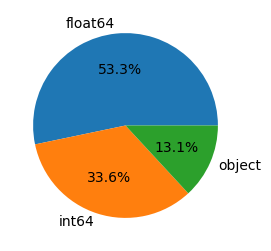

----------------------
Nom du fichier: application_test.csv


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


Dimensions du fichier: (48744, 121)
Types de colonnes


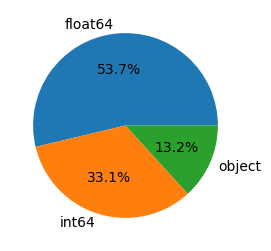

----------------------
Nom du fichier: bureau.csv


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


Dimensions du fichier: (1716428, 17)
Types de colonnes


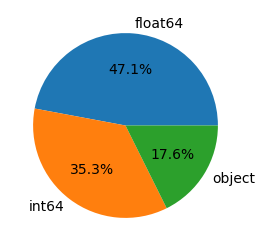

----------------------
Nom du fichier: bureau_balance.csv


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


Dimensions du fichier: (27299925, 3)
Types de colonnes


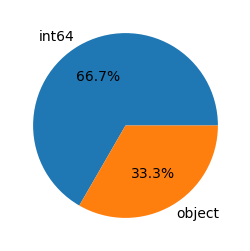

----------------------
Nom du fichier: credit_card_balance.csv


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


Dimensions du fichier: (3840312, 23)
Types de colonnes


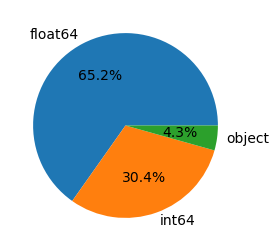

----------------------
Nom du fichier: HomeCredit_columns_description.csv


,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Target variable (1 - client with payment diffi...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN


Dimensions du fichier: (219, 5)
Types de colonnes


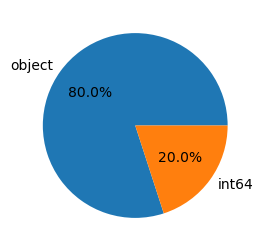

----------------------
Nom du fichier: installments_payments.csv


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


Dimensions du fichier: (13605401, 8)
Types de colonnes


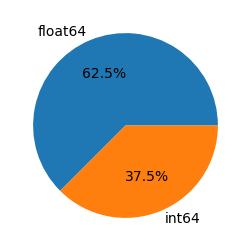

----------------------
Nom du fichier: POS_CASH_balance.csv


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


Dimensions du fichier: (10001358, 8)
Types de colonnes


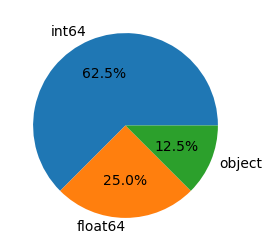

----------------------
Nom du fichier: previous_application.csv


,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


Dimensions du fichier: (1670214, 37)
Types de colonnes


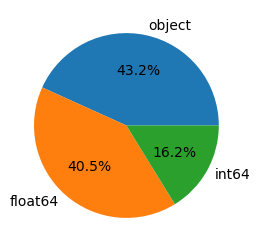

----------------------
Nom du fichier: sample_submission.csv


,SK_ID_CURR,TARGET
0,100001,0.5
1,100005,0.5
2,100013,0.5
3,100028,0.5
4,100038,0.5


Dimensions du fichier: (48744, 2)
Types de colonnes


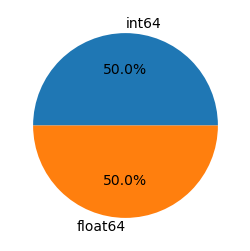

----------------------


In [9]:
# On ouvre chaque fichier et leurs 5 premières lignes

fichiers = ['application_train.csv', 'application_test.csv', 'bureau.csv', 'bureau_balance.csv', 'credit_card_balance.csv', 
           'HomeCredit_columns_description.csv', 'installments_payments.csv', 'POS_CASH_balance.csv',
            'previous_application.csv', 'sample_submission.csv']

for fichier in fichiers:
    try:
        if fichier == 'HomeCredit_columns_description.csv':
            df = pd.read_csv(datas_dir + '/' + fichier, encoding='latin-1')
        else:
            df = pd.read_csv(datas_dir + '/' + fichier)
        
        print('Nom du fichier:', fichier)
        display(df.head())
        print('Dimensions du fichier:', df.shape)
        print('Types de colonnes')
        plt.figure(figsize=(3, 3))
        df.dtypes.value_counts(normalize=True).plot(kind='pie', autopct='%1.1f%%')
        plt.ylabel('')
        plt.show()
        print('----------------------')
    except FileNotFoundError:
        print('Fichier introuvable:', fichier)

In [5]:
# On compte la proportion de données test et de données train
total_col = application_train.shape[0] + application_test.shape[0]
taux_train = application_train.shape[0]*100/total_col

print('La proportion de données d\'entrainements est de :', round(taux_train, 2), '%.')

La proportion de données d'entrainements est de : 86.32 %.


Après une première observation de nos différents fichiers, nous pouvons effectuer une première description: 

- **Fichier HomeCredit_columns_description.csv** : décrit les colonnes des différents fichiers de données. 
- **Fichier application_train.csv** : table principale constituée des données d'entrainement contenant les données statistiques pour toutes les demandes. Le fichier est constitué de 307 511 lignes (chaque ligne représentant un prêt) et de 122 colonnes.  
- **Fichier application_test.csv** : table principale constituée des données de test contenant les données statistiques pour toutes les demandes. Le fichier est constitué de 48 744 lignes (chaque ligne représentant un prêt) et de 121 colonnes. 

La ligne supplémentaire contenue dans le fichier application_train.csv correspond à la target (1 : client avec des difficultés de paiements, 0 : autres cas). Les variables contenues dans ces deux fichiers sont décrites dans le fichier HomeCredit_columns_description.csv et renseignent sur les profils de clients. 

- **Fichier bureau.csv** : crédits antérieurs pour les clients ayant un prêt dans notre échantillon. Le fichier est constitué de 1 716 428 lignes (chaque ligne correspondant à un crédit que le client a au bureau des crédits avant la date de la demande) et de 17 colonnes. 
- **Fichier bureau_balance** : soldes mensuels des crédits précédents au Bureau de crédit. Le fichier est constitué de 27 299 925 lignes (chaque ligne correspondant à chaque mois de chaque crédit précédent déclaré au Bureau de crédit) et de 3 colonnes. 
- **Fichier credit_card_balance.csv** : solde mensuel des cartes de crédits précédentes pour un prêt immobilier. Le fichier constitué de 3 840 312 lignes (chaque ligne correspondant à un mois d'historique de chaque crédit dans le crédit immobilier) et de 23 colonnes. 
- **Fichier installments_payments.csv** : historique de remboursement des crédits. Le fichier est constitué de 13 605 401 (chaque ligne correspondant au paiement d'un virement OU d'un virement d'un paiement pour un crédit immobilier) et de 8 colonnes. 
- **Fichier POS_CASH_balance.csv** : solde mensuel des points de vente précédents et des prêts en espèce avec un crédit immobilier. Le fichier est constitué de 10 001 358 lignes (chaque ligne correspondant à un mois d'historique de chaque crédit dans le crédit immobilier) et de 8 colonnes
- **Fichier previous_application.csv** : demandes précédentes de prêts immobiliers de nos clients. Le fichier est constitué de 1 670 214 lignes (chaque ligne correspondant à une demande) et 37 colonnes
- **Fichier sample_submission.csv** : échantillons. Le fichier est constitué de 48 744 lignes et 2 colonnes contenant des informations sur l'identifiant du prêt de notre échantillon et une target (0.5). 

# 2. Fichier application_train.csv

## 2.1. Analyse exploratoire et nettoyage de la table principale

On utilise le fichier application_train.csv correspondant au jeu de données. 

In [6]:
application = application_train

### 2.1.1. Valeurs manquantes

In [7]:
application.isnull().sum().value_counts()

0         55
41519      6
1021       4
153020     3
204488     3
169682     3
213514     3
154350     3
210199     3
182590     3
208642     3
163891     3
214865     3
154828     3
150007     3
156061     3
179943     3
210295     1
1          1
202929     1
145755     1
156341     1
148431     1
154297     1
96391      1
2          1
173378     1
660        1
60965      1
1292       1
12         1
278        1
dtype: int64

Nous observons 54 colonnes ne contenant pas de valeurs manquantes.
Etant donné le grand nombre de variables, on va utiliser la librairie "missingno" pour visualiser les valeurs manquantes dans notre dataframe. 

In [8]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


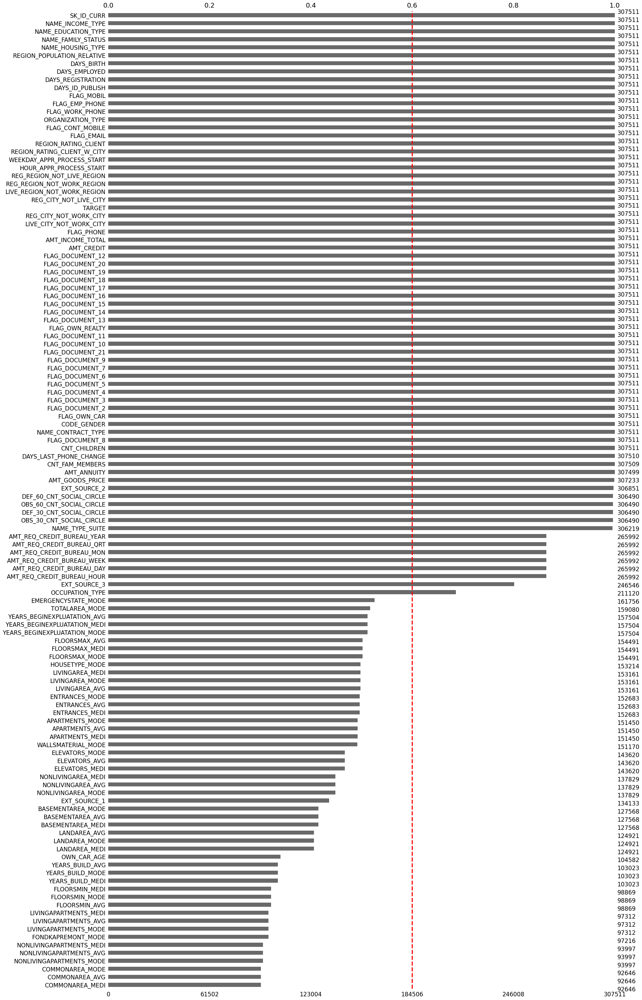

In [9]:
import missingno as msno

# On compte le nombre de valeurs manquantes pour chaque variable
val_manq_count = application.isnull().sum()

# DataFrame contenant le nombre de valeurs manquantes pour chaque variable
val_manq_df = pd.DataFrame({'Variable': val_manq_count.index, 'Missing Values': val_manq_count.values})

# On trie le DataFrame en fonction du nombre de valeurs manquantes, en ordre décroissant
val_manq_sorted = val_manq_df.sort_values(by='Missing Values', ascending=False)

# Calcul du pourcentage de valeurs manquantes par rapport à la taille du DataFrame
pourcentage_manq = (val_manq_sorted['Missing Values'] / len(application_train)) * 100

# Ajout colonne au DataFrame avec les pourcentages de valeurs manquantes
val_manq_sorted['Missing Percentage'] = pourcentage_manq

# Création du graphique en utilisant msno.bar()
msno.bar(application[val_manq_sorted['Variable']])

# Personnalisation de l'axe x
plt.xticks(size = 18)

# Ajout de la ligne verticale
plt.axvline(x=0.6, color='red', linestyle='--', linewidth=3)

# Affichage du graphique
plt.show()

Les données ont été triées de telle sorte que les variables contenant le moins de valeurs manquantes soient affichées en premier dans notre graphique en barres. Le graphique nous affiche le nom des variables sur l'axe des y et le nombre de valeurs présentes pour chaque variable sur l'axe des x (en bas) et le taux correspondant en % (en haut). Sur la droite, on trouve le nombre exact de valeurs non manquantes. 

Nous observons des variables contenant un certain nombre de valeurs manquantes. Nous choisissons de garder uniquement les **variables contenant moins de 40% de valeurs manquantes**. 

In [10]:
# Sélection des variables contenant moins de 40% de valeurs manquantes ou la variable spécifique
variables_40 = val_manq_sorted.loc[val_manq_sorted['Missing Percentage'] <= 40, 'Variable'].tolist()

# Sélection des variables
application_clean = application[variables_40]

In [11]:
# Affichons notre nouveau df et ses dimensions
display(application_clean.head())
print(application_clean.shape)

,OCCUPATION_TYPE,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_TYPE_SUITE,OBS_30_CNT_SOCIAL_CIRCLE,...,DAYS_ID_PUBLISH,DAYS_REGISTRATION,DAYS_EMPLOYED,DAYS_BIRTH,REGION_POPULATION_RELATIVE,NAME_HOUSING_TYPE,NAME_FAMILY_STATUS,NAME_EDUCATION_TYPE,NAME_INCOME_TYPE,SK_ID_CURR
0,Laborers,0.139376,0.0,0.0,0.0,0.0,0.0,1.0,Unaccompanied,2.0,...,-2120,-3648.0,-637,-9461,0.018801,House / apartment,Single / not married,Secondary / secondary special,Working,100002
1,Core staff,NaN,0.0,0.0,0.0,0.0,0.0,0.0,Family,1.0,...,-291,-1186.0,-1188,-16765,0.003541,House / apartment,Married,Higher education,State servant,100003
2,Laborers,0.729567,0.0,0.0,0.0,0.0,0.0,0.0,Unaccompanied,0.0,...,-2531,-4260.0,-225,-19046,0.010032,House / apartment,Single / not married,Secondary / secondary special,Working,100004
3,Laborers,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unaccompanied,2.0,...,-2437,-9833.0,-3039,-19005,0.008019,House / apartment,Civil marriage,Secondary / secondary special,Working,100006
4,Core staff,NaN,0.0,0.0,0.0,0.0,0.0,0.0,Unaccompanied,0.0,...,-3458,-4311.0,-3038,-19932,0.028663,House / apartment,Single / not married,Secondary / secondary special,Working,100007


(307511, 73)


Après ce premier nettoyage, on passe de 123 à 72 variables. 

On va regarder les valeurs des différentes variables. 

### 2.1.2. Valeurs uniques (variables catégorielles + target)

On va vérifier qu'il n'y a pas d'erreur dans nos données. 

In [12]:
# On sélectionne les variables catégorielles
var_categ = application_clean.select_dtypes(include=['object'])
var_categ.columns

Index(['OCCUPATION_TYPE', 'NAME_TYPE_SUITE', 'NAME_CONTRACT_TYPE',
       'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'NAME_HOUSING_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_EDUCATION_TYPE', 'NAME_INCOME_TYPE'],
      dtype='object')

#### a. Identifiant de prêt

In [13]:
# Comptons le nombre de valeurs uniques pour l'identifiant des prêts
print(application_clean['SK_ID_CURR'].nunique(), 'valeurs d\identifiants uniques.')
print('Nombre de ligne (prêts) :', application_clean.shape[0])

307511 valeurs d\identifiants uniques.
Nombre de ligne (prêts) : 307511


Tous les identifiants de prêts sont uniques. 

#### b. Target (train)

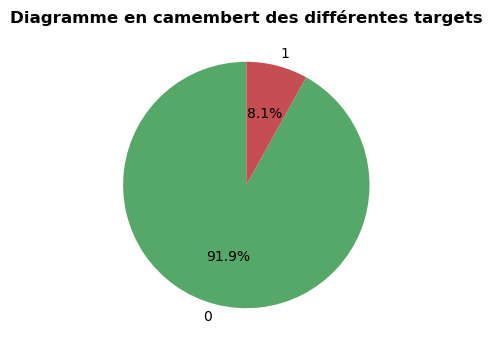

In [14]:
# Compter les valeurs et calculer les pourcentages
value_counts = application_clean['TARGET'].value_counts()
percentages = value_counts / value_counts.sum()

plt.figure(figsize=(4, 4))
colors = ['#55a868', '#c44e52']
pie_chart = percentages.plot(kind='pie', autopct='%1.1f%%', colors=colors, startangle=90)

# Paramètres de personnalisation
plt.title('Diagramme en camembert des différentes targets', size=12, fontweight='bold')
plt.ylabel('')

plt.show()


Dans un premier temps, nous observons un déséquilibre dans les prêts où 8% des clients ont des difficultés de paiement (retards de paiements sur au moins les premières échéances). Ces clients font donc partie d'une minorité. 

In [15]:
# Sélection des données dont la target = 1
target_1 = application_clean[application_clean['TARGET'] == 1]

#### c. Type de prêt

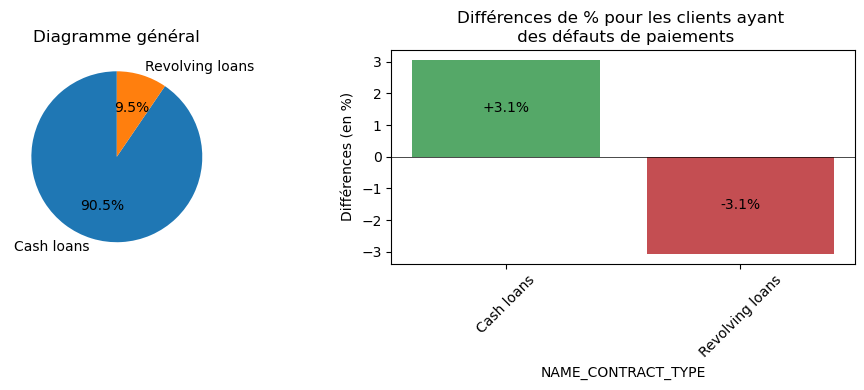

In [16]:
def rep_clients(df_gen, df_target, var):
    # Calcul des proportions dans les données générales
    gen_counts = df_gen[var].value_counts(normalize=True)
    gen_data = gen_counts * 100

    # Calcul des proportions pour target = 1
    target_counts = df_target[var].value_counts(normalize=True)
    target_data = target_counts * 100

    # Calcul des changements de pourcentage
    changes = target_data - gen_data

    # Création du graphique en camembert
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.pie(gen_data, labels=gen_data.index, autopct='%1.1f%%', startangle=90)
    plt.title('Diagramme général')

    # Création du graphique en barres
    plt.subplot(1, 2, 2)
    colors = ['#55a868' if change >= 0 else '#c44e52' for change in changes]
    bars = plt.bar(gen_data.index, changes, color=colors)
    plt.axhline(0, color='black', linewidth=0.5)
    plt.title('Différences de % pour les clients ayant \n des défauts de paiements')
    plt.xlabel(var)
    plt.ylabel('Différences (en %)')
    plt.xticks(rotation=45)

   # Ajout des valeurs au milieu des barres
    for bar in bars:
        height = bar.get_height()
        if height >= 0:
            plt.text(bar.get_x() + bar.get_width() / 2, height / 2, f'+{height:.1f}%', ha='center', va='center')
        else:
            plt.text(bar.get_x() + bar.get_width() / 2, height / 2, f'{height:.1f}%', ha='center', va='center')

    plt.tight_layout()
    plt.show()

# Exemple d'utilisation
rep_clients(application_clean, target_1, 'NAME_CONTRACT_TYPE')


La majorité des clients ont effectué un prêt en numéraire (90.5%) et 9.5% des clients ont effectué un crédit revolving (bien mobilier). Parmi les clients avec des défauts de paiements, nous observons néanmoins 3.1% de plus de clients avec un prêt numéraire. 

#### d. Genre du client

In [17]:
print(application_clean['CODE_GENDER'].nunique(), 'genres identifiés')
print('------------------------')

# Affichons la proportion de ces genres
print(application_clean['CODE_GENDER'].value_counts())
print('------------------------')
print(application_clean['CODE_GENDER'].value_counts().iloc[2],
      'clients du genre', application_clean['CODE_GENDER'].value_counts().index[2])


3 genres identifiés
------------------------
F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64
------------------------
4 clients du genre XNA


In [18]:
# On supprime les 4 demandes de prêts contenant le genre XNA
application_clean = application_clean[application_clean['CODE_GENDER'] != 'XNA']

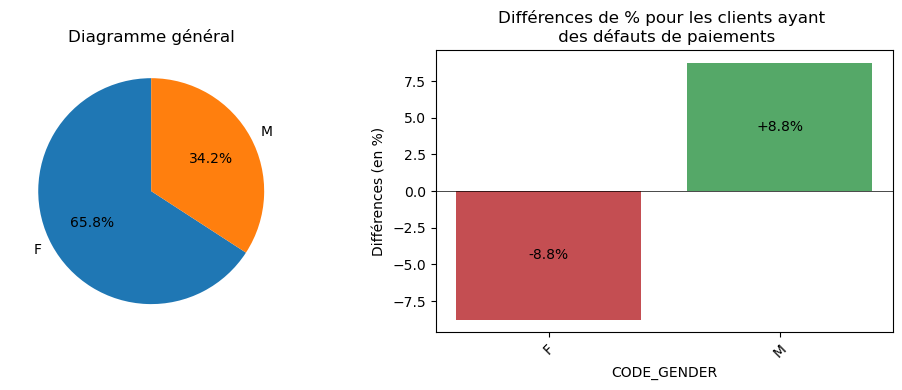

In [19]:
# Affichage diagrammes
rep_clients(application_clean, target_1, 'CODE_GENDER')

On observe 65.8% des demandes de prêts provenant de femmes et 34.4% sont des hommes. Mais si on s'attarde sur les clients avec des défauts de paiements, on observe une part légèrement plus élevée de clients de sexe masculin (+ 8.8%) par rapport aux clients généraux. 

#### e. Client disposant d'une voiture et/ou logement

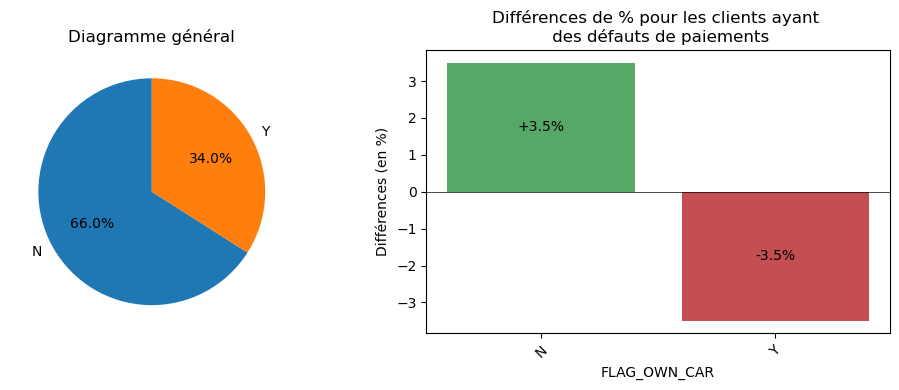

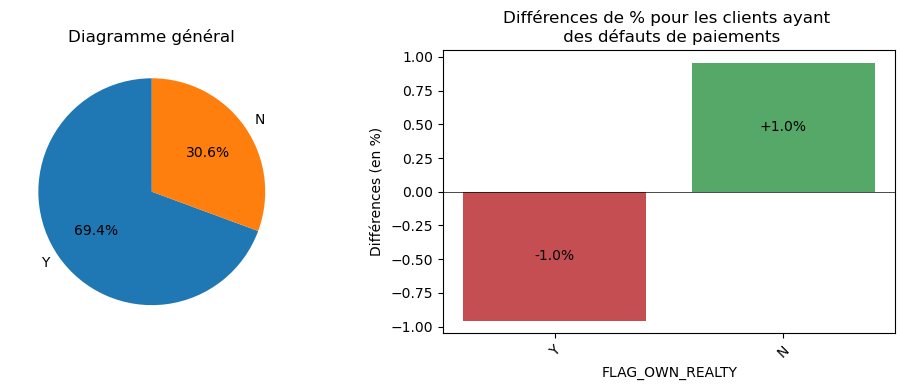

In [20]:
# On affiche la proportion des clients ayant une voiture ou non
rep_clients(application_clean, target_1, 'FLAG_OWN_CAR')

# On affiche la proportion de clients propriétaires d'une maison ou non
rep_clients(application_clean, target_1, 'FLAG_OWN_REALTY')

La majorité des clients ne possèdent pas de voiture (66%), mais la majorité des clients possèdent un logement (69.4%). Concernant les clients ayant des défauts de paiements, dans les deux cas nous observons une part de clients un peu plus importante n'ayant ni voiture, ni logement. 

#### f. Accompagnant du client au moment de la demande de prêt

In [21]:
# On crée une fonction pour transformer les valeurs d'un array en %
def convert_pourcent(arr):
    total_sum = sum(arr)
    percentage_arr = []
    for value in arr:
        percentage = round((value / total_sum) * 100, 2)
        percentage_arr.append(percentage)
    return percentage_arr

In [22]:
# On stocke dans des variables les valeurs et labels que l'on souhaite afficher
labels = application_clean['NAME_TYPE_SUITE'].value_counts().index
values = application_clean['NAME_TYPE_SUITE'].value_counts()

val = convert_pourcent(values)

In [23]:
print(application_clean['NAME_TYPE_SUITE'].nunique(), 'types de personnes identifiées')

7 types de personnes identifiées


In [24]:
import matplotlib.cm as cm

def plot_categorical_variables_pie(data, target_data, column_name, title=''):
    
    # Calcul propotions dans les données générales
    gen_counts = data[column_name].value_counts(normalize=True)
    gen_data = round(gen_counts * 100, 2)
    
    # Calcul proportions pour les clients ayant des défauts de paiements
    target_counts = target_data[column_name].value_counts(normalize=True)
    target_data = target_counts * 100

    # On réindexe avec les données générales
    target_data = target_data.reindex(gen_data.index, fill_value=0)
    
    # Calcul différence entre les données des clients ayant des défauts de paiements
    # avec les données générales
    changes = target_data - gen_data

    # Paramètres du camembert
    cmap = cm.get_cmap('Paired')
    colors = [cmap(i) for i in range(len(gen_data.index))]

    fig, ax = plt.subplots(1, 2, figsize=(12, 6))

    # Diagramme en camembert
    patches, _, _ = ax[0].pie(gen_data, labels=None, autopct='', colors=colors, wedgeprops={'linewidth': 3.0, 'edgecolor': 'white'}, startangle=90)
    ax[0].set_title('Diagramme général')

    # Légende
    legend_labels = [f"{label}: {size}%" for label, size in zip(gen_data.index, gen_data)]
    ax[0].legend(patches, legend_labels, loc='best', bbox_to_anchor=(1, 0.5), title='% d\'accompagnants')
    
    # Graphique en barres
    colors = ['#c44e52' if change < 0 else '#55a868' for change in changes]
    bars = ax[1].bar(gen_data.index, changes, color=colors)
    ax[1].axhline(0, color='black', linewidth=0.5)
    ax[1].set_title('Différences de % pour les clients ayant des défauts de paiements')
    ax[1].set_xlabel(column_name)
    ax[1].set_ylabel('Différences (en %)')
    ax[1].tick_params(axis='x', rotation=45)
    # Ajout des valeurs au milieu des barres
    for bar in bars:
        height = bar.get_height()
        if height >= 0:
            ax[1].text(bar.get_x() + bar.get_width() / 2, height / 2, f'+{height:.1f}%', ha='center', va='center')
        else:
            ax[1].text(bar.get_x() + bar.get_width() / 2, height / 2, f'{height:.1f}%', ha='center', va='center')

    plt.tight_layout()
    plt.show()

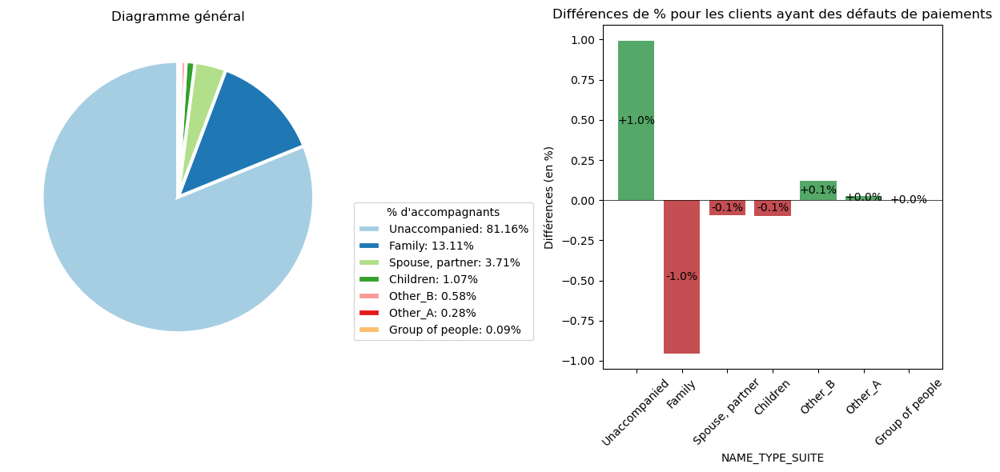

In [25]:
# Afficher le diagramme et comparatif avec clients en défauts de paiements
plot_categorical_variables_pie(application_clean, target_1, 'NAME_TYPE_SUITE', title='Diagramme général')

La majorité des clients demandeurs de prêts ne sont pas accompagnés (81%). En regardant les clients ayant des défauts de paiement, on observe légèrement plus de clients non accompagnés (+1%)

#### g. Type de revenu du client, leur profession et le type d'organisation

In [26]:
print(application_clean['NAME_INCOME_TYPE'].nunique(), 'types de revenus identifiés')
print(target_1['NAME_INCOME_TYPE'].nunique(), 'types de revenus identifiés')

8 types de revenus identifiés
6 types de revenus identifiés


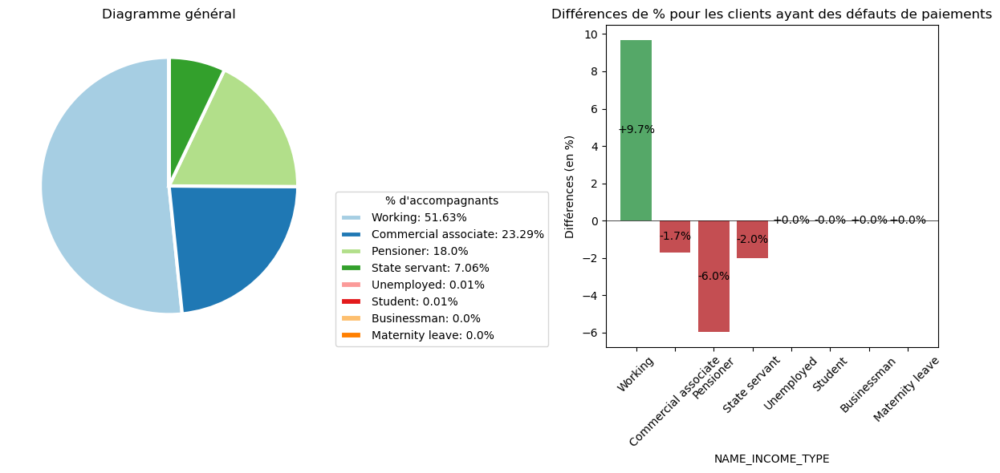

In [27]:
# Afficher le diagramme et comparatif avec clients en défauts de paiements
plot_categorical_variables_pie(application_clean, target_1, 'NAME_INCOME_TYPE', title='Diagramme général')

In [28]:
# Valeurs uniques dans la colonne 'NAME_INCOME_TYPE' de application_clean et target_1
unique_values_application = set(application_clean['NAME_INCOME_TYPE'].unique())
unique_values_target = set(target_1['NAME_INCOME_TYPE'].unique())

# Valeurs uniques présentes dans application_clean mais pas dans target_1
values_missing_in_target = unique_values_application - unique_values_target
print('Valeurs manquantes dans target_1 :', values_missing_in_target)

Valeurs manquantes dans target_1 : {'Businessman', 'Student'}


La majorité des clients sont des salariés (51.6%). Nous observons également que parmis les clients ayant des défauts de paiements, nous trouvons plus de salariés par rapport aux données générales (+9.7%) et moins de retraités (-6.0%). De plus, 2 types de revenus ont disparu : Businessman et Student. Cela laisse penser que les étudiants et personnes d'affaires ont moins tendance à avoir des défauts de paiement. 

In [29]:
print(application_clean['OCCUPATION_TYPE'].nunique(), 'types de professions identifiés')

18 types de professions identifiés


In [30]:
def plot_categorical_variables_bar(data, target_data, column_name, title=''):
    
    # Calcul propotions dans les données générales
    gen_counts = data[column_name].value_counts(normalize=True)
    gen_data = round(gen_counts * 100, 2)
    
    # Calcul proportions pour les clients ayant des défauts de paiements
    target_counts = target_data[column_name].value_counts(normalize=True)
    target_data = target_counts * 100

    # On réindexe avec les données générales
    target_data = target_data.reindex(gen_data.index, fill_value=0)
    
    # Calcul différence entre les données des clients ayant des défauts de paiements
    # avec les données générales
    changes = target_data - gen_data

    fig, ax = plt.subplots(1, 2, figsize=(13, 5))

   # Premier graphique
    # On crée un df calculant le % de professions rencontrées pour chaque client
    nb = pd.DataFrame(data[column_name].value_counts())
    nb['Percent'] = round(nb[column_name]*100/nb[column_name].sum(), 2)

    sns.barplot(data=nb, x="Percent", y=nb.index, ci=None, dodge=False, ax=ax[0])
    ax[0].set_title(title, size=13)
    for i in ax[0].containers:
        ax[0].bar_label(i,)

    # Graphique en barres
    colors = ['#c44e52' if change < 0 else '#55a868' for change in changes]
    bars = ax[1].bar(gen_data.index, changes, color=colors)
    ax[1].axhline(0, color='black', linewidth=0.5)
    ax[1].set_title('Différences de % pour les clients ayant des défauts de paiements')
    ax[1].set_xlabel(column_name)
    ax[1].set_ylabel('Différences (en %)')
    ax[1].tick_params(axis='x', rotation=45)
    # Ajout des valeurs au milieu des barres
    for bar in bars:
        height = bar.get_height()
        if height >= 0:
            ax[1].text(bar.get_x() + bar.get_width() / 2, height / 2, f'+{height:.1f}%', ha='center', va='center')
        else:
            ax[1].text(bar.get_x() + bar.get_width() / 2, height / 2, f'{height:.1f}%', ha='center', va='center')

    plt.tight_layout()
    plt.show()

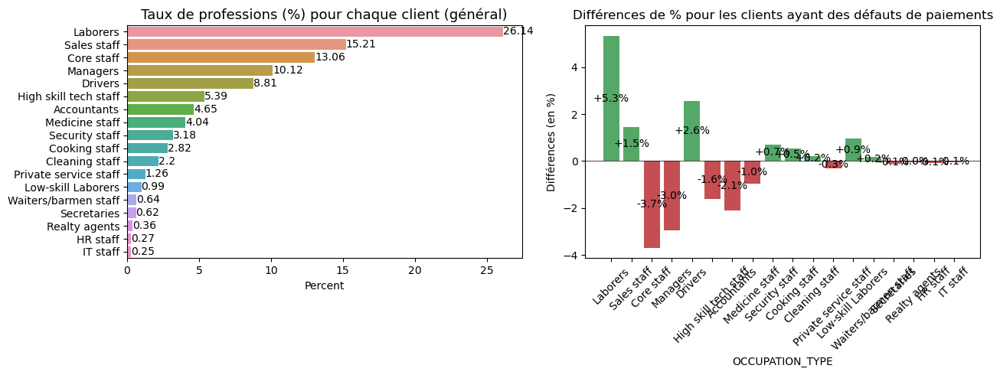

In [31]:
# Afficher le diagramme et comparatif avec clients en défauts de paiements
plot_categorical_variables_bar(application_clean, target_1, 'OCCUPATION_TYPE', title='Taux de professions (%) pour chaque client (général)')

Nous observons dans un premier temps que la majorité des clients (26%) sont des ouvriers. Néanmoins, quand on regarde les clients ayant des défauts de paiements, on observe une plus grande part d'ouvrier (+5.3%), mais également une part plus élevées de conducteurs (+2.6%) et de personnel de vente (+1.5%). A l'inverse, on observe moins de Core staff (-3.7%), de managers (-3%). 

In [32]:
print(application_clean['ORGANIZATION_TYPE'].nunique(), 'types d\'organisations identifiées')

58 types d'organisations identifiées


In [33]:
# On crée un df calculant le % de professions rencontrées pour chaque client
nb_org = pd.DataFrame(application_clean['ORGANIZATION_TYPE'].value_counts())
nb_org['Percent_org'] = round(nb_org['ORGANIZATION_TYPE']*100/nb_org['ORGANIZATION_TYPE'].sum(), 2)

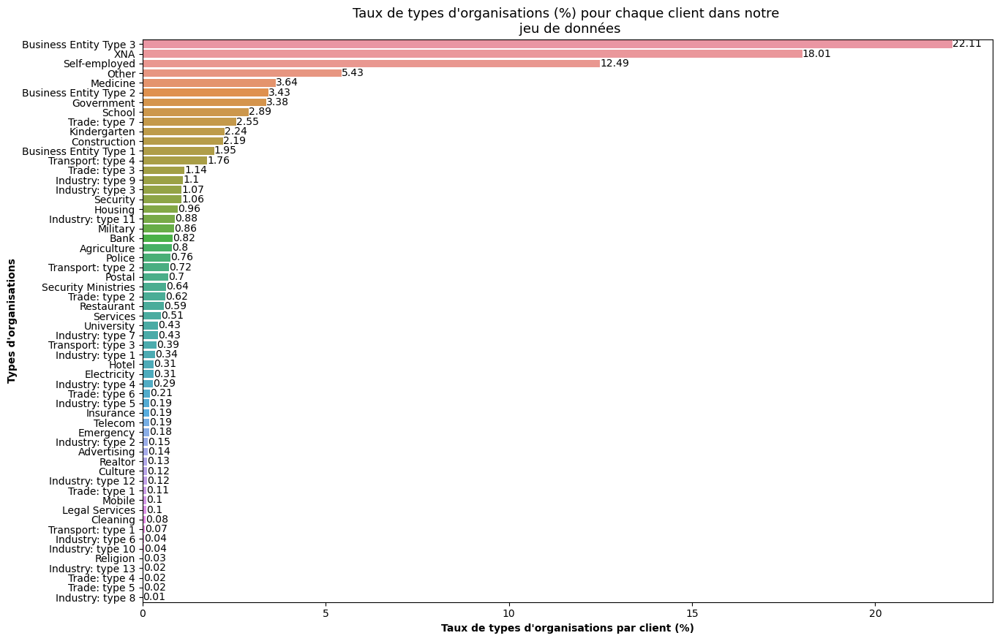

In [34]:
# On crée un barplot affichant le % de professions
# pour chaque client
plt.figure(figsize=(15, 10))

ax = sns.barplot(data=nb_org, x="Percent_org", y=nb_org.index, ci=None, dodge=False)

plt.xlabel('Taux de types d\'organisations par client (%)', size=10, fontweight='bold')
plt.ylabel('Types d\'organisations', size=10, fontweight='bold')
plt.title('Taux de types d\'organisations (%) pour chaque client'
          ' dans notre \n jeu de données', size=13)

plt.yticks(size=10)
plt.xticks(size=10)

for i in ax.containers:
    ax.bar_label(i,)

plt.show()

On observe un grand nombre de types d'organisations et notamment des catégories de différents types (Business Entity, Trade, Transport, Industry). On va les englober dans leur catégorie globale pour diminuer le nombre de variables.

In [35]:
categ_remplacer = {'Business Entity Type 3' : 'Business Entity',
'Business Entity Type 2' : 'Business Entity',
'Business Entity Type 1' : 'Business Entity',
'Transport: type 2' : 'Transport',
'Transport: type 4' : 'Transport',
'Transport: type 3' : 'Transport',
'Transport: type 1' : 'Transport',
'Industry: type 11' : 'Industry',
'Industry: type 1' : 'Industry',
'Industry: type 4' : 'Industry',
'Industry: type 7' : 'Industry',
'Industry: type 3' : 'Industry',
'Industry: type 9' : 'Industry',
'Industry: type 2' : 'Industry',
'Industry: type 12' : 'Industry',
'Industry: type 5' : 'Industry',
'Industry: type 10' : 'Industry',
'Industry: type 13' : 'Industry',
'Industry: type 8' : 'Industry',
'Industry: type 6' : 'Industry',
'Trade: type 7' : 'Trade',
'Trade: type 2' : 'Trade',
'Trade: type 3' : 'Trade',
'Trade: type 6' : 'Trade',
'Trade: type 1' : 'Trade',
'Trade: type 5' : 'Trade',
'Trade: type 4' : 'Trade'}

In [36]:
application_clean['ORGANIZATION_TYPE'] = application_clean['ORGANIZATION_TYPE'].replace(categ_remplacer)
target_1['ORGANIZATION_TYPE'] = target_1['ORGANIZATION_TYPE'].replace(categ_remplacer)

35 types d'organisations identifiées


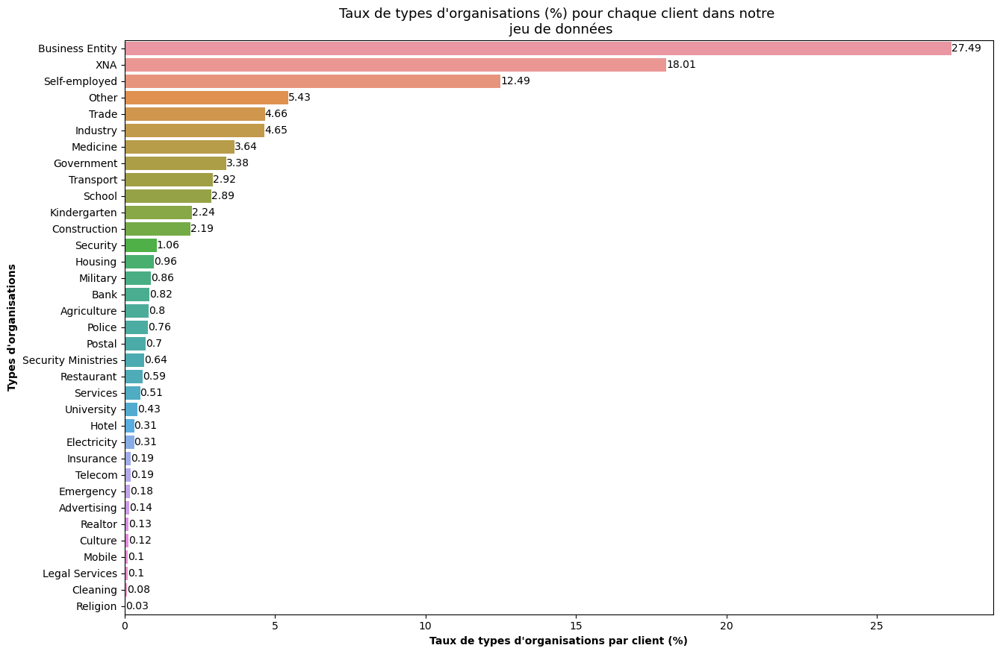

In [37]:
print(application_clean['ORGANIZATION_TYPE'].nunique(), 'types d\'organisations identifiées')

# On crée un df calculant le % de professions rencontrées pour chaque client
nb_org = pd.DataFrame(application_clean['ORGANIZATION_TYPE'].value_counts())
nb_org['Percent_org'] = round(nb_org['ORGANIZATION_TYPE']*100/nb_org['ORGANIZATION_TYPE'].sum(), 2)

# On crée un barplot affichant le % de professions
# pour chaque client
plt.figure(figsize=(15, 10))

ax = sns.barplot(data=nb_org, x="Percent_org", y=nb_org.index, ci=None, dodge=False)

plt.xlabel('Taux de types d\'organisations par client (%)', size=10, fontweight='bold')
plt.ylabel('Types d\'organisations', size=10, fontweight='bold')
plt.title('Taux de types d\'organisations (%) pour chaque client'
          ' dans notre \n jeu de données', size=13)

plt.yticks(size=10)
plt.xticks(size=10)

for i in ax.containers:
    ax.bar_label(i,)

plt.show()

On observe à nouveau une catégorie de type XNA, on va la transformer en lui attribuant la valeur "Unknown". 

In [38]:
application_clean['ORGANIZATION_TYPE'] = application_clean['ORGANIZATION_TYPE'].replace('XNA', 'Unknown')

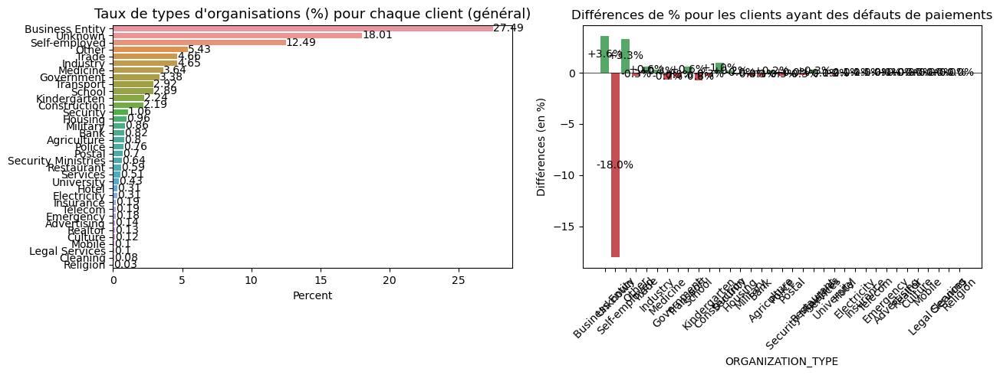

In [39]:
# Afficher le diagramme et comparatif avec clients en défauts de paiements
plot_categorical_variables_bar(application_clean, target_1, 'ORGANIZATION_TYPE', title='Taux de types d\'organisations (%) pour chaque client (général)')

Nous observons que la majorité des clients ont une entité commerciale (27.43%) et d'autant plus pour les clients ayant des défauts de paiements (+3.6%). Nous observons aussi une plus grande part de clients indépendants (+3.3%) et -18% de clients dont on ne connait pas le type d'organisation. 

#### h. Niveau scolaire du client

5 différents niveaux scolaires identifiés


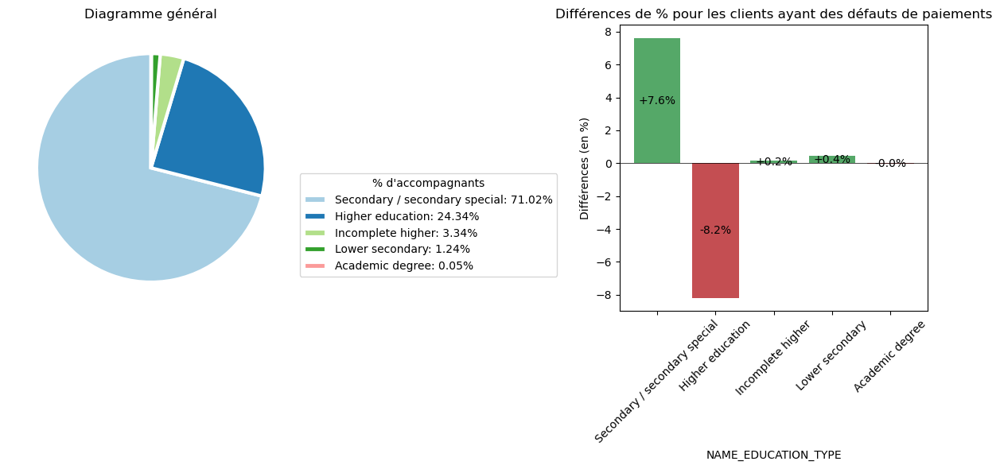

In [40]:
print(application_clean['NAME_EDUCATION_TYPE'].nunique(), 'différents niveaux scolaires identifiés')

# Afficher le diagramme et comparatif avec clients en défauts de paiements
plot_categorical_variables_pie(application_clean, target_1, 'NAME_EDUCATION_TYPE', title='Diagramme général')

La majorité des clients ont un niveau de scolarité de type Lycée/Secondaire (71%). Nous observons +7.6% de clients de type Lycée/Secondaire pour les clients ayant des défauts de paiement, mais moins de clients provenant de l'enseignement supérieur (-8.2%).

#### i. Statut familial du client

6 différents niveaux scolaires identifiés


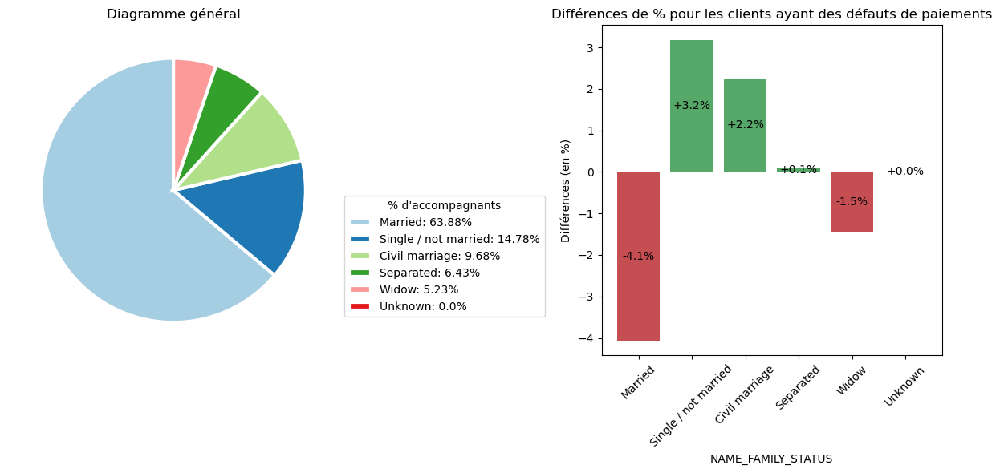

In [41]:
print(application_clean['NAME_FAMILY_STATUS'].nunique(), 'différents niveaux scolaires identifiés')

# Afficher le diagramme et comparatif avec clients en défauts de paiements
plot_categorical_variables_pie(application_clean, target_1, 'NAME_FAMILY_STATUS', title='Diagramme général')

Nous observons 2 catégories que nous pouvons rassembler en une : "Married" et "Civil marriage".

In [42]:
# Fusion de "Civil marriage" et "Married"
application_clean['NAME_FAMILY_STATUS'] = application_clean['NAME_FAMILY_STATUS'].replace({'Civil marriage':'Married'})
target_1['NAME_FAMILY_STATUS'] = target_1['NAME_FAMILY_STATUS'].replace({'Civil marriage':'Married'})

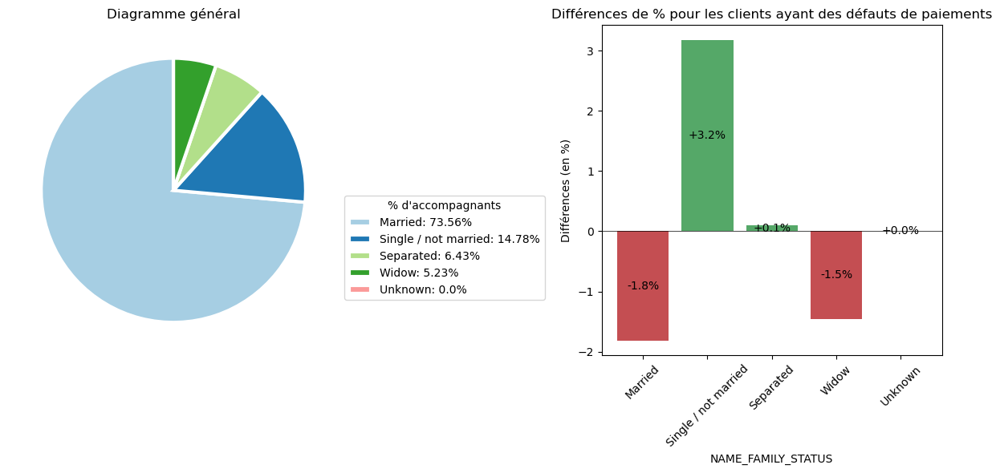

In [43]:
# Afficher le diagramme et comparatif avec clients en défauts de paiements
plot_categorical_variables_pie(application_clean, target_1, 'NAME_FAMILY_STATUS', title='Diagramme général')

Nous observons donc que la majorité des clients sont mariés (73%). Néanmoins, pour les clients ayant des défauts de paiements, -1.8% de clients sont mariés et +3.2% de clients sont célibataires ou non mariés. 

#### j. Situation de logement 

6 situations différents de logement identifiées


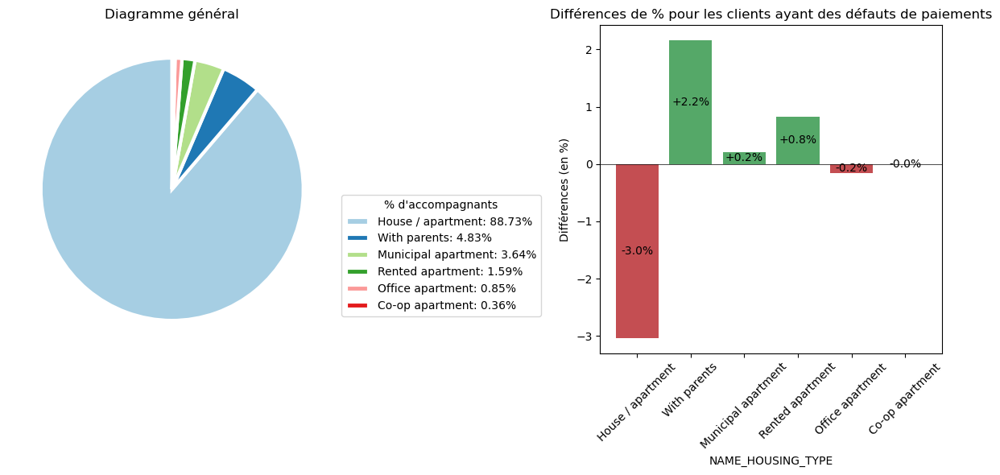

In [44]:
print(application_clean['NAME_HOUSING_TYPE'].nunique(), 'situations différents de logement identifiées')

# Afficher le diagramme et comparatif avec clients en défauts de paiements
plot_categorical_variables_pie(application_clean, target_1, 'NAME_HOUSING_TYPE', title='Diagramme général')

La majorité des clients vivent en maison ou appartement (88%) et parmis les clients ayant des défauts de paiements, +2.2% vivent chez leurs parents et -3% vivent en maison ou appartement. 

#### k. Jour de la semaine où le client effectue la demande de prêt

7 jours différents identifiées


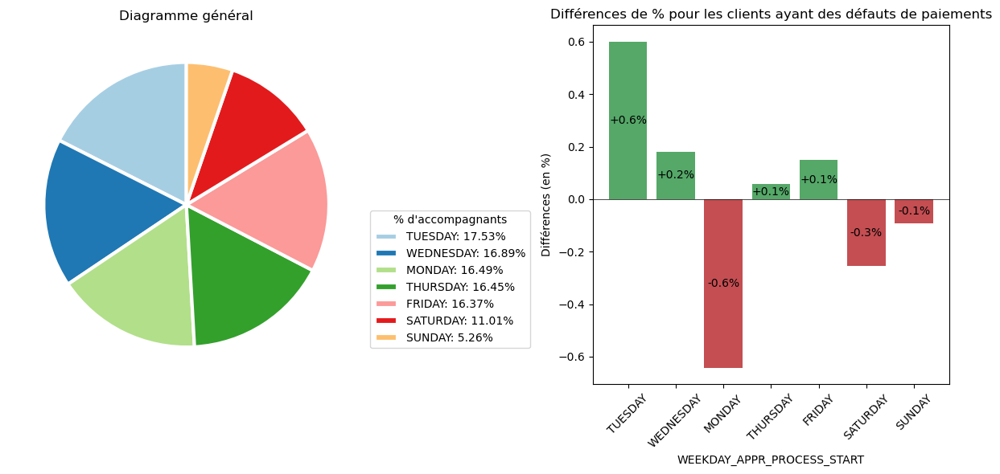

In [45]:
print(application_clean['WEEKDAY_APPR_PROCESS_START'].nunique(), 'jours différents identifiées')

# Afficher le diagramme et comparatif avec clients en défauts de paiements
plot_categorical_variables_pie(application_clean, target_1, 'WEEKDAY_APPR_PROCESS_START', title='Diagramme général')

#### l. Document 2 à 21

Ces documents n'ont pas été considérés comme des variables catégorielles, pourtant elles renseignent si le client a fourni le document concerné. On va donc transformer ces variables en variables catégorielles.

In [46]:
# On veut qu'elles soient considérées comme des variables catégorielles

FLAG_DOCUMENTS = ['FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6',
                  'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11',
                  'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16',
                  'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21']
for i in FLAG_DOCUMENTS:
    application_clean[i] = application_clean[i].astype('object')

La valeur de 0 indiquerait que le client a fourni le document contre 1 n'ayant pas fourni le document.  

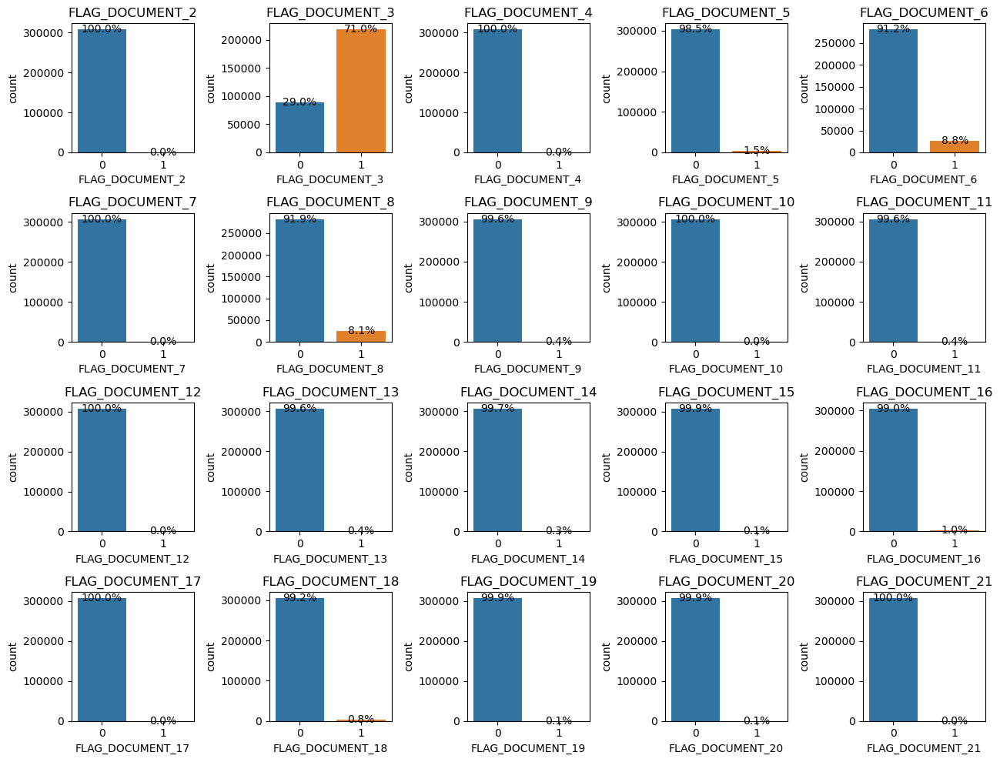

In [47]:
fig, axes = plt.subplots(4, 5, figsize=(13, 10))

# Aplatir le tableau d'axes
axes = axes.flatten()

# Parcourir les axes et afficher les graphiques en barres avec les pourcentages
for i, ax in enumerate(axes):
    if i < len(FLAG_DOCUMENTS):
        variable = FLAG_DOCUMENTS[i]

        sns.countplot(data=application_clean, x=variable, ax=ax, palette=['#1f77b4', '#ff7f0e'])

        # Calcul pourcentages
        total = len(application_clean[variable])
        for p in ax.patches:
            percentage = '{:.1f}%'.format(100 * p.get_height() / total)
            x = p.get_x() + p.get_width() / 2
            y = p.get_height()
            ax.annotate(percentage, (x, y), ha='center', va='center')

        ax.set_title(variable)

# Ajuster les espacements entre les sous-graphiques
plt.tight_layout()

# Afficher la figure
plt.show()

### 2.1.3. Analyse des variables numériques

In [48]:
# On sélectionne les variables numériques
var_num = application_clean.select_dtypes(include=['float64', 'int'])
var_num.columns

Index(['EXT_SOURCE_3', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR', 'OBS_30_CNT_SOCIAL_CIRCLE',
       'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'EXT_SOURCE_2', 'AMT_GOODS_PRICE',
       'AMT_ANNUITY', 'CNT_FAM_MEMBERS', 'DAYS_LAST_PHONE_CHANGE',
       'CNT_CHILDREN', 'AMT_CREDIT', 'AMT_INCOME_TOTAL', 'FLAG_PHONE',
       'LIVE_CITY_NOT_WORK_CITY', 'REG_CITY_NOT_WORK_CITY', 'TARGET',
       'REG_CITY_NOT_LIVE_CITY', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_REGION_NOT_WORK_REGION', 'REG_REGION_NOT_LIVE_REGION',
       'HOUR_APPR_PROCESS_START', 'REGION_RATING_CLIENT_W_CITY',
       'REGION_RATING_CLIENT', 'FLAG_EMAIL', 'FLAG_CONT_MOBILE',
       'FLAG_WORK_PHONE', 'FLAG_EMP_PHONE', 'FLAG_MOBIL', 'DAYS_ID_PUBLISH',
       'DAYS_REGISTRATION', 'DAYS_EMPLOYED', 'DAYS_BIRTH',
       'REGIO

#### a. Famille

<Axes: >

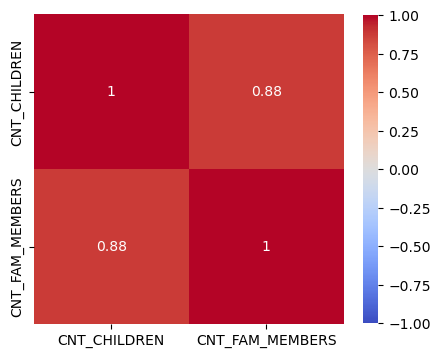

In [49]:
# On va effectuer une analyse de corrélations entre nos variables concernant les membres de la famille
fig, ax = plt.subplots(figsize=(5, 5))
sns.heatmap(application_clean[['CNT_CHILDREN', 'CNT_FAM_MEMBERS']].corr(), annot = True, square=True, vmin=-1, vmax=+1,
            cmap=plt.cm.coolwarm, cbar_kws={"shrink": 0.8})

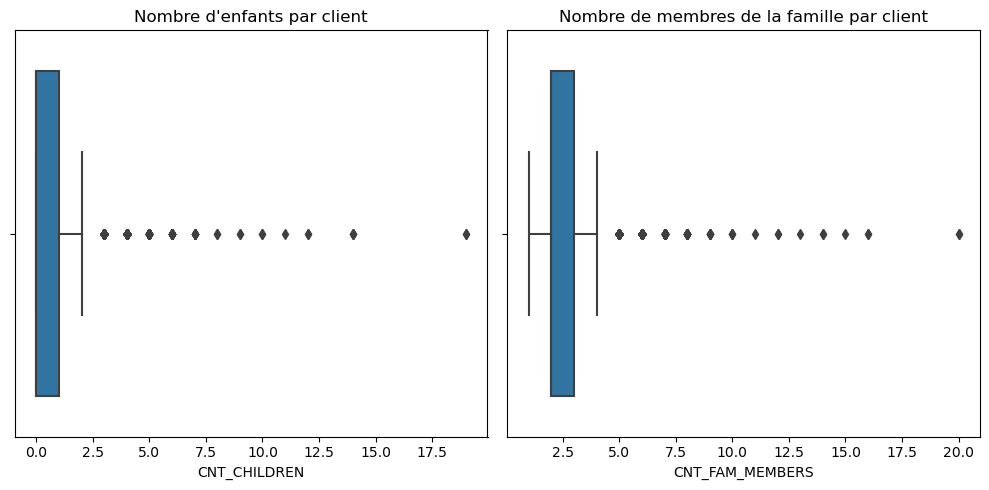

In [50]:
# Observons comment se comportent les données
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Premier boxplot
sns.boxplot(x=application_clean['CNT_CHILDREN'], ax=axes[0])
axes[0].set_title('Nombre d\'enfants par client')

# Deuxième boxplot
sns.boxplot(x=application_clean['CNT_FAM_MEMBERS'], ax=axes[1])
axes[1].set_title('Nombre de membres de la famille par client')

plt.tight_layout()  # Pour éviter le chevauchement

# Afficher la figure
plt.show()

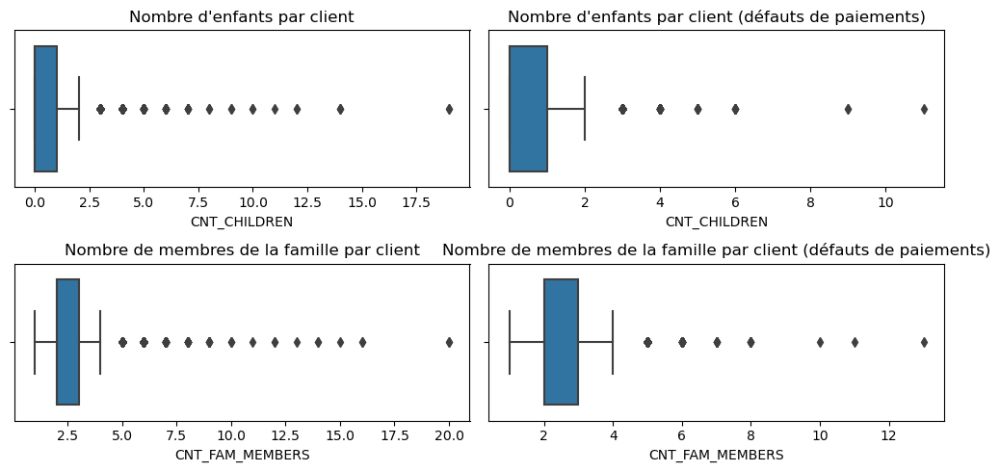

In [51]:
# Comparaison avec les clients ayant des défauts de paiements
fig, axes = plt.subplots(2, 2, figsize=(10, 5))

# Enfants
sns.boxplot(x=application_clean['CNT_CHILDREN'], ax=axes[0, 0])
axes[0, 0].set_title('Nombre d\'enfants par client')

sns.boxplot(x=target_1['CNT_CHILDREN'], ax=axes[0, 1])
axes[0, 1].set_title('Nombre d\'enfants par client (défauts de paiements)')


# Famille
sns.boxplot(x=application_clean['CNT_FAM_MEMBERS'], ax=axes[1, 0])
axes[1, 0].set_title('Nombre de membres de la famille par client')

sns.boxplot(x=target_1['CNT_FAM_MEMBERS'], ax=axes[1, 1])
axes[1, 1].set_title('Nombre de membres de la famille par client (défauts de paiements)')

plt.tight_layout()  # Pour éviter le chevauchement

# Afficher la figure
plt.show()

Logiquement, la valeur de la variable "CNT_CHILDREN" < "CNT_FAM_MEMBERS". On va vérifier s'il existe des clients pour lesquels nous n'observons pas ce phénomène. 

In [52]:
# Vérifions que "CNT_CHILDREN" < "CNT_FAM_MEMBERS" pour chaque client
print(application_clean.loc[application_clean['CNT_CHILDREN'] >= application_clean['CNT_FAM_MEMBERS'], :].shape[0],
      'clients contenant des erreurs.')

0 clients contenant des erreurs.


In [53]:
# Affichons les valeurs les plus élevées concernant le nombre d'enfants
many_child = application_clean[['CNT_CHILDREN', 'CNT_FAM_MEMBERS', 'SK_ID_CURR', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE']].sort_values(by = 'CNT_CHILDREN', ascending = False).head(20)
many_child

,CNT_CHILDREN,CNT_FAM_MEMBERS,SK_ID_CURR,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE
265784,19,20.0,407877,Single / not married,House / apartment
155369,19,20.0,280108,Single / not married,House / apartment
183878,14,16.0,313127,Married,House / apartment
267998,14,16.0,410527,Married,House / apartment
176011,14,15.0,303956,Separated,House / apartment
171125,12,14.0,298322,Married,House / apartment
80948,12,14.0,193853,Married,House / apartment
34545,11,13.0,140032,Married,House / apartment
186820,10,12.0,316580,Married,House / apartment
132585,10,12.0,253779,Married,House / apartment


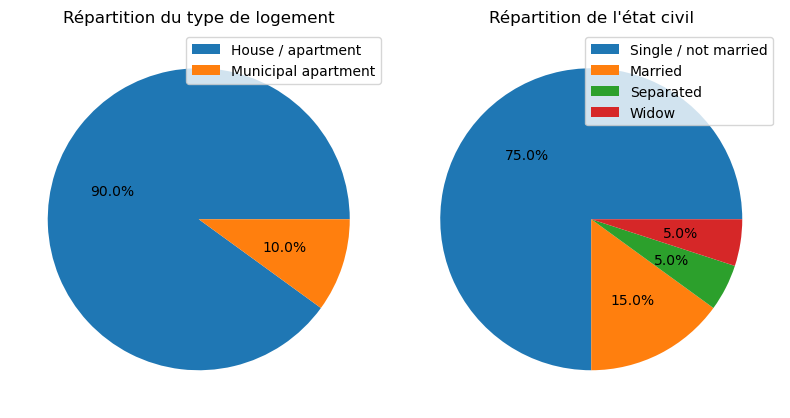

In [54]:
fig, axes = plt.subplots(1, 2, figsize=(8, 5))  # Création de la figure avec deux axes adjacents

# Premier graphique
pie1 = axes[0].pie(many_child['NAME_HOUSING_TYPE'].value_counts(normalize=True), autopct='%1.1f%%')
axes[0].set_ylabel('')
axes[0].set_title('Répartition du type de logement')
axes[0].legend(pie1[0], labels=many_child['NAME_HOUSING_TYPE'].unique(), loc='upper right')

# Deuxième graphique
pie2 = axes[1].pie(many_child['NAME_FAMILY_STATUS'].value_counts(normalize=True), autopct='%1.1f%%')
axes[1].set_ylabel('')
axes[1].set_title('Répartition de l\'état civil')
axes[1].legend(pie2[0], labels=many_child['NAME_FAMILY_STATUS'].unique(), loc='upper right')

plt.tight_layout()  # Ajuster automatiquement les espacements entre les graphiques

# Afficher la figure
plt.show()

Parmi les clients aillant de nombreux enfants, on observe que 90% d'entre eux vivent dans une maison ou appartement, mais également que 65% d'entre eux sont séparés et 80% vivent seuls. 

#### b. Revenu du client

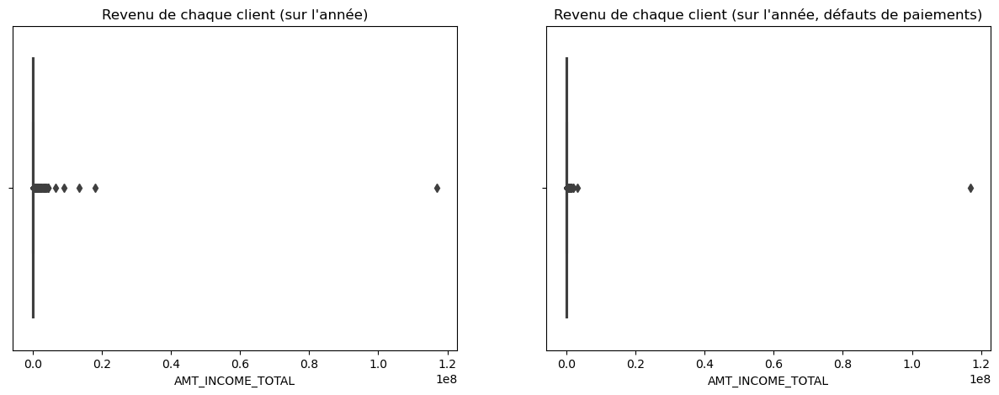

In [55]:
# Comparaison avec les clients ayant des défauts de paiements
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

sns.boxplot(x=application_clean['AMT_INCOME_TOTAL'], ax=axes[0])
axes[0].set_title('Revenu de chaque client (sur l\'année)')

sns.boxplot(x=target_1['AMT_INCOME_TOTAL'], ax=axes[1])
axes[1].set_title('Revenu de chaque client (sur l\'année, défauts de paiements)')

plt.show()

Nous observons des outliers, plus particulièrement sur un client dont le revenu semble extrêmement élevé par rapport aux autres clients. Ce clients fait partie de ceux ayant des défauts de paiements (étonnant). Nous allons l'afficher afin d'observer le reste de ses caractéristiques. 

In [56]:
# Affichons le client dont le revenu est le plus élevé
pd.set_option('display.max_columns', None)
high_income = application_clean.sort_values(by='AMT_INCOME_TOTAL', ascending=False).head(1)
high_income

,OCCUPATION_TYPE,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_TYPE_SUITE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,EXT_SOURCE_2,AMT_GOODS_PRICE,AMT_ANNUITY,CNT_FAM_MEMBERS,DAYS_LAST_PHONE_CHANGE,CNT_CHILDREN,FLAG_DOCUMENT_8,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_9,FLAG_DOCUMENT_21,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_OWN_REALTY,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_12,AMT_CREDIT,AMT_INCOME_TOTAL,FLAG_PHONE,LIVE_CITY_NOT_WORK_CITY,REG_CITY_NOT_WORK_CITY,TARGET,REG_CITY_NOT_LIVE_CITY,LIVE_REGION_NOT_WORK_REGION,REG_REGION_NOT_WORK_REGION,REG_REGION_NOT_LIVE_REGION,HOUR_APPR_PROCESS_START,WEEKDAY_APPR_PROCESS_START,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,FLAG_EMAIL,FLAG_CONT_MOBILE,ORGANIZATION_TYPE,FLAG_WORK_PHONE,FLAG_EMP_PHONE,FLAG_MOBIL,DAYS_ID_PUBLISH,DAYS_REGISTRATION,DAYS_EMPLOYED,DAYS_BIRTH,REGION_POPULATION_RELATIVE,NAME_HOUSING_TYPE,NAME_FAMILY_STATUS,NAME_EDUCATION_TYPE,NAME_INCOME_TYPE,SK_ID_CURR
12840,Laborers,0.145543,0.0,0.0,0.0,0.0,0.0,1.0,Unaccompanied,0.0,0.0,0.0,0.0,0.113161,454500.0,26194.5,3.0,0.0,1,0,Cash loans,F,N,0,1,0,0,0,0,0,0,0,0,Y,0,0,0,0,0,0,0,0,0,562491.0,117000000.0,0,0,0,1,0,0,0,0,14,TUESDAY,2,2,0,1,Business Entity,0,1,1,-3643,-6762.0,-922,-12615,0.010643,House / apartment,Married,Secondary / secondary special,Working,114967


In [57]:
# Regardons le temps qu'elle mettra à rembourser son crédit
print((high_income['AMT_CREDIT']/high_income['AMT_ANNUITY']).values, 'ans pour rembourser la totalité du crédit.')

[21.47362996] ans pour rembourser la totalité du crédit.


En observant de plus près le cas de cette cliente, nous observons un revenu annuel de 117 millions de dollars, ce qui paraît être un revenu extrêmement élevé. De plus, nous observons que cette cliente a un revenu de salariée. En plus de cela, elle a effectué un crédit de 562 491$. On peut se demander s'il était nécessaire pour elle d'effectuer un crédit étant donné son revenu annuel. Elle devrait mettre environ 21 ans à rembourser son crédit. 

Si nous nous penchons sur ce qu'est un crédit à la consommation. Son montant est généralement situé entre 200 et 100 000 $ et la durée du remboursement est supérieure à 3 mois et inférieure à 10 ans. 

In [58]:
# Suppression de notre cliente
application_clean = application_clean.drop(high_income.index)

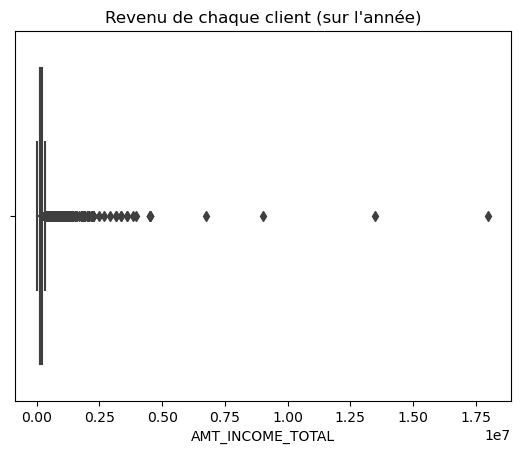

In [59]:
# Affichons à nouveau notre boxplot
sns.boxplot(x=application_clean['AMT_INCOME_TOTAL'])
plt.title('Revenu de chaque client (sur l\'année)')
plt.show()

In [60]:
# Nous allons observer le reste des clients dont les revenus sont élevés
application_clean.sort_values(by='AMT_INCOME_TOTAL', ascending=False).head(20)

,OCCUPATION_TYPE,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_TYPE_SUITE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,EXT_SOURCE_2,AMT_GOODS_PRICE,AMT_ANNUITY,CNT_FAM_MEMBERS,DAYS_LAST_PHONE_CHANGE,CNT_CHILDREN,FLAG_DOCUMENT_8,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_9,FLAG_DOCUMENT_21,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_OWN_REALTY,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_12,AMT_CREDIT,AMT_INCOME_TOTAL,FLAG_PHONE,LIVE_CITY_NOT_WORK_CITY,REG_CITY_NOT_WORK_CITY,TARGET,REG_CITY_NOT_LIVE_CITY,LIVE_REGION_NOT_WORK_REGION,REG_REGION_NOT_WORK_REGION,REG_REGION_NOT_LIVE_REGION,HOUR_APPR_PROCESS_START,WEEKDAY_APPR_PROCESS_START,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,FLAG_EMAIL,FLAG_CONT_MOBILE,ORGANIZATION_TYPE,FLAG_WORK_PHONE,FLAG_EMP_PHONE,FLAG_MOBIL,DAYS_ID_PUBLISH,DAYS_REGISTRATION,DAYS_EMPLOYED,DAYS_BIRTH,REGION_POPULATION_RELATIVE,NAME_HOUSING_TYPE,NAME_FAMILY_STATUS,NAME_EDUCATION_TYPE,NAME_INCOME_TYPE,SK_ID_CURR
203693,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unaccompanied,1.0,0.0,1.0,0.0,0.788606,675000.0,69295.5,4.0,-1133.0,2,0,Cash loans,M,Y,0,1,0,0,0,0,0,0,0,0,Y,0,0,0,0,0,0,0,0,0,675000.0,18000090.0,0,0,0,0,0,0,0,0,22,THURSDAY,2,2,0,1,Business Entity,0,1,1,-4728,-3338.0,-4961,-15704,0.030755,House / apartment,Married,Secondary / secondary special,Commercial associate,336147
246858,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unaccompanied,0.0,0.0,0.0,0.0,0.713507,1368000.0,130945.5,2.0,-13.0,0,0,Cash loans,M,Y,0,0,0,0,0,0,1,0,0,0,Y,0,0,0,0,0,0,0,0,0,1400503.5,13500000.0,0,0,0,0,0,0,0,0,12,SUNDAY,2,2,0,1,Business Entity,1,1,1,-4972,-3953.0,-280,-13551,0.030755,House / apartment,Married,Higher education,Commercial associate,385674
77768,Managers,0.432962,0.0,0.0,0.0,0.0,0.0,0.0,Unaccompanied,1.0,0.0,1.0,0.0,0.504086,1377000.0,132601.5,2.0,-3.0,0,1,Cash loans,F,Y,0,0,0,0,0,0,0,0,0,0,N,0,0,0,0,0,0,0,0,0,1431531.0,9000000.0,0,0,0,0,0,0,0,0,13,FRIDAY,2,2,0,1,Business Entity,0,1,1,-1656,-7276.0,-8476,-16425,0.010147,House / apartment,Married,Higher education,Working,190160
131127,Laborers,0.495666,0.0,0.0,1.0,0.0,0.0,4.0,Unaccompanied,0.0,0.0,0.0,0.0,0.552838,675000.0,52978.5,2.0,-695.0,0,1,Cash loans,M,Y,0,0,0,0,0,0,0,0,0,0,N,0,0,0,0,0,0,0,0,0,790830.0,6750000.0,1,1,1,0,0,1,1,0,14,TUESDAY,2,2,0,1,Transport,1,1,1,-2886,-7414.0,-443,-19341,0.009549,House / apartment,Married,Higher education,Working,252084
204564,Managers,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unaccompanied,0.0,0.0,0.0,0.0,0.798003,450000.0,47749.5,1.0,-3206.0,0,0,Cash loans,M,N,0,1,0,0,0,0,0,0,0,0,N,0,0,0,0,0,0,0,0,0,450000.0,4500000.0,1,0,0,0,0,0,0,0,12,TUESDAY,2,2,0,1,Military,0,1,1,-1997,-1179.0,-8472,-18461,0.009334,House / apartment,Single / not married,Higher education,Working,337151
187833,Laborers,0.282248,0.0,0.0,0.0,0.0,0.0,2.0,Unaccompanied,0.0,0.0,0.0,0.0,0.748822,675000.0,42651.0,2.0,-613.0,0,0,Cash loans,M,N,0,1,0,0,0,0,0,0,0,0,N,0,0,0,0,0,0,0,0,0,835380.0,4500000.0,0,0,1,0,1,0,1,1,13,FRIDAY,2,2,0,1,Construction,1,1,1,-2104,-8877.0,-3331,-18715,0.006008,House / apartment,Married,Secondary / secondary special,Working,317748
287463,Managers,0.345785,0.0,0.0,1.0,0.0,0.0,0.0,Unaccompanied,3.0,0.0,3.0,0.0,0.407386,1755000.0,61132.5,2.0,-284.0,0,0,Cash loans,M,Y,0,1,0,0,0,0,0,0,0,0,Y,0,0,0,0,0,0,0,0,0,1755000.0,4500000.0,0,0,0,0,0,0,0,0,2,SATURDAY,2,2,0,1,Self-employed,1,1,1,-2315,-9447.0,-3618,-18784,0.010032,House / apartment,Married,Higher education,Working,432980
103006,Managers,0.619528,0.0,0.0,0.0,0.0,0.0,2.0,Unaccompanied,1.0,0.0,1.0,0.0,0.648046,2250000.0,225000.0,1.0,-529.0,0,0,Revolving loans,M,Y,0,0,0,0,0,0,0,0,0,0,Y,0,0,0,0,0,0,0,0,0,2250000.0,4500000.0,1,0,0,0,0,

Nous observons à nouveau des clients dont le revenu reste très élevé.

In [61]:
# Description des données pour le revenu du client
print(application_clean['AMT_INCOME_TOTAL'].describe())

count    3.075060e+05
mean     1.684178e+05
std      1.088124e+05
min      2.565000e+04
25%      1.125000e+05
50%      1.471500e+05
75%      2.025000e+05
max      1.800009e+07
Name: AMT_INCOME_TOTAL, dtype: float64


Nous pouvons voir que la valeur minimale est de 25 650 dollars et la valeur maximale (après première suppression de notre cliente) est de 18 000 090 dollars. 

Regardons la valeur pour 99% des clients. 

In [62]:
# Sélection des valeurs pour un quantile donné
application_clean['AMT_INCOME_TOTAL'].quantile(q=0.995)

630000.0

In [63]:
# Sélection des clients dont le revenu est supérieur à 600 000 dollars
print(round(application_clean[application_clean['AMT_INCOME_TOTAL'] >= 600000].shape[0]*100/application_clean.shape[0], 2),
      '% des clients dont le revenu est supérieur à 600 000 dollars')

0.52 % des clients dont le revenu est supérieur à 600 000 dollars


Nous allons supprimer les clients dont le revenu est supérieur ou égal à 600 000 dollars (correspondant à uniquement 0.5% des clients totaux). 

In [64]:
# Suppression des clients dont le revenu est inférieur à 600 000 dollars. 
application_clean = application_clean[application_clean['AMT_INCOME_TOTAL'] < 600000]

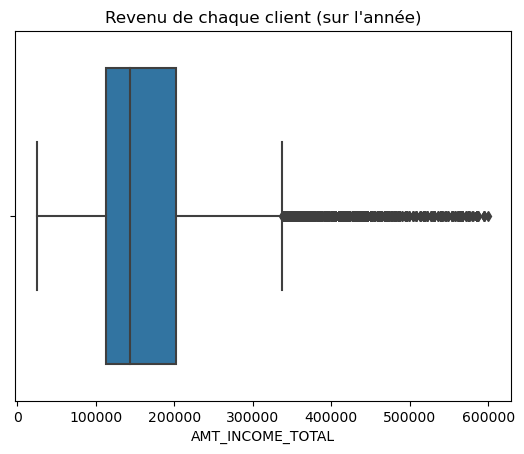

In [65]:
# Affichons à nouveau le boxplot
sns.boxplot(x=application_clean['AMT_INCOME_TOTAL'])
plt.title('Revenu de chaque client (sur l\'année)')
plt.show()

In [66]:
# Affichons les nouvelles dimensions de notre df
application_clean.shape

(305900, 73)

#### c. Prêt du client

On va afficher successivement le montant du crédit, le montant annuel remboursé et le prix du bien pour lequel le crédit est effectué. 

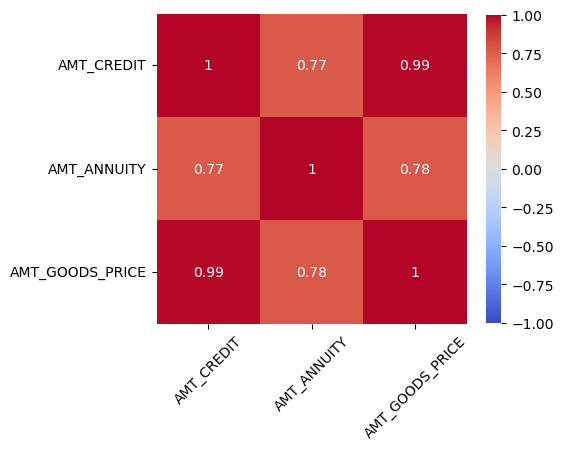

In [67]:
# Regardons si une corrélation est observée entre ces 3 variables

fig, ax = plt.subplots(figsize=(5, 5))
sns.heatmap(application_clean[['AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE']].corr(), annot = True, square=True, vmin=-1, vmax=+1,
            cmap=plt.cm.coolwarm, cbar_kws={"shrink": 0.8})
plt.xticks(rotation = 45)
plt.show()

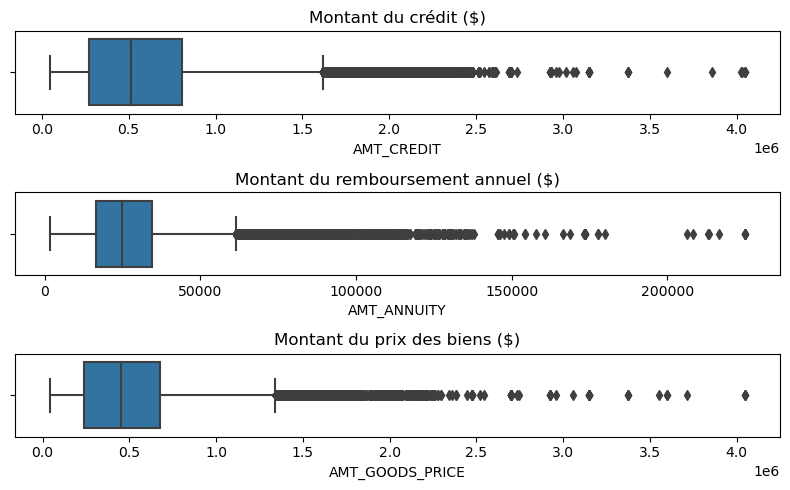

In [68]:
fig, axes = plt.subplots(3, 1, figsize=(8, 5))

# Premier boxplot
sns.boxplot(x=application_clean['AMT_CREDIT'], ax=axes[0])
axes[0].set_title('Montant du crédit ($)')

# Deuxième boxplot
sns.boxplot(x=application_clean['AMT_ANNUITY'], ax=axes[1])
axes[1].set_title('Montant du remboursement annuel ($)')

# Troisième boxplot
sns.boxplot(x=application_clean['AMT_GOODS_PRICE'], ax=axes[2])
axes[2].set_title('Montant du prix des biens ($)')

plt.tight_layout()  # Pour éviter le chevauchement

# Afficher la figure
plt.show()

#### d. Age du client

In [69]:
# L'age du client étant en jours (au moment de la demande de prêt), on va convertir en années
application_clean['AGE'] = abs(application_clean['DAYS_BIRTH'] / 365)
application_clean['AGE'] = application_clean['AGE'].astype(int)

target_1['AGE'] = abs(target_1['DAYS_BIRTH'] / 365)
target_1['AGE'] = target_1['AGE'].astype(int)

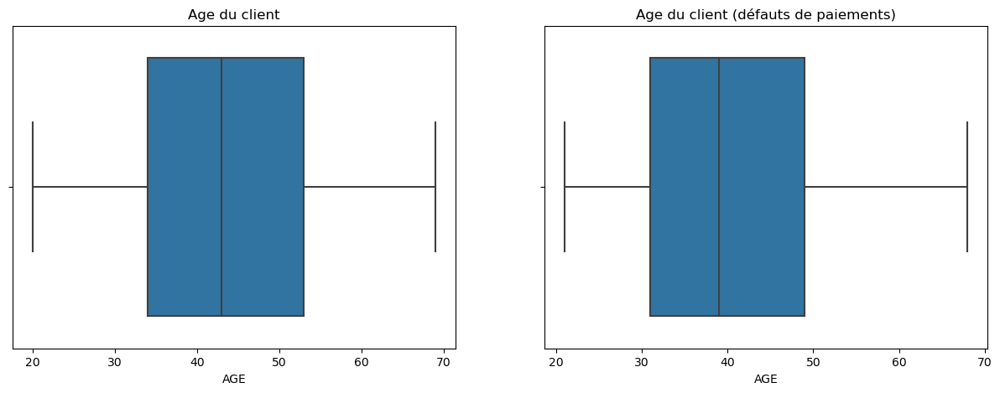

In [70]:
# Comparaison avec les clients ayant des défauts de paiements
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

sns.boxplot(x=application_clean['AGE'], ax=axes[0])
axes[0].set_title('Age du client')

sns.boxplot(x=target_1['AGE'], ax=axes[1])
axes[1].set_title('Age du client (défauts de paiements)')

plt.show()

Les clients sont agés entre 20 et 70 ans environ, avec un age médian > 40 ans de manière générale et < 40 ans pour les clients ayant des défauts de paiements. 

#### e. Nombre de jours travaillés avant la demande

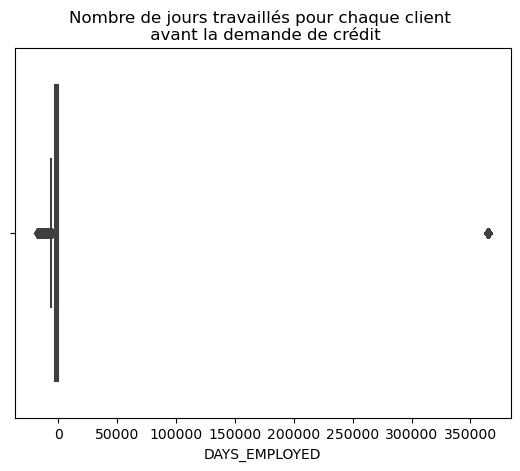

In [71]:
# Affichons le boxplot
sns.boxplot(x=application_clean['DAYS_EMPLOYED'])
plt.title('Nombre de jours travaillés pour chaque client \n avant la demande de crédit')
plt.show()

On observe des valeurs extrêmes concernant le nombre de jours travaillés avant la demande de crédit et correspondant à des valeurs positives, alors que la valeur doit être négative . Nous allons afficher les clients concernés par ces valeurs aberrantes. 

In [72]:
# Sélection des valeurs aberrantes (élevées et positives)
val_pos = application_clean[application_clean['DAYS_EMPLOYED'] > 0]['DAYS_EMPLOYED'].value_counts()
print(round(val_pos.iloc[0]*100/application_clean.shape[0], 2),
      '% des clients contiennent des valeurs aberrantes pour le nombre de jours travaillés avant la demande de prêt, dont la valeur est de',
     val_pos.index.values)

18.07 % des clients contiennent des valeurs aberrantes pour le nombre de jours travaillés avant la demande de prêt, dont la valeur est de [365243]


Etant donné que l'on observe un certain nombre de clients (18%) avec des valeurs aberrantes, plutôt que de les supprimer et de perdre de l'information, on va leur appliquer la valeur NaN. 

In [73]:
application_clean['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)

In [74]:
application_clean['DAYS_EMPLOYED'].isnull().sum()

55285

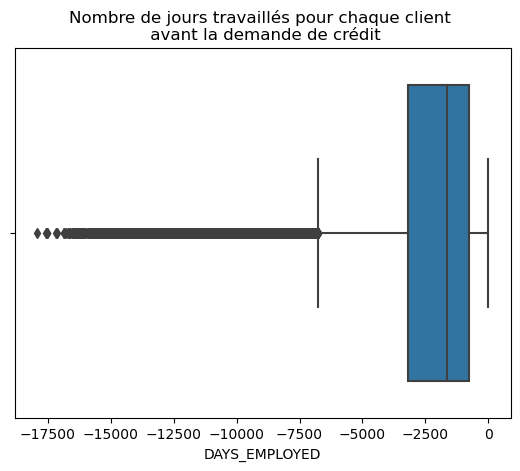

In [75]:
# Observons le boxplot après traitement de ces valeurs
sns.boxplot(x=application_clean['DAYS_EMPLOYED'])
plt.title('Nombre de jours travaillés pour chaque client \n avant la demande de crédit')
plt.show()

### 2.1.4. Traitement des valeurs manquantes

On va désormais <u>traiter les valeurs manquantes</u> avant notre feature engineering. 

- **Variables catégorielles** : 

Création d'une catégorie "Unknown" dans le cas où j'ai un grand nombre de valeurs manquantes > 10%. 
Imputation par la valeur la plus fréquente dans le cas où j'ai un plus faible nombre de valeurs manquantes < 10%.
                                                                                                                     
- **Variables numériques** : 

Imputation par la médiane dans le cas où j'ai un grand nombre de valeurs manquantes > 10%. 
Imputation par la valeur la plus fréquente dans le cas où j'ai un plus faible nombre de valeurs manquantes < 10%. 
Imputation par IterativeImputer lorsque j'ai peu de de valeurs manquantes < 10% et lorsque j'ai une variable, sans valeurs manquantes, corrélée. 

#### a. Variables catégorielles

In [76]:
miss_val = var_categ.isnull().sum()
miss_val

OCCUPATION_TYPE               96391
NAME_TYPE_SUITE                1292
NAME_CONTRACT_TYPE                0
CODE_GENDER                       0
FLAG_OWN_CAR                      0
FLAG_OWN_REALTY                   0
WEEKDAY_APPR_PROCESS_START        0
ORGANIZATION_TYPE                 0
NAME_HOUSING_TYPE                 0
NAME_FAMILY_STATUS                0
NAME_EDUCATION_TYPE               0
NAME_INCOME_TYPE                  0
dtype: int64

In [77]:
# Calcul du pourcentage de valeurs manquantes par variable
percentage_missing = (miss_val / len(var_categ)) * 100

# Filtrage des variables avec des valeurs manquantes
variables_manquantes = percentage_missing[percentage_missing > 0]

# Affichage des variables avec le pourcentage de valeurs manquantes
print("Variables catégorielles avec des valeurs manquantes:")
for variable, pourcentage in variables_manquantes.items():
    print(f"{variable}: {pourcentage:.2f}%")

Variables catégorielles avec des valeurs manquantes:
OCCUPATION_TYPE: 31.35%
NAME_TYPE_SUITE: 0.42%


2 variables catégorielles contiennent des valeurs manquantes : accompagnant du client et type de profession. Dans le cas du type de profession où l'on a plus de 10% de valeurs manquantes, nous allons créer une nouvelle catégorie "Unknown". Dans le cas de l'accompagnant du client, nous allons attribuer la valeur la plus fréquente. 

In [78]:
# Création d'une variable "Unknown" pour notre variable "OCCUPATION_TYPE"
application_clean.loc[application_clean['OCCUPATION_TYPE'].isnull(), ['OCCUPATION_TYPE']] = 'Unknown'

In [79]:
# Sélection de la valeur la plus fréquente pour "NAME_TYPE_SUITE"
most_freq = var_categ['NAME_TYPE_SUITE'].value_counts().reset_index().iloc[0,0]
print(most_freq, 'est la valeur la plus fréquente')

Unaccompanied est la valeur la plus fréquente


In [80]:
# Remplacer les valeurs manquantes par la valeur la plus fréquente
application_clean['NAME_TYPE_SUITE'] = application_clean['NAME_TYPE_SUITE'].fillna(most_freq)

In [81]:
# Vérifions les différentes catégories
print(application_clean['NAME_TYPE_SUITE'].value_counts())
print('-------------------')
print(application_clean['OCCUPATION_TYPE'].value_counts())

Unaccompanied      248438
Family              39976
Spouse, partner     11330
Children             3260
Other_B              1762
Other_A               864
Group of people       270
Name: NAME_TYPE_SUITE, dtype: int64
-------------------
Unknown                  96063
Laborers                 55105
Sales staff              32031
Core staff               27439
Managers                 20601
Drivers                  18563
High skill tech staff    11323
Accountants               9731
Medicine staff            8525
Security staff            6715
Cooking staff             5946
Cleaning staff            4649
Private service staff     2644
Low-skill Laborers        2092
Waiters/barmen staff      1348
Secretaries               1301
Realty agents              748
HR staff                   560
IT staff                   516
Name: OCCUPATION_TYPE, dtype: int64


In [82]:
missing_values = application_clean['NAME_TYPE_SUITE'].isnull().sum()
print("Nombre de valeurs manquantes après remplacement :", missing_values)

Nombre de valeurs manquantes après remplacement : 0


#### b. Variables numériques

In [83]:
# On sélectionne à nouveau les variables numériques
var_num = application_clean.select_dtypes(include=['float64', 'int'])
var_num.columns

Index(['EXT_SOURCE_3', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR', 'OBS_30_CNT_SOCIAL_CIRCLE',
       'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'EXT_SOURCE_2', 'AMT_GOODS_PRICE',
       'AMT_ANNUITY', 'CNT_FAM_MEMBERS', 'DAYS_LAST_PHONE_CHANGE',
       'CNT_CHILDREN', 'AMT_CREDIT', 'AMT_INCOME_TOTAL', 'FLAG_PHONE',
       'LIVE_CITY_NOT_WORK_CITY', 'REG_CITY_NOT_WORK_CITY', 'TARGET',
       'REG_CITY_NOT_LIVE_CITY', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_REGION_NOT_WORK_REGION', 'REG_REGION_NOT_LIVE_REGION',
       'HOUR_APPR_PROCESS_START', 'REGION_RATING_CLIENT_W_CITY',
       'REGION_RATING_CLIENT', 'FLAG_EMAIL', 'FLAG_CONT_MOBILE',
       'FLAG_WORK_PHONE', 'FLAG_EMP_PHONE', 'FLAG_MOBIL', 'DAYS_ID_PUBLISH',
       'DAYS_REGISTRATION', 'DAYS_EMPLOYED', 'DAYS_BIRTH',
       'REGIO

In [84]:
miss_val = var_num.isnull().sum()
miss_val

EXT_SOURCE_3                   60675
AMT_REQ_CREDIT_BUREAU_HOUR     41326
AMT_REQ_CREDIT_BUREAU_DAY      41326
AMT_REQ_CREDIT_BUREAU_WEEK     41326
AMT_REQ_CREDIT_BUREAU_MON      41326
AMT_REQ_CREDIT_BUREAU_QRT      41326
AMT_REQ_CREDIT_BUREAU_YEAR     41326
OBS_30_CNT_SOCIAL_CIRCLE         982
DEF_30_CNT_SOCIAL_CIRCLE         982
OBS_60_CNT_SOCIAL_CIRCLE         982
DEF_60_CNT_SOCIAL_CIRCLE         982
EXT_SOURCE_2                     660
AMT_GOODS_PRICE                  277
AMT_ANNUITY                       12
CNT_FAM_MEMBERS                    2
DAYS_LAST_PHONE_CHANGE             1
CNT_CHILDREN                       0
AMT_CREDIT                         0
AMT_INCOME_TOTAL                   0
FLAG_PHONE                         0
LIVE_CITY_NOT_WORK_CITY            0
REG_CITY_NOT_WORK_CITY             0
TARGET                             0
REG_CITY_NOT_LIVE_CITY             0
LIVE_REGION_NOT_WORK_REGION        0
REG_REGION_NOT_WORK_REGION         0
REG_REGION_NOT_LIVE_REGION         0
H

In [85]:
# Calcul du pourcentage de valeurs manquantes par variable
percentage_missing = (miss_val / len(var_num)) * 100

# Filtrage des variables avec des valeurs manquantes
variables_manquantes = percentage_missing[percentage_missing > 0]

# Affichage des variables avec le pourcentage de valeurs manquantes
print("Variables catégorielles avec des valeurs manquantes:")
for variable, pourcentage in variables_manquantes.items():
    print(f"{variable}: {pourcentage:.2f}%")

Variables catégorielles avec des valeurs manquantes:
EXT_SOURCE_3: 19.83%
AMT_REQ_CREDIT_BUREAU_HOUR: 13.51%
AMT_REQ_CREDIT_BUREAU_DAY: 13.51%
AMT_REQ_CREDIT_BUREAU_WEEK: 13.51%
AMT_REQ_CREDIT_BUREAU_MON: 13.51%
AMT_REQ_CREDIT_BUREAU_QRT: 13.51%
AMT_REQ_CREDIT_BUREAU_YEAR: 13.51%
OBS_30_CNT_SOCIAL_CIRCLE: 0.32%
DEF_30_CNT_SOCIAL_CIRCLE: 0.32%
OBS_60_CNT_SOCIAL_CIRCLE: 0.32%
DEF_60_CNT_SOCIAL_CIRCLE: 0.32%
EXT_SOURCE_2: 0.22%
AMT_GOODS_PRICE: 0.09%
AMT_ANNUITY: 0.00%
CNT_FAM_MEMBERS: 0.00%
DAYS_LAST_PHONE_CHANGE: 0.00%
DAYS_EMPLOYED: 18.07%


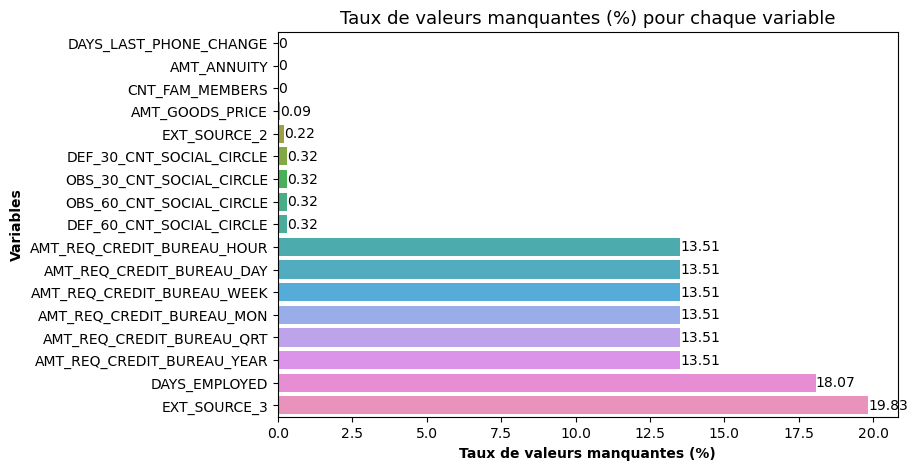

In [86]:
# Création du dataframe pour les variables manquantes
val_manq = pd.DataFrame(round(variables_manquantes, 2)).reset_index()
val_manq.columns = ['Variable', 'Taux de valeurs manquantes']

# Tri des variables par taux de valeurs manquantes
val_manq = val_manq.sort_values(by='Taux de valeurs manquantes', ascending=True)

# Création du graphique barplot
plt.figure(figsize=(8, 5))
ax = sns.barplot(data=val_manq, x='Taux de valeurs manquantes', y='Variable', ci=None, dodge=False)

plt.xlabel('Taux de valeurs manquantes (%)', size=10, fontweight='bold')
plt.ylabel('Variables', size=10, fontweight='bold')
plt.title('Taux de valeurs manquantes (%) pour chaque variable', size=13)

plt.yticks(size=10)
plt.xticks(size=10)

for i in ax.containers:
    ax.bar_label(i,)

plt.show()

Les variables contenant plus de 10% de valeurs manquantes vont être remplacées par leur valeur médiane, le reste sera remplacé par leur valeur la plus fréquente. 

Parmis les données, on observe que certaines variables possèdent le même nombre de valeurs manquantes. Nous allons effectuer une matrice de corrélation afin d'observer la corrélation entre les différentes variables. 

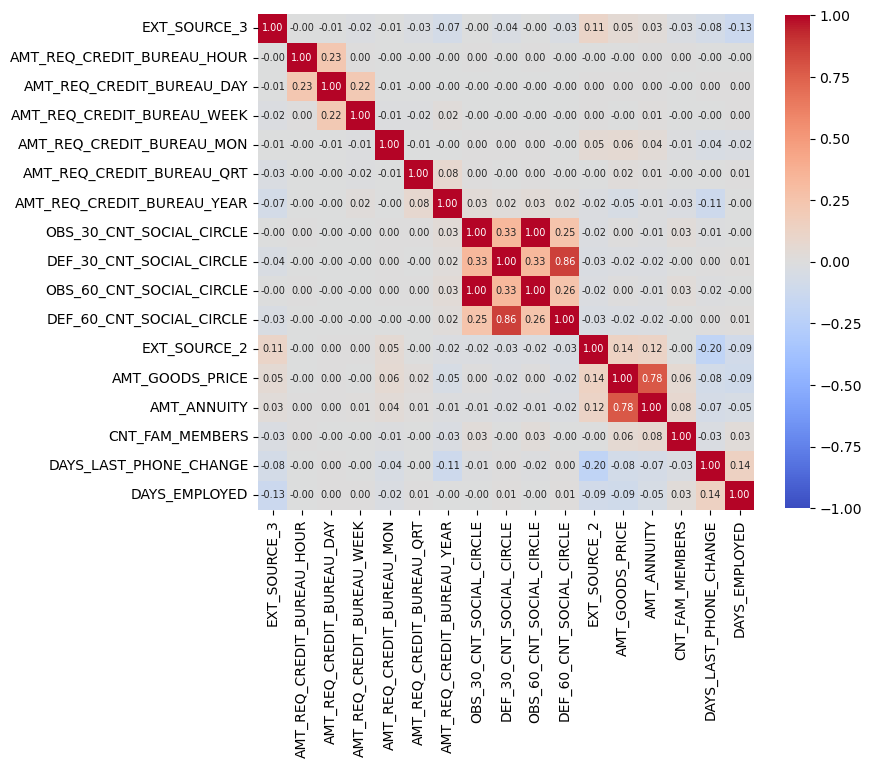

In [87]:
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(var_num[variables_manquantes.index].corr(), square=True, annot=True, annot_kws={"size": 7},
            fmt=".2f", vmin=-1, vmax=+1, cmap=plt.cm.coolwarm, cbar_kws={"shrink": 0.8})
plt.show()

Peu de corrélation sont observées entre les variables, sauf concernant le nombre d'observations de l'environnement social du client selon le nombre de jours de retards. On retrouve la corrélation entre "AMT_GOODS_PRICE" et "AMT_ANNUITY" que nous avions observé précédemment et également corrélées à "AMT_CREDIT". 

- <u>**Nombre de demandes de renseignements au Bureau de Crédit**</u>

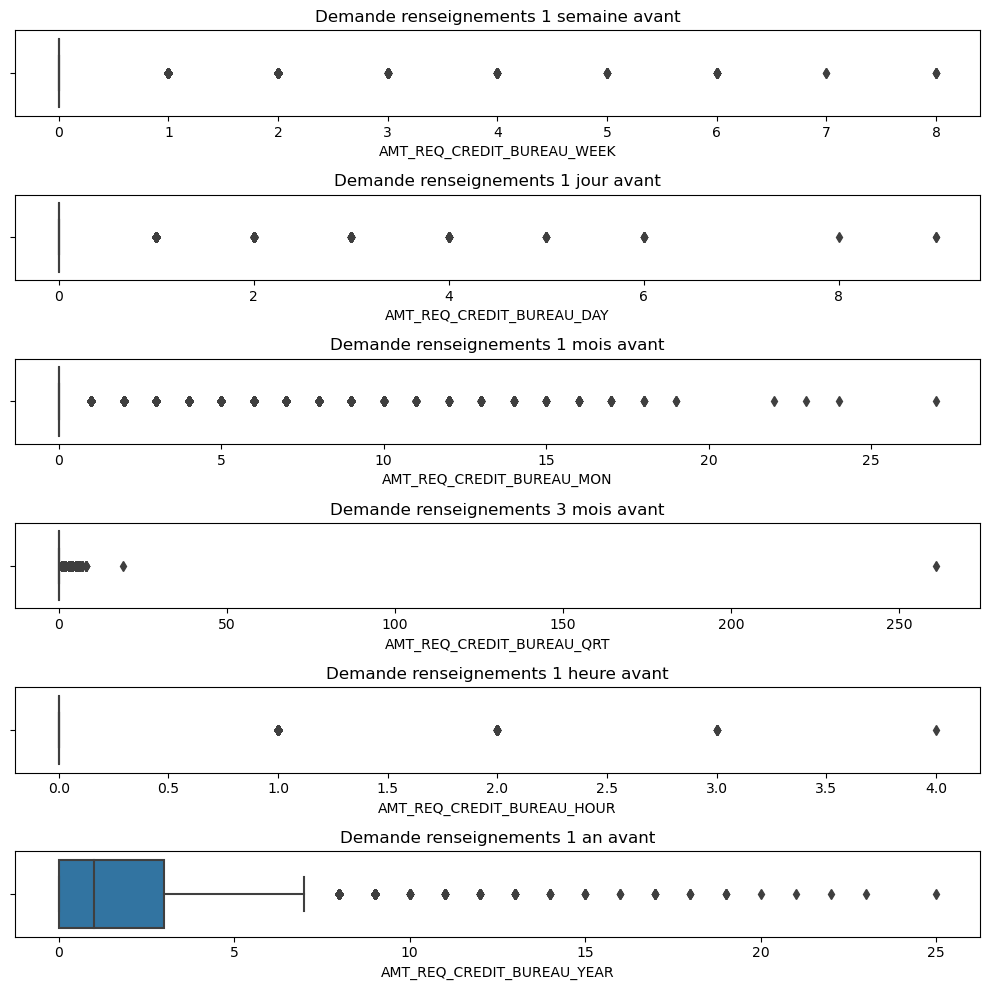

In [88]:
# Affichons les boxplots pour ces 6 variables concernant le nombre de renseignements
fig, axes = plt.subplots(6, 1, figsize=(10, 10))

sns.boxplot(x=application_clean['AMT_REQ_CREDIT_BUREAU_WEEK'], ax=axes[0])
axes[0].set_title('Demande renseignements 1 semaine avant')

sns.boxplot(x=application_clean['AMT_REQ_CREDIT_BUREAU_DAY'], ax=axes[1])
axes[1].set_title('Demande renseignements 1 jour avant')

sns.boxplot(x=application_clean['AMT_REQ_CREDIT_BUREAU_MON'], ax=axes[2])
axes[2].set_title('Demande renseignements 1 mois avant')

sns.boxplot(x=application_clean['AMT_REQ_CREDIT_BUREAU_QRT'], ax=axes[3])
axes[3].set_title('Demande renseignements 3 mois avant')

sns.boxplot(x=application_clean['AMT_REQ_CREDIT_BUREAU_HOUR'], ax=axes[4])
axes[4].set_title('Demande renseignements 1 heure avant')

sns.boxplot(x=application_clean['AMT_REQ_CREDIT_BUREAU_YEAR'], ax=axes[5])
axes[5].set_title('Demande renseignements 1 an avant')


plt.tight_layout()  # Pour éviter le chevauchement

# Afficher la figure
plt.show()

Pour l'imputation des valeurs manquantes, nous allons prendre la valeur mediane qui n'est pas sensible aux valeurs extrêmes. 

In [89]:
# Implémentation des valeurs manquantes pour nos 6 variables par la médiane
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='median')

# Variables à traiter
variables = ['AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_MON',
             'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_YEAR']

# Remplacer les valeurs manquantes par la valeur médiane
application_clean[variables] = imputer.fit_transform(application_clean[variables])

- <u>**Nombre de jours travaillés avant la demande de prêt**</u>

Nous allons regarder quels sont les métier des personnes pour lesquelles nous observons des valeurs manquantes pour le nombre de jours travaillés avant la demande de prêt afin de voir si ces valeurs sont liées. 

In [90]:
val_manq_jours_trav = application_clean[application_clean['DAYS_EMPLOYED'].isnull()]
print(val_manq_jours_trav['OCCUPATION_TYPE'].value_counts(normalize=True))
print('----------')
print(val_manq_jours_trav['NAME_INCOME_TYPE'].value_counts(normalize=True))

Unknown           0.999964
Cleaning staff    0.000036
Name: OCCUPATION_TYPE, dtype: float64
----------
Pensioner     0.999602
Unemployed    0.000398
Name: NAME_INCOME_TYPE, dtype: float64


On observe que pour la majorité des clients dont nous ne connaissons pas le nombre de jours travaillés avant la demande de prêt, 99.9% d'entre eux sont liés au fait que **nous ne connaissons pas leur type de profession**. Néanmoins, quelques uns d'entre eux ont une profession de type "agent d'entretien". 

De plus, parmi ces clients, 99.9% d'entre eux sont des **retraités** et le reste sont **sans emplois**. Cela justifie les valeurs manquantes pour le nombre de jours travaillés avant la demande de prêt. 

In [91]:
# Affichons ces clients dont le type de profession est "agent d'entretien"
val_manq_jours_trav[val_manq_jours_trav['OCCUPATION_TYPE'] == 'Cleaning staff']

,OCCUPATION_TYPE,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_TYPE_SUITE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,EXT_SOURCE_2,AMT_GOODS_PRICE,AMT_ANNUITY,CNT_FAM_MEMBERS,DAYS_LAST_PHONE_CHANGE,CNT_CHILDREN,FLAG_DOCUMENT_8,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_9,FLAG_DOCUMENT_21,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_OWN_REALTY,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_12,AMT_CREDIT,AMT_INCOME_TOTAL,FLAG_PHONE,LIVE_CITY_NOT_WORK_CITY,REG_CITY_NOT_WORK_CITY,TARGET,REG_CITY_NOT_LIVE_CITY,LIVE_REGION_NOT_WORK_REGION,REG_REGION_NOT_WORK_REGION,REG_REGION_NOT_LIVE_REGION,HOUR_APPR_PROCESS_START,WEEKDAY_APPR_PROCESS_START,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,FLAG_EMAIL,FLAG_CONT_MOBILE,ORGANIZATION_TYPE,FLAG_WORK_PHONE,FLAG_EMP_PHONE,FLAG_MOBIL,DAYS_ID_PUBLISH,DAYS_REGISTRATION,DAYS_EMPLOYED,DAYS_BIRTH,REGION_POPULATION_RELATIVE,NAME_HOUSING_TYPE,NAME_FAMILY_STATUS,NAME_EDUCATION_TYPE,NAME_INCOME_TYPE,SK_ID_CURR,AGE
134327,Cleaning staff,NaN,0.0,0.0,0.0,0.0,0.0,4.0,Unaccompanied,2.0,0.0,2.0,0.0,0.723151,NaN,16875.0,2.0,-1289.0,0,0,Revolving loans,F,N,0,1,0,0,0,0,0,0,0,0,Y,0,0,0,0,0,0,0,0,0,337500.0,135000.0,1,0,0,0,0,0,0,0,10,FRIDAY,2,2,0,1,Unknown,0,0,1,-4399,-6961.0,NaN,-21224,0.006671,House / apartment,Married,Secondary / secondary special,Pensioner,255803,58
242307,Cleaning staff,0.160489,0.0,0.0,0.0,0.0,0.0,0.0,Unaccompanied,3.0,1.0,3.0,1.0,0.673530,NaN,6750.0,2.0,-1462.0,0,0,Revolving loans,F,N,0,1,0,0,0,0,0,0,0,0,Y,0,0,0,0,0,0,0,0,0,135000.0,94500.0,1,0,0,0,0,0,0,0,8,SUNDAY,2,2,0,1,Unknown,0,0,1,-3964,-6766.0,NaN,-20940,0.014520,House / apartment,Married,Secondary / secondary special,Pensioner,380511,57


On peut supposer que ces deux clients dont la profession est de type "Cleaning staff" sont des erreurs étant donné le fait qu'ils sont également considérés comme retraités. 

Dans un premier temps, nous allons observer la description des données pour les clients retraités. 

In [92]:
# Description des clients retraités
application_clean[application_clean['NAME_INCOME_TYPE'] == 'Pensioner']['DAYS_EMPLOYED'].describe()

count       10.000000
mean     -4945.800000
std       4289.076637
min     -12865.000000
25%      -7382.750000
50%      -2801.000000
75%      -1725.500000
max      -1346.000000
Name: DAYS_EMPLOYED, dtype: float64

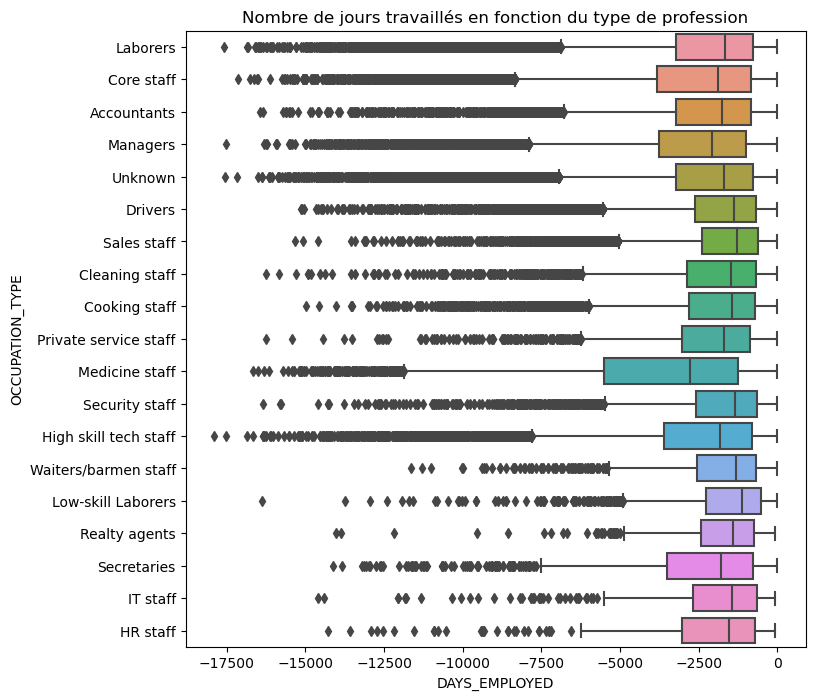

In [93]:
# Affichons les boxplots pour chaque type de profession concernant le nombre de jours travaillés
plt.figure(figsize=(8,8))
sns.boxplot(data=application_clean, y='OCCUPATION_TYPE', x='DAYS_EMPLOYED')
plt.title('Nombre de jours travaillés en fonction du type de profession')
plt.show()

Nous observons quelques légères différences dans le nombre de jours travaillés pour chaque profession. 

Afin de traiter les valeurs manquantes pour le nombre de jours travaillés avant la demande de prêt, nous allons prendre en compte le type de profession et remplacer par la valeur médiane. 

In [94]:
# Calcul médiane par catégorie de type de profession
median_by_profession = application_clean.groupby('OCCUPATION_TYPE')['DAYS_EMPLOYED'].median()

application_clean_copy = application_clean.copy()

# Remplacement des valeurs manquantes dans la colonne 'DAYS_EMPLOYED' par la médiane par catégorie de type de profession
application_clean_copy['DAYS_EMPLOYED'] = application_clean_copy['DAYS_EMPLOYED'].fillna(application_clean_copy['OCCUPATION_TYPE'].map(median_by_profession))

In [95]:
# Vérifions que l'imputation a bien été effectuée
application_clean_copy['DAYS_EMPLOYED'].isnull().sum()

0

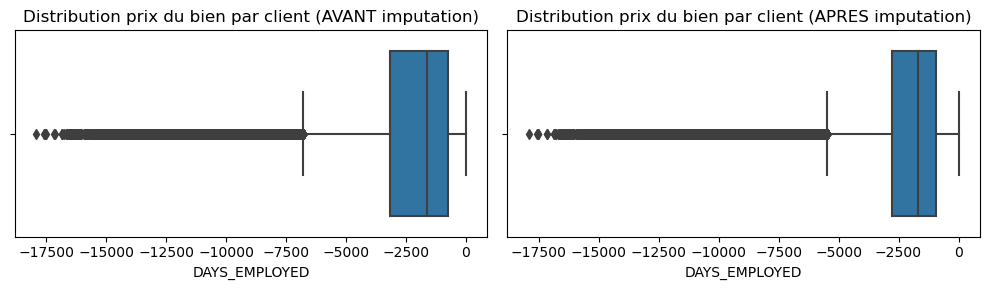

In [96]:
# Comparons la distribution des données avant et après imputation
fig, axes = plt.subplots(1, 2, figsize=(10, 3))

# Boxplot du nombre de jours travaillés (avant/après imputation)
sns.boxplot(x=application_clean['DAYS_EMPLOYED'], ax=axes[0])
axes[0].set_title('Distribution prix du bien par client (AVANT imputation)')

sns.boxplot(x=application_clean_copy['DAYS_EMPLOYED'], ax=axes[1])
axes[1].set_title('Distribution prix du bien par client (APRES imputation)')

plt.tight_layout()  # Pour éviter le chevauchement

# Afficher la figure
plt.show()

In [97]:
# Appliquons notre transformation à notre df de base
application_clean['DAYS_EMPLOYED'] = application_clean['DAYS_EMPLOYED'].fillna(application_clean['OCCUPATION_TYPE'].map(median_by_profession))

- <u>**Score normalisé à partir d'une source de données externe**</u>

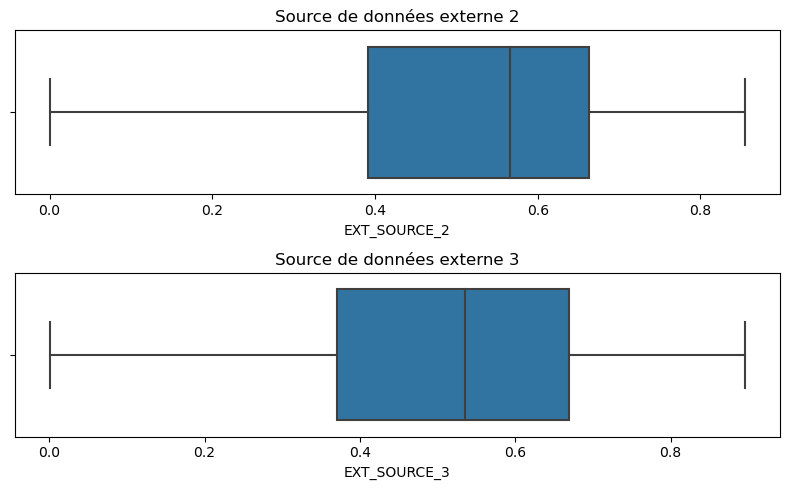

In [98]:
# Affichons les boxplots pour ces 2 variables concernant le score normalisé à partir d'une source de données externe
fig, axes = plt.subplots(2, 1, figsize=(8, 5))

sns.boxplot(x=application_clean['EXT_SOURCE_2'], ax=axes[0])
axes[0].set_title('Source de données externe 2')

sns.boxplot(x=application_clean['EXT_SOURCE_3'], ax=axes[1])
axes[1].set_title('Source de données externe 3')

plt.tight_layout()  # Pour éviter le chevauchement

# Afficher la figure
plt.show()

Les scores s'étendent de 0 à 1. 

In [99]:
# On remplace par la valeur médiane pour la source 3 (> 10% de valeurs manquantes)
imputer = SimpleImputer(strategy='median')

# Variables à traiter
variables = ['EXT_SOURCE_3']

# Remplacer les valeurs manquantes par la valeur médiane
application_clean[variables] = imputer.fit_transform(application_clean[variables])

In [100]:
# On utilise la valeur la plus fréquente pour remplacer
# les valeurs manquantes pour la source 3 (< 10% de valeurs manquantes)
most_freq = var_num['EXT_SOURCE_2'].value_counts().reset_index().iloc[0,0]

# On remplace les valeurs manquantes par la plus fréquente
application_clean['EXT_SOURCE_2'] = application_clean['EXT_SOURCE_2'].fillna(most_freq)

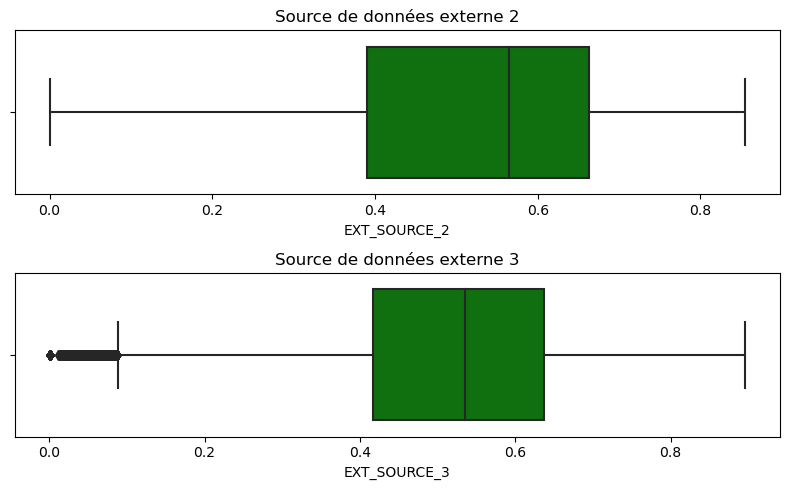

In [101]:
# Affichons les boxplots pour ces 3 variables concernant le score normalisé à partir d'une source de données externe
fig, axes = plt.subplots(2, 1, figsize=(8, 5))

sns.boxplot(x=application_clean['EXT_SOURCE_2'], ax=axes[0], color='g')
axes[0].set_title('Source de données externe 2')

sns.boxplot(x=application_clean['EXT_SOURCE_3'], ax=axes[1], color='g')
axes[1].set_title('Source de données externe 3')

plt.tight_layout()  # Pour éviter le chevauchement

# Afficher la figure
plt.show()

On a effectué une imputation sur la médiane, Source 2 n'a pas été du tout impacté et l'imputation n'a pas été trop impactante pour source 3.

- <u>**Nombre d'observations de l'environnement selon le nombre de jours de retard (observable ou par défaut)**</u>

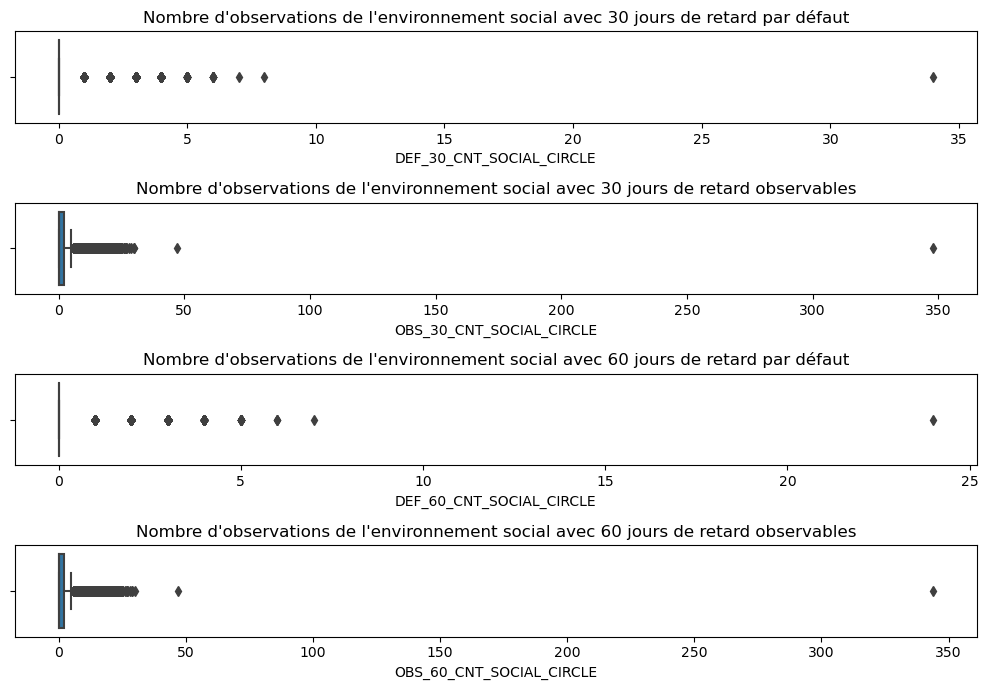

In [102]:
# Affichons les boxplots pour ces 6 variables concernant le nombre de renseignements
fig, axes = plt.subplots(4, 1, figsize=(10, 7))

sns.boxplot(x=application_clean['DEF_30_CNT_SOCIAL_CIRCLE'], ax=axes[0])
axes[0].set_title('Nombre d\'observations de l\'environnement social avec 30 jours de retard par défaut')

sns.boxplot(x=application_clean['OBS_30_CNT_SOCIAL_CIRCLE'], ax=axes[1])
axes[1].set_title('Nombre d\'observations de l\'environnement social avec 30 jours de retard observables')

sns.boxplot(x=application_clean['DEF_60_CNT_SOCIAL_CIRCLE'], ax=axes[2])
axes[2].set_title('Nombre d\'observations de l\'environnement social avec 60 jours de retard par défaut')

sns.boxplot(x=application_clean['OBS_60_CNT_SOCIAL_CIRCLE'], ax=axes[3])
axes[3].set_title('Nombre d\'observations de l\'environnement social avec 60 jours de retard observables')

plt.tight_layout()  # Pour éviter le chevauchement

# Afficher la figure
plt.show()

On va également affecter la valeur la plus fréquente. 

In [103]:
# On utilise la valeur la plus fréquente pour remplacer les valeurs manquantes

# Variables à traiter
variables = ['DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE',
             'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE']

for var in variables:
    most_freq = var_num[var].value_counts().reset_index().iloc[0,0]
    application_clean[var] = application_clean[var].fillna(most_freq)

In [104]:
# Vérifions que l'imputation s'est correctement déroulée
for var in variables:
    missing_val = application_clean[var].isnull().sum()
    print("Nombre de valeurs manquantes après remplacement :", missing_values)

Nombre de valeurs manquantes après remplacement : 0
Nombre de valeurs manquantes après remplacement : 0
Nombre de valeurs manquantes après remplacement : 0
Nombre de valeurs manquantes après remplacement : 0


- <u>**Crédits (remboursement annuel et valeur du bien)**</u>

Concernant les variables de remboursement annuel et de valeur du bien, étant donné que ces deux variables sont corrélées à la variable correspondant au montant du crédit, nous allons utiliser l'imputation par IterativeImputer. En effet, cette méthode utilisant l'apprentissage automatique va se baser sur les autres variables pour attribuer une valeur aux manquantes. 

In [105]:
# Affichons les lignes de ces valeurs manquantes pour les deux variables
application_clean.loc[application_clean['AMT_GOODS_PRICE'].isnull() | application_clean['AMT_ANNUITY'].isnull()]

,OCCUPATION_TYPE,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_TYPE_SUITE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,EXT_SOURCE_2,AMT_GOODS_PRICE,AMT_ANNUITY,CNT_FAM_MEMBERS,DAYS_LAST_PHONE_CHANGE,CNT_CHILDREN,FLAG_DOCUMENT_8,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_9,FLAG_DOCUMENT_21,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_OWN_REALTY,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_12,AMT_CREDIT,AMT_INCOME_TOTAL,FLAG_PHONE,LIVE_CITY_NOT_WORK_CITY,REG_CITY_NOT_WORK_CITY,TARGET,REG_CITY_NOT_LIVE_CITY,LIVE_REGION_NOT_WORK_REGION,REG_REGION_NOT_WORK_REGION,REG_REGION_NOT_LIVE_REGION,HOUR_APPR_PROCESS_START,WEEKDAY_APPR_PROCESS_START,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,FLAG_EMAIL,FLAG_CONT_MOBILE,ORGANIZATION_TYPE,FLAG_WORK_PHONE,FLAG_EMP_PHONE,FLAG_MOBIL,DAYS_ID_PUBLISH,DAYS_REGISTRATION,DAYS_EMPLOYED,DAYS_BIRTH,REGION_POPULATION_RELATIVE,NAME_HOUSING_TYPE,NAME_FAMILY_STATUS,NAME_EDUCATION_TYPE,NAME_INCOME_TYPE,SK_ID_CURR,AGE
724,Core staff,0.535276,0.0,0.0,0.0,0.0,0.0,1.0,Unaccompanied,2.0,1.0,2.0,1.0,0.378174,NaN,6750.0,4.0,-2011.0,2,0,Revolving loans,F,N,0,1,0,0,0,0,0,0,0,0,Y,0,0,0,0,0,0,0,0,0,135000.0,45000.0,0,0,0,0,0,0,0,0,14,WEDNESDAY,2,2,0,1,Kindergarten,1,1,1,-1834,-519.0,-381.0,-10072,0.024610,House / apartment,Married,Secondary / secondary special,Commercial associate,100837,27
5937,Private service staff,0.537070,0.0,0.0,0.0,0.0,0.0,2.0,Unaccompanied,0.0,0.0,0.0,0.0,0.464614,NaN,22500.0,2.0,-476.0,0,0,Revolving loans,F,N,0,1,0,0,0,0,0,0,0,0,N,0,0,0,0,0,0,0,0,0,450000.0,157500.0,1,0,0,0,0,0,0,0,13,SATURDAY,2,2,1,1,Business Entity,1,1,1,-1948,-1289.0,-2921.0,-11993,0.010006,House / apartment,Married,Secondary / secondary special,Working,106955,32
6425,Accountants,0.535276,0.0,0.0,0.0,0.0,0.0,1.0,Unaccompanied,1.0,1.0,1.0,0.0,0.565849,NaN,10125.0,2.0,-643.0,0,0,Revolving loans,F,N,0,0,0,0,0,0,0,0,0,0,N,0,0,0,0,0,0,0,0,0,202500.0,67500.0,1,0,0,0,0,0,0,0,18,WEDNESDAY,2,2,0,1,Trade,1,1,1,-800,-4132.0,-2712.0,-9727,0.008474,House / apartment,Married,Higher education,Working,107494,26
6703,Managers,0.863363,0.0,0.0,0.0,0.0,0.0,0.0,Unaccompanied,1.0,0.0,1.0,0.0,0.645519,NaN,9000.0,3.0,-1292.0,1,1,Revolving loans,F,N,0,0,0,0,0,0,0,0,0,0,N,0,0,0,0,0,0,0,0,0,180000.0,121500.0,1,0,0,0,0,0,0,0,11,WEDNESDAY,1,1,0,1,Government,1,1,1,-572,-3765.0,-899.0,-11079,0.011657,House / apartment,Married,Secondary / secondary special,Working,107822,30
7647,Security staff,0.661024,0.0,0.0,0.0,0.0,0.0,3.0,Unaccompanied,1.0,0.0,1.0,0.0,0.552557,NaN,22500.0,1.0,-159.0,0,0,Revolving loans,M,N,0,1,0,0,0,0,0,0,0,0,Y,0,0,0,0,0,0,0,0,0,450000.0,180000.0,1,0,0,0,0,0,0,0,18,SATURDAY,1,1,0,1,Construction,1,1,1,-506,-4762.0,-1847.0,-9986,0.032561,House / apartment,Single / not married,Higher education,Working,108913,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
304678,Sales staff,0.574447,0.0,0.0,0.0,0.0,0.0,1.0,Unaccompanied,3.0,1.0,3.0,0.0,0.449139,NaN,10125.0,4.0,-777.0,2,0,Revolving loans,F,N,0,0,0,1,0,0,0,0,0,0,Y,0,0,0,0,0,0,0,0,0,202500.0,67500.0,0,1,0,0,1,0,0,0,11,WEDNESDAY,2,2,0,1,Business Entity,1,1,1,-3523,-1188.0,-1470.0,-11313,0.025164,House / apartment,Married,Higher education,Working,452992,30
304784,Drivers,0.459690,0.0,0.0,0.0,0.0,0.0,0.0,Unaccompanied,3.0,1.0,3.0,1.0,0.441976,NaN,13500.0,3.0,0.0,1,0,Revolving loans,M,N,0,1,0,0,0,0,0,0,0,0,Y,0,0,0,0,0,0,0,0,0,270000.0,112500.0,1,1,1,0

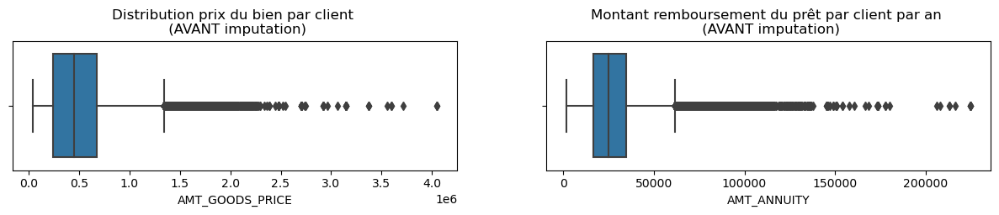

In [106]:
# On affiche les boxplots des données avant imputation
fig, axes = plt.subplots(1, 2, figsize=(15, 2))

# Boxplot du prix du bien (avant imputation)
sns.boxplot(x=application_clean['AMT_GOODS_PRICE'], ax=axes[0])
axes[0].set_title('Distribution prix du bien par client \n (AVANT imputation)')

sns.boxplot(x=application_clean['AMT_ANNUITY'], ax=axes[1])
axes[1].set_title('Montant remboursement du prêt par client par an \n (AVANT imputation)')

plt.show()

In [107]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Variable de référence
reference_variable = 'AMT_CREDIT'

# Variables à imputer
imputed_variable = ['AMT_GOODS_PRICE', 'AMT_ANNUITY']

# Instanciation de l'IterativeImputer
imputer = IterativeImputer(random_state=0)

# Boucle pour imputer chaque variable
for variable in imputed_variable:
    # DataFrame avec la variable de référence et la variable à imputer
    data_imputation = application_clean[[reference_variable, variable]]

    # Imputation des valeurs manquantes de la variable à imputer en se basant sur la variable de référence
    imputed_data = imputer.fit_transform(data_imputation)

    # Remplacement des valeurs imputées dans le DataFrame initial
    application_clean.loc[data_imputation.index, variable] = imputed_data[:, 1]

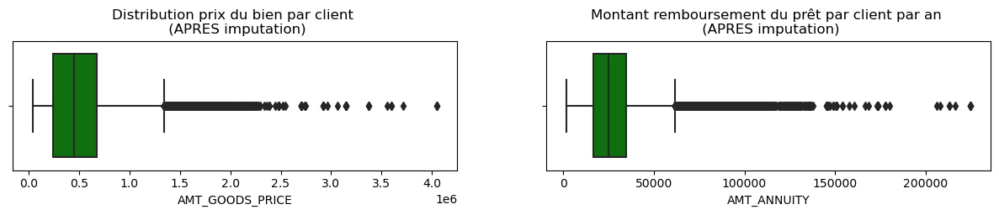

In [108]:
# On affiche les boxplots des données après imputation
fig, axes = plt.subplots(1, 2, figsize=(15, 2))

# Boxplot du prix du bien (après imputation)
sns.boxplot(x=application_clean['AMT_GOODS_PRICE'], ax=axes[0], color='g')
axes[0].set_title('Distribution prix du bien par client \n (APRES imputation)')

sns.boxplot(x=application_clean['AMT_ANNUITY'], ax=axes[1], color='g')
axes[1].set_title('Montant remboursement du prêt par client par an \n (APRES imputation)')

plt.show()

In [109]:
val_manq_somme = application_clean.isnull().sum()
val_manq_somme[val_manq_somme > 0]

CNT_FAM_MEMBERS           2
DAYS_LAST_PHONE_CHANGE    1
dtype: int64

Nous n'observons pas de changement dans la distribution des données après imputation par IterativeImputer.

- <u>**Nombre de membres dans la famille du client**</u>

On choisit à nouveau d'imputer par la valeur la plus fréquente.

In [110]:
most_freq = var_num['CNT_FAM_MEMBERS'].value_counts().reset_index().iloc[0,0]
application_clean['CNT_FAM_MEMBERS'] = application_clean['CNT_FAM_MEMBERS'].fillna(most_freq)

- <u>**Nombre de jours avant la demande du changement de téléphone**</u>

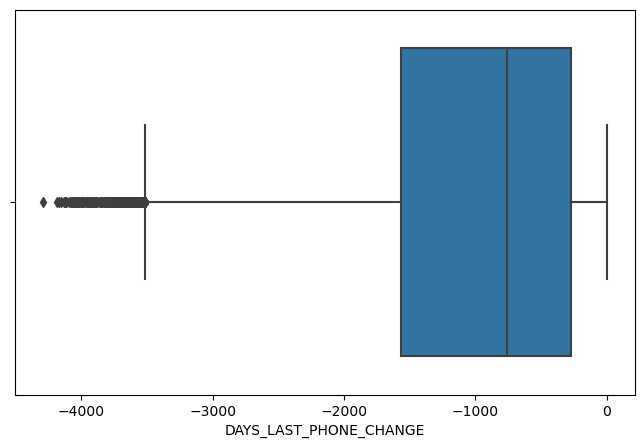

In [111]:
# Affichons la distribution des données
plt.figure(figsize=(8,5))
sns.boxplot(x=application_clean['DAYS_LAST_PHONE_CHANGE'])
plt.show()

Imputation des valeurs manquantes par la valeur la plus fréquente. 

In [112]:
most_freq = var_num['DAYS_LAST_PHONE_CHANGE'].value_counts().reset_index().iloc[0,0]
application_clean['DAYS_LAST_PHONE_CHANGE'] = application_clean['DAYS_LAST_PHONE_CHANGE'].fillna(most_freq)

Vérifions maintenant le nombre de valeurs manquantes dans notre dataframe. 

In [113]:
val_manq_somme = application_clean.isnull().sum()
val_manq_somme[val_manq_somme > 0]

Series([], dtype: int64)

### 2.1.5. Doublons

In [114]:
application_clean[application_clean.duplicated()].shape[0]

0

Pas de doublons observés. 

### 2.1.6. Corrélations

#### a. Variables catégorielles

Nous allons effectuer une heatmap des corrélations pour les variables catégorielles. 
Dans un premier temps, nous considérons la variable 'TARGET' en tant que variable catégorielle. 

Ensuite, nous utilisons **l'indice de similarité** (coefficient de Spearman) afin de mesurer la relation entre 2 variables. Pour cela, les variables catégorielles sont converties en variables numériques à l'aide de la méthode "astype('cat').cat.codes". 

In [115]:
# On sélectionne les variables catégorielles
var_categ = application_clean.select_dtypes(include=['object']) 
var_categ.columns.tolist()

# Concaténation des variables catégorielles avec les variables binaires et la target
var_categ = pd.concat([var_categ] + [application_clean[['TARGET']]], axis=1)

# On veut qu'elles soient considérées comme des variables catégorielles
var_categ['TARGET'] = var_categ['TARGET'].astype('object')

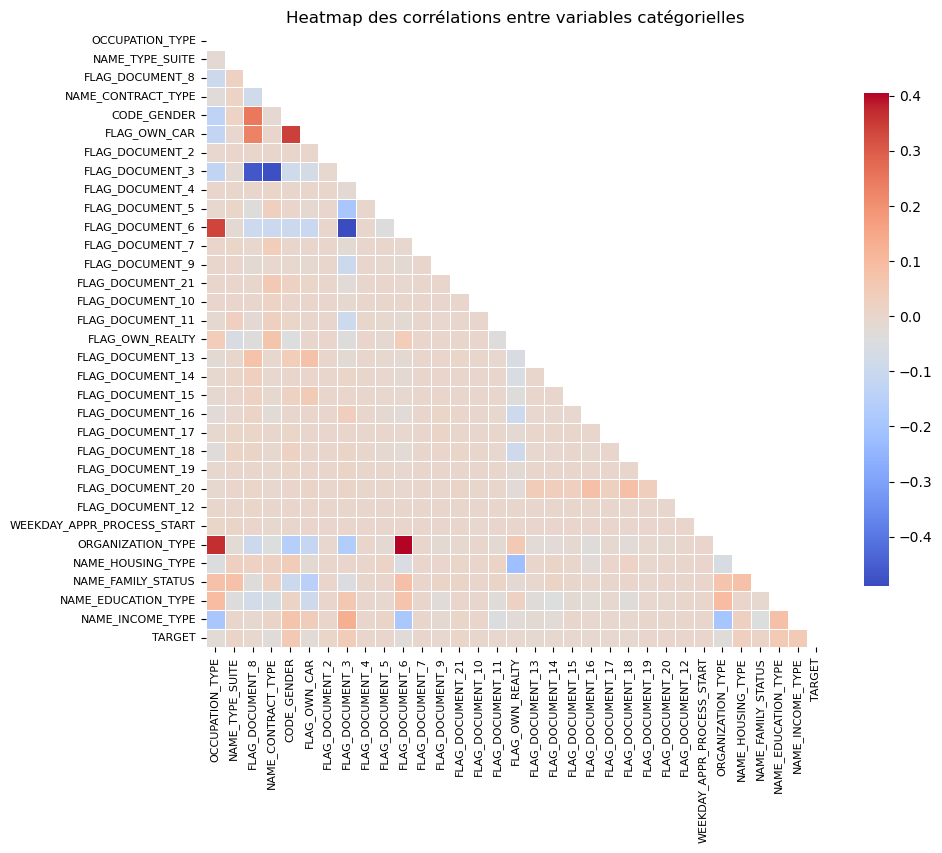

In [116]:
# Créer une copie des variables catégorielles pour effectuer les modifications
var_categ_encoded = var_categ.copy()

# Convertir les catégories en codes numériques
for column in var_categ_encoded.columns:
    var_categ_encoded[column] = var_categ_encoded[column].astype('category').cat.codes

# Calculer la matrice de corrélation
correlation_matrix = var_categ_encoded.corr(method='spearman')

# Créer une masque pour la moitié inférieure de la matrice de corrélation
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Afficher la heatmap
plt.figure(figsize=(10, 8))
heatmap = sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', linewidths=0.5,
            cbar_kws={"shrink": 0.8}, mask=mask)
plt.title('Heatmap des corrélations entre variables catégorielles', fontsize=12)

heatmap.set_xticklabels(heatmap.get_xticklabels(), size=8)
heatmap.set_yticklabels(heatmap.get_yticklabels(), size=8)

plt.show()


In [117]:
# Calculer les corrélations avec la variable spécifique
correlations = correlation_matrix.loc[:, 'TARGET'].sort_values(ascending=False)

# Sélectionner les 3 premières variables les plus corrélées
top_3_correlated_variables = correlations[1:4].index.tolist()

# Afficher les résultats avec les valeurs de corrélation
print(f"Les 3 premières variables les plus corrélées avec 'TARGET' sont :")
for variable in top_3_correlated_variables:
    correlation_value = correlation_matrix.loc[variable, 'TARGET']
    print(f"{variable}: {correlation_value:.2f}")

Les 3 premières variables les plus corrélées avec 'TARGET' sont :
CODE_GENDER: 0.06
NAME_EDUCATION_TYPE: 0.05
NAME_INCOME_TYPE: 0.05


La variable "ORGANIZATION_TYPE" et "OCCUPATION_TYPE" sont les plus corrélées. Nous observons également une corrélation entre FLAG_DOCUMENT_6 et ORGANIZATION_TYPE. FLAG_OWN_CAR est également corrélé au CODE_GENDER. Nous observons que les variables les plus corrélées à la variable cible concernent "NAME_INCOME_TYPE", "CODE_GENDER" et "NAME_EDUCATION_TYPE". Cela laisse penser que le sexe du client, le type de revenu et le niveau scolaire du client peuvent être légèrement liés à son défaut de paiement. 

#### b. Variables numériques

In [118]:
# On sélectionne à nouveau les variables numériques
var_num = application_clean.select_dtypes(include=['float64', 'int'])
var_num.columns

Index(['EXT_SOURCE_3', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR', 'OBS_30_CNT_SOCIAL_CIRCLE',
       'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'EXT_SOURCE_2', 'AMT_GOODS_PRICE',
       'AMT_ANNUITY', 'CNT_FAM_MEMBERS', 'DAYS_LAST_PHONE_CHANGE',
       'CNT_CHILDREN', 'AMT_CREDIT', 'AMT_INCOME_TOTAL', 'FLAG_PHONE',
       'LIVE_CITY_NOT_WORK_CITY', 'REG_CITY_NOT_WORK_CITY', 'TARGET',
       'REG_CITY_NOT_LIVE_CITY', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_REGION_NOT_WORK_REGION', 'REG_REGION_NOT_LIVE_REGION',
       'HOUR_APPR_PROCESS_START', 'REGION_RATING_CLIENT_W_CITY',
       'REGION_RATING_CLIENT', 'FLAG_EMAIL', 'FLAG_CONT_MOBILE',
       'FLAG_WORK_PHONE', 'FLAG_EMP_PHONE', 'FLAG_MOBIL', 'DAYS_ID_PUBLISH',
       'DAYS_REGISTRATION', 'DAYS_EMPLOYED', 'DAYS_BIRTH',
       'REGIO

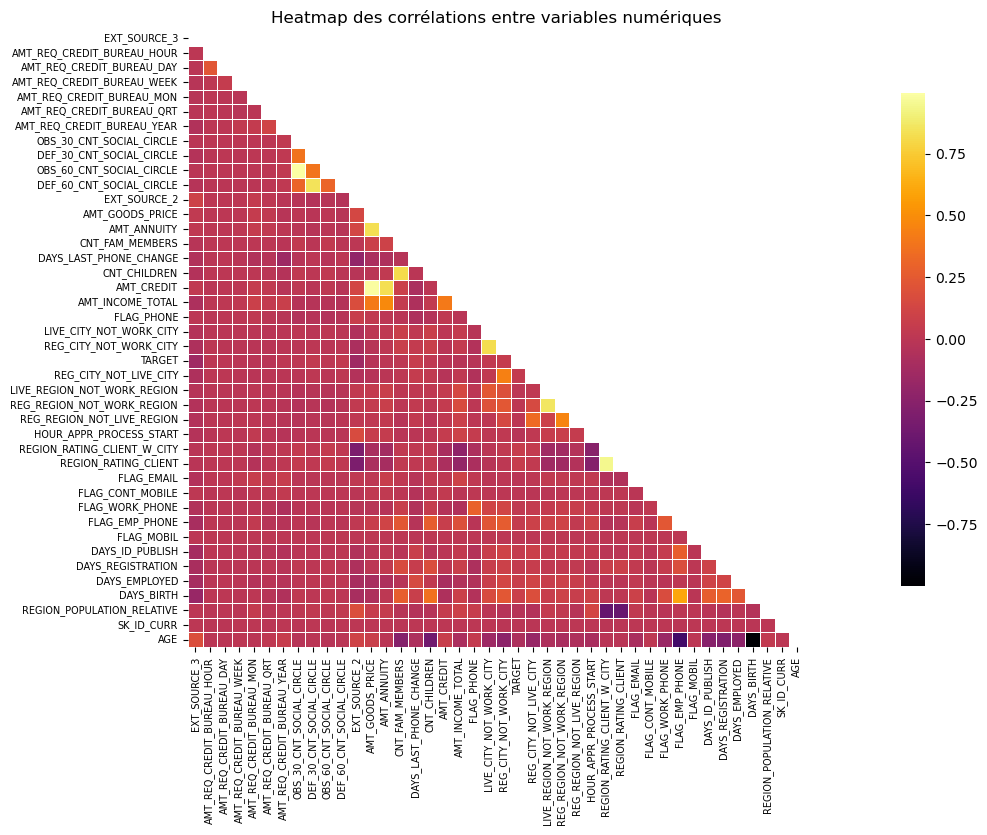

In [119]:
# Calculer la matrice de corrélation
correlation_matrix = var_num.corr(method='spearman')

# Créer une masque pour la moitié inférieure de la matrice de corrélation
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Afficher la heatmap
plt.figure(figsize=(25, 8))
heatmap = sns.heatmap(correlation_matrix, square=True, annot=False, annot_kws={"size": 7},
            fmt=".2f", cmap='inferno', linewidths=0.5, mask=mask, cbar_kws={"shrink": 0.8})
heatmap.set_xticklabels(heatmap.get_xticklabels(), size=7)
heatmap.set_yticklabels(heatmap.get_yticklabels(), size=7)
plt.title('Heatmap des corrélations entre variables numériques', fontsize=12)
plt.show()

In [120]:
# Calculer les corrélations avec la variable spécifique
correlations = correlation_matrix.loc[:, 'TARGET'].sort_values(ascending=False)

# Sélectionner les 3 premières variables les plus corrélées
top_3_correlated_variables = correlations[1:4].index.tolist()

# Afficher les résultats avec les valeurs de corrélation
print(f"Les 3 premières variables les plus corrélées avec 'TARGET' sont :")
for variable in top_3_correlated_variables:
    correlation_value = correlation_matrix.loc[variable, 'TARGET']
    print(f"{variable}: {correlation_value:.2f}")

Les 3 premières variables les plus corrélées avec 'TARGET' sont :
DAYS_BIRTH: 0.08
DAYS_EMPLOYED: 0.08
REGION_RATING_CLIENT_W_CITY: 0.06


Nous observons certaines corrélations entre les variables numériques comme par exemple nos 3 variables concernant le crédit (AMT_ANNUITY, AMT_GOODS_PRICE, AMT_CREDIT). 
Les variables les plus corrélées à la Target concernent l'age du client en jours avant la demande (DAYS_BIRTH), le nombre de jours où le client a effectué son emploi (DAYS_EMPLOYED) et la région où vit le client (REGION_RATING_CLIENT_W_CITY). 

In [121]:
# On enregistre notre df nettoyé avant de l'encoder
application_clean.to_csv('application_clean.csv', sep=';', index=False)

## 2.2. Feature engineering

Une fois que nous avons traité les valeurs manquantes, l'idée est de créer de nouvelles variables à partir de celles que nous avons dans notre dataframe initial. Pour cela, nous allons nous baser sur le kernel ayant remporté la compétition Kaggle afin d'effectuer notre feature engineering. 

Dans un premier temps, nous allons utiliser la fonction one-hot-encoder afin de transformer les variables catégorielles en numériques avec get_dummies. 

In [122]:
# One-hot encoding pour les variables catégorielles avec get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

Convertir les valeurs négatives en valeurs positives et les convertir en années pour certaines colonnes (DAYS_EMPLOYED, DAYS_BIRTH, DAYS_REGISTRATION, DAYS_ID_PUBLISH, DAYS_LAST_PHONE_CHANGE).

In [123]:
# On transforme nos colonnes dont les valeurs sont négatives en valeurs positives et en années
# pour celles concernées
application_clean['YEARS_EMPLOYED'] = abs(round(application_clean['DAYS_EMPLOYED']/365, 2))
application_clean['YEARS_REGISTRATION'] = abs(round(application_clean['DAYS_REGISTRATION']/365, 2))
application_clean['YEARS_ID_PUBLISH'] = abs(round(application_clean['DAYS_ID_PUBLISH']/365, 2))
application_clean['YEARS_LAST_PHONE_CHANGE'] = abs(round(application_clean['DAYS_LAST_PHONE_CHANGE']/365, 2))

Maintenant, nous allons effectuer notre feature engineering. 

In [124]:
# On crée deux listes, l'une contenant les variables dont le nom contient "FLAG_DOC"
# et l'autre contenant les variables contenant uniquement "FLAG_"
docs = [_f for _f in df.columns if 'FLAG_DOC' in _f]
live = [_f for _f in df.columns if ('FLAG_' in _f) & ('FLAG_DOC' not in _f) & ('_FLAG_' not in _f)]

In [125]:
# Calcul du revenu median par type d'organisation
inc_by_org = application_clean[['AMT_INCOME_TOTAL', 'ORGANIZATION_TYPE']].groupby('ORGANIZATION_TYPE').median()['AMT_INCOME_TOTAL']

In [126]:
# Durée de remboursement (en années)
application_clean['NEW_CREDIT_TO_ANNUITY_RATIO'] = application_clean['AMT_CREDIT'] / application_clean['AMT_ANNUITY']

# Taux de remboursement (sur 1 an)
application_clean['NEW_REFUND_PERCENT'] = application_clean['AMT_ANNUITY'] / application_clean['AMT_CREDIT'] * 100

# Ratio crédit-valeur (proportion du montant du crédit par rapport à la valeur du bien)
application_clean['NEW_CREDIT_TO_GOODS_RATIO'] = application_clean['AMT_CREDIT'] / application_clean['AMT_GOODS_PRICE']

# Revenu par personne selon le nombre de membres dans le ménage
application_clean['NEW_INCOME_PER_PERSON'] = application_clean['AMT_INCOME_TOTAL'] / application_clean['CNT_FAM_MEMBERS']

# On applique le calcul du revenu médian pour chaque type d'organisation
application_clean['NEW_INC_BY_ORG'] = application_clean['ORGANIZATION_TYPE'].map(inc_by_org)

# Proportion de jours de la vie travaillés
application_clean['NEW_EMPLOY_TO_BIRTH_RATIO'] = application_clean['YEARS_EMPLOYED'] / application_clean['AGE']

# Taux d'endettement (Taux élevé = rente de prêt représentant une part importante du revenu) 
application_clean['NEW_ANNUITY_TO_INCOME_PERCENT'] = application_clean['AMT_ANNUITY'] / application_clean['AMT_INCOME_TOTAL'] * 100

# Fréquence à laquelle un client change de téléphone par rapport à son age
application_clean['NEW_PHONE_TO_BIRTH_RATIO'] = application_clean['YEARS_LAST_PHONE_CHANGE'] / application_clean['AGE']

# Fréquence à laquelle un client change de téléphone par rapport à sa période travaillée
application_clean['NEW_PHONE_TO_EMPLOY_RATIO'] = application_clean['YEARS_LAST_PHONE_CHANGE'] / application_clean['YEARS_EMPLOYED']

# Ratio évaluant la part empruntée par rapport à son revenu
application_clean['NEW_CREDIT_TO_INCOME_RATIO'] = application_clean['AMT_CREDIT'] / application_clean['AMT_INCOME_TOTAL']

# Taux de crédit sur le revenu
application_clean['NEW_INCOME_CREDIT_PERCENT'] = application_clean['AMT_INCOME_TOTAL'] / application_clean['AMT_CREDIT'] * 100

In [127]:
# On encode les variables catégorielles avec des variables binaires (0 ou 1)
for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
    application_clean[bin_feature], uniques = pd.factorize(application_clean[bin_feature])

# On encode les variables catégorielles avec la fonction one-hot-encoder
application_clean, cat_cols = one_hot_encoder(application_clean, nan_as_category=False)

In [128]:
application_clean.head()

,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,EXT_SOURCE_2,AMT_GOODS_PRICE,AMT_ANNUITY,CNT_FAM_MEMBERS,DAYS_LAST_PHONE_CHANGE,CNT_CHILDREN,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_CREDIT,AMT_INCOME_TOTAL,FLAG_PHONE,LIVE_CITY_NOT_WORK_CITY,REG_CITY_NOT_WORK_CITY,TARGET,REG_CITY_NOT_LIVE_CITY,LIVE_REGION_NOT_WORK_REGION,REG_REGION_NOT_WORK_REGION,REG_REGION_NOT_LIVE_REGION,HOUR_APPR_PROCESS_START,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,FLAG_EMAIL,FLAG_CONT_MOBILE,FLAG_WORK_PHONE,FLAG_EMP_PHONE,FLAG_MOBIL,DAYS_ID_PUBLISH,DAYS_REGISTRATION,DAYS_EMPLOYED,DAYS_BIRTH,REGION_POPULATION_RELATIVE,SK_ID_CURR,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,YEARS_LAST_PHONE_CHANGE,NEW_CREDIT_TO_ANNUITY_RATIO,NEW_REFUND_PERCENT,NEW_CREDIT_TO_GOODS_RATIO,NEW_INCOME_PER_PERSON,NEW_INC_BY_ORG,NEW_EMPLOY_TO_BIRTH_RATIO,NEW_ANNUITY_TO_INCOME_PERCENT,NEW_PHONE_TO_BIRTH_RATIO,NEW_PHONE_TO_EMPLOY_RATIO,NEW_CREDIT_TO_INCOME_RATIO,NEW_INCOME_CREDIT_PERCENT,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Unknown,OCCUPATION_TYPE_Waiters/barmen staff,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,FLAG_DOCUMENT_8_0,FLAG_DOCUMENT_8_1,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,FLAG_DOCUMENT_2_0,FLAG_DOCUMENT_2_1,FLAG_DOCUMENT_3_0,FLAG_DOCUMENT_3_1,FLAG_DOCUMENT_4_0,FLAG_DOCUMENT_4_1,FLAG_DOCUMENT_5_0,FLAG_DOCUMENT_5_1,FLAG_DOCUMENT_6_0,FLAG_DOCUMENT_6_1,FLAG_DOCUMENT_7_0,FLAG_DOCUMENT_7_1,FLAG_DOCUMENT_9_0,FLAG_DOCUMENT_9_1,FLAG_DOCUMENT_21_0,FLAG_DOCUMENT_21_1,FLAG_DOCUMENT_10_0,FLAG_DOCUMENT_10_1,FLAG_DOCUMENT_11_0,FLAG_DOCUMENT_11_1,FLAG_DOCUMENT_13_0,FLAG_DOCUMENT_13_1,FLAG_DOCUMENT_14_0,FLAG_DOCUMENT_14_1,FLAG_DOCUMENT_15_0,FLAG_DOCUMENT_15_1,FLAG_DOCUMENT_16_0,FLAG_DOCUMENT_16_1,FLAG_DOCUMENT_17_0,FLAG_DOCUMENT_17_1,FLAG_DOCUMENT_18_0,FLAG_DOCUMENT_18_1,FLAG_DOCUMENT_19_0,FLAG_DOCUMENT_19_1,FLAG_DOCUMENT_20_0,FLAG_DOCUMENT_20_1,FLAG_DOCUMENT_12_0,FLAG_DOCUMENT_12_1,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Services,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Military,ORGANIZATION_TYPE_Mobile,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_Police,ORGANIZATION_TYPE_Postal,ORGANIZATION_TYPE_Realtor,ORGANIZATION_TYPE_Religion,ORGANIZATION_TYPE_Restaurant,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Security,ORGANIZATION_TYPE_Security Ministries,ORGANIZATION_TYPE_Self-employed,ORGANIZATION_TYPE_Services,ORGANIZATION_TYPE_Telecom,ORGANIZATION_TYPE_Trade,ORGANIZATION_TYPE_Transport,ORGANIZATION_TYPE_University,ORGANIZATION_TYPE_Unknown,NAME_HOUSING_TYPE_Co-op a

In [129]:
# Vérifions les valeurs manquantes ou infinies
application_clean.columns[application_clean.apply(lambda x: x.isna().any() or np.isinf(x).any())].tolist()

['NEW_PHONE_TO_EMPLOY_RATIO']

Nous allons afficher la variable "NEW_PHONE_TO_EMPLOY_RATIO".

In [130]:
# Affichons la valeur manquante ou infinie
print(application_clean['NEW_PHONE_TO_EMPLOY_RATIO'].isnull().sum(), 'valeur manquante.')
display(application_clean[application_clean['NEW_PHONE_TO_EMPLOY_RATIO'].isnull()])

print(np.isinf(application_clean['NEW_PHONE_TO_EMPLOY_RATIO']).sum(), 'valeurs infinies.')
application_clean.loc[np.isinf(application_clean['NEW_PHONE_TO_EMPLOY_RATIO'])]

1 valeur manquante.


,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,EXT_SOURCE_2,AMT_GOODS_PRICE,AMT_ANNUITY,CNT_FAM_MEMBERS,DAYS_LAST_PHONE_CHANGE,CNT_CHILDREN,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_CREDIT,AMT_INCOME_TOTAL,FLAG_PHONE,LIVE_CITY_NOT_WORK_CITY,REG_CITY_NOT_WORK_CITY,TARGET,REG_CITY_NOT_LIVE_CITY,LIVE_REGION_NOT_WORK_REGION,REG_REGION_NOT_WORK_REGION,REG_REGION_NOT_LIVE_REGION,HOUR_APPR_PROCESS_START,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,FLAG_EMAIL,FLAG_CONT_MOBILE,FLAG_WORK_PHONE,FLAG_EMP_PHONE,FLAG_MOBIL,DAYS_ID_PUBLISH,DAYS_REGISTRATION,DAYS_EMPLOYED,DAYS_BIRTH,REGION_POPULATION_RELATIVE,SK_ID_CURR,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,YEARS_LAST_PHONE_CHANGE,NEW_CREDIT_TO_ANNUITY_RATIO,NEW_REFUND_PERCENT,NEW_CREDIT_TO_GOODS_RATIO,NEW_INCOME_PER_PERSON,NEW_INC_BY_ORG,NEW_EMPLOY_TO_BIRTH_RATIO,NEW_ANNUITY_TO_INCOME_PERCENT,NEW_PHONE_TO_BIRTH_RATIO,NEW_PHONE_TO_EMPLOY_RATIO,NEW_CREDIT_TO_INCOME_RATIO,NEW_INCOME_CREDIT_PERCENT,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Unknown,OCCUPATION_TYPE_Waiters/barmen staff,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,FLAG_DOCUMENT_8_0,FLAG_DOCUMENT_8_1,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,FLAG_DOCUMENT_2_0,FLAG_DOCUMENT_2_1,FLAG_DOCUMENT_3_0,FLAG_DOCUMENT_3_1,FLAG_DOCUMENT_4_0,FLAG_DOCUMENT_4_1,FLAG_DOCUMENT_5_0,FLAG_DOCUMENT_5_1,FLAG_DOCUMENT_6_0,FLAG_DOCUMENT_6_1,FLAG_DOCUMENT_7_0,FLAG_DOCUMENT_7_1,FLAG_DOCUMENT_9_0,FLAG_DOCUMENT_9_1,FLAG_DOCUMENT_21_0,FLAG_DOCUMENT_21_1,FLAG_DOCUMENT_10_0,FLAG_DOCUMENT_10_1,FLAG_DOCUMENT_11_0,FLAG_DOCUMENT_11_1,FLAG_DOCUMENT_13_0,FLAG_DOCUMENT_13_1,FLAG_DOCUMENT_14_0,FLAG_DOCUMENT_14_1,FLAG_DOCUMENT_15_0,FLAG_DOCUMENT_15_1,FLAG_DOCUMENT_16_0,FLAG_DOCUMENT_16_1,FLAG_DOCUMENT_17_0,FLAG_DOCUMENT_17_1,FLAG_DOCUMENT_18_0,FLAG_DOCUMENT_18_1,FLAG_DOCUMENT_19_0,FLAG_DOCUMENT_19_1,FLAG_DOCUMENT_20_0,FLAG_DOCUMENT_20_1,FLAG_DOCUMENT_12_0,FLAG_DOCUMENT_12_1,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Services,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Military,ORGANIZATION_TYPE_Mobile,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_Police,ORGANIZATION_TYPE_Postal,ORGANIZATION_TYPE_Realtor,ORGANIZATION_TYPE_Religion,ORGANIZATION_TYPE_Restaurant,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Security,ORGANIZATION_TYPE_Security Ministries,ORGANIZATION_TYPE_Self-employed,ORGANIZATION_TYPE_Services,ORGANIZATION_TYPE_Telecom,ORGANIZATION_TYPE_Trade,ORGANIZATION_TYPE_Transport,ORGANIZATION_TYPE_University,ORGANIZATION_TYPE_Unknown,NAME_HOUSING_TYPE_Co-op a

2 valeurs infinies.


,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,EXT_SOURCE_2,AMT_GOODS_PRICE,AMT_ANNUITY,CNT_FAM_MEMBERS,DAYS_LAST_PHONE_CHANGE,CNT_CHILDREN,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_CREDIT,AMT_INCOME_TOTAL,FLAG_PHONE,LIVE_CITY_NOT_WORK_CITY,REG_CITY_NOT_WORK_CITY,TARGET,REG_CITY_NOT_LIVE_CITY,LIVE_REGION_NOT_WORK_REGION,REG_REGION_NOT_WORK_REGION,REG_REGION_NOT_LIVE_REGION,HOUR_APPR_PROCESS_START,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,FLAG_EMAIL,FLAG_CONT_MOBILE,FLAG_WORK_PHONE,FLAG_EMP_PHONE,FLAG_MOBIL,DAYS_ID_PUBLISH,DAYS_REGISTRATION,DAYS_EMPLOYED,DAYS_BIRTH,REGION_POPULATION_RELATIVE,SK_ID_CURR,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,YEARS_LAST_PHONE_CHANGE,NEW_CREDIT_TO_ANNUITY_RATIO,NEW_REFUND_PERCENT,NEW_CREDIT_TO_GOODS_RATIO,NEW_INCOME_PER_PERSON,NEW_INC_BY_ORG,NEW_EMPLOY_TO_BIRTH_RATIO,NEW_ANNUITY_TO_INCOME_PERCENT,NEW_PHONE_TO_BIRTH_RATIO,NEW_PHONE_TO_EMPLOY_RATIO,NEW_CREDIT_TO_INCOME_RATIO,NEW_INCOME_CREDIT_PERCENT,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Unknown,OCCUPATION_TYPE_Waiters/barmen staff,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,FLAG_DOCUMENT_8_0,FLAG_DOCUMENT_8_1,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,FLAG_DOCUMENT_2_0,FLAG_DOCUMENT_2_1,FLAG_DOCUMENT_3_0,FLAG_DOCUMENT_3_1,FLAG_DOCUMENT_4_0,FLAG_DOCUMENT_4_1,FLAG_DOCUMENT_5_0,FLAG_DOCUMENT_5_1,FLAG_DOCUMENT_6_0,FLAG_DOCUMENT_6_1,FLAG_DOCUMENT_7_0,FLAG_DOCUMENT_7_1,FLAG_DOCUMENT_9_0,FLAG_DOCUMENT_9_1,FLAG_DOCUMENT_21_0,FLAG_DOCUMENT_21_1,FLAG_DOCUMENT_10_0,FLAG_DOCUMENT_10_1,FLAG_DOCUMENT_11_0,FLAG_DOCUMENT_11_1,FLAG_DOCUMENT_13_0,FLAG_DOCUMENT_13_1,FLAG_DOCUMENT_14_0,FLAG_DOCUMENT_14_1,FLAG_DOCUMENT_15_0,FLAG_DOCUMENT_15_1,FLAG_DOCUMENT_16_0,FLAG_DOCUMENT_16_1,FLAG_DOCUMENT_17_0,FLAG_DOCUMENT_17_1,FLAG_DOCUMENT_18_0,FLAG_DOCUMENT_18_1,FLAG_DOCUMENT_19_0,FLAG_DOCUMENT_19_1,FLAG_DOCUMENT_20_0,FLAG_DOCUMENT_20_1,FLAG_DOCUMENT_12_0,FLAG_DOCUMENT_12_1,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Services,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Military,ORGANIZATION_TYPE_Mobile,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_Police,ORGANIZATION_TYPE_Postal,ORGANIZATION_TYPE_Realtor,ORGANIZATION_TYPE_Religion,ORGANIZATION_TYPE_Restaurant,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Security,ORGANIZATION_TYPE_Security Ministries,ORGANIZATION_TYPE_Self-employed,ORGANIZATION_TYPE_Services,ORGANIZATION_TYPE_Telecom,ORGANIZATION_TYPE_Trade,ORGANIZATION_TYPE_Transport,ORGANIZATION_TYPE_University,ORGANIZATION_TYPE_Unknown,NAME_HOUSING_TYPE_Co-op a

Nous remplaçons les valeurs infinies par NaN.

In [131]:
# Remplacer les valeurs infinies par NaN dans le DataFrame
application_clean['NEW_PHONE_TO_EMPLOY_RATIO'].replace([np.inf, -np.inf], np.nan, inplace=True)

In [132]:
# Affichons les valeurs manquantes
print(application_clean['NEW_PHONE_TO_EMPLOY_RATIO'].isnull().sum(), 'valeur manquante.')
display(application_clean[application_clean['NEW_PHONE_TO_EMPLOY_RATIO'].isnull()])

3 valeur manquante.


,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,EXT_SOURCE_2,AMT_GOODS_PRICE,AMT_ANNUITY,CNT_FAM_MEMBERS,DAYS_LAST_PHONE_CHANGE,CNT_CHILDREN,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_CREDIT,AMT_INCOME_TOTAL,FLAG_PHONE,LIVE_CITY_NOT_WORK_CITY,REG_CITY_NOT_WORK_CITY,TARGET,REG_CITY_NOT_LIVE_CITY,LIVE_REGION_NOT_WORK_REGION,REG_REGION_NOT_WORK_REGION,REG_REGION_NOT_LIVE_REGION,HOUR_APPR_PROCESS_START,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,FLAG_EMAIL,FLAG_CONT_MOBILE,FLAG_WORK_PHONE,FLAG_EMP_PHONE,FLAG_MOBIL,DAYS_ID_PUBLISH,DAYS_REGISTRATION,DAYS_EMPLOYED,DAYS_BIRTH,REGION_POPULATION_RELATIVE,SK_ID_CURR,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,YEARS_LAST_PHONE_CHANGE,NEW_CREDIT_TO_ANNUITY_RATIO,NEW_REFUND_PERCENT,NEW_CREDIT_TO_GOODS_RATIO,NEW_INCOME_PER_PERSON,NEW_INC_BY_ORG,NEW_EMPLOY_TO_BIRTH_RATIO,NEW_ANNUITY_TO_INCOME_PERCENT,NEW_PHONE_TO_BIRTH_RATIO,NEW_PHONE_TO_EMPLOY_RATIO,NEW_CREDIT_TO_INCOME_RATIO,NEW_INCOME_CREDIT_PERCENT,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Unknown,OCCUPATION_TYPE_Waiters/barmen staff,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,FLAG_DOCUMENT_8_0,FLAG_DOCUMENT_8_1,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,FLAG_DOCUMENT_2_0,FLAG_DOCUMENT_2_1,FLAG_DOCUMENT_3_0,FLAG_DOCUMENT_3_1,FLAG_DOCUMENT_4_0,FLAG_DOCUMENT_4_1,FLAG_DOCUMENT_5_0,FLAG_DOCUMENT_5_1,FLAG_DOCUMENT_6_0,FLAG_DOCUMENT_6_1,FLAG_DOCUMENT_7_0,FLAG_DOCUMENT_7_1,FLAG_DOCUMENT_9_0,FLAG_DOCUMENT_9_1,FLAG_DOCUMENT_21_0,FLAG_DOCUMENT_21_1,FLAG_DOCUMENT_10_0,FLAG_DOCUMENT_10_1,FLAG_DOCUMENT_11_0,FLAG_DOCUMENT_11_1,FLAG_DOCUMENT_13_0,FLAG_DOCUMENT_13_1,FLAG_DOCUMENT_14_0,FLAG_DOCUMENT_14_1,FLAG_DOCUMENT_15_0,FLAG_DOCUMENT_15_1,FLAG_DOCUMENT_16_0,FLAG_DOCUMENT_16_1,FLAG_DOCUMENT_17_0,FLAG_DOCUMENT_17_1,FLAG_DOCUMENT_18_0,FLAG_DOCUMENT_18_1,FLAG_DOCUMENT_19_0,FLAG_DOCUMENT_19_1,FLAG_DOCUMENT_20_0,FLAG_DOCUMENT_20_1,FLAG_DOCUMENT_12_0,FLAG_DOCUMENT_12_1,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Services,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Military,ORGANIZATION_TYPE_Mobile,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_Police,ORGANIZATION_TYPE_Postal,ORGANIZATION_TYPE_Realtor,ORGANIZATION_TYPE_Religion,ORGANIZATION_TYPE_Restaurant,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Security,ORGANIZATION_TYPE_Security Ministries,ORGANIZATION_TYPE_Self-employed,ORGANIZATION_TYPE_Services,ORGANIZATION_TYPE_Telecom,ORGANIZATION_TYPE_Trade,ORGANIZATION_TYPE_Transport,ORGANIZATION_TYPE_University,ORGANIZATION_TYPE_Unknown,NAME_HOUSING_TYPE_Co-op a

In [133]:
# On va transformer ces valeurs manquantes en les remplaçant par la valeur médiane
imputer = SimpleImputer(strategy='median')

# Remplacer les valeurs manquantes par la valeur médiane
application_clean[['NEW_PHONE_TO_EMPLOY_RATIO']] = imputer.fit_transform(application_clean[['NEW_PHONE_TO_EMPLOY_RATIO']])

In [134]:
val_manq_somme = application_clean.isnull().sum()
val_manq_somme[val_manq_somme > 0]

Series([], dtype: int64)

# 3. Fichiers bureau et bureau_balance.csv

In [135]:
display(bureau.head())
display(bureau_balance.head())

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


## 3.1. Analyse exploratoire et nettoyage des données

In [136]:
# Affichage des dimensions de nos fichiers
print('Fichier bureau.csv :')
print('Nos fichiers sont constitués de', bureau.shape[0], 'lignes et de', bureau.shape[1], 'colonnes')

print('Fichier bureau_balance.csv :')
print('Nos fichiers sont constitués de', bureau_balance.shape[0], 'lignes et de', bureau_balance.shape[1], 'colonnes')

Fichier bureau.csv :
Nos fichiers sont constitués de 1716428 lignes et de 17 colonnes
Fichier bureau_balance.csv :
Nos fichiers sont constitués de 27299925 lignes et de 3 colonnes


Dans notre fichier "home_credit", la variable "SK_ID_BUREAU" est nommée "SK_BUREAU_ID", on va donc la renommer dans notre dataframe. 

In [137]:
bureau = bureau.rename(columns={'SK_ID_BUREAU':'SK_BUREAU_ID'})
bureau_balance = bureau_balance.rename(columns={'SK_ID_BUREAU':'SK_BUREAU_ID'})

In [138]:
# Fonction affichant les valeurs manquantes avec missingno

def val_manq_msno(df):

    # On compte le nombre de valeurs manquantes pour chaque variable
    val_manq_count = df.isnull().sum()

    # DataFrame contenant le nombre de valeurs manquantes pour chaque variable
    val_manq_df = pd.DataFrame({'Variable': val_manq_count.index, 'Missing Values': val_manq_count.values})

    # On trie le DataFrame en fonction du nombre de valeurs manquantes, en ordre décroissant
    val_manq_sorted = val_manq_df.sort_values(by='Missing Values', ascending=False)

    # Calcul du pourcentage de valeurs manquantes par rapport à la taille du DataFrame
    pourcentage_manq = (val_manq_sorted['Missing Values'] / len(df)) * 100

    # Ajout colonne au DataFrame avec les pourcentages de valeurs manquantes
    val_manq_sorted['Missing Percentage'] = pourcentage_manq

    # Création du graphique en utilisant msno.bar()
    msno.bar(df[val_manq_sorted['Variable']])

    # Personnalisation de l'axe x
    plt.xticks(size = 18)

    # Ajout de la ligne verticale
    plt.axhline(y=0.7, color='red', linestyle='--', linewidth=3)

    # Affichage du graphique
    plt.show()

- <u>**Bureau.csv**</u>

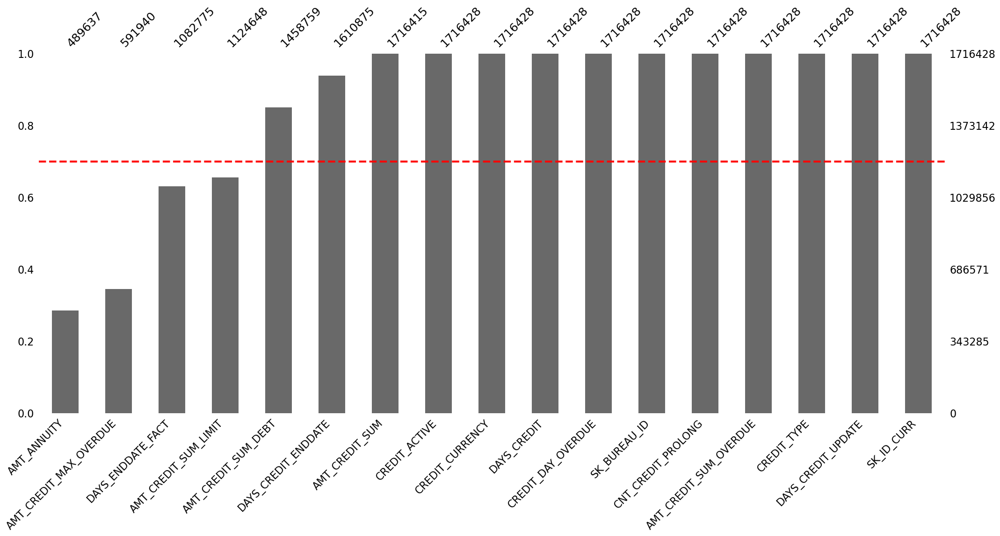

In [139]:
# On affiche les valeurs manquantes pour bureau.csv et bureau_balance.csv
val_manq_msno(bureau)

- <u>**Bureau_balance.csv**</u>

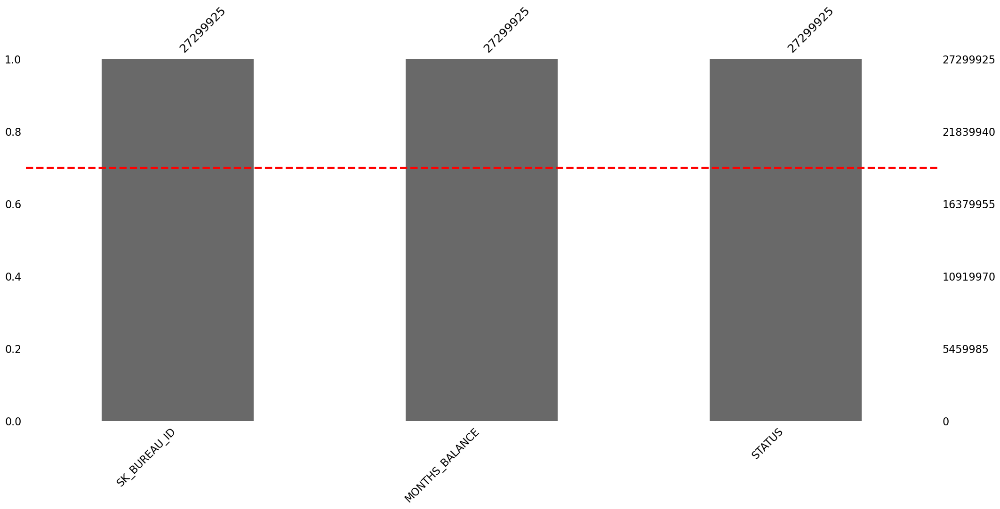

In [140]:
val_manq_msno(bureau_balance)

On observe 4 variables pour le fichier balance.csv avec un grand nombre de valeurs manquantes (> 30%).

In [141]:
# Dans un premier temps, nous allons placer d'un côté les variables catégorielles
# et d'un autre les variables numériques pour chaque fichier

print('FICHIER BUREAU.CSV :')

var_cat_bureau = bureau.select_dtypes(include='object')
print('Variables catégorielles')
print(var_cat_bureau.columns)
print('--------------')
print('Variables numériques')
var_num_bureau = bureau.select_dtypes(include=['int64', 'float64'])
print(var_num_bureau.columns)

print('\n')
print('FICHIER BUREAU_BALANCE.CSV :')
var_cat_bb = bureau_balance.select_dtypes(include='object')
print('Variables catégorielles')
print(var_cat_bb.columns)
print('--------------')
print('Variables numériques')
var_num_bb = bureau_balance.select_dtypes(include=['int64', 'float64'])
print(var_num_bb.columns)

FICHIER BUREAU.CSV :
Variables catégorielles
Index(['CREDIT_ACTIVE', 'CREDIT_CURRENCY', 'CREDIT_TYPE'], dtype='object')
--------------
Variables numériques
Index(['SK_ID_CURR', 'SK_BUREAU_ID', 'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE',
       'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE',
       'CNT_CREDIT_PROLONG', 'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT',
       'AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_OVERDUE', 'DAYS_CREDIT_UPDATE',
       'AMT_ANNUITY'],
      dtype='object')


FICHIER BUREAU_BALANCE.CSV :
Variables catégorielles
Index(['STATUS'], dtype='object')
--------------
Variables numériques
Index(['SK_BUREAU_ID', 'MONTHS_BALANCE'], dtype='object')


In [142]:
print('FICHIER BUREAU.CSV :')
print(len(var_cat_bureau.columns), 'variables sont catégorielles')
print(len(var_num_bureau.columns), 'variables sont numériques')
print('-'*10)
print('FICHIER BUREAU_BALANCE.CSV :')
print(len(var_cat_bb.columns), 'variables sont catégorielles')
print(len(var_num_bb.columns), 'variables sont numériques')

FICHIER BUREAU.CSV :
3 variables sont catégorielles
14 variables sont numériques
----------
FICHIER BUREAU_BALANCE.CSV :
1 variables sont catégorielles
2 variables sont numériques


In [143]:
# Valeurs uniques
print('FICHIER BUREAU.CSV :')
var_bureau = bureau.columns.tolist()
for var in var_bureau:
    print(var, ':', bureau[var].nunique())

print('-'*10)
print('FICHIER BUREAU_BALANCE.CSV :')
var_bb = bureau_balance.columns.tolist()
for var in var_bb:
    print(var, ':', bureau_balance[var].nunique())

FICHIER BUREAU.CSV :
SK_ID_CURR : 305811
SK_BUREAU_ID : 1716428
CREDIT_ACTIVE : 4
CREDIT_CURRENCY : 4
DAYS_CREDIT : 2923
CREDIT_DAY_OVERDUE : 942
DAYS_CREDIT_ENDDATE : 14096
DAYS_ENDDATE_FACT : 2917
AMT_CREDIT_MAX_OVERDUE : 68251
CNT_CREDIT_PROLONG : 10
AMT_CREDIT_SUM : 236708
AMT_CREDIT_SUM_DEBT : 226537
AMT_CREDIT_SUM_LIMIT : 51726
AMT_CREDIT_SUM_OVERDUE : 1616
CREDIT_TYPE : 15
DAYS_CREDIT_UPDATE : 2982
AMT_ANNUITY : 40321
----------
FICHIER BUREAU_BALANCE.CSV :
SK_BUREAU_ID : 817395
MONTHS_BALANCE : 97
STATUS : 8


SK_BUREAU_ID : identifiant de prêt pouvant avoir effectué de nombreux prêts auparavant. 

SK_ID_CURR : identifiant de prêt pour 1 client.

In [144]:
# Nous allons joindre la target de notre fichier application_train.csv avec nos données

# Bureau.csv
application_target = application_clean[['SK_ID_CURR', 'TARGET']]
bureau_target = application_target.merge(bureau, on = 'SK_ID_CURR', how = 'left')

In [145]:
# On redéfinit nos variables catégorielles et numériques

print('FICHIER BUREAU.CSV :')

var_cat_bureau = bureau.select_dtypes(include='object')
print('Variables catégorielles')
print(var_cat_bureau.columns)
print('--------------')
print('Variables numériques')
var_num_bureau = bureau.select_dtypes(include=['int64', 'float64'])
print(var_num_bureau.columns)

print('\n')
print('FICHIER BUREAU_BALANCE.CSV :')
var_cat_bb = bureau_balance.select_dtypes(include='object')
print('Variables catégorielles')
print(var_cat_bb.columns)
print('--------------')
print('Variables numériques')
var_num_bb = bureau_balance.select_dtypes(include=['int64', 'float64'])
print(var_num_bb.columns)

FICHIER BUREAU.CSV :
Variables catégorielles
Index(['CREDIT_ACTIVE', 'CREDIT_CURRENCY', 'CREDIT_TYPE'], dtype='object')
--------------
Variables numériques
Index(['SK_ID_CURR', 'SK_BUREAU_ID', 'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE',
       'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE',
       'CNT_CREDIT_PROLONG', 'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT',
       'AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_OVERDUE', 'DAYS_CREDIT_UPDATE',
       'AMT_ANNUITY'],
      dtype='object')


FICHIER BUREAU_BALANCE.CSV :
Variables catégorielles
Index(['STATUS'], dtype='object')
--------------
Variables numériques
Index(['SK_BUREAU_ID', 'MONTHS_BALANCE'], dtype='object')


In [146]:
# Sélection des clients ayant des défauts de paiements (target = 1)
bureaux_target_1 = bureau_target[bureau_target['TARGET'] == 1]

### 3.2.1. Analyse variables catégorielles

- <u>**Bureau.csv**</u>

In [147]:
# Pour chaque variable catégorielle, on va afficher un graphique
# des catégories qu'elles contiennent et leur description

def var_cat_target(var_cat, df, df_target, fichier_csv):

    for column in var_cat.columns:
        print('Variable', column)

        print(df[column].nunique(), 'catégories différentes')
        matches = home_credit[(home_credit['Table'] == fichier_csv) & (home_credit['Row'] == column)]
        print('Description:', matches['Description'].values[0])

        # On crée un df calculant le %
        nb = pd.DataFrame(df[column].value_counts())
        nb['Percent'] = round(nb[column]*100/nb[column].sum(), 2)

        # On crée un df calculant le % des clients dont la target est 1
        nb_target = pd.DataFrame(df_target[column].value_counts())
        nb_target['Percent'] = round(nb_target[column]*100/nb_target[column].sum(), 2)

        # On fusionne les deux dataframes en utilisant toutes les catégories possibles
        merged = pd.merge(nb, nb_target, left_index=True, right_index=True, how='outer', suffixes=('_general', '_target'))

        # On calcule la différence en pourcentage par rapport aux données générales
        merged['Diff_percent'] = merged['Percent_target'] - merged['Percent_general']
        merged['Diff_percent'] = merged['Diff_percent'].fillna(0)  # Remplacer les valeurs manquantes par 0

        # On crée un barplot des données générales
        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        ax1 = sns.barplot(data=nb, x="Percent", y=nb.index, ci=None, dodge=False)
        plt.title('Données générales')
        plt.yticks(size=10)
        plt.xticks(size=10)
        plt.xlabel('Pourcentage')

        for i in ax1.containers:
            ax1.bar_label(i, fmt='%.1f%%')

        # On crée un barplot des différences en pourcentage avec des couleurs
        plt.subplot(1, 2, 2)
        colors = ['#c44e52' if x < 0 else '#55a868' for x in merged['Diff_percent']]
        ax2 = sns.barplot(data=merged, x='Diff_percent', y=merged.index, ci=None, dodge=False, palette=colors)
        plt.title('Différences en pourcentage')
        plt.yticks(size=10)
        plt.xticks(size=10)
        plt.xlabel('Pourcentage')

        for i, v in enumerate(merged['Diff_percent'].values):
            ax2.text(v, i, f'{v:.1f}%', va='center', color='black', fontweight='bold')

        plt.tight_layout()
        plt.show()
        print('\n')


Variable CREDIT_ACTIVE
4 catégories différentes
Description: Status of the Credit Bureau (CB) reported credits


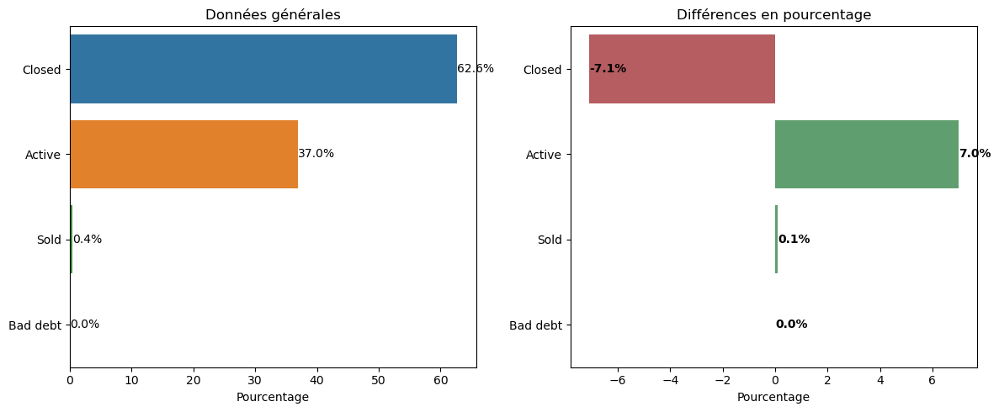



Variable CREDIT_CURRENCY
4 catégories différentes
Description: Recoded currency of the Credit Bureau credit


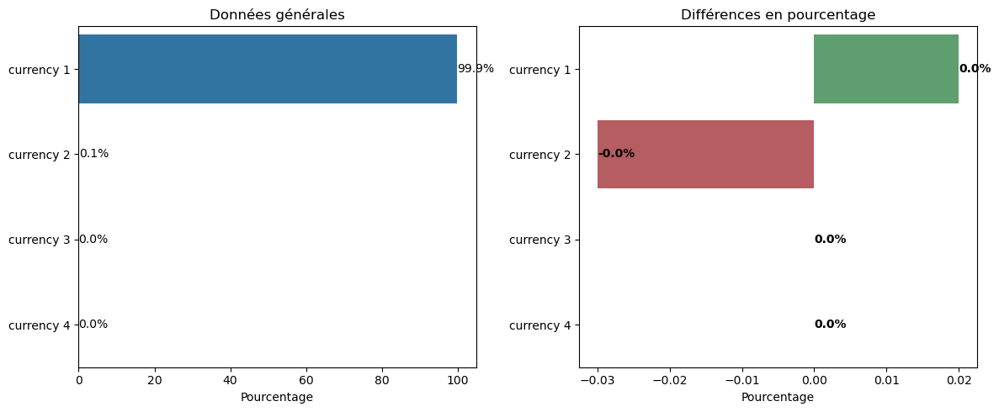



Variable CREDIT_TYPE
14 catégories différentes
Description: Type of Credit Bureau credit (Car, cash,...)


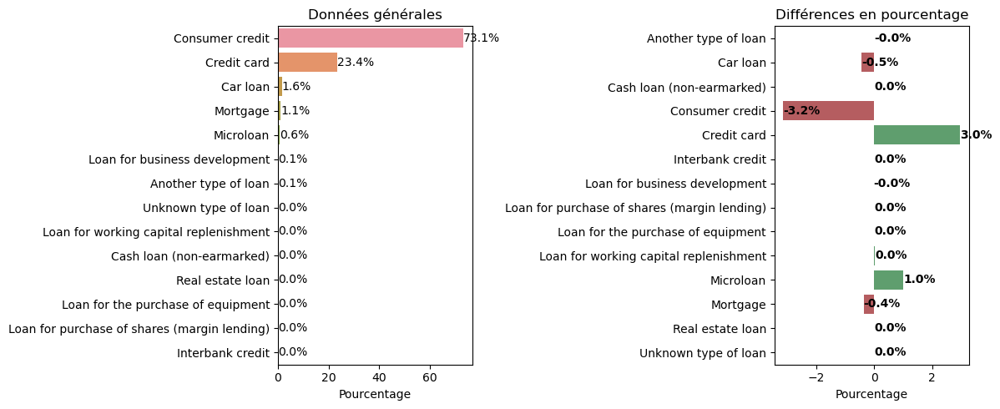

In [148]:
var_cat_target(var_cat_bureau, bureau_target, bureaux_target_1, 'bureau.csv')

Voici les différentes observations : 

Dans un premier temps, l'état des crédits montre qu'environ 62.9% d'entre eux sont fermés (entièrement remboursés), 36.7% d'entre eux sont encore actifs (en cours de remboursement) et 0.4% ont été vendus. On observe que les clients ayant des défauts de paiements sont plus concernés par un statut actif (+7.2%). 

Ensuite, les crédits sont répartis en 4 types de monnaies différentes où 99.9% d'entre elles sont de type 1. 

Nous observons ensuite que 75% des crédits sont des crédits de consommation (ce qui nous intéresse), puis 20% de cartes de crédits. Et que les clients concernés par un défaut de paiements comptent une part plus important de cartes de crédit (+2.8%) et moins de crédits de consommations. 

- <u>**Bureau_balance.csv**</u>

Variable STATUS
8 catégories différentes
Description: Status of Credit Bureau loan during the month (active, closed, DPD0-30,

 [C means closed, X means status unknown, 0 means no DPD, 1 means maximal did during month between 1-30, 2 means DPD 31-60,

 5 means DPD 120+ or sold or written off ] )


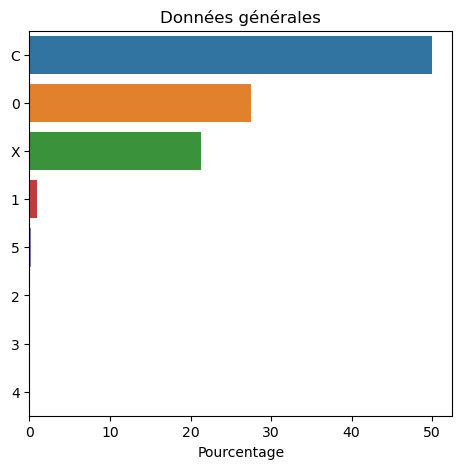

In [149]:
for column in var_cat_bb.columns:
    print('Variable', column)
    
    print(bureau_balance[column].nunique(), 'catégories différentes')
    matches = home_credit[((home_credit['Table'] == 'bureau.csv') | (home_credit['Table'] == 'bureau_balance.csv')) & (home_credit['Row'] == column)]
    print('Description:', matches['Description'].values[0])
    
    # On crée un df calculant le %
    nb = pd.DataFrame(bureau_balance[column].value_counts())
    nb['Percent'] = round(nb[column]*100/nb[column].sum(), 2)

    # On crée un barplot des données générales
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    sns.barplot(data=nb, x="Percent", y=nb.index, ci=None, dodge=False)
    plt.title('Données générales')
    plt.yticks(size=10)
    plt.xticks(size=10)
    plt.xlabel('Pourcentage')

Enfin, nous avons des informations concernant l'état du prêt au cours du mois. 47% des prêts sont fermés, 30% ne connaissent pas de jours de retard, 21% sont inconnus et 1% avec entre 1 et 30 jours de retard. Et 0.35% des prêts ont entre 31 et 120 jours de retard.

### 3.2.2. Analyse variables numériques

- <u>**Bureau.csv**</u>

In [150]:
var_num_bureau.columns

Index(['SK_ID_CURR', 'SK_BUREAU_ID', 'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE',
       'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE',
       'CNT_CREDIT_PROLONG', 'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT',
       'AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_OVERDUE', 'DAYS_CREDIT_UPDATE',
       'AMT_ANNUITY'],
      dtype='object')

In [151]:
# Pour chaque variable numérique, on va afficher la description associée
for column in var_num_bureau.columns:
    if column == 'TARGET':
        continue
    print('Variable', column)
    matches = home_credit[(home_credit['Table'] == 'bureau.csv') & (home_credit['Row'] == column)]
    print('Description:', matches['Description'].values[0])
    print('\n')

Variable SK_ID_CURR
Description: ID of loan in our sample - one loan in our sample can have 0,1,2 or more related previous credits in credit bureau 


Variable SK_BUREAU_ID
Description: Recoded ID of previous Credit Bureau credit related to our loan (unique coding for each loan application)


Variable DAYS_CREDIT
Description: How many days before current application did client apply for Credit Bureau credit


Variable CREDIT_DAY_OVERDUE
Description: Number of days past due on CB credit at the time of application for related loan in our sample


Variable DAYS_CREDIT_ENDDATE
Description: Remaining duration of CB credit (in days) at the time of application in Home Credit


Variable DAYS_ENDDATE_FACT
Description: Days since CB credit ended at the time of application in Home Credit (only for closed credit)


Variable AMT_CREDIT_MAX_OVERDUE
Description: Maximal amount overdue on the Credit Bureau credit so far (at application date of loan in our sample)


Variable CNT_CREDIT_PROLONG
Descript

- <u>**Bureau_balance.csv**</u>

In [152]:
# Pour chaque variable numérique, on va afficher la description associée
for column in var_num_bb.columns:
    if column == 'TARGET':
        continue
    print('Variable', column)
    matches = home_credit[((home_credit['Table'] == 'bureau.csv') | (home_credit['Table'] == 'bureau_balance.csv')) & (home_credit['Row'] == column)]
    print('Description:', matches['Description'].values[0])
    print('\n')

Variable SK_BUREAU_ID
Description: Recoded ID of previous Credit Bureau credit related to our loan (unique coding for each loan application)


Variable MONTHS_BALANCE
Description: Month of balance relative to application date (-1 means the freshest balance date)




- <u>**Bureau.csv**</u>

DAYS_CREDIT


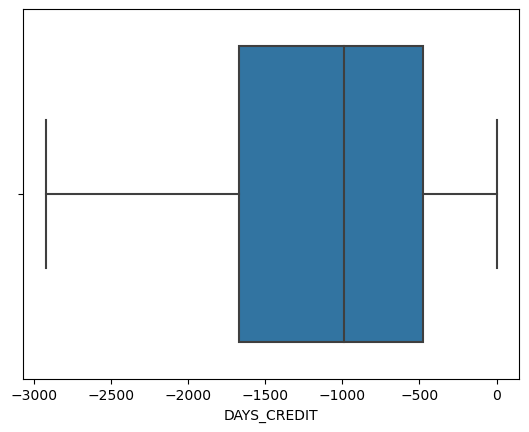

CREDIT_DAY_OVERDUE


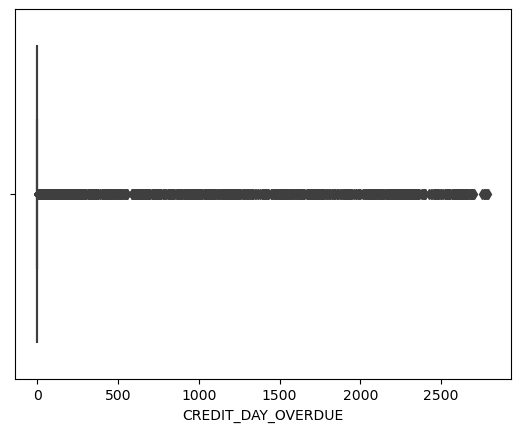

DAYS_CREDIT_ENDDATE


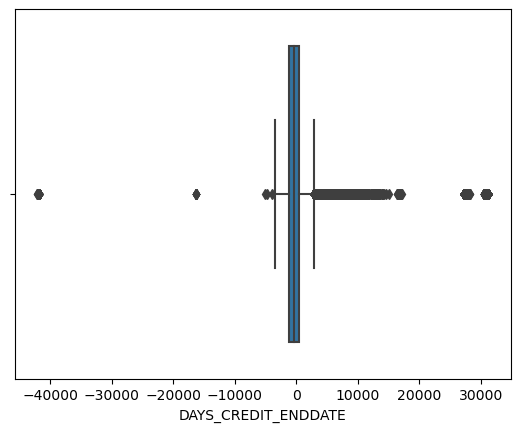

DAYS_ENDDATE_FACT


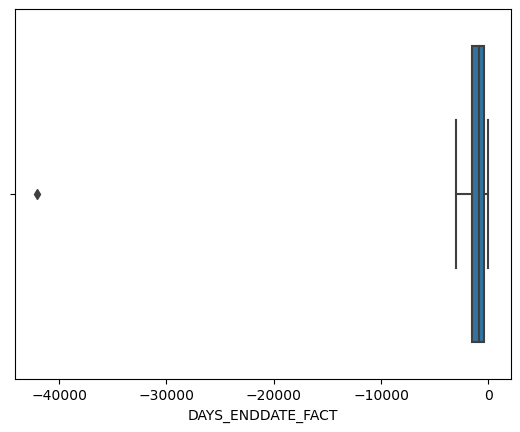

AMT_CREDIT_MAX_OVERDUE


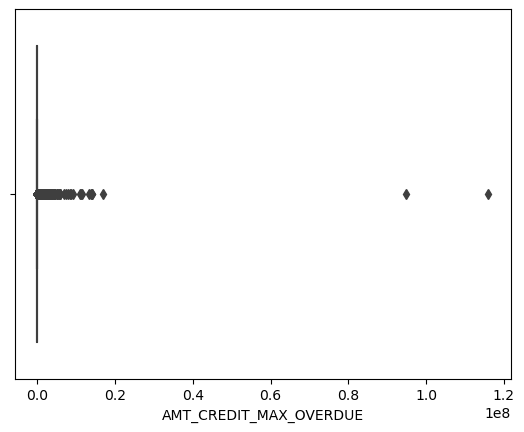

CNT_CREDIT_PROLONG


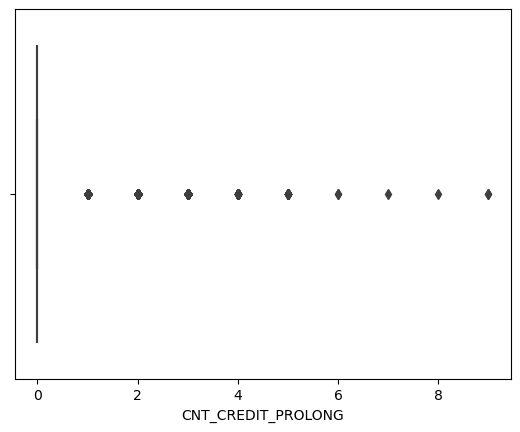

AMT_CREDIT_SUM


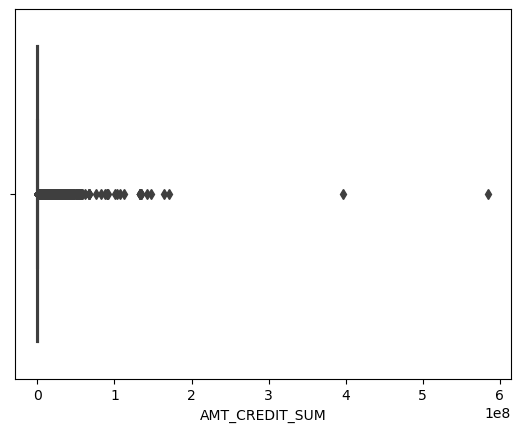

AMT_CREDIT_SUM_DEBT


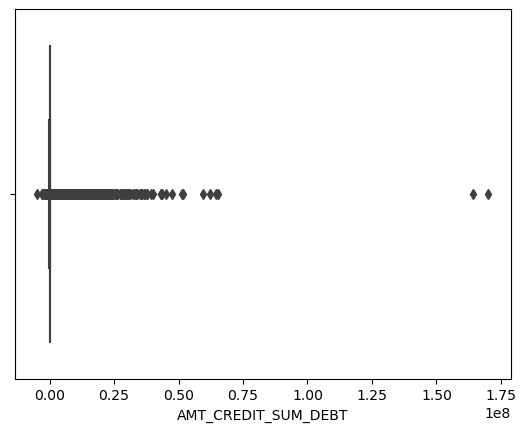

AMT_CREDIT_SUM_LIMIT


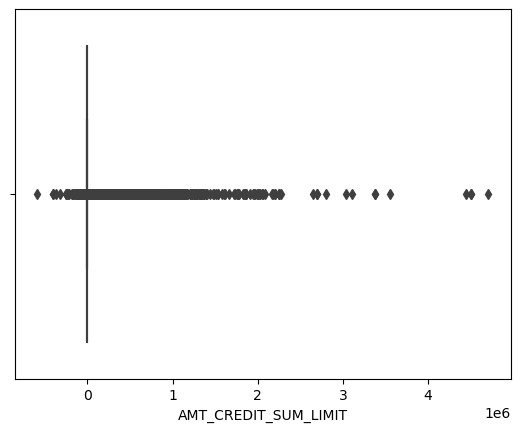

AMT_CREDIT_SUM_OVERDUE


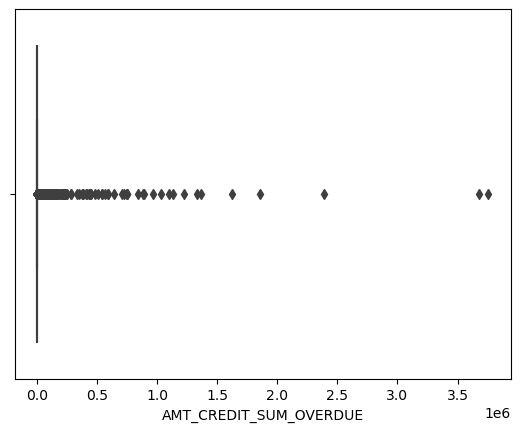

DAYS_CREDIT_UPDATE


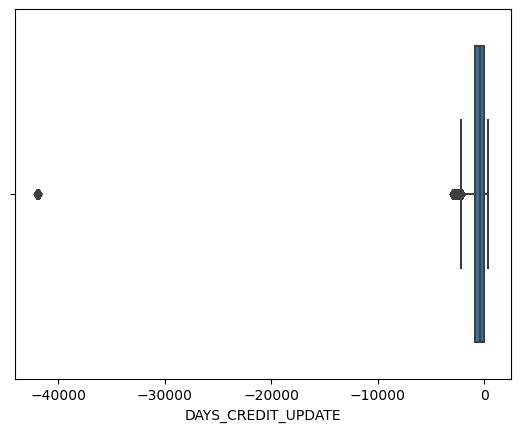

AMT_ANNUITY


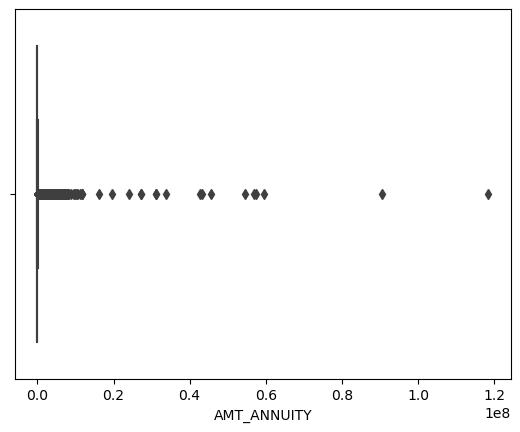

In [153]:
# On affiche les boxplots pour chaque variable à partir de "DAYS_CREDIT"
excluded_columns = ['SK_ID_CURR', 'SK_BUREAU_ID']

for column in var_num_bureau.columns:
    if column == 'TARGET':
        continue
    if column not in excluded_columns:
        print(column)
        sns.boxplot(x=var_num_bureau[column])
        plt.show()

- <u>**Bureau_balance.csv**</u>

MONTHS_BALANCE


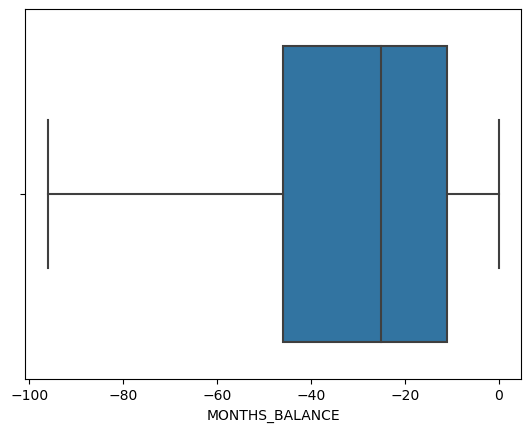

In [154]:
excluded_columns = ['SK_ID_CURR', 'SK_BUREAU_ID']

for column in var_num_bb.columns:

    if column not in excluded_columns:
        print(column)
        sns.boxplot(x=var_num_bb[column])
        plt.show()

Nous observons une valeur extrême concernant la variable "DAYS_ENDDATE_FACT". Nous allons l'afficher. 

#### a. DAYS_ENDDATE_FACT

In [155]:
var_num_bureau.sort_values(by='DAYS_ENDDATE_FACT', ascending = True).head(5)

,SK_ID_CURR,SK_BUREAU_ID,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
198346,104463,6550986,-2340,0,-1836.0,-42023.0,0.0,0,225000.000,0.0,225000.0,0.0,-2196,NaN
1550542,394875,6638194,-1021,0,74.0,-3042.0,NaN,0,711450.000,0.0,0.0,0.0,-16,0.0
535407,446299,5484873,-2922,0,-2069.0,-2922.0,0.0,0,248423.175,0.0,0.0,0.0,-2517,NaN
1522679,238000,5330135,-2920,0,-2189.0,-2919.0,NaN,0,90000.000,NaN,NaN,0.0,-2677,NaN
1123734,103979,5287722,-2917,0,-2583.0,-2917.0,0.0,0,135000.000,0.0,0.0,0.0,-2917,NaN


Concernant la valeur extrêmes de "DAYS_ENDDATE_FACT", on peut voir qu'il s'agit d'un même client, mais dont les valeurs de "MONTHS_BALANCE" sont différentes. 

- DAYS_ENDDATE_FACT : nombre de jours depuis la fin du crédit CB
- MONTHS_BALANCE : mois du solde par rapport à la date de la demande

Etant donné que ce client a une valeur extrême et qu'il "écrase" le reste des clients, on va le supprimer. 

In [156]:
# Sélection de l'identifiant de ce client
idx_min = var_num_bureau['DAYS_ENDDATE_FACT'].idxmin()
ID = var_num_bureau.loc[idx_min, 'SK_BUREAU_ID']

# Suppression du client
var_num_bureau = var_num_bureau.drop(var_num_bureau[var_num_bureau['SK_BUREAU_ID'] == ID].index).reset_index(drop=True)
bureau_target = bureau_target.drop(bureau_target[bureau_target['SK_BUREAU_ID'] == ID].index).reset_index(drop=True)
bureau = bureau.drop(bureau[bureau['SK_BUREAU_ID'] == ID].index).reset_index(drop=True)
bureau_balance = bureau_balance.drop(bureau_balance[bureau_balance['SK_BUREAU_ID'] == ID].index).reset_index(drop=True)

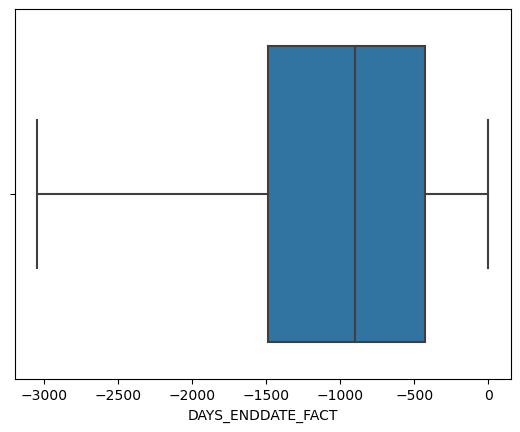

In [157]:
# Affichage du boxplot après suppression
sns.boxplot(x=var_num_bureau['DAYS_ENDDATE_FACT'])
plt.show()

#### b. AMT_ANNUITY

In [158]:
# Description des données pour la rente de prêt
print(var_num_bureau['AMT_ANNUITY'].describe())

count    4.896370e+05
mean     1.571276e+04
std      3.258269e+05
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      1.350000e+04
max      1.184534e+08
Name: AMT_ANNUITY, dtype: float64


On observe des valeurs max élevée pour la rente de prêt d'environ 59 586 680 de dollars, ce qui paraît très élevé. Nous allons regarder la valeur pour 99.5% des clients.

In [159]:
# Sélection des valeurs pour un quantile donné
var_num_bureau['AMT_ANNUITY'].quantile(q=0.995)

218943.99000000223

Nous observons que 99.5% des clients on une rente de prêt < 228 000 dollars. Nous allons donc sélectionner ceux dont la rente est < 200 000 dollars. 

In [160]:
# Sélection des clients dont la rente de prêt est supérieur à 200 000 dollars
print(round(var_num_bureau[var_num_bureau['AMT_ANNUITY'] >= 200000].shape[0]*100/var_num_bureau.shape[0], 2),
      '% des clients dont le revenu est supérieur à 200 000 dollars')

0.16 % des clients dont le revenu est supérieur à 200 000 dollars


In [161]:
# Suppression des clients dont le revenu est inférieur à 200 000 dollars. 
var_num_bureau = var_num_bureau[var_num_bureau['AMT_ANNUITY'] < 200000]
bureau_target = bureau_target[bureau_target['AMT_ANNUITY'] < 20000]

In [162]:
# Suppression des correspondances basées sur la variable "SK_BUREAU_ID"
bureau_balance = bureau_balance[~bureau_balance['SK_BUREAU_ID'].isin(var_num_bureau['SK_BUREAU_ID'])]

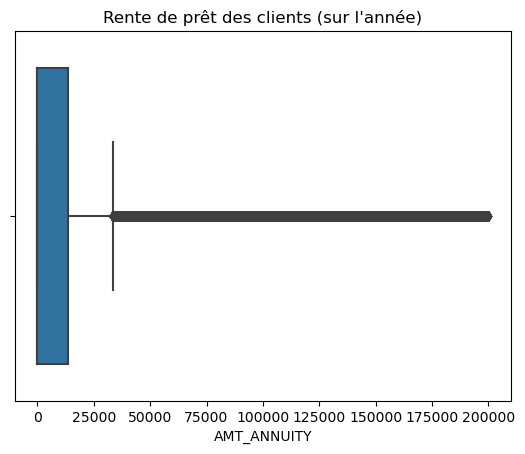

In [163]:
# Affichons à nouveau le boxplot
sns.boxplot(x=var_num_bureau['AMT_ANNUITY'])
plt.title('Rente de prêt des clients (sur l\'année)')
plt.show()

### 3.2.3. Traitement des valeurs manquantes

On va désormais <u>traiter les valeurs manquantes</u> avant notre feature engineering. 

- **Variables catégorielles** : 

Création d'une catégorie "Unknown" dans le cas où j'ai un grand nombre de valeurs manquantes > 10%. 
Imputation par la valeur la plus fréquente dans le cas où j'ai un plus faible nombre de valeurs manquantes < 10%.
                                                                                                                     
- **Variables numériques** : 

Imputation par la médiane dans le cas où j'ai un grand nombre de valeurs manquantes > 10%. 
Imputation par la valeur la plus fréquente dans le cas où j'ai un plus faible nombre de valeurs manquantes < 10%. 
Imputation par IterativeImputer lorsque j'ai peu de de valeurs manquantes < 10% et lorsque j'ai une variable, sans valeurs manquantes, corrélée. 

- <u>**Bureau.csv**</u>

In [164]:
# Affichons les variables contenant des valeurs manquantes
bureau_target_manq = bureau.isnull().sum()
bureau_target_manq = bureau_target_manq[bureau_target_manq > 0]
bureau_target_manq

DAYS_CREDIT_ENDDATE        105553
DAYS_ENDDATE_FACT          633653
AMT_CREDIT_MAX_OVERDUE    1124488
AMT_CREDIT_SUM                 13
AMT_CREDIT_SUM_DEBT        257669
AMT_CREDIT_SUM_LIMIT       591780
AMT_ANNUITY               1226790
dtype: int64

In [165]:
# On les divise à nouveau en variables catégorielles et numériques
var_cat_bureau = bureau.select_dtypes(include='object')
var_cat_bureau_manq = var_cat_bureau.columns[var_cat_bureau.isnull().any()]
print('Variables catégorielles contenant des valeurs manquantes :')
print(var_cat_bureau_manq)

print('------------------')
var_num_bureau = bureau.select_dtypes(include=['int64', 'float64'])
var_num_bureau_manq = var_num_bureau.columns[var_num_bureau.isnull().any()]
print('Variables numériques contenant des valeurs manquantes :')
print(var_num_bureau_manq)

Variables catégorielles contenant des valeurs manquantes :
Index([], dtype='object')
------------------
Variables numériques contenant des valeurs manquantes :
Index(['DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE',
       'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT',
       'AMT_ANNUITY'],
      dtype='object')


#### a. Variables numériques

In [166]:
miss_val = var_num_bureau.isnull().sum()
miss_val

# Calcul du pourcentage de valeurs manquantes par variable
percentage_missing = (miss_val / len(var_num_bureau)) * 100

# Filtrage des variables avec des valeurs manquantes
variables_manquantes = percentage_missing[percentage_missing > 0]

# Affichage des variables avec le pourcentage de valeurs manquantes
print("Variables catégorielles avec des valeurs manquantes:")
for variable, pourcentage in variables_manquantes.items():
    print(f"{variable}: {pourcentage:.2f}%")

Variables catégorielles avec des valeurs manquantes:
DAYS_CREDIT_ENDDATE: 6.15%
DAYS_ENDDATE_FACT: 36.92%
AMT_CREDIT_MAX_OVERDUE: 65.51%
AMT_CREDIT_SUM: 0.00%
AMT_CREDIT_SUM_DEBT: 15.01%
AMT_CREDIT_SUM_LIMIT: 34.48%
AMT_ANNUITY: 71.47%


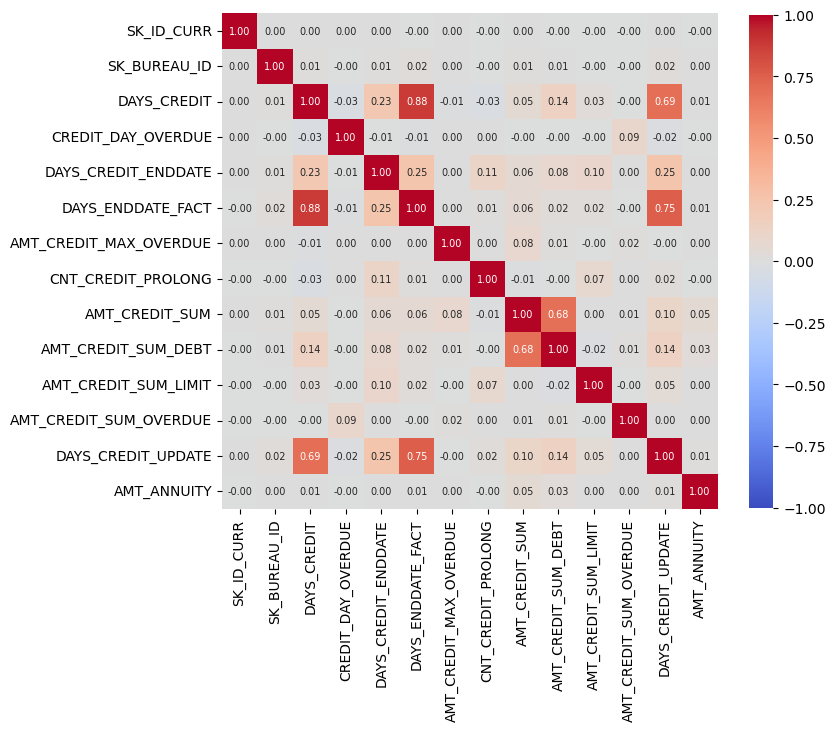

In [167]:
# On affiche la corrélation entre les variables
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(var_num_bureau.corr(), square=True, annot=True, annot_kws={"size": 7},
            fmt=".2f", vmin=-1, vmax=+1, cmap=plt.cm.coolwarm, cbar_kws={"shrink": 0.8})
plt.show()

On commence par traiter les variables dont le nombre de valeurs manquantes est > 10% pour les remplacer par la médiane.

- <u>**Nombre de jours depuis la fin du crédit**</u>

In [168]:
imputer = SimpleImputer(strategy='median')

# Remplacer les valeurs manquantes par la valeur médiane
bureau_target['DAYS_ENDDATE_FACT'] = imputer.fit_transform(bureau_target[['DAYS_ENDDATE_FACT']])
bureau['DAYS_ENDDATE_FACT'] = imputer.fit_transform(bureau[['DAYS_ENDDATE_FACT']])

In [169]:
# Vérifions que l'imputation ait bien été effectuée
missing_val = bureau['DAYS_ENDDATE_FACT'].isnull().sum()
print("Nombre de valeurs manquantes après remplacement :", missing_values)

Nombre de valeurs manquantes après remplacement : 0


- <u>**Montant non payé dans les temps**</u>

In [170]:
# Remplacer les valeurs manquantes par la valeur médiane
bureau_target['AMT_CREDIT_MAX_OVERDUE'] = imputer.fit_transform(bureau_target[['AMT_CREDIT_MAX_OVERDUE']])
bureau['AMT_CREDIT_MAX_OVERDUE'] = imputer.fit_transform(bureau[['AMT_CREDIT_MAX_OVERDUE']])

In [171]:
# Vérifions que l'imputation ait bien été effectuée
missing_val = bureau['AMT_CREDIT_MAX_OVERDUE'].isnull().sum()
print("Nombre de valeurs manquantes après remplacement :", missing_values)

Nombre de valeurs manquantes après remplacement : 0


- <u>**Dette actuelle**</u>

In [172]:
# Remplacer les valeurs manquantes par la valeur médiane
bureau_target['AMT_CREDIT_SUM_DEBT'] = imputer.fit_transform(bureau_target[['AMT_CREDIT_SUM_DEBT']])
bureau['AMT_CREDIT_SUM_DEBT'] = imputer.fit_transform(bureau[['AMT_CREDIT_SUM_DEBT']])

In [173]:
# Vérifions que l'imputation ait bien été effectuée
missing_val = bureau['AMT_CREDIT_SUM_DEBT'].isnull().sum()
print("Nombre de valeurs manquantes après remplacement :", missing_values)

Nombre de valeurs manquantes après remplacement : 0


- <u>**Limite de crédit actuelle**</u>

In [174]:
# Remplacer les valeurs manquantes par la valeur médiane
bureau_target['AMT_CREDIT_SUM_LIMIT'] = imputer.fit_transform(bureau_target[['AMT_CREDIT_SUM_LIMIT']])
bureau['AMT_CREDIT_SUM_LIMIT'] = imputer.fit_transform(bureau[['AMT_CREDIT_SUM_LIMIT']])

In [175]:
# Vérifions que l'imputation ait bien été effectuée
missing_val = bureau['AMT_CREDIT_SUM_DEBT'].isnull().sum()
print("Nombre de valeurs manquantes après remplacement :", missing_values)

Nombre de valeurs manquantes après remplacement : 0


- <u>**Rente de prêt**</u>

In [176]:
# Remplacer les valeurs manquantes par la valeur médiane
bureau_target['AMT_ANNUITY'] = imputer.fit_transform(bureau_target[['AMT_ANNUITY']])
bureau['AMT_ANNUITY'] = imputer.fit_transform(bureau[['AMT_ANNUITY']])

In [177]:
# Vérifions que l'imputation ait bien été effectuée
missing_val = bureau['AMT_ANNUITY'].isnull().sum()
print("Nombre de valeurs manquantes après remplacement :", missing_values)

Nombre de valeurs manquantes après remplacement : 0


On va maintenant traites les variables dont le nombre de valeurs manquantes est < 10%. Dans les deux cas, nous allons remplacer les valeurs manquantes par la valeur la plus fréquente. 

- <u>**Durée restante du crédit (en jours)**</u>

In [178]:
# On va traiter les valeurs manquantes par la valeur la plus fréquente
most_freq = var_num_bureau['DAYS_CREDIT_ENDDATE'].value_counts().reset_index().iloc[0,0]
bureau_target['DAYS_CREDIT_ENDDATE'] = bureau_target['DAYS_CREDIT_ENDDATE'].fillna(most_freq)
bureau['DAYS_CREDIT_ENDDATE'] = bureau['DAYS_CREDIT_ENDDATE'].fillna(most_freq)

In [179]:
# Vérifions que l'imputation ait bien été effectuée
missing_val = bureau['DAYS_CREDIT_ENDDATE'].isnull().sum()
print("Nombre de valeurs manquantes après remplacement :", missing_values)

Nombre de valeurs manquantes après remplacement : 0


- <u>**Montant du crédit actuel**</u>

In [180]:
# On va traiter les valeurs manquantes par la valeur la plus fréquente
most_freq = var_num_bureau['AMT_CREDIT_SUM'].value_counts().reset_index().iloc[0,0]
bureau_target['AMT_CREDIT_SUM'] = bureau_target['AMT_CREDIT_SUM'].fillna(most_freq)
bureau['AMT_CREDIT_SUM'] = bureau['AMT_CREDIT_SUM'].fillna(most_freq)

In [181]:
val_manq_somme = bureau.isnull().sum()
val_manq_somme[val_manq_somme > 0]

Series([], dtype: int64)

- <u>**Bureau_balance.csv**</u>

In [182]:
miss_val = var_num_bb.isnull().sum()
miss_val

# Calcul du pourcentage de valeurs manquantes par variable
percentage_missing = (miss_val / len(var_num_bb)) * 100

# Filtrage des variables avec des valeurs manquantes
variables_manquantes = percentage_missing[percentage_missing > 0]

# Affichage des variables avec le pourcentage de valeurs manquantes
print("Variables catégorielles avec des valeurs manquantes:")
for variable, pourcentage in variables_manquantes.items():
    print(f"{variable}: {pourcentage:.2f}%")

Variables catégorielles avec des valeurs manquantes:


Il n'y a pas d'imputation à faire pour ce fichier. 

### 3.2.4. Doublons

In [183]:
# Bureau.csv
print(bureau[bureau.duplicated()].shape[0], 'doublons pour le fichier Bureau.csv')
print(bureau_balance[bureau_balance.duplicated()].shape[0], 'doublons pour le fichier Bureau_balance.csv')

0 doublons pour le fichier Bureau.csv
0 doublons pour le fichier Bureau_balance.csv


### 3.2.5. Corrélations

Nous allons effectuer une heatmap des corrélations pour les variables catégorielles. 
Dans un premier temps, nous considérons la variable 'TARGET' en tant que variable catégorielle. 

Ensuite, nous utilisons **l'indice de similarité** (coefficient de Spearman) afin de mesurer la relation entre 2 variables. Pour cela, les variables catégorielles sont converties en variables numériques à l'aide de la méthode "astype('cat').cat.codes". 

#### a. Variables catégorielles

In [184]:
# On sélectionne les variables catégorielles
var_categ = bureau_target.select_dtypes(include=['object']) 
var_categ.columns.tolist()

# Concaténation des variables catégorielles avec les variables binaires et la target
var_categ = pd.concat([var_categ] + [bureau_target[['TARGET']]], axis=1)

# On veut qu'elles soient considérées comme des variables catégorielles
var_categ['TARGET'] = var_categ['TARGET'].astype('object')

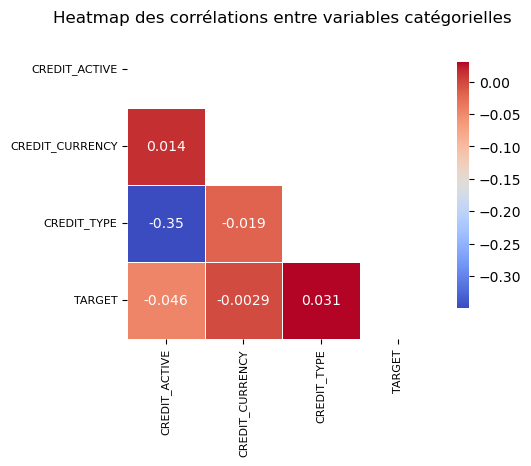

In [185]:
# Créer une copie des variables catégorielles pour effectuer les modifications
var_categ_encoded = var_categ.copy()

# Convertir les catégories en codes numériques
for column in var_categ_encoded.columns:
    var_categ_encoded[column] = var_categ_encoded[column].astype('category').cat.codes

# Calculer la matrice de corrélation
correlation_matrix = var_categ_encoded.corr(method='spearman')

# Créer une masque pour la moitié inférieure de la matrice de corrélation
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Afficher la heatmap
plt.figure(figsize=(5, 4))
heatmap = sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5,
            cbar_kws={"shrink": 0.8}, mask=mask)
plt.title('Heatmap des corrélations entre variables catégorielles', fontsize=12)

heatmap.set_xticklabels(heatmap.get_xticklabels(), size=8)
heatmap.set_yticklabels(heatmap.get_yticklabels(), size=8)

plt.show()

In [186]:
# Calculer les corrélations avec la variable spécifique
correlations = correlation_matrix.loc[:, 'TARGET'].sort_values(ascending=False)

# Sélectionner les 3 premières variables les plus corrélées
top_3_correlated_variables = correlations[1:4].index.tolist()

# Afficher les résultats avec les valeurs de corrélation
print(f"Les 3 premières variables les plus corrélées avec 'TARGET' sont :")
for variable in top_3_correlated_variables:
    correlation_value = correlation_matrix.loc[variable, 'TARGET']
    print(f"{variable}: {correlation_value:.2f}")

Les 3 premières variables les plus corrélées avec 'TARGET' sont :
CREDIT_TYPE: 0.03
CREDIT_CURRENCY: -0.00
CREDIT_ACTIVE: -0.05


Les variables catégorielles sont peu corrélées entre elles. La variable dont la corrélation est la plus élevée avec la Target est "CREDIT_TYPE", mais reste très proche de 0. 

#### b. Variables numériques

In [187]:
# On sélectionne à nouveau les variables numériques
var_num = bureau_target.select_dtypes(include=['float64', 'int'])
var_num.columns

Index(['SK_ID_CURR', 'TARGET', 'SK_BUREAU_ID', 'DAYS_CREDIT',
       'CREDIT_DAY_OVERDUE', 'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT',
       'AMT_CREDIT_MAX_OVERDUE', 'CNT_CREDIT_PROLONG', 'AMT_CREDIT_SUM',
       'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_OVERDUE',
       'DAYS_CREDIT_UPDATE', 'AMT_ANNUITY'],
      dtype='object')

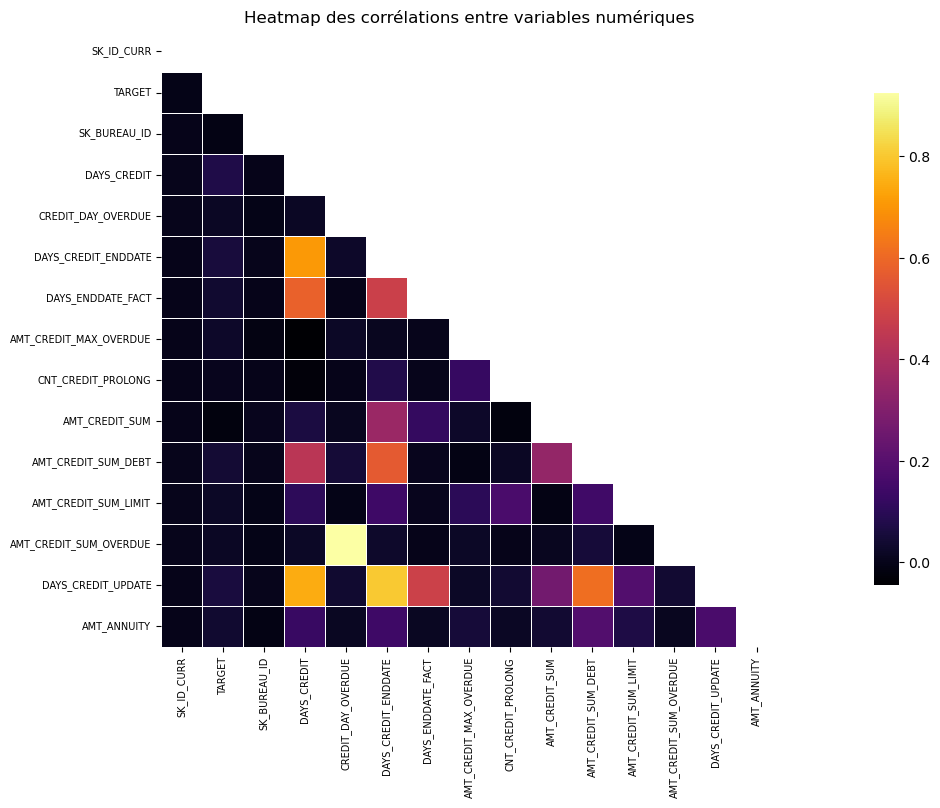

In [188]:
# Calculer la matrice de corrélation
correlation_matrix = var_num.corr(method='spearman')

# Créer une masque pour la moitié inférieure de la matrice de corrélation
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Afficher la heatmap
plt.figure(figsize=(25, 8))
heatmap = sns.heatmap(correlation_matrix, square=True, annot=False, annot_kws={"size": 7},
            fmt=".2f", cmap='inferno', linewidths=0.5, mask=mask, cbar_kws={"shrink": 0.8})
heatmap.set_xticklabels(heatmap.get_xticklabels(), size=7)
heatmap.set_yticklabels(heatmap.get_yticklabels(), size=7)
plt.title('Heatmap des corrélations entre variables numériques', fontsize=12)
plt.show()

In [189]:
# Calculer les corrélations avec la variable spécifique
correlations = correlation_matrix.loc[:, 'TARGET'].sort_values(ascending=False)

# Sélectionner les 3 premières variables les plus corrélées
top_3_correlated_variables = correlations[1:4].index.tolist()

# Afficher les résultats avec les valeurs de corrélation
print(f"Les 3 premières variables les plus corrélées avec 'TARGET' sont :")
for variable in top_3_correlated_variables:
    correlation_value = correlation_matrix.loc[variable, 'TARGET']
    print(f"{variable}: {correlation_value:.2f}")

Les 3 premières variables les plus corrélées avec 'TARGET' sont :
DAYS_CREDIT: 0.08
DAYS_CREDIT_UPDATE: 0.06
DAYS_CREDIT_ENDDATE: 0.06


Les variables les plus corrélées à la target (DAYS_CREDIT, DAYS_CREDIT_UPDATE, DAYS_CREDIT_ENDDATE) restent très proches de 0. 

### 3.3. Feature engineering

Pour la partie feature engineering, nous allons nous baser sur ce qui a été fait par le kernel Kaggle ayant remporté la compétition. 

In [190]:
# On encode les variables catégorielles avec la fonction one-hot-encoder
bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category=True)
bb, bb_cat = one_hot_encoder(bureau_balance, nan_as_category=True)

In [191]:
# On affiche nos variables encodées
display(bureau.head())
print(bureau.shape)

display(bb.head())
print(bb.shape)

,SK_ID_CURR,SK_BUREAU_ID,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY,CREDIT_ACTIVE_Active,CREDIT_ACTIVE_Bad debt,CREDIT_ACTIVE_Closed,CREDIT_ACTIVE_Sold,CREDIT_ACTIVE_nan,CREDIT_CURRENCY_currency 1,CREDIT_CURRENCY_currency 2,CREDIT_CURRENCY_currency 3,CREDIT_CURRENCY_currency 4,CREDIT_CURRENCY_nan,CREDIT_TYPE_Another type of loan,CREDIT_TYPE_Car loan,CREDIT_TYPE_Cash loan (non-earmarked),CREDIT_TYPE_Consumer credit,CREDIT_TYPE_Credit card,CREDIT_TYPE_Interbank credit,CREDIT_TYPE_Loan for business development,CREDIT_TYPE_Loan for purchase of shares (margin lending),CREDIT_TYPE_Loan for the purchase of equipment,CREDIT_TYPE_Loan for working capital replenishment,CREDIT_TYPE_Microloan,CREDIT_TYPE_Mobile operator loan,CREDIT_TYPE_Mortgage,CREDIT_TYPE_Real estate loan,CREDIT_TYPE_Unknown type of loan,CREDIT_TYPE_nan
0,215354,5714462,-497,0,-153.0,-153.0,0.0,0,91323.0,0.0,0.0,0.0,-131,0.0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
1,215354,5714463,-208,0,1075.0,-897.0,0.0,0,225000.0,171342.0,0.0,0.0,-20,0.0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,215354,5714464,-203,0,528.0,-897.0,0.0,0,464323.5,0.0,0.0,0.0,-16,0.0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,215354,5714465,-203,0,0.0,-897.0,0.0,0,90000.0,0.0,0.0,0.0,-16,0.0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,215354,5714466,-629,0,1197.0,-897.0,77674.5,0,2700000.0,0.0,0.0,0.0,-21,0.0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


(1716427, 40)


,SK_BUREAU_ID,MONTHS_BALANCE,STATUS_0,STATUS_1,STATUS_2,STATUS_3,STATUS_4,STATUS_5,STATUS_C,STATUS_X,STATUS_nan
175,5715455,-49,0,0,0,0,0,0,0,1,0
176,5715455,-50,0,0,0,0,0,0,0,1,0
177,5715455,-51,0,0,0,0,0,0,0,1,0
178,5715455,-52,0,0,0,0,0,0,0,1,0
179,5715455,-53,0,0,0,0,0,0,0,1,0


(12760656, 11)


Nous allons effectuer les agrégations sur la variable "MONTHS_BALANCE" en calculant la moyenne, la valeur minimale et la valeur maximale. 

In [192]:
bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}

for col in bb_cat:
    bb_aggregations[col] = ['mean']
bb_agg = bb.groupby('SK_BUREAU_ID').agg(bb_aggregations).reset_index()
bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
bureau = bureau.join(bb_agg, how='left', on='SK_BUREAU_ID')
bureau.drop(['SK_BUREAU_ID'], axis=1, inplace= True)

In [193]:
# Variables numériques Bureau et bureau_balance
num_aggregations = {
    'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
    'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
    'DAYS_CREDIT_UPDATE': ['mean'],
    'CREDIT_DAY_OVERDUE': ['max', 'mean'],
    'AMT_CREDIT_MAX_OVERDUE': ['mean'],
    'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
    'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
    'AMT_CREDIT_SUM_OVERDUE': ['mean'],
    'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
    'AMT_ANNUITY': ['max', 'mean'],
    'CNT_CREDIT_PROLONG': ['sum'],
    'MONTHS_BALANCE_MIN': ['min'],
    'MONTHS_BALANCE_MAX': ['max'],
    'MONTHS_BALANCE_SIZE': ['mean', 'sum']
}

In [194]:
# Variables catégorielles Bureau et bureau_balance
cat_aggregations = {}
for cat in bureau_cat: cat_aggregations[cat] = ['mean']
for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']

# Regroupement par la variable "SK_ID_CURR" et agrégation spécifiques
# aux variables numériques (min, max, mean) et catégorielles (mean) 
bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})

# Renommage des colonnes en ajoutant le préfixe "Buro_", puis nom variable et agrégation en majuscules
bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])

In [195]:
# Sélection des crédits actifs et application des agrégations numériques
active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')

In [196]:
# Sélection des crédits fermés et application des agrégations numériques
closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')

In [197]:
# On va d'abord regarder si on a des valeurs infinies
bureau_agg.columns[bureau_agg.apply(lambda x: np.isinf(x).any())].tolist()

[]

In [198]:
# On regarde si on a des valeurs manquantes
val_manq_somme = bureau_agg.isnull().sum()
val_manq_somme[val_manq_somme > 0]

BURO_DAYS_CREDIT_VAR                41520
BURO_MONTHS_BALANCE_MIN_MIN        305811
BURO_MONTHS_BALANCE_MAX_MAX        305811
BURO_MONTHS_BALANCE_SIZE_MEAN      305811
BURO_STATUS_0_MEAN_MEAN            305811
                                    ...  
CLOSED_CNT_CREDIT_PROLONG_SUM       37886
CLOSED_MONTHS_BALANCE_MIN_MIN      305811
CLOSED_MONTHS_BALANCE_MAX_MAX      305811
CLOSED_MONTHS_BALANCE_SIZE_MEAN    305811
CLOSED_MONTHS_BALANCE_SIZE_SUM      37886
Length: 67, dtype: int64

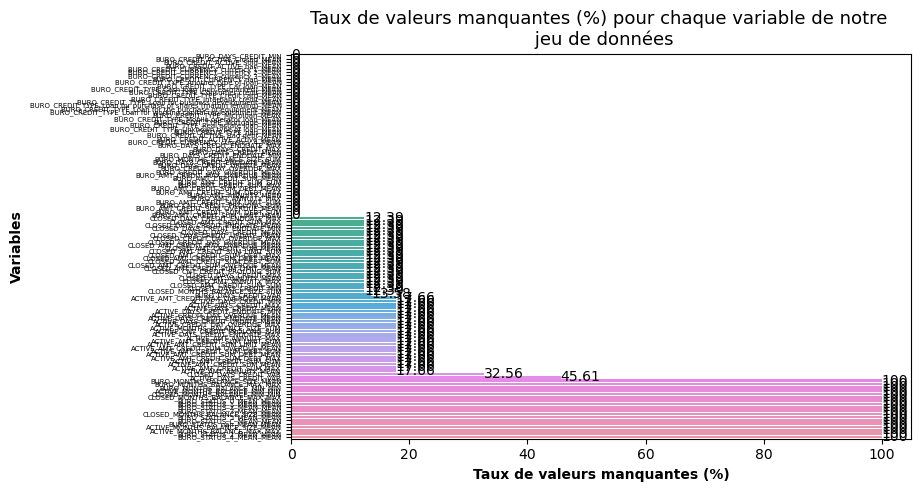

In [199]:
# On affiche les valeurs manquantes

# On crée un nouveau df des données manquantes
val_manq = pd.DataFrame(round(bureau_agg.isnull().sum()/len(bureau_agg)*100, 2)).reset_index()
val_manq = val_manq.rename(columns={0: 'val_manq'})
val_manq = val_manq.sort_values(by='val_manq', ascending=True)

# On crée un barplot affichant le taux de valeurs manquantes
# pour chaque variable
plt.figure(figsize=(8, 5))

ax = sns.barplot(data=val_manq, x="val_manq", y="index", ci=None, dodge=False)

plt.xlabel('Taux de valeurs manquantes (%)', size=10, fontweight='bold')
plt.ylabel('Variables', size=10, fontweight='bold')
plt.title('Taux de valeurs manquantes (%) pour chaque variable'
          ' de notre \n jeu de données', size=13)

plt.yticks(size=5)
plt.xticks(size=10)

for i in ax.containers:
    ax.bar_label(i,)

plt.show()

On va supprimer les variables pour lesquelles le nombre de valeurs manquantes = 100%.

In [200]:
# Calcul des proportions de valeurs manquantes par colonne
prop_manq = bureau_agg.isnull().mean()

# Sélection des colonnes avec 100% de valeurs manquantes
colonnes_manquantes = prop_manq[prop_manq == 1].index

# Suppression des colonnes avec 100% de valeurs manquantes
bureau_agg = bureau_agg.drop(columns=colonnes_manquantes)

On attribue la valeur médiane pour les variables dont les valeurs manquantes sont > 10%.

In [201]:
# Calcul du pourcentage de valeurs manquantes par variable
pourcentage_manquant = bureau_agg.isnull().sum() / len(bureau_agg) * 100

# Variables avec plus de 10% de valeurs manquantes
vars_manq_sup_10 = pourcentage_manquant[pourcentage_manquant > 10].index

# Imputation par la médiane pour chaque variable
for var in vars_manq_sup_10:
    imputer = SimpleImputer(strategy='median')
    bureau_agg[var] = imputer.fit_transform(bureau_agg[[var]])

In [202]:
# Calcul du nombre de valeurs manquantes après imputation
valeurs_manquantes_apres = bureau_agg[vars_manq_sup_10].isnull().sum()

# Affichage des variables avec leurs valeurs manquantes après imputation
print(len(valeurs_manquantes_apres))

49


On attribue la valeur la plus fréquente aux variables dont les valeurs manquantes sont < 10%.

In [203]:
# Variables avec moins de 10% de valeurs manquantes
vars_manq_inf_10 = pourcentage_manquant[pourcentage_manquant < 10].index

# Imputation par la valeur la plus fréquente pour chaque variable
for var in vars_manq_inf_10:
    imputer = SimpleImputer(strategy='most_frequent')
    bureau_agg[var] = imputer.fit_transform(bureau_agg[[var]])

In [204]:
# Vérifions que l'on n'a plus de valeurs manquantes
val_manq_somme = bureau_agg.isnull().sum()
val_manq_somme[val_manq_somme > 0]

Series([], dtype: int64)

# 4. Fichier previous_application.csv

In [205]:
# Affichage des dimensions de notre fichier
print('Fichier previous_application.csv :')
print('Notre fichier est constitués de', previous_application.shape[0], 'lignes et de', previous_application.shape[1], 'colonnes')

Fichier previous_application.csv :
Notre fichier est constitués de 1670214 lignes et de 37 colonnes


## 4.1. Analyse exploratoire et nettoyage des données

In [206]:
# On affiche les premières lignes
previous_application.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


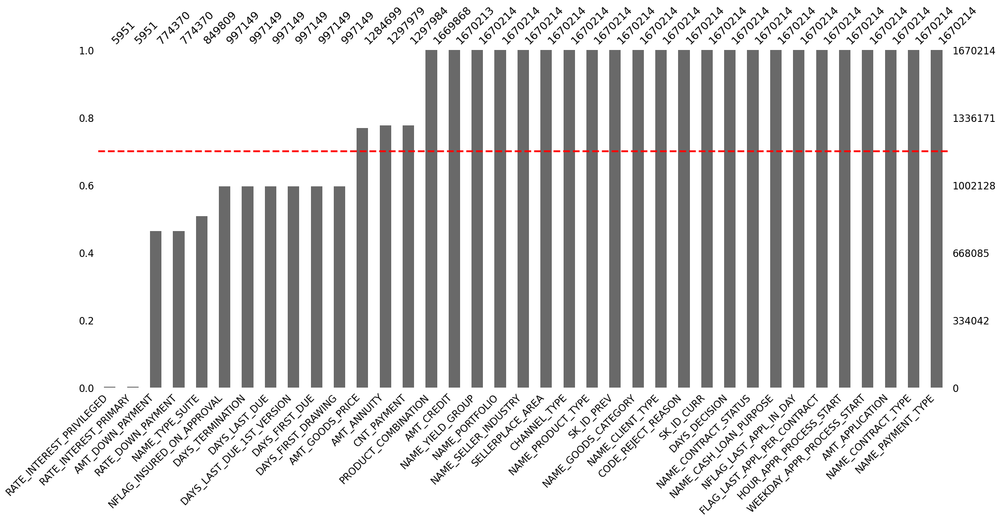

In [207]:
# On affiche les valeurs manquantes
val_manq_msno(previous_application)

11 variables possèdent plus de 30% de valeurs manquantes. 

In [208]:
# Nous allons placer d'un côté les variables catégorielles
# et d'un autre les variables numériques

var_cat_pa = previous_application.select_dtypes(include='object')
print('Variables catégorielles')
print(var_cat_pa.columns)
print('--------------')
print('Variables numériques')
var_num_pa = previous_application.select_dtypes(include=['int64', 'float64'])
print(var_num_pa.columns)

Variables catégorielles
Index(['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON',
       'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY',
       'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE',
       'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')
--------------
Variables numériques
Index(['SK_ID_PREV', 'SK_ID_CURR', 'AMT_ANNUITY', 'AMT_APPLICATION',
       'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'HOUR_APPR_PROCESS_START', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'SELLERPLACE_AREA',
       'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE',
       'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION',
       'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')


In [209]:
print(len(var_cat_pa.columns), 'variables sont catégorielles')
print(len(var_num_pa.columns), 'variables sont numériques')

16 variables sont catégorielles
21 variables sont numériques


In [210]:
# Valeurs uniques
var_pa = previous_application.columns.tolist()
for var in var_pa:
    print(var, ':', previous_application[var].nunique())

SK_ID_PREV : 1670214
SK_ID_CURR : 338857
NAME_CONTRACT_TYPE : 4
AMT_ANNUITY : 357959
AMT_APPLICATION : 93885
AMT_CREDIT : 86803
AMT_DOWN_PAYMENT : 29278
AMT_GOODS_PRICE : 93885
WEEKDAY_APPR_PROCESS_START : 7
HOUR_APPR_PROCESS_START : 24
FLAG_LAST_APPL_PER_CONTRACT : 2
NFLAG_LAST_APPL_IN_DAY : 2
RATE_DOWN_PAYMENT : 207033
RATE_INTEREST_PRIMARY : 148
RATE_INTEREST_PRIVILEGED : 25
NAME_CASH_LOAN_PURPOSE : 25
NAME_CONTRACT_STATUS : 4
DAYS_DECISION : 2922
NAME_PAYMENT_TYPE : 4
CODE_REJECT_REASON : 9
NAME_TYPE_SUITE : 7
NAME_CLIENT_TYPE : 4
NAME_GOODS_CATEGORY : 28
NAME_PORTFOLIO : 5
NAME_PRODUCT_TYPE : 3
CHANNEL_TYPE : 8
SELLERPLACE_AREA : 2097
NAME_SELLER_INDUSTRY : 11
CNT_PAYMENT : 49
NAME_YIELD_GROUP : 5
PRODUCT_COMBINATION : 17
DAYS_FIRST_DRAWING : 2838
DAYS_FIRST_DUE : 2892
DAYS_LAST_DUE_1ST_VERSION : 4605
DAYS_LAST_DUE : 2873
DAYS_TERMINATION : 2830
NFLAG_INSURED_ON_APPROVAL : 2


In [211]:
# Nous allons joindre la target de notre fichier application_train.csv avec nos données

application_target = application_clean[['SK_ID_CURR', 'TARGET']]
pa_target = application_target.merge(previous_application, on = 'SK_ID_CURR', how = 'left')

In [212]:
# On redéfinit nos variables catégorielles et numériques

var_cat_pa = previous_application.select_dtypes(include='object')
print('Variables catégorielles')
print(var_cat_pa.columns)
print('--------------')
print('Variables numériques')
var_num_pa = previous_application.select_dtypes(include=['int64', 'float64'])
print(var_num_pa.columns)

Variables catégorielles
Index(['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON',
       'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY',
       'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE',
       'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')
--------------
Variables numériques
Index(['SK_ID_PREV', 'SK_ID_CURR', 'AMT_ANNUITY', 'AMT_APPLICATION',
       'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'HOUR_APPR_PROCESS_START', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'SELLERPLACE_AREA',
       'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE',
       'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION',
       'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')


In [213]:
# Sélection des clients ayant des défauts de paiements (target = 1)
pa_target_1 = pa_target[pa_target['TARGET'] == 1]

### 4.1.1. Analyse variables catégorielles

Variable NAME_CONTRACT_TYPE
4 catégories différentes
Description: Contract product type (Cash loan, consumer loan [POS] ,...) of the previous application


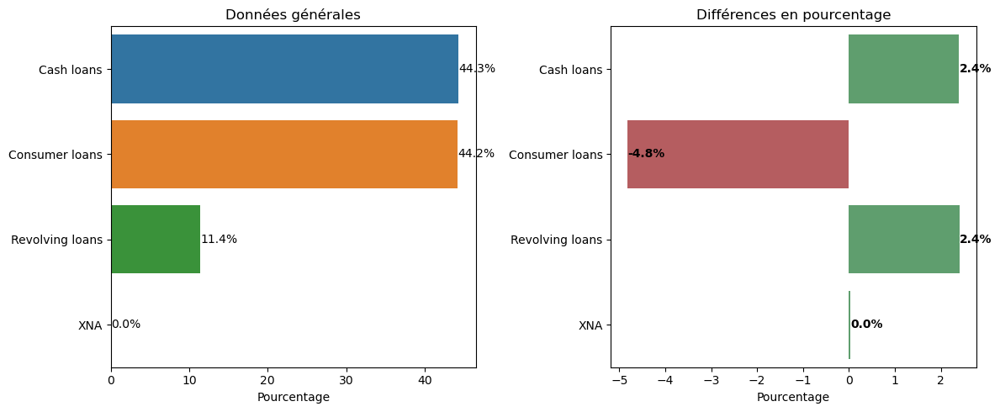



Variable WEEKDAY_APPR_PROCESS_START
7 catégories différentes
Description: On which day of the week did the client apply for previous application


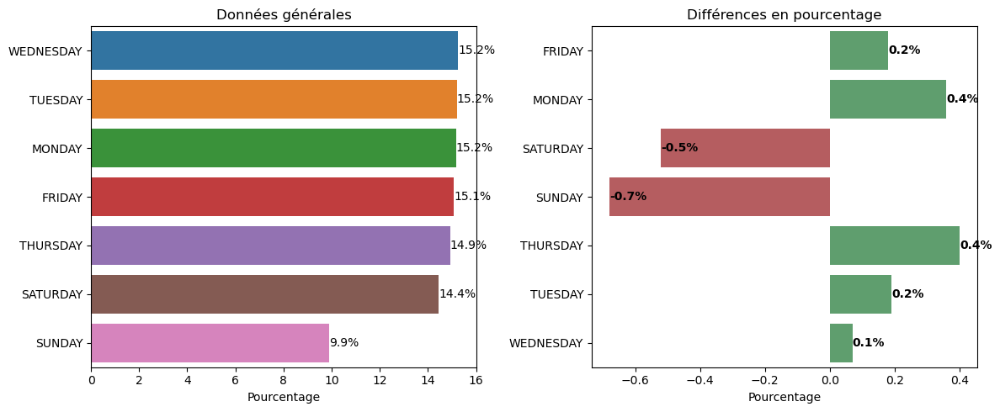



Variable FLAG_LAST_APPL_PER_CONTRACT
2 catégories différentes
Description: Flag if it was last application for the previous contract. Sometimes by mistake of client or our clerk there could be more applications for one single contract


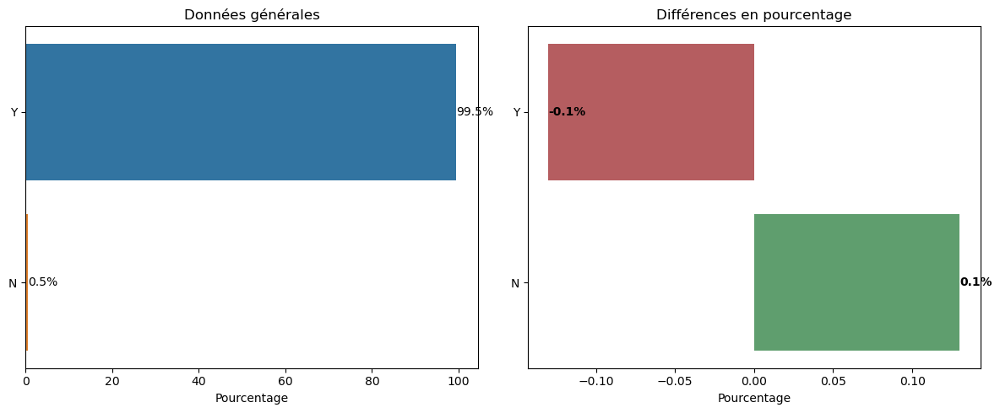



Variable NAME_CASH_LOAN_PURPOSE
25 catégories différentes
Description: Purpose of the cash loan


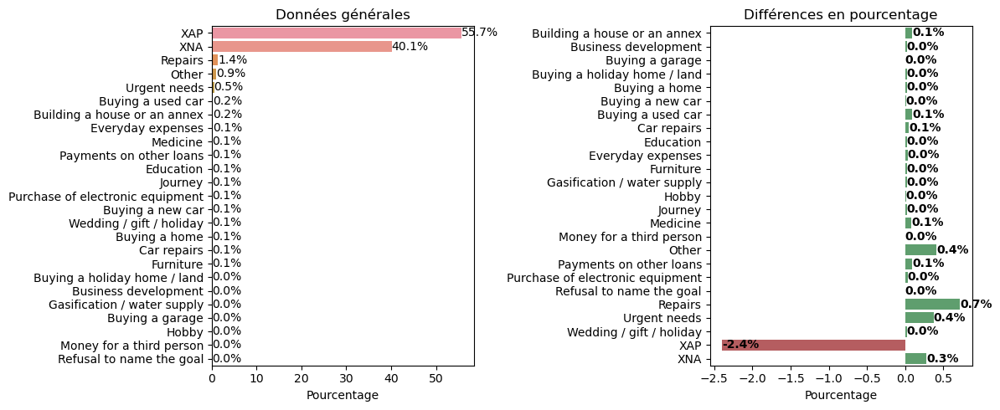



Variable NAME_CONTRACT_STATUS
4 catégories différentes
Description: Contract status (approved, cancelled, ...) of previous application


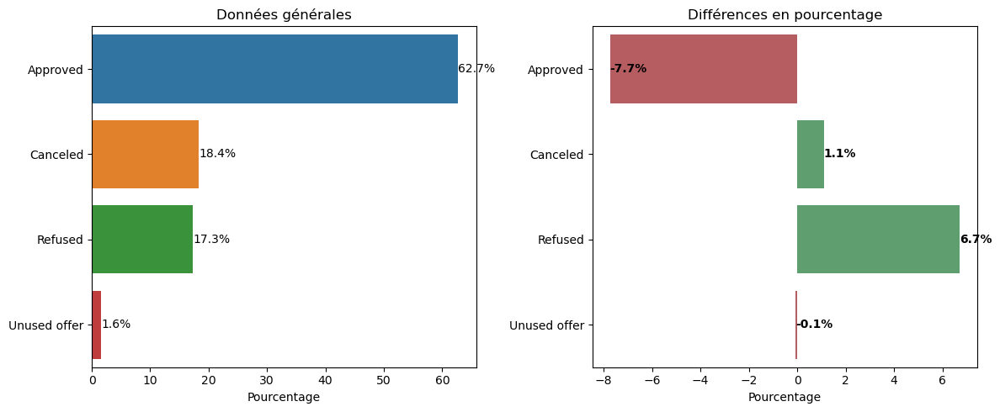



Variable NAME_PAYMENT_TYPE
4 catégories différentes
Description: Payment method that client chose to pay for the previous application


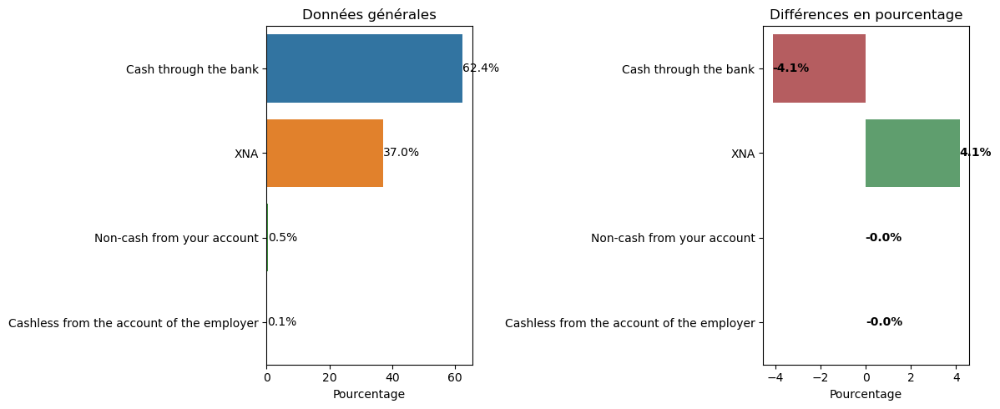



Variable CODE_REJECT_REASON
9 catégories différentes
Description: Why was the previous application rejected


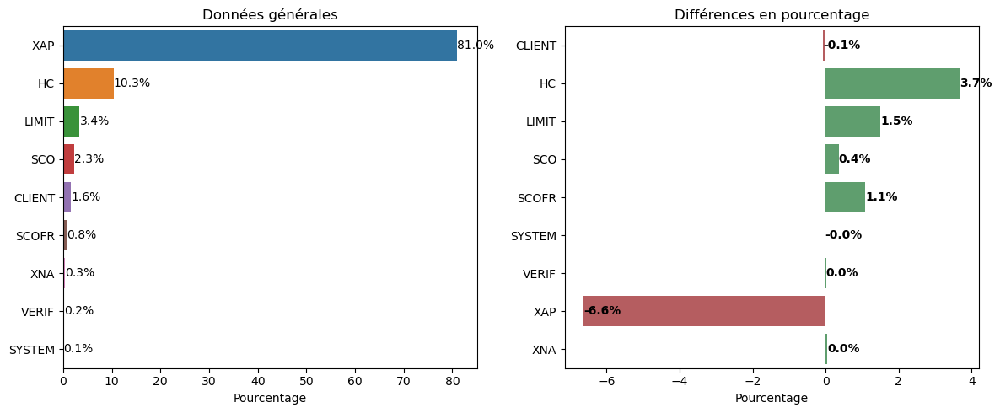



Variable NAME_TYPE_SUITE
7 catégories différentes
Description: Who accompanied client when applying for the previous application


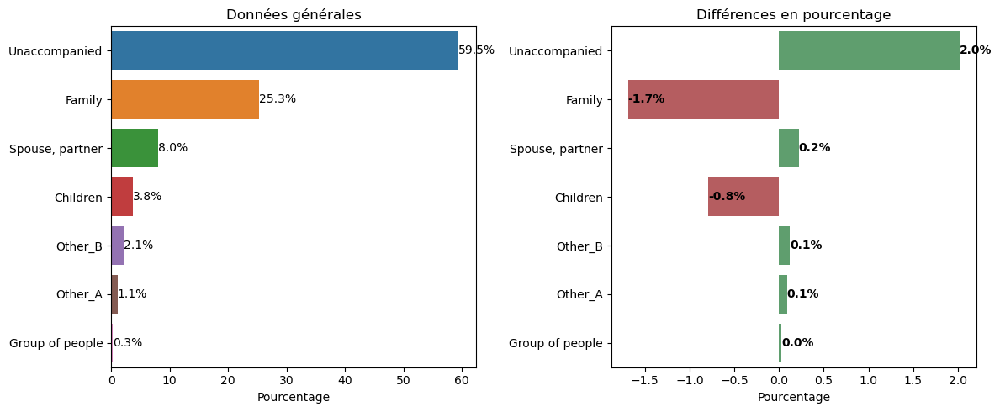



Variable NAME_CLIENT_TYPE
4 catégories différentes
Description: Was the client old or new client when applying for the previous application


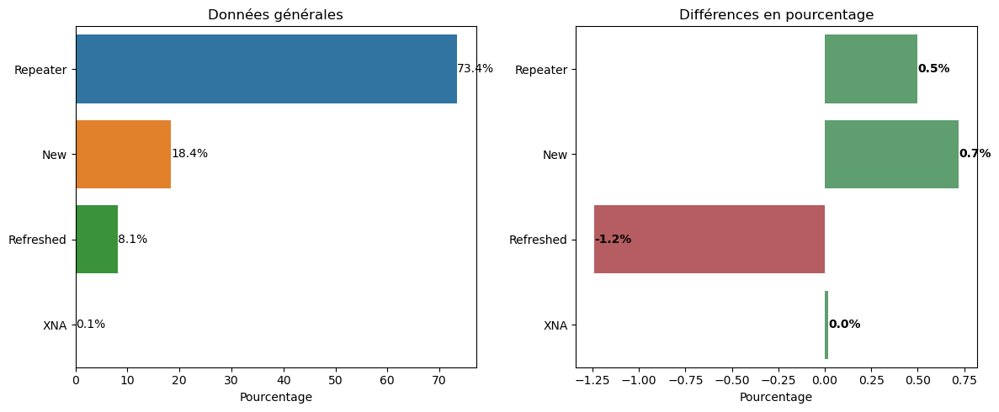



Variable NAME_GOODS_CATEGORY
27 catégories différentes
Description: What kind of goods did the client apply for in the previous application


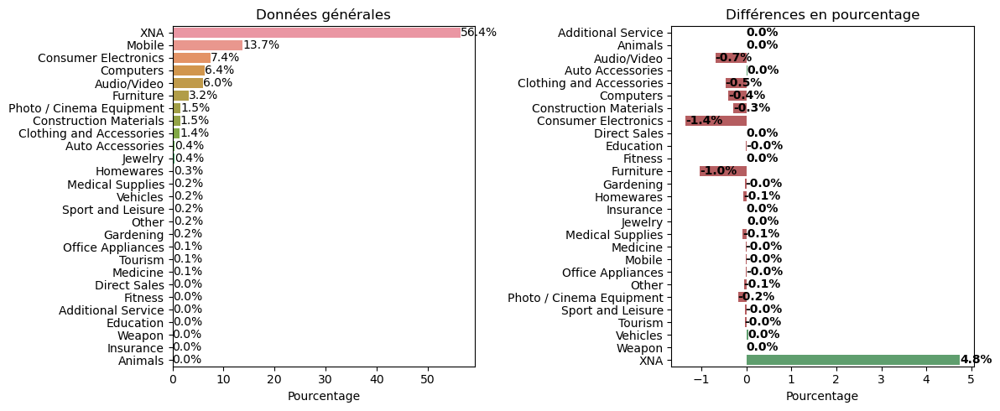



Variable NAME_PORTFOLIO
5 catégories différentes
Description: Was the previous application for CASH, POS, CAR, 




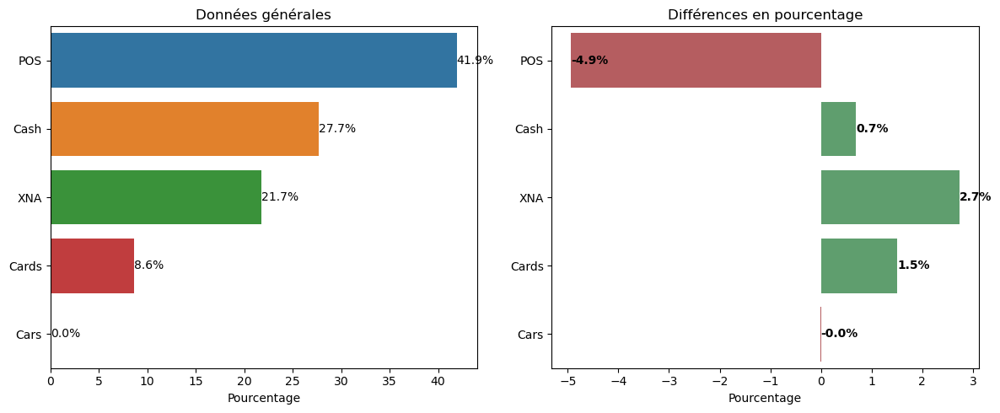



Variable NAME_PRODUCT_TYPE
3 catégories différentes
Description: Was the previous application x-sell o walk-in


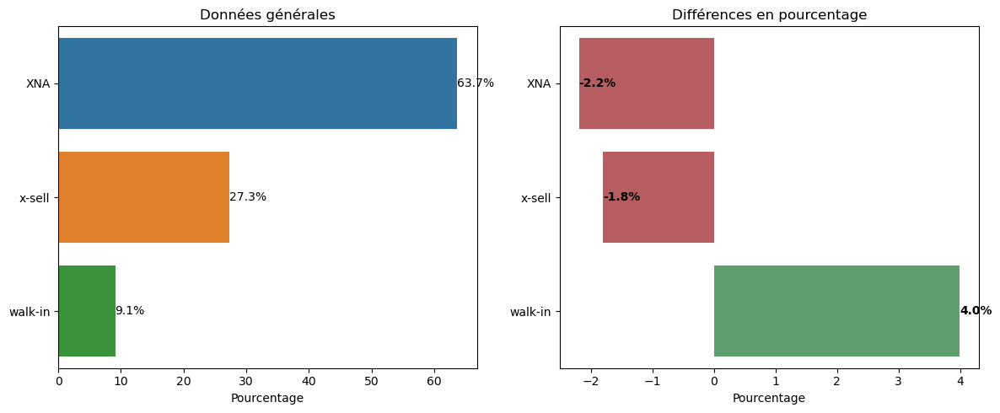



Variable CHANNEL_TYPE
8 catégories différentes
Description: Through which channel we acquired the client on the previous application


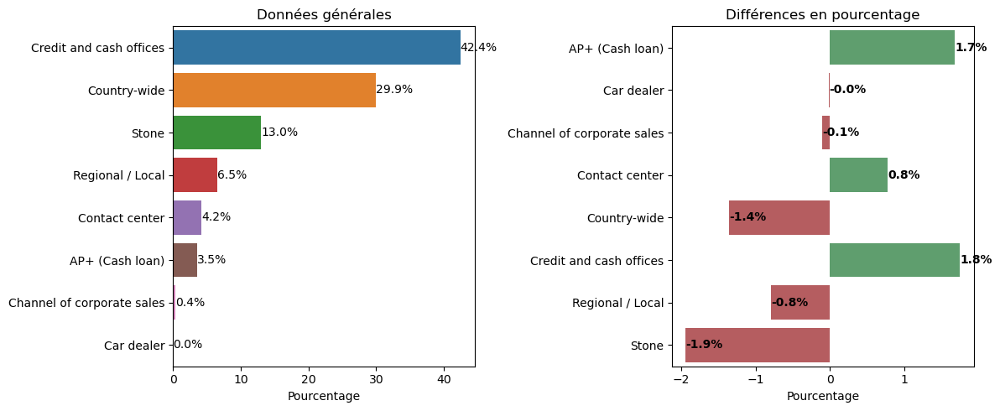



Variable NAME_SELLER_INDUSTRY
11 catégories différentes
Description: The industry of the seller


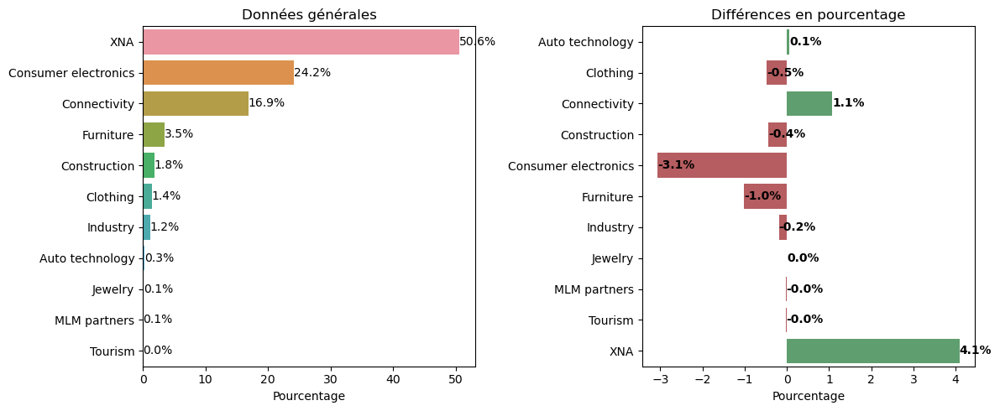



Variable NAME_YIELD_GROUP
5 catégories différentes
Description: Grouped interest rate into small medium and high of the previous application


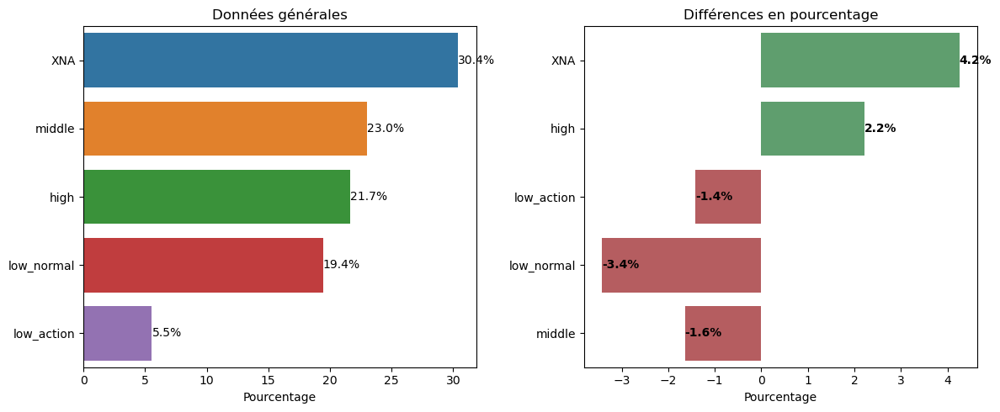



Variable PRODUCT_COMBINATION
17 catégories différentes
Description: Detailed product combination of the previous application


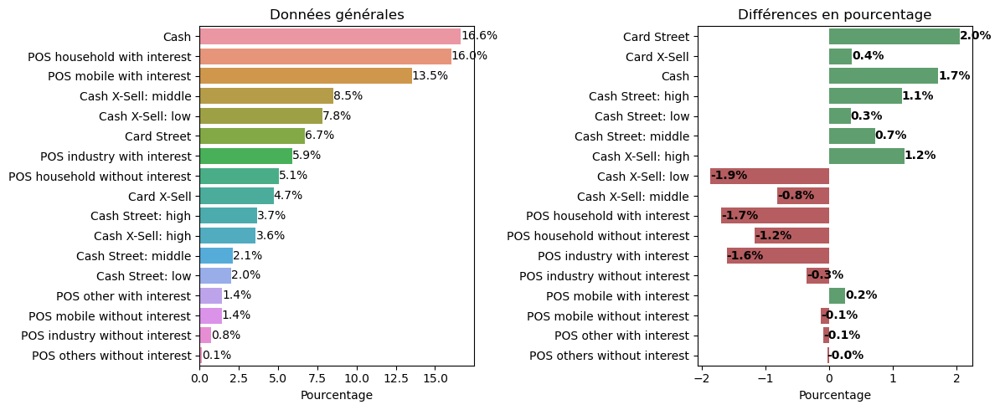

In [214]:
# Pour chaque variable catégorielle, on va afficher un graphique
# des catégories qu'elles contiennent et leur description
var_cat_target(var_cat_pa, pa_target, pa_target_1, 'previous_application.csv')

Pour la varable concernant le type de contrat, on observe une variable XNA que l'on va convertir en "Unkown". Nous observons que 44% des clients ont un contrat de type numéraire, 44% ont des prêts de consommation et 11% ont des prêts de type revolving. Les clients ayant des défauts de paiements contiennent une part légèrement plus importante de prêts numéraires et revolving (+2.4% chacun) et moins de prêts de consommation (-4.8%).

Nous observons une certaine égalite pour les jours de demande de prêts (environ 15%), sauf pour le dimanche où on observe 10% de clients ayant effectué un prêt. Les clients avec des défauts de paiements ont tendance à être moins présents le dimanche pour faire une demande de prêt (-0.7%).

Pour 99.5% des clients, il s'agit d'une seule demande pour le contrat. 

Pour une grande part des clients, l'ojectif du prêt numéraire est indisponible. On va convertir les mentions XAP et XNA en "Unknown". 

Pour 62.7% des clients, le contrat de la demande précédent est accepté. Concernant les clients avec des défauts de paiements, nous observons qu'il y a une part un peu plus importante de client dont le contrat est refusé ou annulé (+7.7%).

La méthode de paiement la plus utilisée concerne le paiement en espèces par la banque (62.4%). La méthode XNA sera convertie en "Unknown", correspondant à 37% des clients. 

Les raison du rejet de la demande est mahoritairement inconnu (81%). On va convertir en "Unknown"

Nous observons toujours une majorité de clients non accompagnés (59.5%) lors de la demande de prêt. 

La majorité des client sont des habitués (73%) et 18% sont de nouveaux clients. Nous observons également que pour les clients ayant des défauts de paiements, on aura une part un peu plus importante de nouveaux clients (+0.7%).

Le type de bien pour lequel le client a effectué un prêt est majoritairement inconnu (56.4%), mais pour 13.7% des cas ce sont pour des téléphones mobiles, de la consommation électronique à 7%, ordinateurs à 6.4%, audio/video à 6%. On retrouve donc une bonne part de produits électroniques. 

Le demande de prêt précédente concernait majoritairement des points de ventes (41.9%), puis pour de l'espèce (27.7%). Parmis les clients ayant des défauts de paiements, on observe moins de points de ventes (-4.9%). 

La plupart des demandes ont été acquises par des bureaux de crédits et de caisses (42.4%). 

Pour la majorité des vendeurs, nous ne connaissons pas le type d'industrie (50.6%). 

Concernant le taux d'intérêt, dans la plupart des cas il est inconnu (30.4%). 

In [215]:
# Conversion des catégories XNA et XAP en "Unknown"

remplace = ['XNA', 'XAP']

# Parcourir chaque colonne du dataframe
for col in var_cat_pa.columns:
    if any(val in remplace for val in var_cat_pa[col].values):
        # Remplacer toutes les occurrences de 'XNA' par 'Unknown'
        var_cat_pa[col] = var_cat_pa[col].replace(remplace, 'Unknown')
        pa_target[col] = pa_target[col].replace(remplace, 'Unknown')
        previous_application[col] = previous_application[col].replace(remplace, 'Unknown')

<u>Remarques</u> : Nous observons plusieurs variables qui ne nous donnent pas de renseignements très pertinents et contenant majoritairement des catégories inconnues. L'idée serait de supprimer ces variables. 

In [216]:
# Sélection variables avec majorité de "Unknown"
var = var_cat_pa.columns.tolist()
var_to_drop = []

for var in var:
    cat_maj = var_cat_pa[var].value_counts().reset_index().iloc[0,0]
    if cat_maj == 'Unknown':
        print(var)
        var_to_drop.append(var) # On stocke ces colonnes dans notre liste vide

NAME_CASH_LOAN_PURPOSE
CODE_REJECT_REASON
NAME_GOODS_CATEGORY
NAME_PRODUCT_TYPE
NAME_SELLER_INDUSTRY
NAME_YIELD_GROUP


In [217]:
# On supprime ces colonnes de notre/nos df
var_cat_pa = var_cat_pa.drop(var_to_drop, axis=1)
pa_target = pa_target.drop(var_to_drop, axis=1)
previous_application = previous_application.drop(var_to_drop, axis=1)

### 4.1.2. Analyse variables numériques

In [218]:
for column in var_num_pa.columns:
    if column == 'TARGET':
        continue
    print('Variable', column)
    matches = home_credit[(home_credit['Table'] == 'previous_application.csv') & (home_credit['Row'] == column)]
    if not matches.empty:
        print('Description:', matches['Description'].values[0])
    else:
        print('Description not found')
    print('\n')

Variable SK_ID_PREV
Description not found


Variable SK_ID_CURR
Description: ID of loan in our sample


Variable AMT_ANNUITY
Description: Annuity of previous application


Variable AMT_APPLICATION
Description: For how much credit did client ask on the previous application


Variable AMT_CREDIT
Description: Final credit amount on the previous application. This differs from AMT_APPLICATION in a way that the AMT_APPLICATION is the amount for which the client initially applied for, but during our approval process he could have received different amount - AMT_CREDIT


Variable AMT_DOWN_PAYMENT
Description: Down payment on the previous application


Variable AMT_GOODS_PRICE
Description: Goods price of good that client asked for (if applicable) on the previous application


Variable HOUR_APPR_PROCESS_START
Description: Approximately at what day hour did the client apply for the previous application


Variable NFLAG_LAST_APPL_IN_DAY
Description: Flag if the application was the last application

AMT_ANNUITY


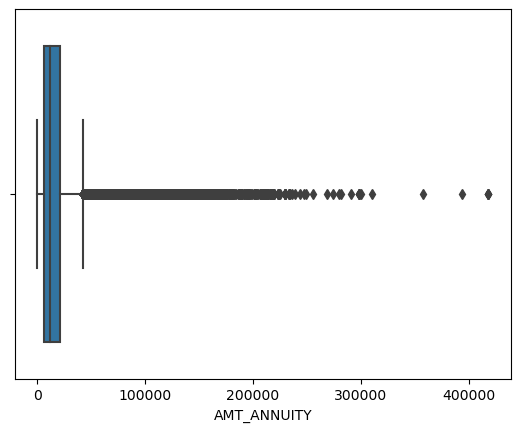

AMT_APPLICATION


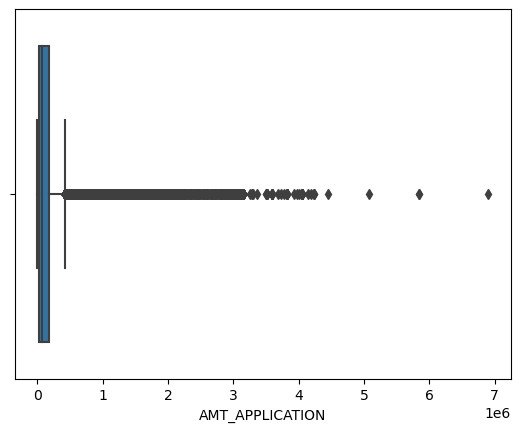

AMT_CREDIT


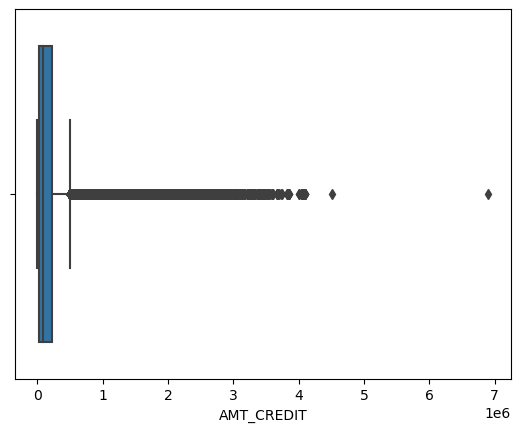

AMT_DOWN_PAYMENT


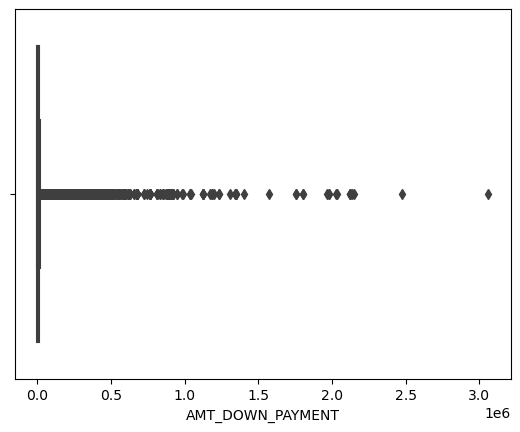

AMT_GOODS_PRICE


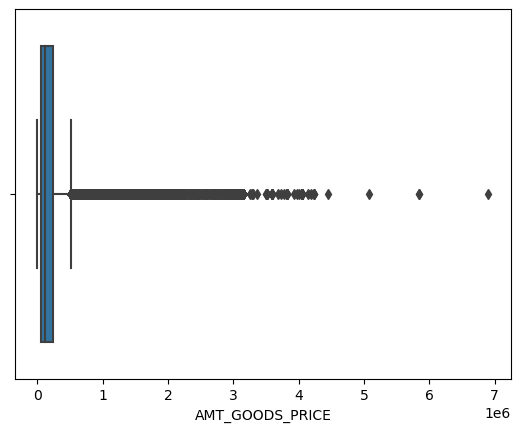

HOUR_APPR_PROCESS_START


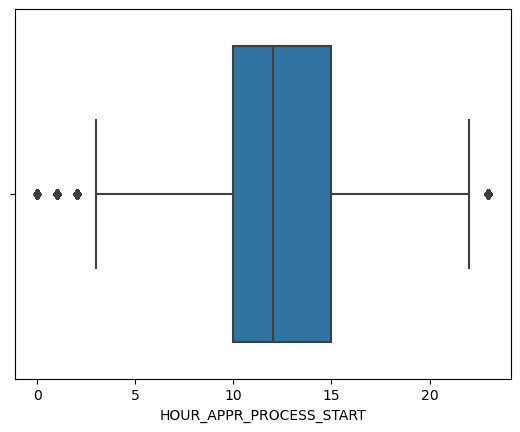

NFLAG_LAST_APPL_IN_DAY


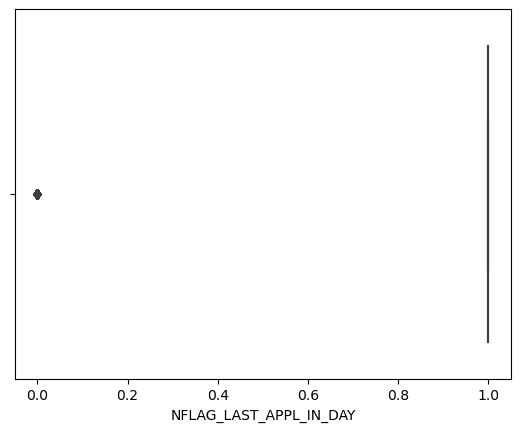

RATE_DOWN_PAYMENT


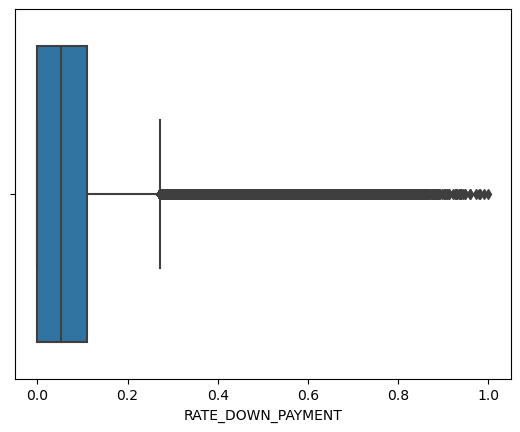

RATE_INTEREST_PRIMARY


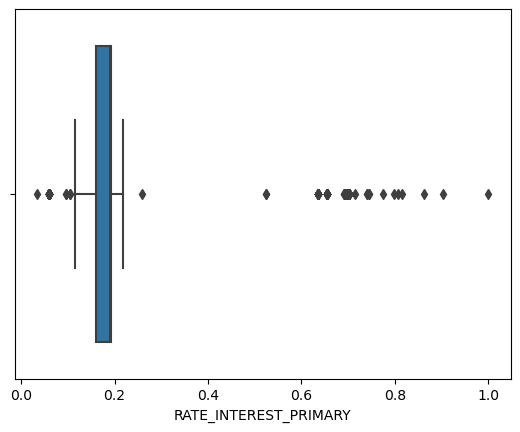

RATE_INTEREST_PRIVILEGED


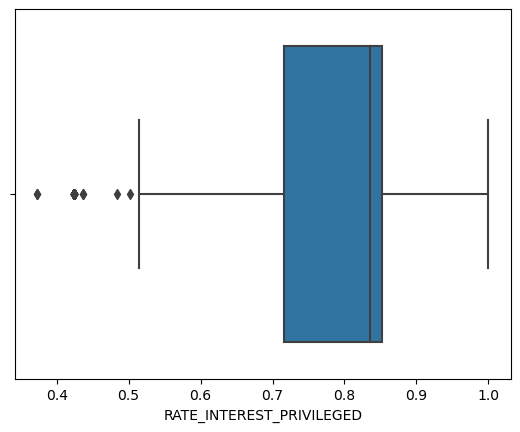

DAYS_DECISION


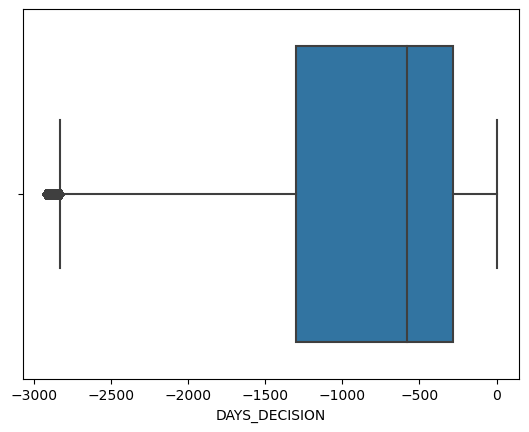

SELLERPLACE_AREA


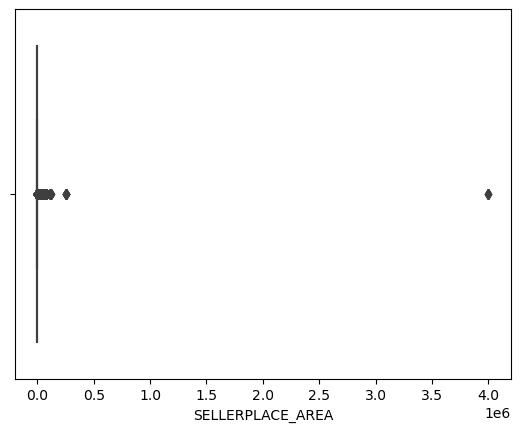

CNT_PAYMENT


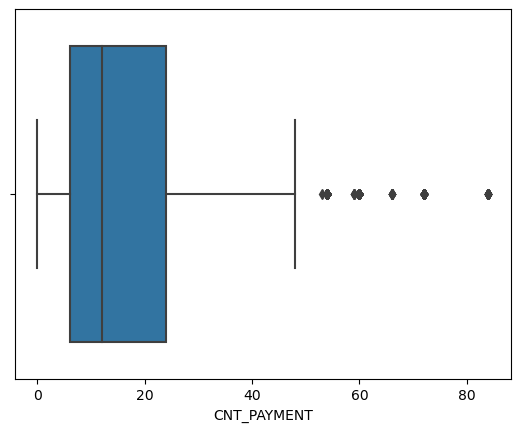

DAYS_FIRST_DRAWING


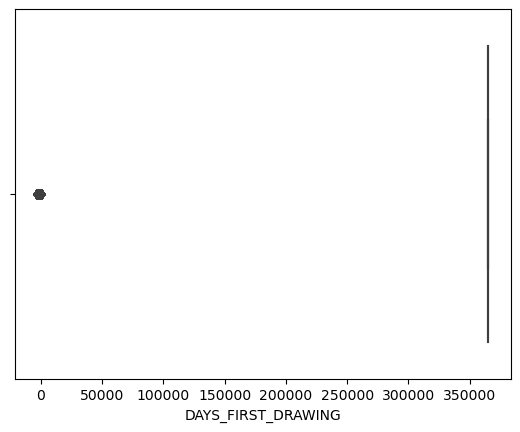

DAYS_FIRST_DUE


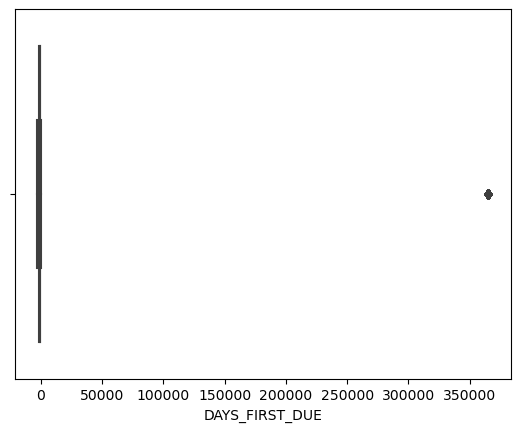

DAYS_LAST_DUE_1ST_VERSION


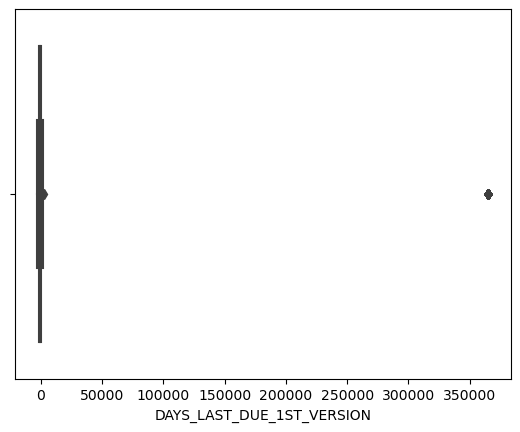

DAYS_LAST_DUE


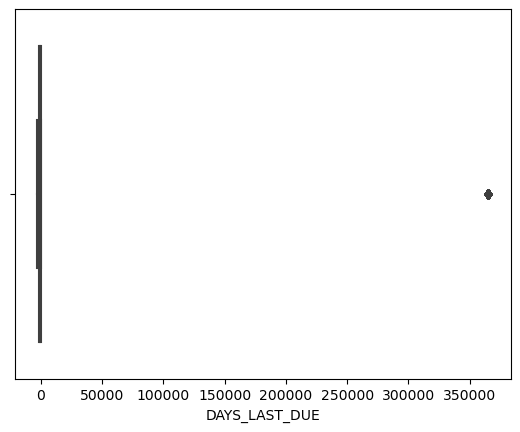

DAYS_TERMINATION


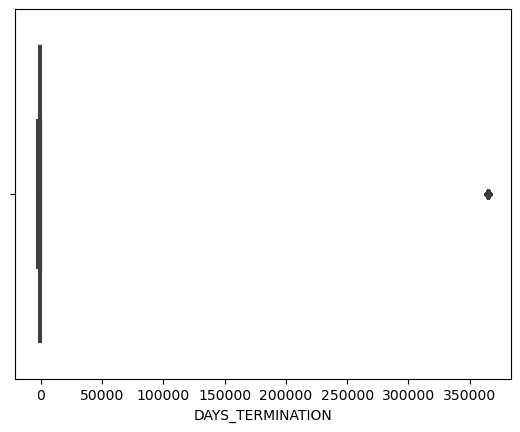

NFLAG_INSURED_ON_APPROVAL


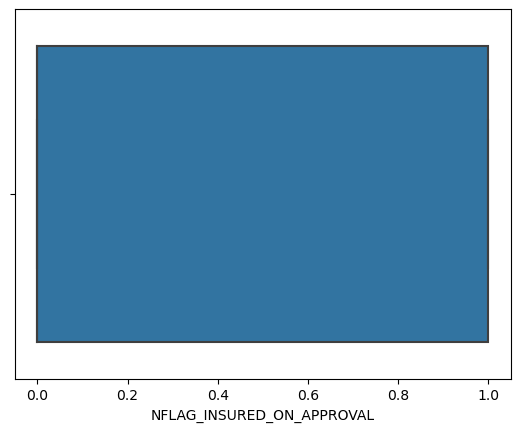

In [219]:
# On affiche les boxplots pour chaque variable à partir de "AMT_ANNUITY"
excluded_columns = ['SK_ID_CURR', 'SK_ID_PREV']

for column in var_num_pa.columns:
    if column == 'TARGET':
        continue
    if column not in excluded_columns:
        print(column)
        sns.boxplot(x=var_num_pa[column])
        plt.show()

Des valeurs extrêmes sont observées pour les variables DAYS_FIRST_DRAWING, DAYS_FIRST_DUE, DAYS_LAST_DUE_1ST_VERSION, DAYS_LAST_DUE, DAYS_TERMINATION où nous observons la valeur de 365243 comme nous l'avons déjà rencontrée. Nous allons converitr ces valeurs en NaN puisqu'elles correspondent à des données manquantes. 

Ensuite, nous allons traiter les/la valeur(s) extrêmes() pour la variable SELLERPLACE_AREA. 

In [220]:
# Nous allons traiter les valeurs aberrantes en remplaçant les valeurs 365 243 par NaN
previous_application['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
previous_application['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
previous_application['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
previous_application['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
previous_application['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)

var_num_pa['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
var_num_pa['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
var_num_pa['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
var_num_pa['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
var_num_pa['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)

pa_target['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
pa_target['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
pa_target['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
pa_target['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
pa_target['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)

In [221]:
# Nous allons traiter la valeur extrême de la variable SELLERPLACE_AREA
previous_application.sort_values(by='SELLERPLACE_AREA', ascending=False).head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_PORTFOLIO,CHANNEL_TYPE,SELLERPLACE_AREA,CNT_PAYMENT,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
151,2783413,269324,Consumer loans,5775.615,128205.0,128205.0,0.0,128205.0,SUNDAY,20,Y,1,0.0,NaN,NaN,Approved,-991,Cash through the bank,"Spouse, partner",Repeater,POS,Country-wide,4000000,24.0,POS industry without interest,NaN,-960.0,-270.0,-360.0,-354.0,0.0
919667,1125247,228186,Consumer loans,2887.830,64102.5,64102.5,0.0,64102.5,FRIDAY,18,Y,1,0.0,NaN,NaN,Approved,-864,Cash through the bank,Unaccompanied,New,POS,Country-wide,4000000,24.0,POS industry without interest,NaN,-833.0,-143.0,-143.0,-141.0,0.0
1427909,1993482,390387,Consumer loans,14535.180,121450.5,132138.0,0.0,121450.5,WEDNESDAY,13,Y,1,0.0,NaN,NaN,Approved,-379,Cash through the bank,NaN,New,POS,Country-wide,4000000,10.0,POS industry with interest,NaN,-348.0,-78.0,-78.0,-74.0,0.0
310061,2403159,450405,Consumer loans,3748.590,83209.5,83209.5,0.0,83209.5,SUNDAY,19,Y,1,0.0,NaN,NaN,Approved,-485,Cash through the bank,NaN,New,POS,Country-wide,4000000,24.0,POS industry without interest,NaN,-452.0,238.0,NaN,NaN,0.0
157014,2094519,392616,Consumer loans,19317.465,428800.5,428800.5,0.0,428800.5,FRIDAY,20,Y,1,0.0,NaN,NaN,Approved,-754,Cash through the bank,Unaccompanied,New,POS,Country-wide,4000000,24.0,POS industry without interest,NaN,-723.0,-33.0,-33.0,-31.0,0.0


Nous pouvons voir que cette valeur concerne différents prêts. Plutôt que de la supprimer, nous allons faire comme précédemment et la convertir en NaN. 

In [222]:
# Affichons cette valeur
high_val = previous_application.sort_values(by='SELLERPLACE_AREA', ascending=False).head(1)['SELLERPLACE_AREA']
print('La valeur maximale est de', high_val.iloc[0])

La valeur maximale est de 4000000


In [223]:
# Combien de lignes possèdent cette valeur? 
print(previous_application[previous_application['SELLERPLACE_AREA'] == 4000000].shape[0], 'lignes')

5 lignes


In [224]:
# Nous allons traiter les valeurs aberrantes en remplaçant les valeurs 4 000 000 par NaN
previous_application['SELLERPLACE_AREA'].replace(4000000, np.nan, inplace= True)

var_num_pa['SELLERPLACE_AREA'].replace(4000000, np.nan, inplace= True)

pa_target['SELLERPLACE_AREA'].replace(4000000, np.nan, inplace= True)

### 4.1.3. Traitement des valeurs manquantes

On va désormais <u>traiter les valeurs manquantes</u> avant notre feature engineering. 

- **Variables catégorielles** : 

Création d'une catégorie "Unknown" dans le cas où j'ai un grand nombre de valeurs manquantes > 10%. 
Imputation par la valeur la plus fréquente dans le cas où j'ai un plus faible nombre de valeurs manquantes < 10%.
                                                                                                                     
- **Variables numériques** : 

Imputation par la médiane dans le cas où j'ai un grand nombre de valeurs manquantes > 10%. 
Imputation par la valeur la plus fréquente dans le cas où j'ai un plus faible nombre de valeurs manquantes < 10%. 
Imputation par IterativeImputer lorsque j'ai peu de de valeurs manquantes < 10% et lorsque j'ai une variable, sans valeurs manquantes, corrélée. 

In [225]:
# Affichons les variables contenant des valeurs manquantes
pa_manq = previous_application.isnull().sum()
pa_manq = pa_manq[pa_manq > 0]
pa_manq

# On les divise à nouveau en variables catégorielles et numériques
var_cat_pa = previous_application.select_dtypes(include='object')
var_cat_pa_manq = var_cat_pa.columns[var_cat_pa.isnull().any()]
print('Variables catégorielles contenant des valeurs manquantes :')
print(var_cat_pa_manq)

print('------------------')
var_num_pa = previous_application.select_dtypes(include=['int64', 'float64'])
var_num_pa_manq = var_num_pa.columns[var_num_pa.isnull().any()]
print('Variables numériques contenant des valeurs manquantes :')
print(var_num_pa_manq)

Variables catégorielles contenant des valeurs manquantes :
Index(['NAME_TYPE_SUITE', 'PRODUCT_COMBINATION'], dtype='object')
------------------
Variables numériques contenant des valeurs manquantes :
Index(['AMT_ANNUITY', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'SELLERPLACE_AREA', 'CNT_PAYMENT',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')


#### a. Variables catégorielles

In [226]:
miss_val = var_cat_pa.isnull().sum()
miss_val

# Calcul du pourcentage de valeurs manquantes par variable
percentage_missing = (miss_val / len(var_cat_pa)) * 100

# Filtrage des variables avec des valeurs manquantes
variables_manquantes = percentage_missing[percentage_missing > 0]

# Affichage des variables avec le pourcentage de valeurs manquantes
print("Variables catégorielles avec des valeurs manquantes:")
for variable, pourcentage in variables_manquantes.items():
    print(f"{variable}: {pourcentage:.2f}%")

Variables catégorielles avec des valeurs manquantes:
NAME_TYPE_SUITE: 49.12%
PRODUCT_COMBINATION: 0.02%


In [227]:
# Imputation par "Unknown" pour "NAME_TYPE_SUITE"
previous_application.loc[previous_application['NAME_TYPE_SUITE'].isnull(), ['NAME_TYPE_SUITE']] = 'Unknown'

In [228]:
# Sélection de la valeur la plus fréquente pour "PRODUCT_COMBINATION"
most_freq = previous_application['PRODUCT_COMBINATION'].value_counts().reset_index().iloc[0,0]
print(most_freq, 'est la valeur la plus fréquente')

Cash est la valeur la plus fréquente


In [229]:
# Remplacer les valeurs manquantes par la valeur la plus fréquente
previous_application['PRODUCT_COMBINATION'] = previous_application['PRODUCT_COMBINATION'].fillna(most_freq)
pa_target['PRODUCT_COMBINATION'] = previous_application['PRODUCT_COMBINATION'].fillna(most_freq)

In [230]:
# Vérifions les différentes catégories
print(previous_application['NAME_TYPE_SUITE'].value_counts())
print('-------------------')
print(previous_application['PRODUCT_COMBINATION'].value_counts())

Unknown            820405
Unaccompanied      508970
Family             213263
Spouse, partner     67069
Children            31566
Other_B             17624
Other_A              9077
Group of people      2240
Name: NAME_TYPE_SUITE, dtype: int64
-------------------
Cash                              286336
POS household with interest       263622
POS mobile with interest          220670
Cash X-Sell: middle               143883
Cash X-Sell: low                  130248
Card Street                       112582
POS industry with interest         98833
POS household without interest     82908
Card X-Sell                        80582
Cash Street: high                  59639
Cash X-Sell: high                  59301
Cash Street: middle                34658
Cash Street: low                   33834
POS mobile without interest        24082
POS other with interest            23879
POS industry without interest      12602
POS others without interest         2555
Name: PRODUCT_COMBINATION, dtype: int64

#### b. Variables numériques

In [231]:
miss_val = var_num_pa.isnull().sum()
miss_val

# Calcul du pourcentage de valeurs manquantes par variable
percentage_missing = (miss_val / len(var_num_pa)) * 100

# Filtrage des variables avec des valeurs manquantes
variables_manquantes = percentage_missing[percentage_missing > 0]

# Affichage des variables avec le pourcentage de valeurs manquantes
print("Variables numériques avec des valeurs manquantes:")
for variable, pourcentage in variables_manquantes.items():
    print(f"{variable}: {pourcentage:.2f}%")

Variables numériques avec des valeurs manquantes:
AMT_ANNUITY: 22.29%
AMT_CREDIT: 0.00%
AMT_DOWN_PAYMENT: 53.64%
AMT_GOODS_PRICE: 23.08%
RATE_DOWN_PAYMENT: 53.64%
RATE_INTEREST_PRIMARY: 99.64%
RATE_INTEREST_PRIVILEGED: 99.64%
SELLERPLACE_AREA: 0.00%
CNT_PAYMENT: 22.29%
DAYS_FIRST_DRAWING: 96.25%
DAYS_FIRST_DUE: 42.73%
DAYS_LAST_DUE_1ST_VERSION: 45.92%
DAYS_LAST_DUE: 52.94%
DAYS_TERMINATION: 53.82%
NFLAG_INSURED_ON_APPROVAL: 40.30%


- <u>**Valeurs manquantes > 10%**</u>

In [232]:
# Sélectionons les variables dont le taux de valeurs manquantes est > 10%

# Calcul du pourcentage de valeurs manquantes par variable
pourcentage_manquant = previous_application.isnull().sum() / len(previous_application) * 100

# Sélection des variables avec plus de 10% de valeurs manquantes
vars_manq_sup_10 = pourcentage_manquant[pourcentage_manquant > 10].index

# Imputation par la médiane pour chaque variable
for var in vars_manq_sup_10:
    imputer = SimpleImputer(strategy='median')
    pa_target[var] = imputer.fit_transform(pa_target[[var]])
    previous_application[var] = imputer.transform(previous_application[[var]])

- <u>**Valeurs manquantes inf 10%**</u>

In [233]:
# Variables avec moins de 10% de valeurs manquantes
vars_manq_inf_10 = pourcentage_manquant[pourcentage_manquant < 10].index

# Imputation par la valeur la plus fréquente pour chaque variable
for var in vars_manq_inf_10:
    imputer = SimpleImputer(strategy='most_frequent')
    pa_target[var] = imputer.fit_transform(pa_target[[var]])
    previous_application[var] = imputer.transform(previous_application[[var]])

### 4.1.4. Doublons

In [234]:
print(previous_application[previous_application.duplicated()].shape[0], 'doublons.')

0 doublons.


### 4.1.5. Corrélations

Nous allons effectuer une heatmap des corrélations pour les variables catégorielles. 
Dans un premier temps, nous considérons la variable 'TARGET' en tant que variable catégorielle. 

Ensuite, nous utilisons **l'indice de similarité** (coefficient de Spearman) afin de mesurer la relation entre 2 variables. Pour cela, les variables catégorielles sont converties en variables numériques à l'aide de la méthode "astype('cat').cat.codes". 

#### a. Variables catégorielles

In [235]:
# On sélectionne les variables catégorielles
var_categ = pa_target.select_dtypes(include=['object']) 
var_categ.columns.tolist()

# Concaténation des variables catégorielles avec les variables binaires et la target
var_categ = pd.concat([var_categ] + [pa_target[['TARGET']]], axis=1)

# On veut qu'elles soient considérées comme des variables catégorielles
var_categ['TARGET'] = var_categ['TARGET'].astype('object')

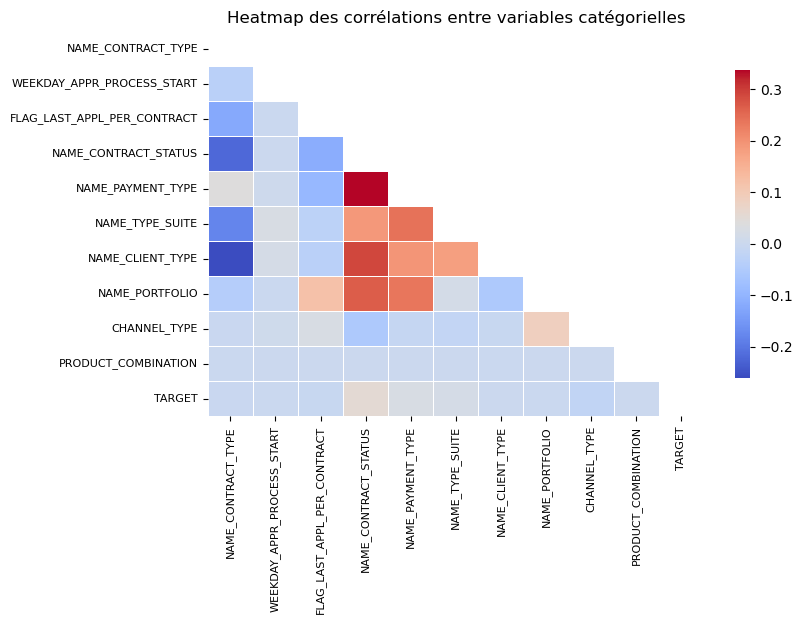

In [236]:
# Créer une copie des variables catégorielles pour effectuer les modifications
var_categ_encoded = var_categ.copy()

# Convertir les catégories en codes numériques
for column in var_categ_encoded.columns:
    var_categ_encoded[column] = var_categ_encoded[column].astype('category').cat.codes

# Calculer la matrice de corrélation
correlation_matrix = var_categ_encoded.corr(method='spearman')

# Créer une masque pour la moitié inférieure de la matrice de corrélation
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Afficher la heatmap
plt.figure(figsize=(8, 5))
heatmap = sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', linewidths=0.5,
            cbar_kws={"shrink": 0.8}, mask=mask)
plt.title('Heatmap des corrélations entre variables catégorielles', fontsize=12)

heatmap.set_xticklabels(heatmap.get_xticklabels(), size=8)
heatmap.set_yticklabels(heatmap.get_yticklabels(), size=8)

plt.show()

Certaines variables sont plus corrélées entre elles que d'autres, c'est le cas notamment de "NAME_CONTRACT_STATUS" et "NAME_PAYMENT_TYPE". 

In [237]:
# Calculer les corrélations avec la variable spécifique
correlations = correlation_matrix.loc[:, 'TARGET'].sort_values(ascending=False)

# Sélectionner les 3 premières variables les plus corrélées
top_3_correlated_variables = correlations[1:4].index.tolist()

# Afficher les résultats avec les valeurs de corrélation
print(f"Les 3 premières variables les plus corrélées avec 'TARGET' sont :")
for variable in top_3_correlated_variables:
    correlation_value = correlation_matrix.loc[variable, 'TARGET']
    print(f"{variable}: {correlation_value:.2f}")

Les 3 premières variables les plus corrélées avec 'TARGET' sont :
NAME_CONTRACT_STATUS: 0.05
NAME_PAYMENT_TYPE: 0.03
NAME_TYPE_SUITE: 0.02


#### b. Variables numériques

In [238]:
# On sélectionne à nouveau les variables numériques
var_num = pa_target.select_dtypes(include=['float64', 'int'])
var_num.columns

Index(['SK_ID_CURR', 'TARGET', 'SK_ID_PREV', 'AMT_ANNUITY', 'AMT_APPLICATION',
       'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'HOUR_APPR_PROCESS_START', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'SELLERPLACE_AREA',
       'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE',
       'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION',
       'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

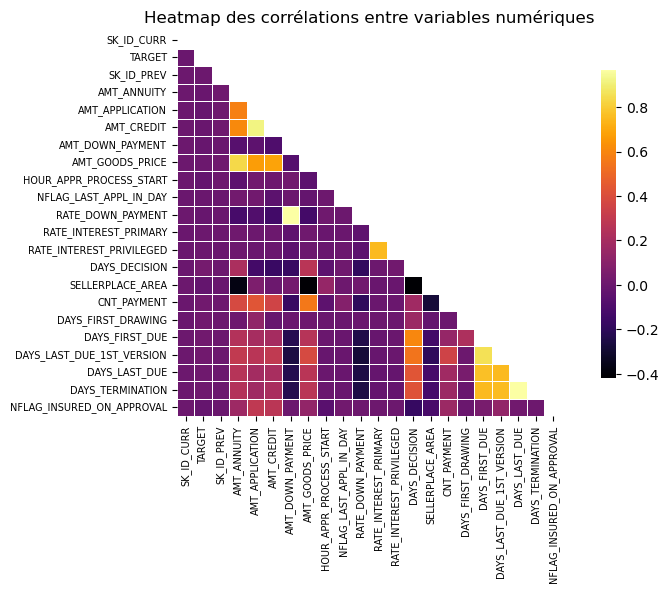

In [239]:
# Calculer la matrice de corrélation
correlation_matrix = var_num.corr(method='spearman')

# Créer une masque pour la moitié inférieure de la matrice de corrélation
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Afficher la heatmap
plt.figure(figsize=(10, 5))
heatmap = sns.heatmap(correlation_matrix, square=True, annot=False, annot_kws={"size": 7},
            fmt=".2f", cmap='inferno', linewidths=0.5, mask=mask, cbar_kws={"shrink": 0.8})
heatmap.set_xticklabels(heatmap.get_xticklabels(), size=7)
heatmap.set_yticklabels(heatmap.get_yticklabels(), size=7)
plt.title('Heatmap des corrélations entre variables numériques', fontsize=12)
plt.show()

Certaines variable semblent plutôt bien corrélées entre elles, c'est le cas de "DAYS_LAST_DUE" avec "DAY_FIRST_DUE", "DAYS_LAST_DUE_1ST_VERSION" et "DAYS_TERMINATION". On retrouve à nouveau "AMT_GOODS_PRICE" et "AMT_ANNUITY". 

In [240]:
# Calculer les corrélations avec la variable spécifique
correlations = correlation_matrix.loc[:, 'TARGET'].sort_values(ascending=False)

# Sélectionner les 3 premières variables les plus corrélées
top_3_correlated_variables = correlations[1:4].index.tolist()

# Afficher les résultats avec les valeurs de corrélation
print(f"Les 3 premières variables les plus corrélées avec 'TARGET' sont :")
for variable in top_3_correlated_variables:
    correlation_value = correlation_matrix.loc[variable, 'TARGET']
    print(f"{variable}: {correlation_value:.2f}")

Les 3 premières variables les plus corrélées avec 'TARGET' sont :
DAYS_DECISION: 0.04
DAYS_FIRST_DUE: 0.02
CNT_PAYMENT: 0.02


## 4.2. Feature engineering

Pour la partie feature engineering, nous allons nous baser sur ce qui a été fait par le kernel Kaggle ayant remporté la compétition. 

In [241]:
# Encodage des variables catégorielles
prev, cat_prev = one_hot_encoder(previous_application, nan_as_category=True)

In [242]:
# % de la somme demandée par le client par rapport à la somme de crédit accordée pour chaque demande de prêt précédente
prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']

In [243]:
# Mesures (min, max, mean) pour variables numériques
num_aggregations_prev = {
    'AMT_ANNUITY': ['min', 'max', 'mean'],
    'AMT_APPLICATION': ['min', 'max', 'mean'],
    'AMT_CREDIT': ['min', 'max', 'mean'],
    'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
    'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
    'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
    'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
    'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
    'DAYS_DECISION': ['min', 'max', 'mean'],
    'CNT_PAYMENT': ['mean', 'sum'],
}

In [244]:
# Mesures (mean) pour variables catégorielles
cat_aggregations_prev = {}
for cat in cat_cols:
    cat_aggregations[cat] = ['mean']

In [245]:
# Agrégation sur les variables numériques et catégorielles selon les mesures définies
prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations_prev, **cat_aggregations_prev})

# Nommés en ajoutant le préfixe "PREV_"
prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])

In [246]:
# Sélection des demandes approuvées et application des mesures d'agrégations numériques
approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations_prev)
approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')

In [247]:
# Sélection des demandes refusées et application des mesures d'agrégations numériques
refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations_prev)
refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')

In [248]:
# On va d'abord regarder si on a des valeurs infinies
prev_agg.columns[prev_agg.apply(lambda x: np.isinf(x).any())].tolist()

['PREV_APP_CREDIT_PERC_MAX', 'REFUSED_APP_CREDIT_PERC_MAX']

In [249]:
# On transforme ces valeurs infinies en NaN
prev_agg.replace([np.inf, -np.inf], np.nan, inplace=True)

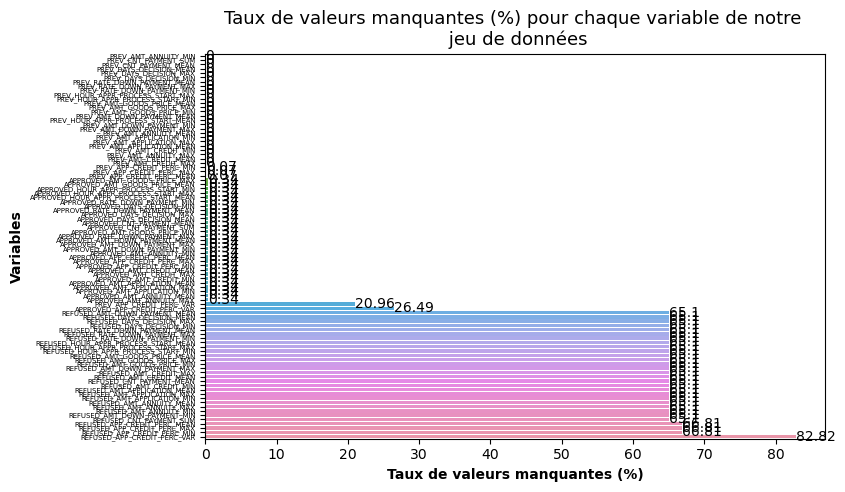

In [250]:
# Affichons les valeurs manquantes
# On affiche les valeurs manquantes

# On crée un nouveau df des données manquantes
val_manq = pd.DataFrame(round(prev_agg.isnull().sum()/len(prev_agg)*100, 2)).reset_index()
val_manq = val_manq.rename(columns={0: 'val_manq'})
val_manq = val_manq.sort_values(by='val_manq', ascending=True)

# On crée un barplot affichant le taux de valeurs manquantes
# pour chaque variable
plt.figure(figsize=(8, 5))

ax = sns.barplot(data=val_manq, x="val_manq", y="index", ci=None, dodge=False)

plt.xlabel('Taux de valeurs manquantes (%)', size=10, fontweight='bold')
plt.ylabel('Variables', size=10, fontweight='bold')
plt.title('Taux de valeurs manquantes (%) pour chaque variable'
          ' de notre \n jeu de données', size=13)

plt.yticks(size=5)
plt.xticks(size=10)

for i in ax.containers:
    ax.bar_label(i,)

plt.show()

Imputation par la médiane dans le cas où les valeurs manquantes sont > 10%.

In [251]:
# Calcul du pourcentage de valeurs manquantes par variable
pourcentage_manquant = prev_agg.isnull().sum() / len(prev_agg) * 100

# Variables avec plus de 10% de valeurs manquantes
vars_manq_sup_10 = pourcentage_manquant[pourcentage_manquant > 10].index

# Imputation par la médiane pour chaque variable
for var in vars_manq_sup_10:
    imputer = SimpleImputer(strategy='median')
    prev_agg[var] = imputer.fit_transform(prev_agg[[var]])

Imputation par la valeur la plus fréquente dans le cas où les valeurs manquantes sont < 10%.

In [252]:
# Variables avec moins de 10% de valeurs manquantes
vars_manq_inf_10 = pourcentage_manquant[pourcentage_manquant < 10].index

# Imputation par la valeur la plus fréquente pour chaque variable
for var in vars_manq_inf_10:
    imputer = SimpleImputer(strategy='most_frequent')
    prev_agg[var] = imputer.fit_transform(prev_agg[[var]])

In [253]:
# Vérifions que l'on n'a plus de valeurs manquantes
val_manq_somme = prev_agg.isnull().sum()
val_manq_somme[val_manq_somme > 0]

Series([], dtype: int64)

# 5. Fichier POS_CASH_balance.csv

In [254]:
# Affichage des dimensions de notre fichier
print('Fichier previous_application.csv :')
print('Notre fichier est constitués de', pos_cash_balance.shape[0], 'lignes et de', pos_cash_balance.shape[1], 'colonnes')

Fichier previous_application.csv :
Notre fichier est constitués de 10001358 lignes et de 8 colonnes


## 5.1. Analyse exploratoire et nettoyage des données

In [255]:
pos_cash_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


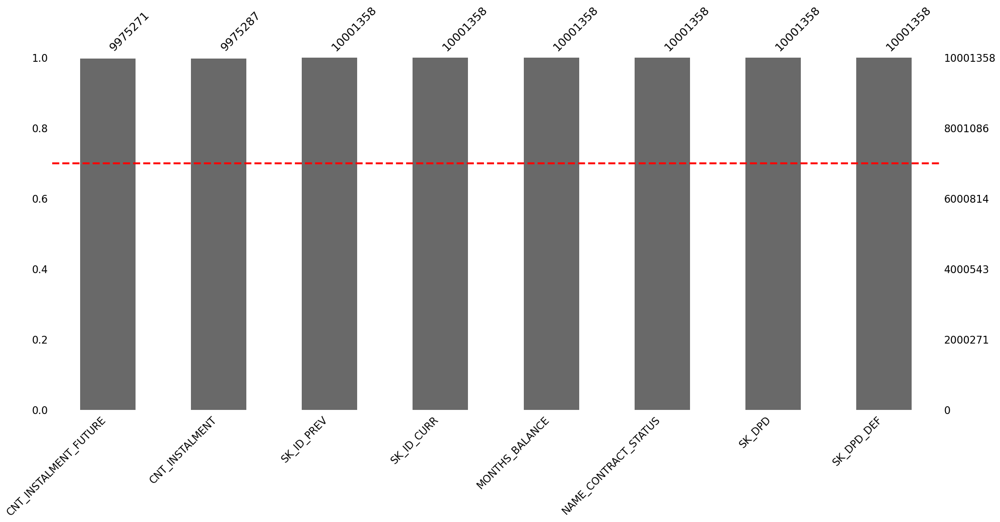

In [256]:
# On affiche les valeurs manquantes
val_manq_msno(pos_cash_balance)

In [257]:
val_manq_pos = pos_cash_balance.isnull().sum()
len(val_manq_pos[val_manq_pos > 0])

2

Parmis les variables, aucune ne contient de valeurs manquantes > 30%. Mais nous observons tout de même 2 variables avec des valeurs manquantes. 

In [258]:
# Nous allons placer d'un côté les variables catégorielles
# et d'un autre les variables numériques

var_cat_pos = pos_cash_balance.select_dtypes(include='object')
print('Variables catégorielles')
print(var_cat_pos.columns)
print('--------------')
print('Variables numériques')
var_num_pos = pos_cash_balance.select_dtypes(include=['int64', 'float64'])
print(var_num_pos.columns)

Variables catégorielles
Index(['NAME_CONTRACT_STATUS'], dtype='object')
--------------
Variables numériques
Index(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'CNT_INSTALMENT',
       'CNT_INSTALMENT_FUTURE', 'SK_DPD', 'SK_DPD_DEF'],
      dtype='object')


In [259]:
print(len(var_cat_pos.columns), 'variables sont catégorielles')
print(len(var_num_pos.columns), 'variables sont numériques')

1 variables sont catégorielles
7 variables sont numériques


In [260]:
# Valeurs uniques
var_pos = pos_cash_balance.columns.tolist()
for var in var_pos:
    print(var, ':', pos_cash_balance[var].nunique())

SK_ID_PREV : 936325
SK_ID_CURR : 337252
MONTHS_BALANCE : 96
CNT_INSTALMENT : 73
CNT_INSTALMENT_FUTURE : 79
NAME_CONTRACT_STATUS : 9
SK_DPD : 3400
SK_DPD_DEF : 2307


In [261]:
# Nous allons joindre la target de notre fichier application_train.csv avec nos données

application_target = application_clean[['SK_ID_CURR', 'TARGET']]
pos_target = application_target.merge(pos_cash_balance, on = 'SK_ID_CURR', how = 'left')

In [262]:
# Nous redéfinissons nos variables catégorielles et numériques

var_cat_pos = pos_cash_balance.select_dtypes(include='object')
print('Variables catégorielles')
print(var_cat_pos.columns)
print('--------------')
print('Variables numériques')
var_num_pos = pos_cash_balance.select_dtypes(include=['int64', 'float64'])
print(var_num_pos.columns)

Variables catégorielles
Index(['NAME_CONTRACT_STATUS'], dtype='object')
--------------
Variables numériques
Index(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'CNT_INSTALMENT',
       'CNT_INSTALMENT_FUTURE', 'SK_DPD', 'SK_DPD_DEF'],
      dtype='object')


In [263]:
# Sélection des clients ayant des défauts de paiements (target = 1)
pos_target_1 = pos_target[pos_target['TARGET'] == 1]

### 5.1.1. Analyse variable catégorielle

Variable NAME_CONTRACT_STATUS
9 catégories différentes
Description: Contract status during the month


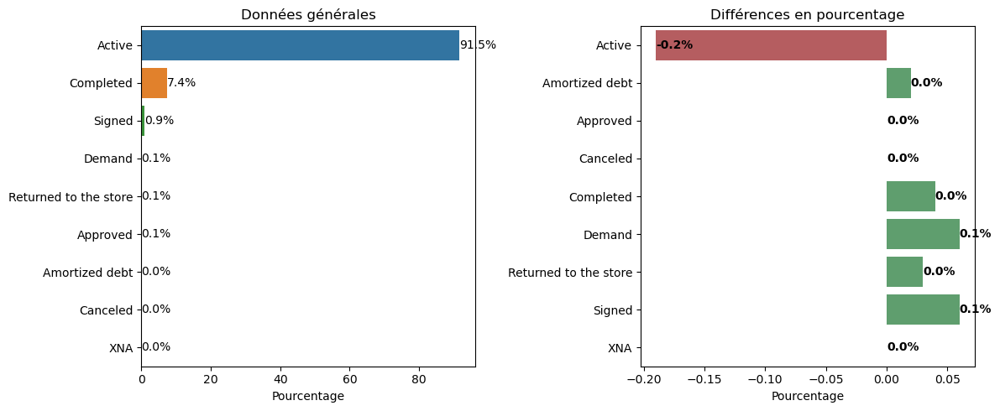

In [264]:
# Pour chaque variable catégorielle, on va afficher un graphique
# des catégories qu'elles contiennent et leur description
var_cat_target(var_cat_pos, pos_target, pos_target_1, 'POS_CASH_balance.csv')

On observe que la majorité des contrats pendant le mois sont de type "actif" (91.5%). 

In [265]:
# Conversion des catégories XNA en "Unknown"

var_cat_pos['NAME_CONTRACT_STATUS'] = var_cat_pos['NAME_CONTRACT_STATUS'].replace('XNA', 'Unknown')
pos_target['NAME_CONTRACT_STATUS'] = pos_target['NAME_CONTRACT_STATUS'].replace('XNA', 'Unknown')
pos_cash_balance['NAME_CONTRACT_STATUS'] = pos_cash_balance['NAME_CONTRACT_STATUS'].replace('XNA', 'Unknown')

### 5.1.2. Analyse variables numériques

In [266]:
for column in var_num_pos.columns:
    if column == 'TARGET':
        continue
    print('Variable', column)
    matches = home_credit[(home_credit['Table'] == 'POS_CASH_balance.csv') & (home_credit['Row'] == column)]
    if not matches.empty:
        print('Description:', matches['Description'].values[0])
    else:
        print('Description not found')
    print('\n')

Variable SK_ID_PREV
Description not found


Variable SK_ID_CURR
Description: ID of loan in our sample


Variable MONTHS_BALANCE
Description: Month of balance relative to application date (-1 means the information to the freshest monthly snapshot, 0 means the information at application - often it will be the same as -1 as many banks are not updating the information to Credit Bureau regularly )


Variable CNT_INSTALMENT
Description: Term of previous credit (can change over time)


Variable CNT_INSTALMENT_FUTURE
Description: Installments left to pay on the previous credit


Variable SK_DPD
Description: DPD (days past due) during the month of previous credit


Variable SK_DPD_DEF
Description: DPD during the month with tolerance (debts with low loan amounts are ignored) of the previous credit




MONTHS_BALANCE


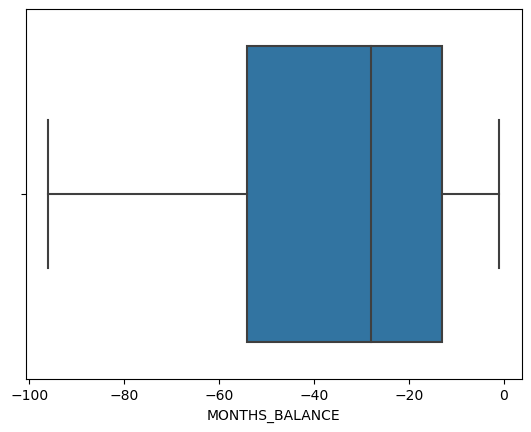

CNT_INSTALMENT


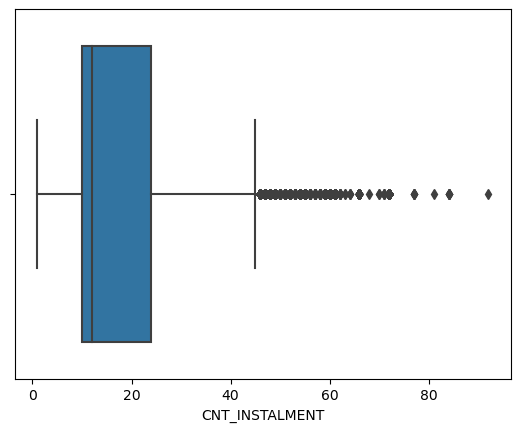

CNT_INSTALMENT_FUTURE


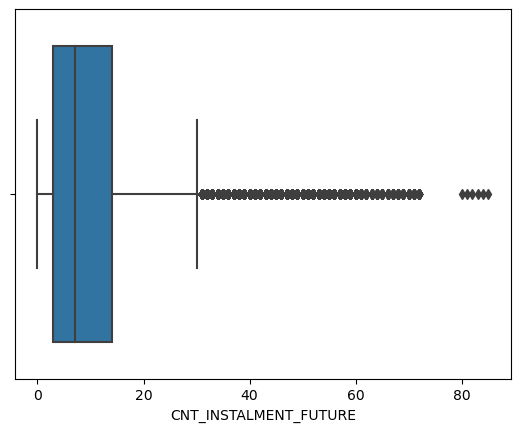

SK_DPD


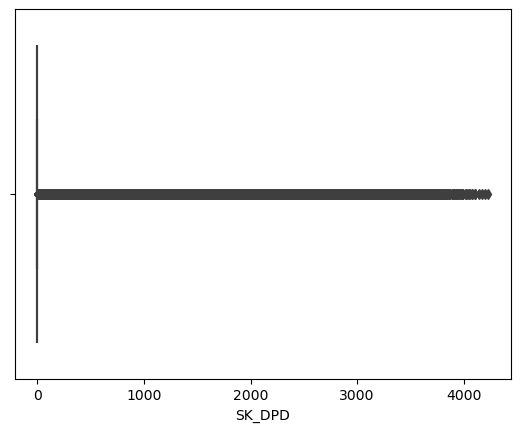

SK_DPD_DEF


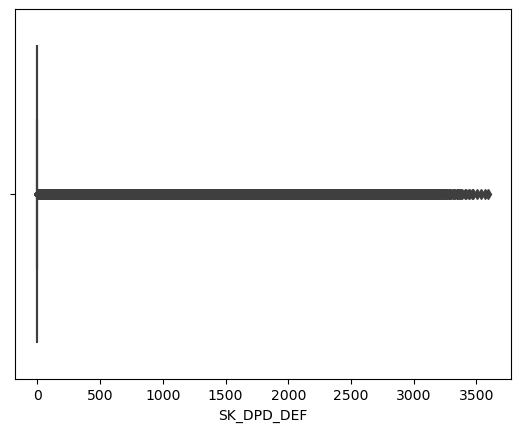

In [267]:
# On affiche les boxplots pour chaque variable à partir de "MONTHS_BALANCE"
excluded_columns = ['SK_ID_CURR', 'SK_ID_PREV']

for column in var_num_pos.columns:
    if column == 'TARGET':
        continue
    if column not in excluded_columns:
        print(column)
        sns.boxplot(x=var_num_pos[column])
        plt.show()

### 5.1.3. Traitement des valeurs manquantes

On va désormais <u>traiter les valeurs manquantes</u> avant notre feature engineering. 

- **Variables catégorielles** : 

Création d'une catégorie "Unknown" dans le cas où j'ai un grand nombre de valeurs manquantes > 10%. 
Imputation par la valeur la plus fréquente dans le cas où j'ai un plus faible nombre de valeurs manquantes < 10%.
                                                                                                                     
- **Variables numériques** : 

Imputation par la médiane dans le cas où j'ai un grand nombre de valeurs manquantes > 10%. 
Imputation par la valeur la plus fréquente dans le cas où j'ai un plus faible nombre de valeurs manquantes < 10%. 
Imputation par IterativeImputer lorsque j'ai peu de de valeurs manquantes < 10% et lorsque j'ai une variable, sans valeurs manquantes, corrélée. 

In [268]:
# Affichons les variables contenant des valeurs manquantes
pa_manq = pos_cash_balance.isnull().sum()
pa_manq = pa_manq[pa_manq > 0]
pa_manq

# On les divise à nouveau en variables catégorielles et numériques
var_cat_pos = pos_cash_balance.select_dtypes(include='object')
var_cat_pos_manq = var_cat_pos.columns[var_cat_pos.isnull().any()]
print('Variables catégorielles contenant des valeurs manquantes :')
print(var_cat_pos_manq)

print('------------------')
var_num_pos = pos_cash_balance.select_dtypes(include=['int64', 'float64'])
var_num_pos_manq = var_num_pos.columns[var_num_pos.isnull().any()]
print('Variables numériques contenant des valeurs manquantes :')
print(var_num_pos_manq)

Variables catégorielles contenant des valeurs manquantes :
Index([], dtype='object')
------------------
Variables numériques contenant des valeurs manquantes :
Index(['CNT_INSTALMENT', 'CNT_INSTALMENT_FUTURE'], dtype='object')


#### a. Variables numériques

In [269]:
miss_val = var_num_pos.isnull().sum()
miss_val

# Calcul du pourcentage de valeurs manquantes par variable
percentage_missing = (miss_val / len(var_num_pos)) * 100

# Filtrage des variables avec des valeurs manquantes
variables_manquantes = percentage_missing[percentage_missing > 0]

# Affichage des variables avec le pourcentage de valeurs manquantes
print("Variables numériques avec des valeurs manquantes:")
for variable, pourcentage in variables_manquantes.items():
    print(f"{variable}: {pourcentage:.2f}%")

Variables numériques avec des valeurs manquantes:
CNT_INSTALMENT: 0.26%
CNT_INSTALMENT_FUTURE: 0.26%


- <u>**Valeurs manquantes inf 10%**</u>

In [270]:
# Calcul du pourcentage de valeurs manquantes par variable
pourcentage_manquant = pos_cash_balance.isnull().sum() / len(pos_cash_balance) * 100

# Variables avec moins de 10% de valeurs manquantes
vars_manq_inf_10 = pourcentage_manquant[pourcentage_manquant < 10].index

# Imputation par la valeur la plus fréquente pour chaque variable
for var in vars_manq_inf_10:
    imputer = SimpleImputer(strategy='most_frequent')
    pos_target[var] = imputer.fit_transform(pos_target[[var]])
    pos_cash_balance[var] = imputer.transform(pos_cash_balance[[var]])

### 5.1.4. Doublons

In [271]:
print(pos_cash_balance[pos_cash_balance.duplicated()].shape[0], 'doublons.')

0 doublons.


### 5.1.5. Corrélations

Nous allons effectuer une heatmap des corrélations pour les variables catégorielles. 
Dans un premier temps, nous considérons la variable 'TARGET' en tant que variable catégorielle. 

Ensuite, nous utilisons **l'indice de similarité** (coefficient de Spearman) afin de mesurer la relation entre 2 variables. Pour cela, les variables catégorielles sont converties en variables numériques à l'aide de la méthode "astype('cat').cat.codes". 

#### a. Variables catégorielles

In [272]:
# On sélectionne les variables catégorielles
var_categ = pos_target.select_dtypes(include=['object']) 
var_categ.columns.tolist()

# Concaténation des variables catégorielles avec les variables binaires et la target
var_categ = pd.concat([var_categ] + [pos_target[['TARGET']]], axis=1)

# On veut qu'elles soient considérées comme des variables catégorielles
var_categ['TARGET'] = var_categ['TARGET'].astype('object')

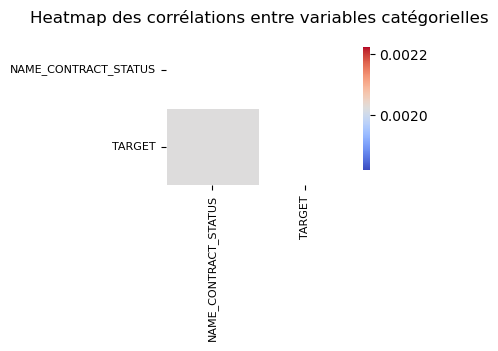

In [273]:
# Créer une copie des variables catégorielles pour effectuer les modifications
var_categ_encoded = var_categ.copy()

# Convertir les catégories en codes numériques
for column in var_categ_encoded.columns:
    var_categ_encoded[column] = var_categ_encoded[column].astype('category').cat.codes

# Calculer la matrice de corrélation
correlation_matrix = var_categ_encoded.corr(method='spearman')

# Créer une masque pour la moitié inférieure de la matrice de corrélation
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Afficher la heatmap
plt.figure(figsize=(3, 2))
heatmap = sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', linewidths=0.5,
            cbar_kws={"shrink": 0.8}, mask=mask)
plt.title('Heatmap des corrélations entre variables catégorielles', fontsize=12)

heatmap.set_xticklabels(heatmap.get_xticklabels(), size=8)
heatmap.set_yticklabels(heatmap.get_yticklabels(), size=8)

plt.show()

#### b. Variables numériques

In [274]:
# On sélectionne à nouveau les variables numériques
var_num = pos_target.select_dtypes(include=['float64', 'int'])
var_num.columns

Index(['SK_ID_CURR', 'TARGET', 'SK_ID_PREV', 'MONTHS_BALANCE',
       'CNT_INSTALMENT', 'CNT_INSTALMENT_FUTURE', 'SK_DPD', 'SK_DPD_DEF'],
      dtype='object')

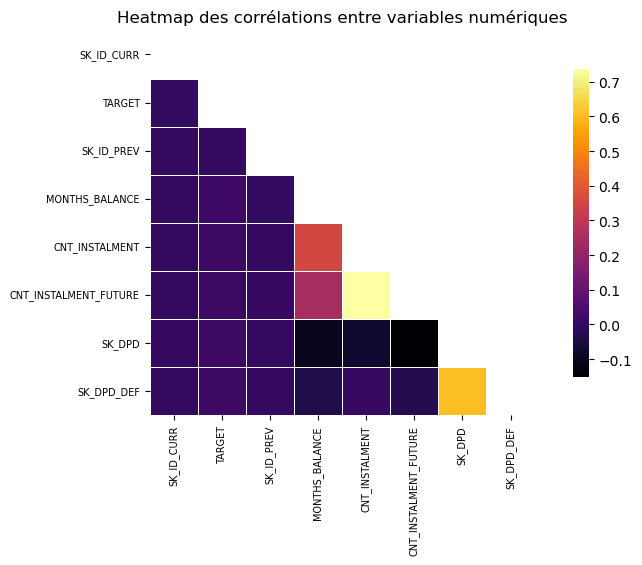

In [275]:
# Calculer la matrice de corrélation
correlation_matrix = var_num.corr(method='spearman')

# Créer une masque pour la moitié inférieure de la matrice de corrélation
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Afficher la heatmap
plt.figure(figsize=(10, 5))
heatmap = sns.heatmap(correlation_matrix, square=True, annot=False, annot_kws={"size": 7},
            fmt=".2f", cmap='inferno', linewidths=0.5, mask=mask, cbar_kws={"shrink": 0.8})
heatmap.set_xticklabels(heatmap.get_xticklabels(), size=7)
heatmap.set_yticklabels(heatmap.get_yticklabels(), size=7)
plt.title('Heatmap des corrélations entre variables numériques', fontsize=12)
plt.show()

In [276]:
# Calculer les corrélations avec la variable spécifique
correlations = correlation_matrix.loc[:, 'TARGET'].sort_values(ascending=False)

# Sélectionner les 3 premières variables les plus corrélées
top_3_correlated_variables = correlations[1:4].index.tolist()

# Afficher les résultats avec les valeurs de corrélation
print(f"Les 3 premières variables les plus corrélées avec 'TARGET' sont :")
for variable in top_3_correlated_variables:
    correlation_value = correlation_matrix.loc[variable, 'TARGET']
    print(f"{variable}: {correlation_value:.2f}")

Les 3 premières variables les plus corrélées avec 'TARGET' sont :
MONTHS_BALANCE: 0.02
SK_DPD: 0.02
SK_DPD_DEF: 0.02


La variable "CNT_INSTALMENTS_FUTURE" et "CNT_INSTALMENT" sont corrélées. 

## 5.2. Feature engineering

Pour la partie feature engineering, nous allons nous baser sur ce qui a été fait par le kernel Kaggle ayant remporté la compétition. 

In [277]:
# Encodage des variables catégorielles
pos, cat_cols = one_hot_encoder(pos_cash_balance, nan_as_category= True)

In [278]:
# Mesures agrégatives pour les variables (max, mean, size)
aggregations_pos = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
}

In [279]:
# Ajout de la variable catégorielle au dictionnaire
for cat in cat_cols:
        aggregations_pos[cat] = ['mean']

In [280]:
# Agrégation des données après regroupement
pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations_pos)
pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])

In [281]:
# Comptage des comptes cash pos
pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()

In [282]:
# On va d'abord regarder si on a des valeurs infinies
pos_agg.columns[pos_agg.apply(lambda x: np.isinf(x).any())].tolist()

[]

In [283]:
# Regardons si on a des valeurs manquantes
pos_agg.isnull().sum()

POS_MONTHS_BALANCE_MAX                                 0
POS_MONTHS_BALANCE_MEAN                                0
POS_MONTHS_BALANCE_SIZE                                0
POS_SK_DPD_MAX                                         0
POS_SK_DPD_MEAN                                        0
POS_SK_DPD_DEF_MAX                                     0
POS_SK_DPD_DEF_MEAN                                    0
POS_NAME_CONTRACT_STATUS_Active_MEAN                   0
POS_NAME_CONTRACT_STATUS_Amortized debt_MEAN           0
POS_NAME_CONTRACT_STATUS_Approved_MEAN                 0
POS_NAME_CONTRACT_STATUS_Canceled_MEAN                 0
POS_NAME_CONTRACT_STATUS_Completed_MEAN                0
POS_NAME_CONTRACT_STATUS_Demand_MEAN                   0
POS_NAME_CONTRACT_STATUS_Returned to the store_MEAN    0
POS_NAME_CONTRACT_STATUS_Signed_MEAN                   0
POS_NAME_CONTRACT_STATUS_Unknown_MEAN                  0
POS_NAME_CONTRACT_STATUS_nan_MEAN                      0
POS_COUNT                      

Pas de nettoyage à faire. 

# 6. Fichier installments_payments.csv

In [284]:
# Affichage des dimensions de notre fichier
print('Fichier installments_payments.csv :')
print('Notre fichier est constitués de', installments.shape[0], 'lignes et de', installments.shape[1], 'colonnes')

Fichier installments_payments.csv :
Notre fichier est constitués de 13605401 lignes et de 8 colonnes


## 6.1. Analyse exploratoire et nettoyage des données

In [285]:
installments.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


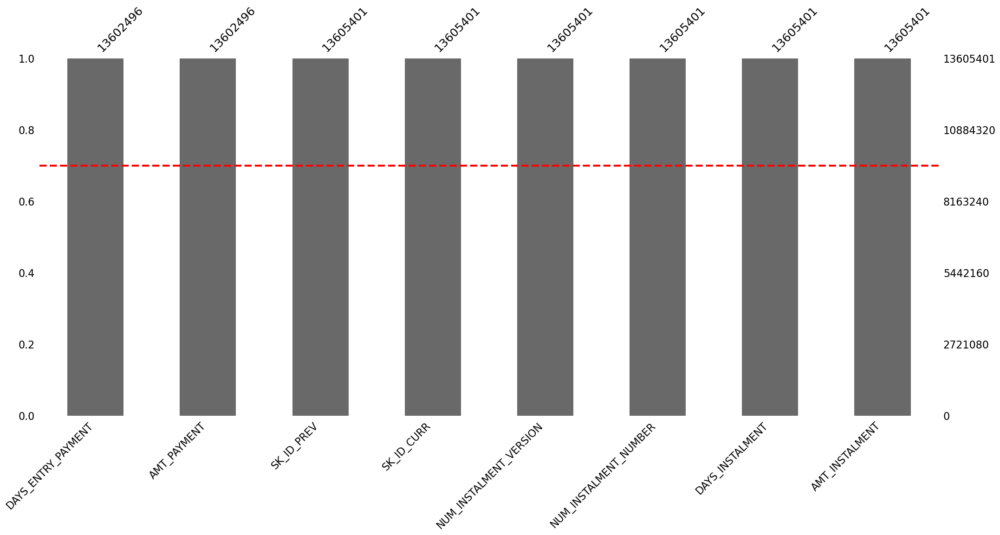

In [286]:
# On affiche les valeurs manquantes
val_manq_msno(installments)

In [287]:
val_manq_inst = installments.isnull().sum()
len(val_manq_inst[val_manq_inst > 0])

2

2 variables contenant des données manquantes. 

In [288]:
# Nous allons placer d'un côté les variables catégorielles
# et d'un autre les variables numériques

var_cat_inst = installments.select_dtypes(include='object')
print('Variables catégorielles')
print(var_cat_inst.columns)
print('--------------')
print('Variables numériques')
var_num_inst = installments.select_dtypes(include=['int64', 'float64'])
print(var_num_inst.columns)

Variables catégorielles
Index([], dtype='object')
--------------
Variables numériques
Index(['SK_ID_PREV', 'SK_ID_CURR', 'NUM_INSTALMENT_VERSION',
       'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT',
       'AMT_INSTALMENT', 'AMT_PAYMENT'],
      dtype='object')


In [289]:
print(len(var_cat_inst.columns), 'variables sont catégorielles')
print(len(var_num_inst.columns), 'variables sont numériques')

0 variables sont catégorielles
8 variables sont numériques


In [290]:
# Valeurs uniques
var_inst = installments.columns.tolist()
for var in var_inst:
    print(var, ':', installments[var].nunique())

SK_ID_PREV : 997752
SK_ID_CURR : 339587
NUM_INSTALMENT_VERSION : 65
NUM_INSTALMENT_NUMBER : 277
DAYS_INSTALMENT : 2922
DAYS_ENTRY_PAYMENT : 3039
AMT_INSTALMENT : 902539
AMT_PAYMENT : 944235


In [291]:
# Nous allons joindre la target de notre fichier application_train.csv avec nos données

application_target = application_clean[['SK_ID_CURR', 'TARGET']]
inst_target = application_target.merge(installments, on = 'SK_ID_CURR', how = 'left')

In [292]:
# Nous redéfinissons nos variables catégorielles et numériques

var_cat_inst = installments.select_dtypes(include='object')
print('Variables catégorielles')
print(var_cat_inst.columns)
print('--------------')
print('Variables numériques')
var_num_inst = installments.select_dtypes(include=['int64', 'float64'])
print(var_num_inst.columns)

Variables catégorielles
Index([], dtype='object')
--------------
Variables numériques
Index(['SK_ID_PREV', 'SK_ID_CURR', 'NUM_INSTALMENT_VERSION',
       'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT',
       'AMT_INSTALMENT', 'AMT_PAYMENT'],
      dtype='object')


In [293]:
# Sélection des clients ayant des défauts de paiements (target = 1)
inst_target_1 = inst_target[inst_target['TARGET'] == 1]

### 6.1.2. Analyse variables numériques

In [294]:
for column in var_num_inst.columns:
    if column == 'TARGET':
        continue
    print('Variable', column)
    matches = home_credit[(home_credit['Table'] == 'installments_payments.csv') & (home_credit['Row'] == column)]
    if not matches.empty:
        print('Description:', matches['Description'].values[0])
    else:
        print('Description not found')
    print('\n')

Variable SK_ID_PREV
Description not found


Variable SK_ID_CURR
Description: ID of loan in our sample


Variable NUM_INSTALMENT_VERSION
Description: Version of installment calendar (0 is for credit card) of previous credit. Change of installment version from month to month signifies that some parameter of payment calendar has changed


Variable NUM_INSTALMENT_NUMBER
Description: On which installment we observe payment


Variable DAYS_INSTALMENT
Description: When the installment of previous credit was supposed to be paid (relative to application date of current loan)


Variable DAYS_ENTRY_PAYMENT
Description: When was the installments of previous credit paid actually (relative to application date of current loan)


Variable AMT_INSTALMENT
Description: What was the prescribed installment amount of previous credit on this installment


Variable AMT_PAYMENT
Description: What the client actually paid on previous credit on this installment




NUM_INSTALMENT_VERSION


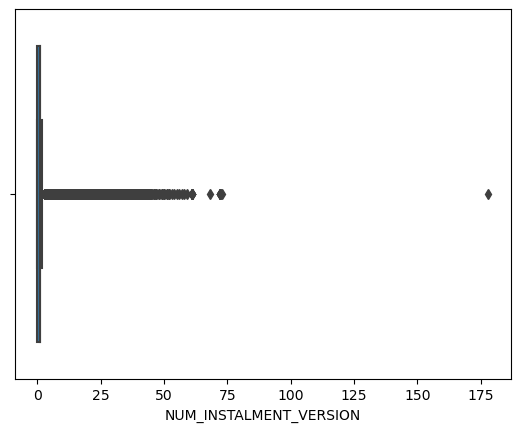

NUM_INSTALMENT_NUMBER


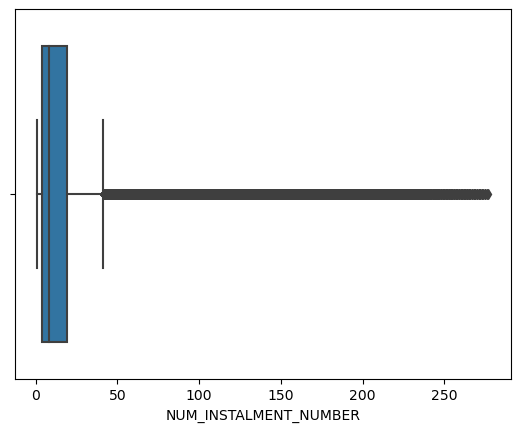

DAYS_INSTALMENT


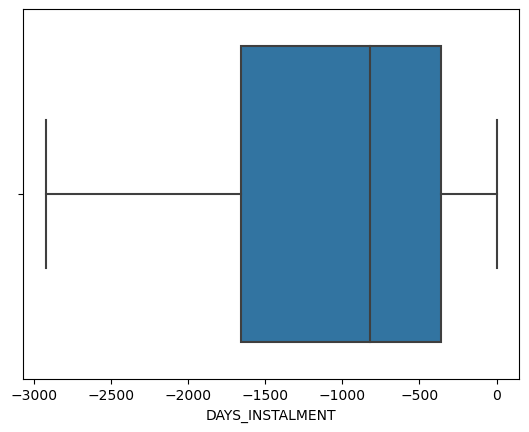

DAYS_ENTRY_PAYMENT


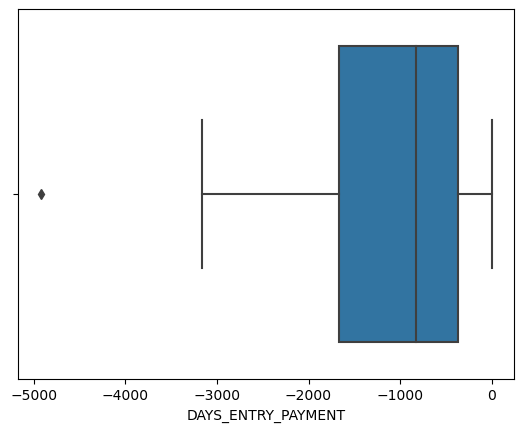

AMT_INSTALMENT


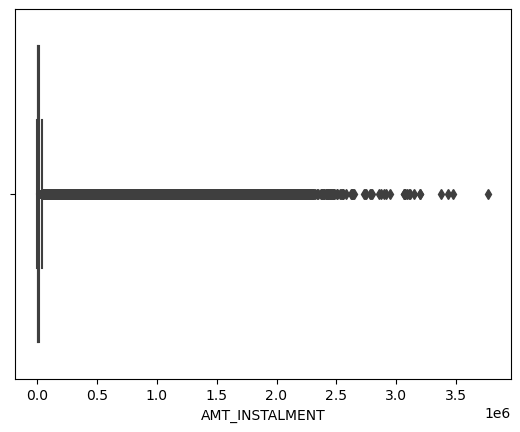

AMT_PAYMENT


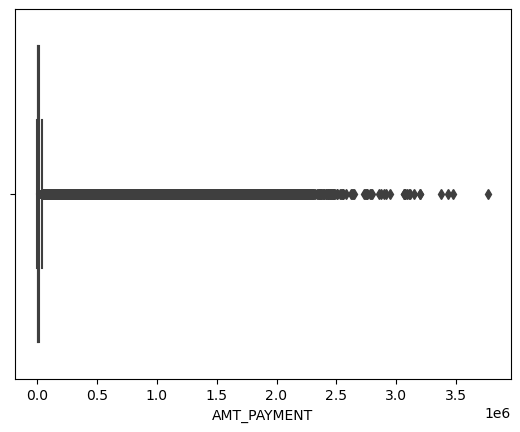

In [295]:
# On affiche les boxplots pour chaque variable à partir de "NUM_INSTALMENT_VERSION"
excluded_columns = ['SK_ID_CURR', 'SK_ID_PREV']

for column in var_num_inst.columns:
    if column == 'TARGET':
        continue
    if column not in excluded_columns:
        print(column)
        sns.boxplot(x=var_num_inst[column])
        plt.show()

Une valeur extrême est observée pour la variable "NUM_INSTALMENT_VERSION". Nous allons l'afficher. 

In [296]:
installments.sort_values(by='NUM_INSTALMENT_VERSION', ascending=False)

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
7580806,1488056,276526,178.0,2,-150.0,NaN,347349.600,NaN
11324478,2191808,376539,73.0,8,-2711.0,-2740.0,36710.100,36710.100
9059074,2191808,376539,72.0,6,-2771.0,-2924.0,7608.960,7608.960
9044615,2191808,376539,72.0,4,-2831.0,-2951.0,7608.960,7608.960
9850838,2191808,376539,72.0,2,-2891.0,-2891.0,7608.960,7608.960
...,...,...,...,...,...,...,...,...
3310924,1333199,147762,0.0,45,-1962.0,-1971.0,7875.000,7875.000
9239604,1060251,358132,0.0,55,-2251.0,-2254.0,4050.000,4050.000
9239603,1635867,367726,0.0,58,-845.0,-847.0,6750.000,6750.000
9239600,2321261,338281,0.0,10,-2629.0,-2633.0,4500.000,4500.000


Le client montrant une valeur élevée possède également des valeurs manquantes pour d'autres variables. On va le supprimer de notre df. 

In [297]:
# Sélection de la ligne contenant la valeur extrême
high_val = installments.sort_values(by='NUM_INSTALMENT_VERSION', ascending=False).head(1)

In [298]:
# Affichage de la valeur
val_to_drop = high_val['NUM_INSTALMENT_VERSION'].iloc[0]

In [299]:
# On supprime la/les lignes contenant cette valeur
installments = installments.drop(installments[installments['NUM_INSTALMENT_VERSION'] == val_to_drop].index)
inst_target = inst_target.drop(inst_target[inst_target['NUM_INSTALMENT_VERSION'] == val_to_drop].index)
var_num_inst = var_num_inst.drop(var_num_inst[var_num_inst['NUM_INSTALMENT_VERSION'] == val_to_drop].index)

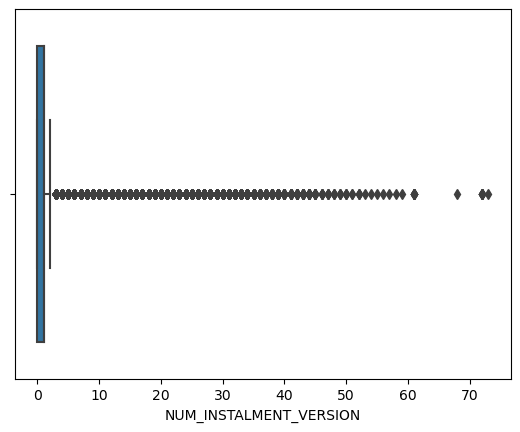

In [300]:
# On affiche à nouveau le boxplot
sns.boxplot(x=installments['NUM_INSTALMENT_VERSION'])
plt.show()

### 6.1.3. Traitement des valeurs manquantes

On va désormais <u>traiter les valeurs manquantes</u> avant notre feature engineering. 

- **Variables catégorielles** : 

Création d'une catégorie "Unknown" dans le cas où j'ai un grand nombre de valeurs manquantes > 10%. 
Imputation par la valeur la plus fréquente dans le cas où j'ai un plus faible nombre de valeurs manquantes < 10%.
                                                                                                                     
- **Variables numériques** : 

Imputation par la médiane dans le cas où j'ai un grand nombre de valeurs manquantes > 10%. 
Imputation par la valeur la plus fréquente dans le cas où j'ai un plus faible nombre de valeurs manquantes < 10%. 
Imputation par IterativeImputer lorsque j'ai peu de de valeurs manquantes < 10% et lorsque j'ai une variable, sans valeurs manquantes, corrélée. 

#### a. Variables numériques

In [301]:
miss_val = var_num_inst.isnull().sum()
miss_val

# Calcul du pourcentage de valeurs manquantes par variable
percentage_missing = (miss_val / len(var_num_inst)) * 100

# Filtrage des variables avec des valeurs manquantes
variables_manquantes = percentage_missing[percentage_missing > 0]

# Affichage des variables avec le pourcentage de valeurs manquantes
print("Variables numériques avec des valeurs manquantes:")
for variable, pourcentage in variables_manquantes.items():
    print(f"{variable}: {pourcentage:.2f}%")

Variables numériques avec des valeurs manquantes:
DAYS_ENTRY_PAYMENT: 0.02%
AMT_PAYMENT: 0.02%


- <u>**Valeurs manquantes inf 10%**</u>

In [302]:
# Calcul du pourcentage de valeurs manquantes par variable
pourcentage_manquant = installments.isnull().sum() / len(installments) * 100

# Variables avec moins de 10% de valeurs manquantes
vars_manq_inf_10 = pourcentage_manquant[pourcentage_manquant < 10].index

# Imputation par la valeur la plus fréquente pour chaque variable
for var in vars_manq_inf_10:
    imputer = SimpleImputer(strategy='most_frequent')
    inst_target[var] = imputer.fit_transform(inst_target[[var]])
    installments[var] = imputer.transform(installments[[var]])

### 6.1.4. Doublons

In [303]:
print(installments[installments.duplicated()].shape[0], 'doublons.')

0 doublons.


### 6.1.5. Corrélations

Nous allons effectuer une heatmap des corrélations pour les variables catégorielles. 
Dans un premier temps, nous considérons la variable 'TARGET' en tant que variable catégorielle. 

Ensuite, nous utilisons **l'indice de similarité** (coefficient de Spearman) afin de mesurer la relation entre 2 variables. Pour cela, les variables catégorielles sont converties en variables numériques à l'aide de la méthode "astype('cat').cat.codes". 

#### a. Variables numériques

In [304]:
# On sélectionne à nouveau les variables numériques
var_num = inst_target.select_dtypes(include=['float64', 'int'])
var_num.columns

Index(['SK_ID_CURR', 'TARGET', 'SK_ID_PREV', 'NUM_INSTALMENT_VERSION',
       'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT',
       'AMT_INSTALMENT', 'AMT_PAYMENT'],
      dtype='object')

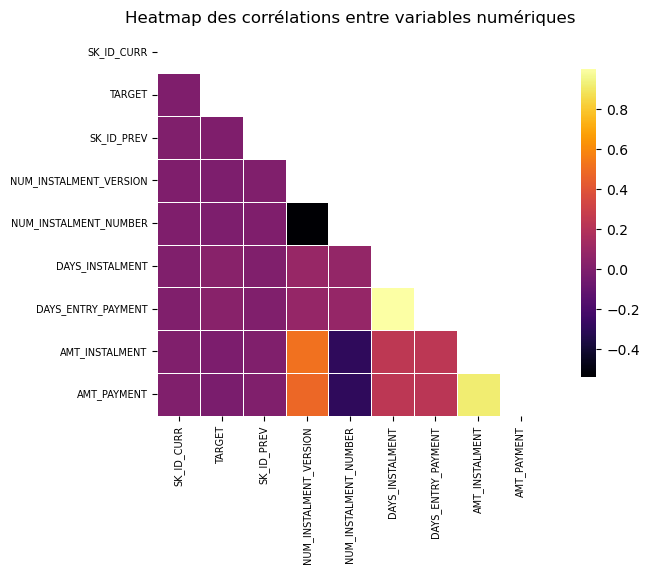

In [305]:
# Calculer la matrice de corrélation
correlation_matrix = var_num.corr(method='spearman')

# Créer une masque pour la moitié inférieure de la matrice de corrélation
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Afficher la heatmap
plt.figure(figsize=(10, 5))
heatmap = sns.heatmap(correlation_matrix, square=True, annot=False, annot_kws={"size": 7},
            fmt=".2f", cmap='inferno', linewidths=0.5, mask=mask, cbar_kws={"shrink": 0.8})
heatmap.set_xticklabels(heatmap.get_xticklabels(), size=7)
heatmap.set_yticklabels(heatmap.get_yticklabels(), size=7)
plt.title('Heatmap des corrélations entre variables numériques', fontsize=12)
plt.show()

In [306]:
# Calculer les corrélations avec la variable spécifique
correlations = correlation_matrix.loc[:, 'TARGET'].sort_values(ascending=False)

# Sélectionner les 3 premières variables les plus corrélées
top_3_correlated_variables = correlations[1:4].index.tolist()

# Afficher les résultats avec les valeurs de corrélation
print(f"Les 3 premières variables les plus corrélées avec 'TARGET' sont :")
for variable in top_3_correlated_variables:
    correlation_value = correlation_matrix.loc[variable, 'TARGET']
    print(f"{variable}: {correlation_value:.2f}")

Les 3 premières variables les plus corrélées avec 'TARGET' sont :
DAYS_ENTRY_PAYMENT: 0.04
DAYS_INSTALMENT: 0.04
SK_ID_PREV: -0.00


Les variables "DAYS_ENTRY_PAYMENT" et "DAYS_INSTALMENT" sont très corrélées entre elles. Il en est de même pour les variables "AMT_PAYMENT" et "AMT_INSTALMENT".

## 6.2. Feature engineering

In [307]:
# Encodage des variables catégorielles
ins, cat_cols = one_hot_encoder(installments, nan_as_category=True)

In [308]:
# % et différence payée pour chaque virement
ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']

In [309]:
# Jours après l'échéance et jours avant l'échéance (Pas de valeurs négatives)
ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)

In [310]:
# Mesures d'agrégations (nunique, max, mean, sum, var)
aggregations_inst = {
    'NUM_INSTALMENT_VERSION': ['nunique'],
    'DPD': ['max', 'mean', 'sum'],
    'DBD': ['max', 'mean', 'sum'],
    'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
    'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
    'AMT_INSTALMENT': ['max', 'mean', 'sum'],
    'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
    'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
}

In [311]:
# Ajout de la valeur d'agragations au catégories (mean)
for cat in cat_cols:
    aggregations_inst[cat] = ['mean']

In [312]:
# Regroupement des données et agrégations sur les groupes
ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations_inst)
ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])

In [313]:
# Comptage des comptes de virements
ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()

In [314]:
# On va d'abord regarder si on a des valeurs infinies
ins_agg.columns[ins_agg.apply(lambda x: np.isinf(x).any())].tolist()

['INSTAL_PAYMENT_PERC_MAX',
 'INSTAL_PAYMENT_PERC_MEAN',
 'INSTAL_PAYMENT_PERC_SUM']

In [315]:
# Transformation des valeurs infinies par NaN
ins_agg.replace([np.inf, -np.inf], np.nan, inplace=True)

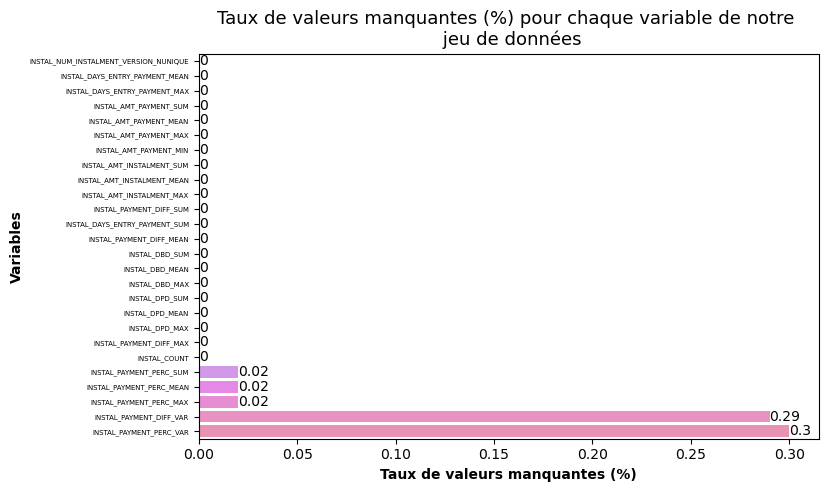

In [316]:
# Affichons les valeurs manquantes
# On crée un nouveau df des données manquantes
val_manq = pd.DataFrame(round(ins_agg.isnull().sum()/len(ins_agg)*100, 2)).reset_index()
val_manq = val_manq.rename(columns={0: 'val_manq'})
val_manq = val_manq.sort_values(by='val_manq', ascending=True)

# On crée un barplot affichant le taux de valeurs manquantes
# pour chaque variable
plt.figure(figsize=(8, 5))

ax = sns.barplot(data=val_manq, x="val_manq", y="index", ci=None, dodge=False)

plt.xlabel('Taux de valeurs manquantes (%)', size=10, fontweight='bold')
plt.ylabel('Variables', size=10, fontweight='bold')
plt.title('Taux de valeurs manquantes (%) pour chaque variable'
          ' de notre \n jeu de données', size=13)

plt.yticks(size=5)
plt.xticks(size=10)

for i in ax.containers:
    ax.bar_label(i,)

plt.show()

In [317]:
# Calcul du pourcentage de valeurs manquantes par variable
pourcentage_manquant = ins_agg.isnull().sum() / len(ins_agg) * 100

# Variables avec moins de 10% de valeurs manquantes
vars_manq_inf_10 = pourcentage_manquant[pourcentage_manquant < 10].index

# Imputation par la valeur la plus fréquente pour chaque variable
for var in vars_manq_inf_10:
    imputer = SimpleImputer(strategy='most_frequent')
    ins_agg[var] = imputer.fit_transform(ins_agg[[var]])

In [318]:
# Vérifions que l'on n'a plus de valeurs manquantes
val_manq_somme = ins_agg.isnull().sum()
val_manq_somme[val_manq_somme > 0]

Series([], dtype: int64)

# 7. Fichier credit_card_balance.csv

In [319]:
# Affichage des dimensions de notre fichier
print('Fichier credit_card_balance.csv :')
print('Notre fichier est constitués de', credit_card_balance.shape[0], 'lignes et de', credit_card_balance.shape[1], 'colonnes')

Fichier credit_card_balance.csv :
Notre fichier est constitués de 3840312 lignes et de 23 colonnes


## 7.1. Analyse exploratoire et nettoyage des données

In [320]:
credit_card_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.0,1800.0,0.000,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.0,2250.0,60175.080,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,2250.0,2250.0,26926.425,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,11925.0,11925.0,224949.285,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,27000.0,27000.0,443044.395,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


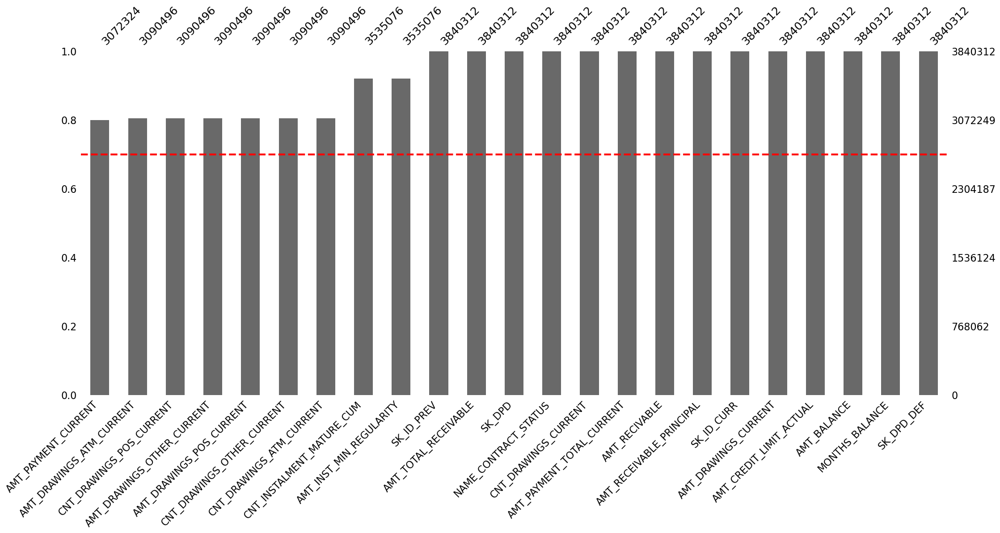

In [321]:
# On affiche les valeurs manquantes
val_manq_msno(credit_card_balance)

In [322]:
val_manq_ccb = credit_card_balance.isnull().sum()
len(val_manq_ccb[val_manq_ccb > 0])

9

9 variables contenant des valeurs manquantes. 

In [323]:
# Nous allons placer d'un côté les variables catégorielles
# et d'un autre les variables numériques

var_cat_ccb = credit_card_balance.select_dtypes(include='object')
print('Variables catégorielles')
print(var_cat_ccb.columns)
print('--------------')
print('Variables numériques')
var_num_ccb = credit_card_balance.select_dtypes(include=['int64', 'float64'])
print(var_num_ccb.columns)

Variables catégorielles
Index(['NAME_CONTRACT_STATUS'], dtype='object')
--------------
Variables numériques
Index(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'AMT_BALANCE',
       'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT',
       'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT',
       'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY',
       'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT',
       'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE',
       'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_CURRENT',
       'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT',
       'CNT_INSTALMENT_MATURE_CUM', 'SK_DPD', 'SK_DPD_DEF'],
      dtype='object')


In [324]:
print(len(var_cat_ccb.columns), 'variables sont catégorielles')
print(len(var_num_ccb.columns), 'variables sont numériques')

1 variables sont catégorielles
22 variables sont numériques


In [325]:
# Valeurs uniques
var_ccb = credit_card_balance.columns.tolist()
for var in var_ccb:
    print(var, ':', credit_card_balance[var].nunique())

SK_ID_PREV : 104307
SK_ID_CURR : 103558
MONTHS_BALANCE : 96
AMT_BALANCE : 1347904
AMT_CREDIT_LIMIT_ACTUAL : 181
AMT_DRAWINGS_ATM_CURRENT : 2267
AMT_DRAWINGS_CURRENT : 187005
AMT_DRAWINGS_OTHER_CURRENT : 1832
AMT_DRAWINGS_POS_CURRENT : 168748
AMT_INST_MIN_REGULARITY : 312266
AMT_PAYMENT_CURRENT : 163209
AMT_PAYMENT_TOTAL_CURRENT : 182957
AMT_RECEIVABLE_PRINCIPAL : 1195839
AMT_RECIVABLE : 1338878
AMT_TOTAL_RECEIVABLE : 1339008
CNT_DRAWINGS_ATM_CURRENT : 44
CNT_DRAWINGS_CURRENT : 129
CNT_DRAWINGS_OTHER_CURRENT : 11
CNT_DRAWINGS_POS_CURRENT : 133
CNT_INSTALMENT_MATURE_CUM : 121
NAME_CONTRACT_STATUS : 7
SK_DPD : 917
SK_DPD_DEF : 378


In [326]:
# Nous allons joindre la target de notre fichier application_train.csv avec nos données

application_target = application_clean[['SK_ID_CURR', 'TARGET']]
ccb_target = application_target.merge(credit_card_balance, on = 'SK_ID_CURR', how = 'left')

In [327]:
# Nous redéfinissons nos variables catégorielles et numériques

var_cat_ccb = credit_card_balance.select_dtypes(include='object')
print('Variables catégorielles')
print(var_cat_ccb.columns)
print('--------------')
print('Variables numériques')
var_num_ccb = credit_card_balance.select_dtypes(include=['int64', 'float64'])
print(var_num_ccb.columns)

Variables catégorielles
Index(['NAME_CONTRACT_STATUS'], dtype='object')
--------------
Variables numériques
Index(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'AMT_BALANCE',
       'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT',
       'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT',
       'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY',
       'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT',
       'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE',
       'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_CURRENT',
       'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT',
       'CNT_INSTALMENT_MATURE_CUM', 'SK_DPD', 'SK_DPD_DEF'],
      dtype='object')


In [328]:
# Sélection des clients ayant des défauts de paiements (target = 1)
ccb_target_1 = ccb_target[ccb_target['TARGET'] == 1]

### 7.1.1. Analyse variables catégorielles

Variable NAME_CONTRACT_STATUS
7 catégories différentes
Description: Contract status (active signed,...) on the previous credit


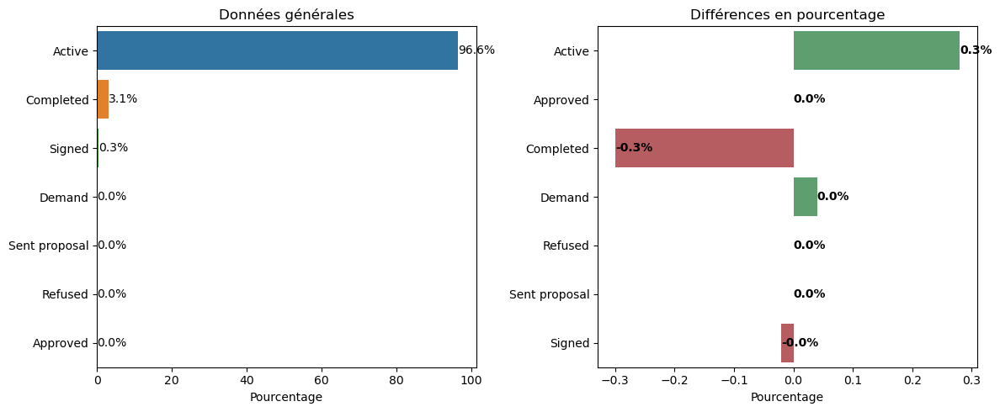

In [329]:
# Pour chaque variable catégorielle, on va afficher un graphique
# des catégories qu'elles contiennent et leur description
var_cat_target(var_cat_ccb, ccb_target, ccb_target_1, 'credit_card_balance.csv')

Nous observons que 96.6% des contrats sont actifs. 

### 7.1.2. Analyse variables numériques

In [330]:
for column in var_num_ccb.columns:
    if column == 'TARGET':
        continue
    print('Variable', column)
    matches = home_credit[(home_credit['Table'] == 'credit_card_balance.csv') & (home_credit['Row'] == column)]
    if not matches.empty:
        print('Description:', matches['Description'].values[0])
    else:
        print('Description not found')
    print('\n')

Variable SK_ID_PREV
Description not found


Variable SK_ID_CURR
Description: ID of loan in our sample


Variable MONTHS_BALANCE
Description: Month of balance relative to application date (-1 means the freshest balance date)


Variable AMT_BALANCE
Description: Balance during the month of previous credit


Variable AMT_CREDIT_LIMIT_ACTUAL
Description: Credit card limit during the month of the previous credit


Variable AMT_DRAWINGS_ATM_CURRENT
Description: Amount drawing at ATM during the month of the previous credit


Variable AMT_DRAWINGS_CURRENT
Description: Amount drawing during the month of the previous credit


Variable AMT_DRAWINGS_OTHER_CURRENT
Description: Amount of other drawings during the month of the previous credit


Variable AMT_DRAWINGS_POS_CURRENT
Description: Amount drawing or buying goods during the month of the previous credit


Variable AMT_INST_MIN_REGULARITY
Description: Minimal installment for this month of the previous credit


Variable AMT_PAYMENT_CURRENT
Descri

MONTHS_BALANCE


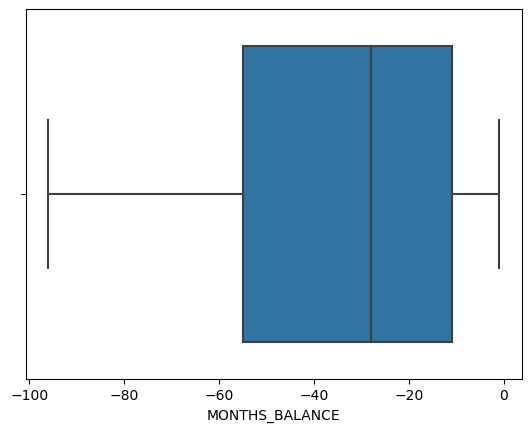

AMT_BALANCE


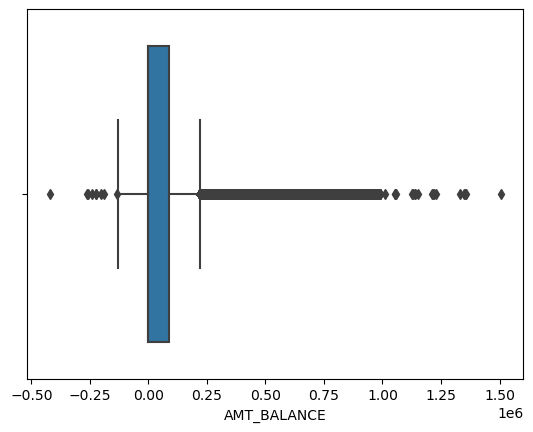

AMT_CREDIT_LIMIT_ACTUAL


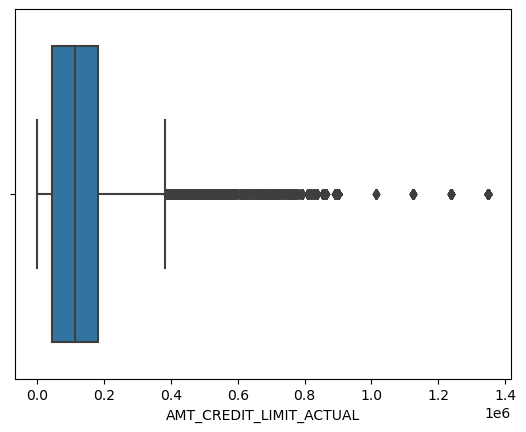

AMT_DRAWINGS_ATM_CURRENT


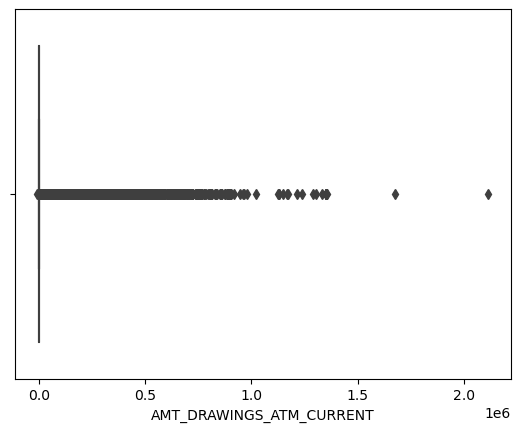

AMT_DRAWINGS_CURRENT


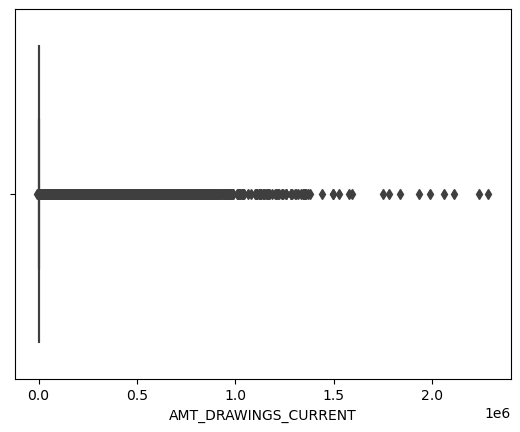

AMT_DRAWINGS_OTHER_CURRENT


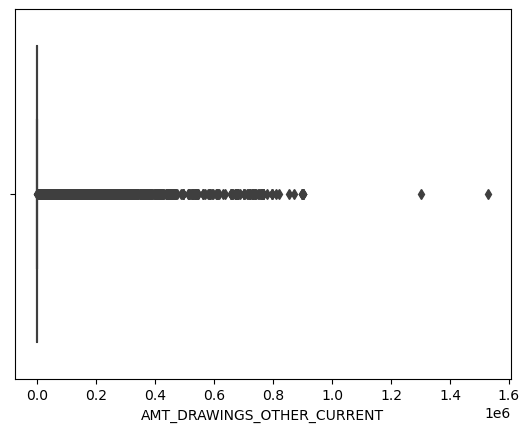

AMT_DRAWINGS_POS_CURRENT


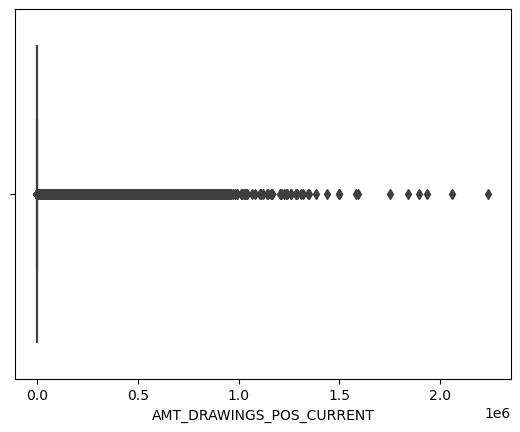

AMT_INST_MIN_REGULARITY


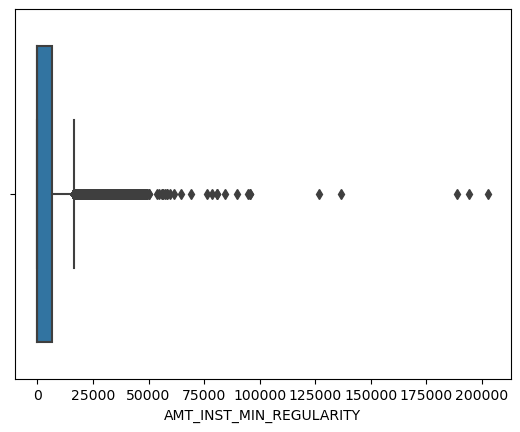

AMT_PAYMENT_CURRENT


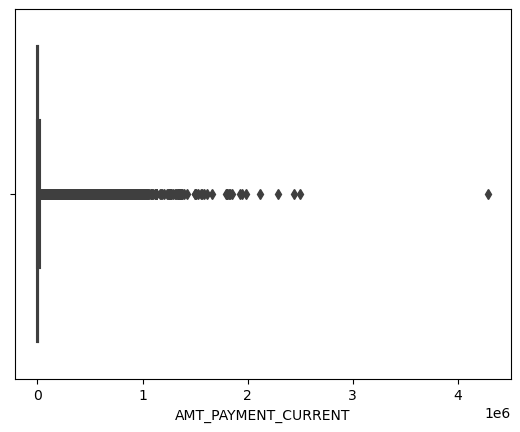

AMT_PAYMENT_TOTAL_CURRENT


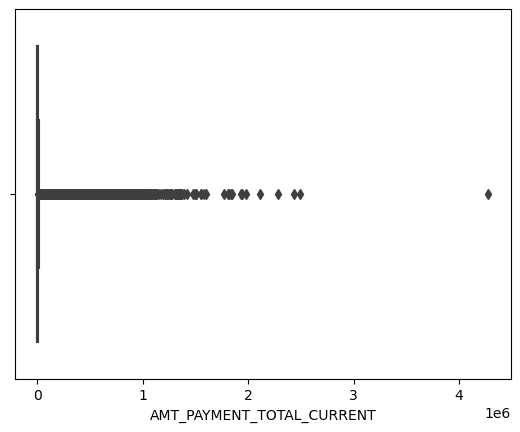

AMT_RECEIVABLE_PRINCIPAL


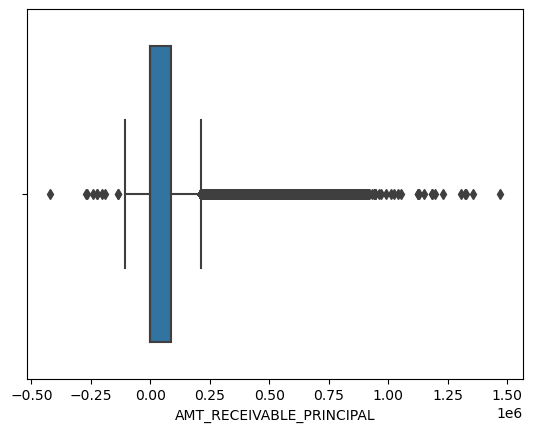

AMT_RECIVABLE


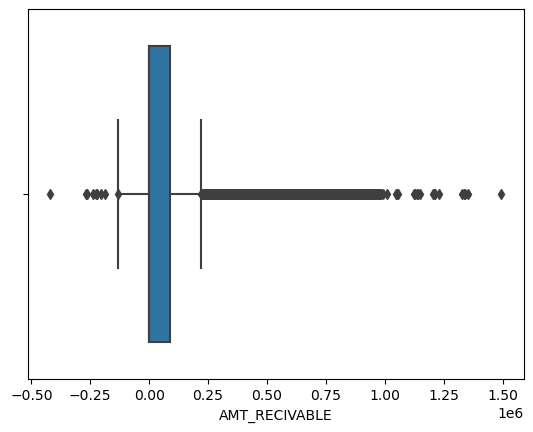

AMT_TOTAL_RECEIVABLE


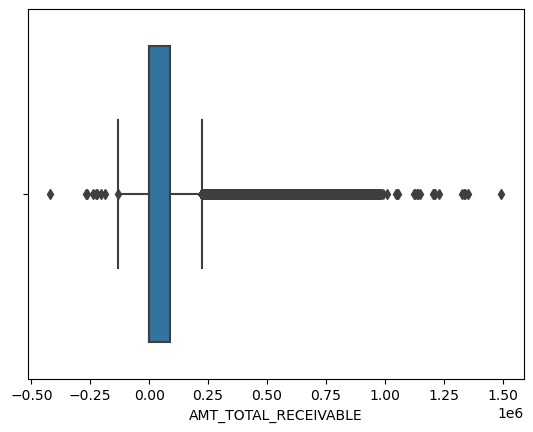

CNT_DRAWINGS_ATM_CURRENT


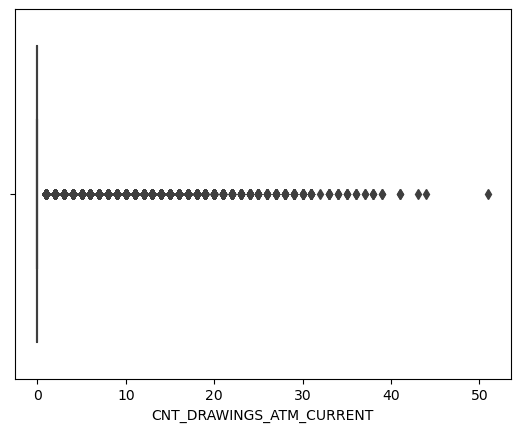

CNT_DRAWINGS_CURRENT


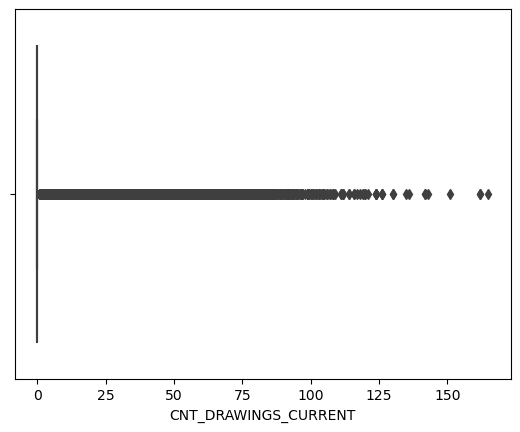

CNT_DRAWINGS_OTHER_CURRENT


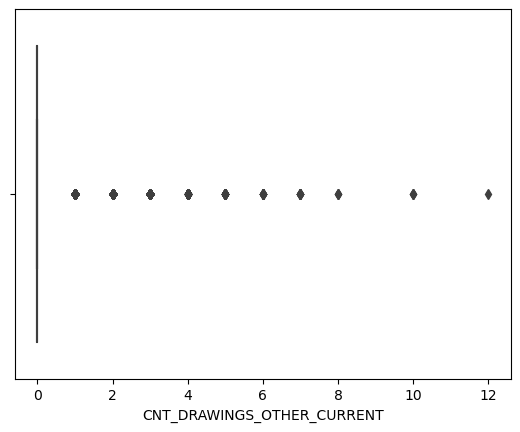

CNT_DRAWINGS_POS_CURRENT


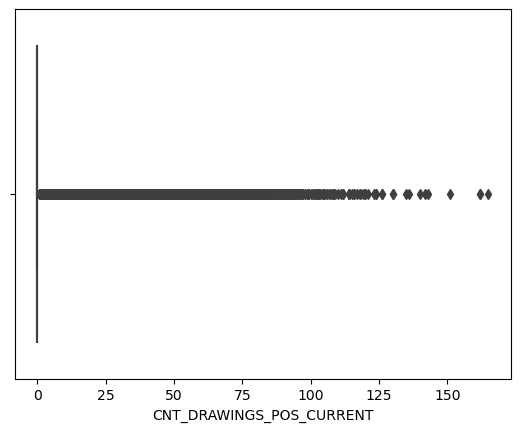

CNT_INSTALMENT_MATURE_CUM


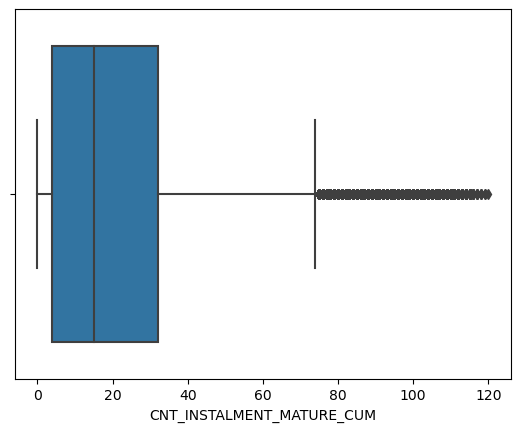

SK_DPD


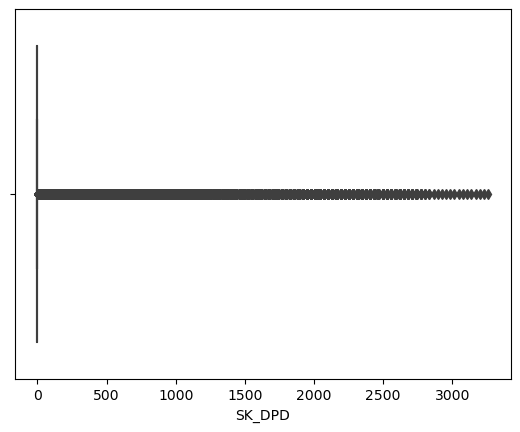

SK_DPD_DEF


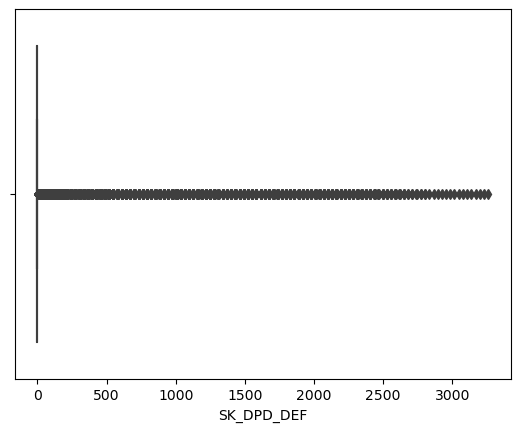

In [331]:
# On affiche les boxplots pour chaque variable à partir de "MONTHS_BALANCE"
excluded_columns = ['SK_ID_CURR', 'SK_ID_PREV']

for column in var_num_ccb.columns:
    if column == 'TARGET':
        continue
    if column not in excluded_columns:
        print(column)
        sns.boxplot(x=var_num_ccb[column])
        plt.show()

### 7.1.3. Traitement des valeurs manquantes

On va désormais <u>traiter les valeurs manquantes</u> avant notre feature engineering. 

- **Variables catégorielles** : 

Création d'une catégorie "Unknown" dans le cas où j'ai un grand nombre de valeurs manquantes > 10%. 
Imputation par la valeur la plus fréquente dans le cas où j'ai un plus faible nombre de valeurs manquantes < 10%.
                                                                                                                     
- **Variables numériques** : 

Imputation par la médiane dans le cas où j'ai un grand nombre de valeurs manquantes > 10%. 
Imputation par la valeur la plus fréquente dans le cas où j'ai un plus faible nombre de valeurs manquantes < 10%. 
Imputation par IterativeImputer lorsque j'ai peu de de valeurs manquantes < 10% et lorsque j'ai une variable, sans valeurs manquantes, corrélée. 

#### a. Variables catégorielles

In [332]:
miss_val = var_cat_ccb.isnull().sum()
miss_val

# Calcul du pourcentage de valeurs manquantes par variable
percentage_missing = (miss_val / len(var_cat_ccb)) * 100

# Filtrage des variables avec des valeurs manquantes
variables_manquantes = percentage_missing[percentage_missing > 0]

# Affichage des variables avec le pourcentage de valeurs manquantes
print("Variables numériques avec des valeurs manquantes:")
for variable, pourcentage in variables_manquantes.items():
    print(f"{variable}: {pourcentage:.2f}%")

Variables numériques avec des valeurs manquantes:


#### b. Variables numériques

In [333]:
miss_val = var_num_ccb.isnull().sum()
miss_val

# Calcul du pourcentage de valeurs manquantes par variable
percentage_missing = (miss_val / len(var_num_ccb)) * 100

# Filtrage des variables avec des valeurs manquantes
variables_manquantes = percentage_missing[percentage_missing > 0]

# Affichage des variables avec le pourcentage de valeurs manquantes
print("Variables numériques avec des valeurs manquantes:")
for variable, pourcentage in variables_manquantes.items():
    print(f"{variable}: {pourcentage:.2f}%")

Variables numériques avec des valeurs manquantes:
AMT_DRAWINGS_ATM_CURRENT: 19.52%
AMT_DRAWINGS_OTHER_CURRENT: 19.52%
AMT_DRAWINGS_POS_CURRENT: 19.52%
AMT_INST_MIN_REGULARITY: 7.95%
AMT_PAYMENT_CURRENT: 20.00%
CNT_DRAWINGS_ATM_CURRENT: 19.52%
CNT_DRAWINGS_OTHER_CURRENT: 19.52%
CNT_DRAWINGS_POS_CURRENT: 19.52%
CNT_INSTALMENT_MATURE_CUM: 7.95%


- <u>**Valeurs manquantes > 10%**</u>

In [334]:
# Calcul du pourcentage de valeurs manquantes par variable
pourcentage_manquant = var_num_ccb.isnull().sum() / len(var_num_ccb) * 100

# Variables avec moins de 10% de valeurs manquantes
vars_manq_inf_10 = pourcentage_manquant[pourcentage_manquant < 10].index

# Imputation par la valeur médiane pour chaque variable
for var in vars_manq_inf_10:
    imputer = SimpleImputer(strategy='median')
    ccb_target[var] = imputer.fit_transform(ccb_target[[var]])
    credit_card_balance[var] = imputer.transform(credit_card_balance[[var]])

- <u>**Valeurs manquantes inf 10%**</u>

In [335]:
# Variables avec plus de 10% de valeurs manquantes
vars_manq_sup_10 = pourcentage_manquant[pourcentage_manquant < 10].index

# Imputation par la valeur médiane pour chaque variable
for var in vars_manq_sup_10:
    imputer = SimpleImputer(strategy='most_frequent')
    ccb_target[var] = imputer.fit_transform(ccb_target[[var]])
    credit_card_balance[var] = imputer.transform(credit_card_balance[[var]])

### 7.1.4. Doublons

In [336]:
print(credit_card_balance[credit_card_balance.duplicated()].shape[0], 'doublons.')

0 doublons.


### 7.1.5. Corrélations

Nous allons effectuer une heatmap des corrélations pour les variables catégorielles. 
Dans un premier temps, nous considérons la variable 'TARGET' en tant que variable catégorielle. 

Ensuite, nous utilisons **l'indice de similarité** (coefficient de Spearman) afin de mesurer la relation entre 2 variables. Pour cela, les variables catégorielles sont converties en variables numériques à l'aide de la méthode "astype('cat').cat.codes". 

#### a. Variables catégorielles

In [337]:
# On sélectionne les variables catégorielles
var_categ = ccb_target.select_dtypes(include=['object']) 
var_categ.columns.tolist()

# Concaténation des variables catégorielles avec les variables binaires et la target
var_categ = pd.concat([var_categ] + [ccb_target[['TARGET']]], axis=1)

# On veut qu'elles soient considérées comme des variables catégorielles
var_categ['TARGET'] = var_categ['TARGET'].astype('object')

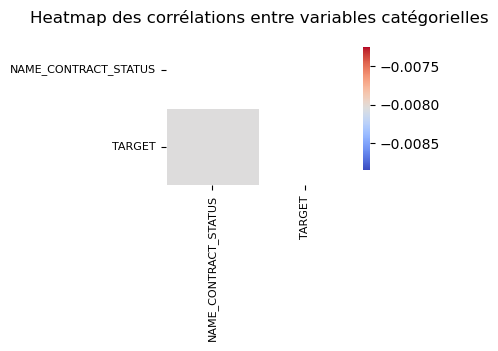

In [338]:
# Créer une copie des variables catégorielles pour effectuer les modifications
var_categ_encoded = var_categ.copy()

# Convertir les catégories en codes numériques
for column in var_categ_encoded.columns:
    var_categ_encoded[column] = var_categ_encoded[column].astype('category').cat.codes

# Calculer la matrice de corrélation
correlation_matrix = var_categ_encoded.corr(method='spearman')

# Créer une masque pour la moitié inférieure de la matrice de corrélation
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Afficher la heatmap
plt.figure(figsize=(3, 2))
heatmap = sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', linewidths=0.5,
            cbar_kws={"shrink": 0.8}, mask=mask)
plt.title('Heatmap des corrélations entre variables catégorielles', fontsize=12)

heatmap.set_xticklabels(heatmap.get_xticklabels(), size=8)
heatmap.set_yticklabels(heatmap.get_yticklabels(), size=8)

plt.show()

#### b. Variables numériques

In [339]:
# On sélectionne à nouveau les variables numériques
var_num = ccb_target.select_dtypes(include=['float64', 'int'])
var_num.columns

Index(['SK_ID_CURR', 'TARGET', 'SK_ID_PREV', 'MONTHS_BALANCE', 'AMT_BALANCE',
       'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT',
       'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT',
       'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY',
       'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT',
       'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE',
       'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_CURRENT',
       'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT',
       'CNT_INSTALMENT_MATURE_CUM', 'SK_DPD', 'SK_DPD_DEF'],
      dtype='object')

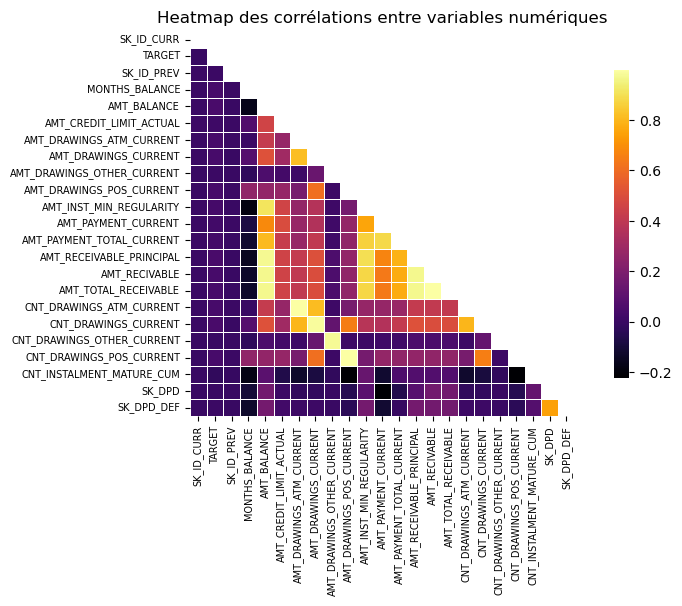

In [340]:
# Calculer la matrice de corrélation
correlation_matrix = var_num.corr(method='spearman')

# Créer une masque pour la moitié inférieure de la matrice de corrélation
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Afficher la heatmap
plt.figure(figsize=(10, 5))
heatmap = sns.heatmap(correlation_matrix, square=True, annot=False, annot_kws={"size": 7},
            fmt=".2f", cmap='inferno', linewidths=0.5, mask=mask, cbar_kws={"shrink": 0.8})
heatmap.set_xticklabels(heatmap.get_xticklabels(), size=7)
heatmap.set_yticklabels(heatmap.get_yticklabels(), size=7)
plt.title('Heatmap des corrélations entre variables numériques', fontsize=12)
plt.show()

In [341]:
# Calculer les corrélations avec la variable spécifique
correlations = correlation_matrix.loc[:, 'TARGET'].sort_values(ascending=False)

# Sélectionner les 3 premières variables les plus corrélées
top_3_correlated_variables = correlations[1:4].index.tolist()

# Afficher les résultats avec les valeurs de corrélation
print(f"Les 3 premières variables les plus corrélées avec 'TARGET' sont :")
for variable in top_3_correlated_variables:
    correlation_value = correlation_matrix.loc[variable, 'TARGET']
    print(f"{variable}: {correlation_value:.2f}")

Les 3 premières variables les plus corrélées avec 'TARGET' sont :
CNT_DRAWINGS_CURRENT: 0.04
AMT_RECEIVABLE_PRINCIPAL: 0.04
AMT_BALANCE: 0.04


## 7.2. Feature engineering

In [342]:
# Encodage des variables catégorielles
cc, cat_cols = one_hot_encoder(credit_card_balance, nan_as_category=True)

In [343]:
# Agrégations avec mesures (min, max, mean, sum, var)
cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])

In [344]:
cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()

In [345]:
# Vérifions que l'on a des valeurs infinies
cc_agg.columns[cc_agg.apply(lambda x: np.isinf(x).any())].tolist()

[]

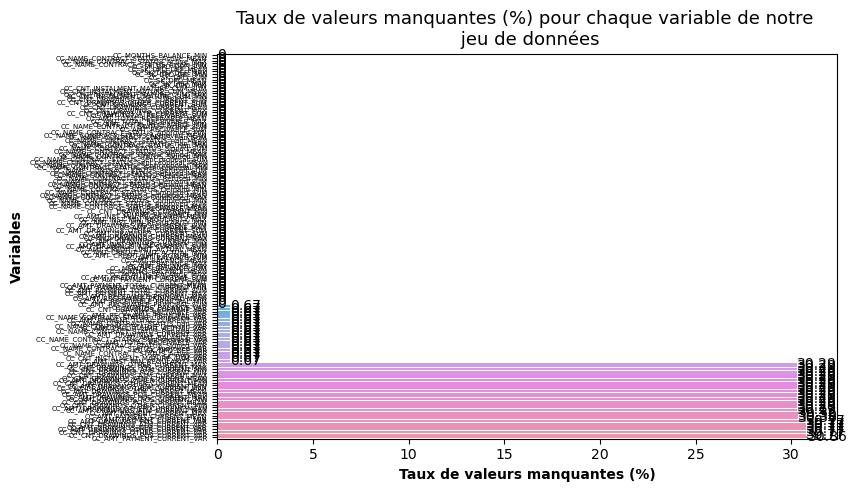

In [346]:
# Affichons les valeurs manquantes
# On crée un nouveau df des données manquantes
val_manq = pd.DataFrame(round(cc_agg.isnull().sum()/len(cc_agg)*100, 2)).reset_index()
val_manq = val_manq.rename(columns={0: 'val_manq'})
val_manq = val_manq.sort_values(by='val_manq', ascending=True)

# On crée un barplot affichant le taux de valeurs manquantes
# pour chaque variable
plt.figure(figsize=(8, 5))

ax = sns.barplot(data=val_manq, x="val_manq", y="index", ci=None, dodge=False)

plt.xlabel('Taux de valeurs manquantes (%)', size=10, fontweight='bold')
plt.ylabel('Variables', size=10, fontweight='bold')
plt.title('Taux de valeurs manquantes (%) pour chaque variable'
          ' de notre \n jeu de données', size=13)

plt.yticks(size=5)
plt.xticks(size=10)

for i in ax.containers:
    ax.bar_label(i,)

plt.show()

In [347]:
# Calcul du pourcentage de valeurs manquantes par variable
pourcentage_manquant = cc_agg.isnull().sum() / len(cc_agg) * 100

# Variables avec moins de 10% de valeurs manquantes
vars_manq_inf_10 = pourcentage_manquant[pourcentage_manquant < 10].index

# Imputation par la valeur la plus fréquente pour chaque variable
for var in vars_manq_inf_10:
    imputer = SimpleImputer(strategy='most_frequent')
    cc_agg[var] = imputer.fit_transform(cc_agg[[var]])

In [348]:
# Variables avec moins de 10% de valeurs manquantes
vars_manq_sup_10 = pourcentage_manquant[pourcentage_manquant > 10].index

# Imputation par la valeur médiane pour chaque variable
for var in vars_manq_sup_10:
    imputer = SimpleImputer(strategy='median')
    cc_agg[var] = imputer.fit_transform(cc_agg[[var]])

In [349]:
# Vérifions que l'on n'a plus de valeurs manquantes
val_manq_somme = cc_agg.isnull().sum()
val_manq_somme[val_manq_somme > 0]

Series([], dtype: int64)

# 8. Jointure de nos différents fichiers nettoyés

On utilise le code provenant du kernel kaggle afin de joindre nos dataframes entre eux. 

In [350]:
import gc

df = application_clean

# Joindre le fichier bureau et bureau_balance
bureau = bureau_agg
print("Bureau df shape:", bureau.shape)
df = df.join(bureau, how='left', on='SK_ID_CURR')
del bureau
gc.collect()

# Joindre le fichier previous_applications
prev = prev_agg
print("Previous applications df shape:", prev.shape)
df = df.join(prev, how='left', on='SK_ID_CURR')
del prev
gc.collect()

# Joindre le fichier POS-CASH balance
pos = pos_agg
print("Pos-cash balance df shape:", pos.shape)
df = df.join(pos, how='left', on='SK_ID_CURR')
del pos
gc.collect()

# Joindre le fichier installments payments
ins = ins_agg
print("Installments payments df shape:", ins.shape)
df = df.join(ins, how='left', on='SK_ID_CURR')
del ins
gc.collect()

# Joindre le fichier credit card balance
cc = cc_agg
print("Credit card balance df shape:", cc.shape)
df = df.join(cc, how='left', on='SK_ID_CURR')
del cc
gc.collect()

Bureau df shape: (305811, 98)
Previous applications df shape: (338857, 90)
Pos-cash balance df shape: (337252, 18)
Installments payments df shape: (339587, 26)
Credit card balance df shape: (103558, 141)


0

In [351]:
df.shape

(305900, 567)

In [352]:
# Vérifions les valeurs infinies
df.columns[df.apply(lambda x: np.isinf(x).any())].tolist()

[]

In [353]:
# Vérifions les valeurs manquantes
df.isnull().sum().sum()

37385383

In [354]:
# Traitement des valeurs manquantes > 10 (médiane)

# Calcul du pourcentage de valeurs manquantes par variable
pourcentage_manquant = df.isnull().sum() / len(df) * 100

# Variables avec plus de 10% de valeurs manquantes
vars_manq_sup_10 = pourcentage_manquant[pourcentage_manquant > 10].index

# Imputation par la valeur médiane pour chaque variable
for var in vars_manq_sup_10:
    imputer = SimpleImputer(strategy='median')
    df[var] = imputer.fit_transform(df[[var]])

In [355]:
# Traitement des valeurs manquantes < 10 (plus fréquente)

# Variables avec moins de 10% de valeurs manquantes
vars_manq_inf_10 = pourcentage_manquant[pourcentage_manquant < 10].index

# Imputation par la valeur la plus fréquente pour chaque variable
for var in vars_manq_inf_10:
    imputer = SimpleImputer(strategy='most_frequent')
    df[var] = imputer.fit_transform(df[[var]])

In [356]:
# Vérifions à nouveau les valeurs manquantes
val_manq_somme = df.isnull().sum()
val_manq_somme[val_manq_somme > 0]

Series([], dtype: int64)

# <u>MODELISATION</u>

# 1. Classifieur LightGBM et sélection des variables importantes

Parmi le grand nombre de features présent dans notre dataset, l'idée est de récupérer les meilleures features à l'aide d'un classifieur (LightGBM) optimisé. Nous avons repris le kernel Kaggle ayant remporté la compétition pour la sélection des variables importantes. 

In [357]:
import re

# Liste des noms de colonnes
column_names = df.columns.tolist()

# Caractères spéciaux ou espaces
pattern = r"[^\w]"

# On parcourt chaque nom de colonne et vérifions s'ils comprennent les caractères spéciaux
invalid_columns = []
for column in column_names:
    if re.search(pattern, column):
        invalid_columns.append(column)

# On renomme les colonnes contenant des caractères spéciaux
for column in invalid_columns:
    new_column = re.sub(pattern, "_", column)
    df.rename(columns={column: new_column}, inplace=True)

In [358]:
pip install lightgbm

Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: lightgbm in c:\users\evaro\anaconda3\lib\site-packages (3.3.5)



La métrique adaptée pour évaluer la performance de notre algorithme est **AUC** pour la classification. Elle décrit la performance d'un modèle à travers 2 indicateurs : sensibilité et spécificité. L'aire sous la courbe (AUC ROC) mesure la performance d'un modèle de classification. De plus, elle serait invariantes aux déséquilibres de classes et ne dépend pas d'un seuil particulier 

In [359]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score


with mlflow.start_run():
    # On choisit de prendre un échantillon aléatoire de 50 000 lignes dans notre dataset
    df_sample = df.sample(n=50000, random_state=42)
    print('Vérifions que la proportion est bien (0 : 92%, 1 : 8%)')
    print(df_sample['TARGET'].value_counts(normalize=True)*100) # Vérifions que les proportions sont respectées
    
    # Création des variables X (caractéristiques) et y (cible)
    X = df_sample.loc[:, df_sample.columns != 'TARGET']
    y = df_sample['TARGET']
    
    # Standardisation de la variable X
    scaler = StandardScaler()
    X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns, index=X.index)
    
    # Validation croisée (évaluation du modèle)
    folds = KFold(n_splits= 5, shuffle=True, random_state=1001)
    
    # Création de tableaux et dataframes pour stocker les résultats obtenus
    oof_preds = np.zeros(X_scaled.shape[0])
    feature_importance_df = pd.DataFrame()
    feats = [f for f in X_scaled.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
    
    for n_fold, (train_idx, valid_idx) in enumerate(folds.split(X_scaled, y)):
        train_x, train_y = X_scaled[feats].iloc[train_idx], y.iloc[train_idx]
        valid_x, valid_y = X_scaled[feats].iloc[valid_idx], y.iloc[valid_idx]
        
        # Paramètres LightGBM trouvés par optimisation Bayesienne
        clf = LGBMClassifier(
            nthread=4,
            n_estimators=10000,
            learning_rate=0.02,
            num_leaves=34,
            colsample_bytree=0.9497036,
            subsample=0.8715623,
            max_depth=8,
            reg_alpha=0.041545473,
            reg_lambda=0.0735294,
            min_split_gain=0.0222415,
            min_child_weight=39.3259775,
            silent=-1,
            verbose=-1, )
        
        clf.fit(train_x, train_y, eval_set=[(train_x, train_y), (valid_x, valid_y)], 
            eval_metric= 'auc', verbose= 200, early_stopping_rounds= 200)
        
        oof_preds[valid_idx] = clf.predict_proba(valid_x, num_iteration=clf.best_iteration_)[:, 1]
        
        fold_importance_df = pd.DataFrame()
        fold_importance_df["feature"] = feats
        fold_importance_df["importance"] = clf.feature_importances_
        fold_importance_df["fold"] = n_fold + 1
        feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
        print('Fold %2d AUC : %.6f' % (n_fold + 1, roc_auc_score(valid_y, oof_preds[valid_idx])))
        
    print('Full AUC score %.6f' % roc_auc_score(y, oof_preds))
    
    # Évaluation des métriques
    auc = roc_auc_score(y, oof_preds)
    mlflow.log_metric("AUC", auc)

    # Enregistrement de la feature importance
    feature_importance_df.to_csv("feature_importance.csv", index=False)
    mlflow.log_artifact("feature_importance.csv")
    
    mlflow.end_run()

Vérifions que la proportion est bien (0 : 92%, 1 : 8%)
0    91.994
1     8.006
Name: TARGET, dtype: float64
[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.858785	training's binary_logloss: 0.214555	valid_1's auc: 0.769733	valid_1's binary_logloss: 0.245143
[400]	training's auc: 0.895683	training's binary_logloss: 0.195208	valid_1's auc: 0.773907	valid_1's binary_logloss: 0.243198
Fold  1 AUC : 0.774042
[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.86113	training's binary_logloss: 0.215114	valid_1's auc: 0.743213	valid_1's binary_logloss: 0.242523
[400]	training's auc: 0.897407	training's binary_logloss: 0.195244	valid_1's auc: 0.746432	valid_1's binary_logloss: 0.241717
Fold  2 AUC : 0.746408
[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200

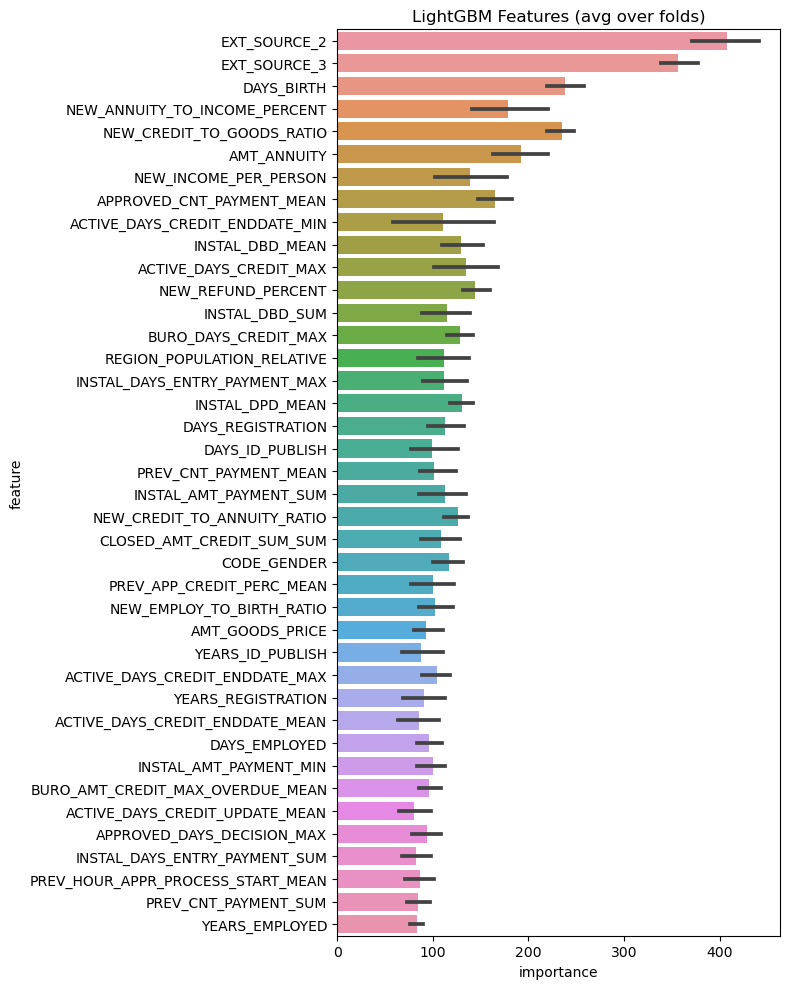

In [360]:
# On affiche les 40 premières features en termes d'importance

cols = feature_importance_df[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False)[:40].index
best_features = feature_importance_df.loc[feature_importance_df.feature.isin(cols)]
plt.figure(figsize=(8, 10))
sns.barplot(x="importance", y="feature", data=best_features.sort_values(by="importance", ascending=False))
plt.title('LightGBM Features (avg over folds)')
plt.tight_layout()
plt.savefig('lgbm_importances01.png')

# Enregistrement du graphique en tant qu'artefact MLflow
mlflow.log_artifact('lgbm_importances01.png')

In [361]:
# Sélection des 20 premières features et ajour de la target
selected_columns = best_features.head(20)['feature'].tolist() + ['TARGET'] + ['SK_ID_CURR']
df_filtered = df.loc[:, selected_columns]

In [362]:
df_filtered.shape

(305900, 22)

In [363]:
# Sauvegarde de notre fichier
df_filtered.to_csv('df_filtered_p7.csv', sep=';', index=False)

In [364]:
# Sauvegarde du fichier avant filtrage 
df.to_csv('df_cleaned_p7.csv', sep = ';')

# 2. Modélisation avec gestion du déséquilibre des classes et métrique métier pour minimiser les pertes

Nos données sont fortement déséquilibrées avec 8% des données appartenant à la target 1 (défauts de paiements) et 92% des clients appartenant à la target 0. Afin de lutter contre ce déséquilibre, plusieurs méthodes existent : SMOTE, Random Under-Sampling, ...

L'**algorithme SMOTE** (Synthetic Minority Over-Sampling Technique) est une méthode de sur-échantillonnage (over-sampling) qui permet de générer artificiellement des échantillons appartenant à la classe minoritaire (dans notre cas : target 1). Les étapes sont les suivantes : 
- Sélection aléatoire d'un d'une observation minoritaire
- Identification des k voisins les plus proches parmi les observations minoritaires
- Choix aléatoire d'un des k voisins les plus proches
- Coefficient généré entre 0 et 1
- Création d'un nouvel individu entre l'observation initiale et le plus proche voisin choisi selon la valeur du coefficient

**RandomUnderSampler** de la bibliothèque imblearn effectue un sous-échantillonnage (under-sampling) de la classe majoritaire (dans notre cas : target 0) en prélevant au hasard des échantillons.  

**"Class_weight"** est un paramètre pouvant être utilisé pour traiter les problèmes de déséquilibres des classes en donnant un poids plus fort à la classe minoritaire. 

In [365]:
# On sépare à nouveau nos données en jeu d'entrainement et de test

data =  df_filtered.copy()

X = data.loc[:, data.columns != 'TARGET']
y = data['TARGET']

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, shuffle=True, stratify=y, random_state=42)

<u>**Métriques**</u>:
Plusieurs <u>métriques</u> sont choisies pour évaluer les différents modèles de classification: 
- **Accuracy score** : ratio entre nombre de prédictions correctes et le nombre total de prédictions
- **Précision** : ratio entre vrais positifs et tous les positifs. Une précision élevée indique un faible taux de faux positifs.
- **Recall** (= sensibilité) : taux de vrais positifs, ratio entre vrais positifs et vrais positifs + faux négatifs. Un recall élevé indique un faible taux de faux négatifs. 
- **f1_score** : mesure prenant en compte la précision et le recall. Moyenne harmonique de la précision et du recall. Un score proche de 1 représente une performance parfait du modèle (bonne harmonique entre recall et précision). 
- **AUC** : aire sous la courbe ROC. 

On va calculer l'**AUC** avec la **probabilité des classes positives** (défauts de paiement) car elle évalue la capacité du modèle à discriminer entre les classes positives et négatives et mesure la capacité du modèle à classer correctement les échantillons en fonction de leurs probabilités de classe. Donc en utilisant la probabilité de classe, d'avantage d'informations sont capturées par l'AUC. Tandis que pour les autres métriques, on va comparer directement les valeurs binaires prédites avec les vraies valeurs de classe.

- <u>**Problématique métier**</u>

Une fois que notre modèle est choisi, l'idée est d'utiliser une fonction de coût-métier afin d'évaluer la performance de notre modèle. L'objectif pour la banque est de trouver les clients ayant des <u>défauts de paiements considéré comme l'évènement positif</u>. L'idée étant de **minimiser le nombre de faux négatifs** (clients prédits sans défauts de paiements mais étant réellement en défauts de paiements) et **maximiser le nombre de vrais positifs** (clients prédits avec des défauts de paiements et étant réellement des défauts de paiements). 

TP = True Positive (prêt refusé et le client ne peut pas rembourser le prêt)

TN = True Negative (prêt accepté et le client peut rembourser le prêt)

FP = False Positive (prêt refusé mais le client peut rembourser le prêt)

FN = False Negative (prêt accepté mais le client ne peut pas rembourser le prêt)

Effectivement, la banque effectue un déficit si elle accorde un prêt à des clients n'étant pas en mesure de le rembourser. Néanmoins, elle risque la perte de clients dans le cas où elle refuse un prêt pour un client en mesure de le rembourser. Il serait certainement moins dramatique d'avoir de faux positifs supplémentaires pour réduire le nombre de faux négatifs. Mais, on veut tout de même éviter d'avoir un trop grand nombre de faux positifs.

- <u>**Définition de la métrique métier**</u>

Nous allons créer une métrique afin de maximiser les gains et minimiser les pertes. Rappelons les différents cas possibles et leurs conséquences pour l'entreprise:

- Situation la plus grave pour l'entreprise et donc à éviter (**perte** d'argent) : accorder un prêt à un client ne pouvant pas le rembourser (FN). 
- Situation moins grave mais tout autant pénalisante pour l'entreprise (**perte** de client) : refuser un prêt à un client en mesure de le rembourser (FP). 
- Situation n'étant pas pénalisante pour l'entreprise (**ni une perte, ni un gain**) : refuser un prêt à un client ne pouvant pas le rembourser (TP).
- Situation la plus intéressant pour l'entreprise, que l'on recherche (**gain d'argent**) : accepter un prêt à un client pouvant le rembourser (TN).

On attribue le poids selon la situation (gain ou coût pour l'entreprise) et on crée un score en le normalisant entre 0 (performance faible) et 1 (performance élevée, perte minimale). 

Voici les valeurs de poids attribués de façon arbitraire (pouvant être revus par l'entreprise) : 

- FN = -20
- FP = -2
- TP = 0
- TN = 10

Dans un premier temps, le coût total est calculé en prenant compte les poids attribués de façon arbitraire:
- cout_total = FN * cout_FN + FP * cout_FP + TP * cout_TP + TN * cout_TN

Nous calculons le gain maximal dans le cas où l'entreprise ne connait pas de perte d'argent (TN et TP):
- gain_max (pas de perte d'argent) = (TN + FP) * cout_TN + (TP + FN) * cout_TP

Nous calculons la perte maximale dans le cas où l'entreprise connait une perte d'argent (FN et FP):
- gain_min (perte d'argent) = (TN + FP) * cout_FP + (TP + FN) * cout_FN

Enfin, on calcule le score normalisé:
- score_normalisé = (cout_total - gain_min) / (gain_max - gain_min)

Le **score normalisé** final calculé représente une performance globale tenant compte des gains et des pertes potentielles pour l'entreprise. Il va quantifier l'efficacité du modèle à accorder un prêt en tenant comptes des différents cas possibles et de leurs conséquences pour l'entreprise. Si sa valeur est proche de 0 : perte maximale pour l'entreprise, si sa valeur est proche de 1 : perte minimale pour l'entreprise. 

## 2.1. Gestion du déséquilibre par SMOTE

### 2.1.1. Dummy Classifier (baseline)

**Dummy Classifier** est utilisé comme *baseline* en raison du fait qu'il soit un modèle simple et souvent utilisé comme point de référence minimal. Cela permet d'évaluer si les autres modèles d'évaluation apportent une amélioration par rapport à cette approche naïve. 

In [366]:
from sklearn.dummy import DummyClassifier
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import classification_report, confusion_matrix, roc_curve
from sklearn.metrics import confusion_matrix
from imblearn.under_sampling import RandomUnderSampler
from random import randint


import time

# On crée une fonction calculant les métriques selon le modèle et la méthode de gestion du déséquilibre avec SMOTE
def model_smote(model, X_train, y_train, X_test, y_test):

    # Création de la pipeline avec Dummy Classifier
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('smote', SMOTE()),
        ('classifier', model())
    ])

    # Entraînement de la pipeline sur les données d'entraînement
    pipeline.fit(X_train, y_train)
    
    # Prédiction sur les données de test
    y_pred_test = pipeline.predict(X_test)

    # Calcul des métriques d'évaluation
    accuracy_test = accuracy_score(y_test, y_pred_test)
    precision_test = precision_score(y_test, y_pred_test)
    recall_test = recall_score(y_test, y_pred_test)
    f1_test = f1_score(y_test, y_pred_test)
    auc_score_test = roc_auc_score(y_test, y_pred_test)

    # Résultats
    print("Accuracy du modèle (validation):", accuracy_test)
    print("Precision du modèle (validation):", precision_test)
    print("Recall du modèle (validation):", recall_test)
    print("F1-Score du modèle (validation):", f1_test)
    print("AUC du modèle (validation):", auc_score_test)
    print('-'*10)
    
    return pipeline

In [476]:
# On crée une fonction pour l'optimisation des hyperparamètres. 

def model_smote_opti(model, X_train, y_train, X_test, y_test, **model_params):

    # Hyper-paramètres pour SMOTE
    smote_params = {
        'smote__sampling_strategy': ['auto', 'minority'],
        'smote__k_neighbors': [3, 5, 7]
    }
    
    start_time = time.time()

    # Création de la pipeline
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('smote', SMOTE(n_jobs=-1, random_state=42)),
        ('classifier', model())
    ])

    # Combinaison des hyperparamètres
    combined_params = {**smote_params, **model_params}

    # Recherche des meilleurs hyper-paramètres
    grid_search_smote = RandomizedSearchCV(pipeline, combined_params, scoring='roc_auc')

    # Entraînement de la pipeline avec la recherche des hyperparamètres
    grid_search_smote.fit(X_train, y_train)

    # Prédiction sur les données d'entraînement et de test avec les meilleurs hyperparamètres
    y_pred_train_best_smote = grid_search_smote.best_estimator_.predict(X_train)
    y_pred_test_best_smote = grid_search_smote.best_estimator_.predict(X_test)

    # Calcul des probabilités des classes positives (prêt non accordé) pour les données de test
    y_pred_prob_test_smote = grid_search_smote.best_estimator_.predict_proba(X_test)[:, 1]
    y_pred_prob_train_smote = grid_search_smote.best_estimator_.predict_proba(X_train)[:, 1]
    

    end_time = time.time()
    total_time_smote = end_time - start_time

    # Résultats
    print("Temps écoulé :", total_time_smote, "secondes")
    print("Meilleurs hyperparamètres :", grid_search_smote.best_params_)

    # Calcul des métriques de qualité de la classification
    accuracy_smote = accuracy_score(y_test, y_pred_test_best_smote)
    precision_smote = precision_score(y_test, y_pred_test_best_smote)
    recall_smote = recall_score(y_test, y_pred_test_best_smote)
    f1_smote = f1_score(y_test, y_pred_test_best_smote)
    AUC_smote = roc_auc_score(y_test, y_pred_prob_test_smote)
    AUC_train_smote = roc_auc_score(y_train, y_pred_prob_train_smote)

    # Affichage des résultats
    print("L'accuracy score est de :", accuracy_smote)
    print("Le score de précision est de :", precision_smote)
    print("Le score recall est de :", recall_smote)
    print("Le score f1 est de :", f1_smote)
    print("Le score AUC est de :", AUC_smote)
    print('-'*10)

    # Affichage du rapport de classification
    print(classification_report(y_test, y_pred_test_best_smote))
    
    return y_test, total_time_smote, accuracy_smote, precision_smote, recall_smote, f1_smote, AUC_smote, AUC_train_smote, y_pred_test_best_smote, y_pred_prob_test_smote, grid_search_smote

In [368]:
# On crée une fonction affichant la courbe ROC et la matrice de confusion et calculant le score métier

def roc_conf_score(y_test, y_pred_test, y_pred_prob_test, cout_fn, cout_fp, cout_tp, cout_tn):
    
    # Calcul de la matrice de confusion
    confusion = confusion_matrix(y_test, y_pred_test)
    confusion_percent = confusion / confusion.sum() * 100

    # Récupération des valeurs
    tn, fp, fn, tp = confusion.ravel()

    # Affichage de la matrice de confusion avec les étiquettes
    print("Matrice de confusion :")
    print("TN = ", tn, " | FP = ", fp)
    print("FN = ", fn, " | TP = ", tp)

    # Définition des étiquettes des classes
    labels = ['Négatif', 'Positif']

    # Calcul de la courbe ROC
    fproc, tproc, thresholds = roc_curve(y_test, y_pred_prob_test)
    
    # Calcul de l'aire sous la courbe ROC (AUC)
    auc = roc_auc_score(y_test, y_pred_prob_test)

    # Création de la figure avec deux sous-graphiques
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))

    # Tracé de la courbe ROC dans le premier sous-graphique
    axs[0].plot(fproc, tproc, label='Courbe ROC (AUC = %0.2f)' % auc, color='darkmagenta')
    axs[0].plot([0, 1], [0, 1], 'k--')  # Ligne en pointillés représentant le hasard
    axs[0].set_xlabel('Taux de faux positifs (= 1-spécificité)')
    axs[0].set_ylabel('Taux de vrais positifs (= sensibilité)')
    axs[0].set_title('Courbe ROC')
    axs[0].legend(loc='lower right')

    # Affichage de la matrice de confusion dans le deuxième sous-graphique
    sns.heatmap(confusion_percent, annot=True, fmt='.1f', cmap='BuPu', xticklabels=labels, yticklabels=labels, ax=axs[1])
    axs[1].set_title('Matrice de confusion (en %)')
    axs[1].set_xlabel('Valeur prédite')
    axs[1].set_ylabel('Valeur réelle')

    # Ajustement des espaces entre les sous-graphiques
    plt.tight_layout()

    # Affichage de la figure
    plt.show()

    cout_total = fn * cout_fn + fp * cout_fp + tp * cout_tp + tn * cout_tn

    gain_max = (tn + fp) * cout_tn + (tp + fn) * cout_tp

    gain_min = (tn + fp) * cout_fp + (tp + fn) * cout_fn

    score_norm = round((cout_total - gain_min) / (gain_max - gain_min), 2)

    print('Score :', score_norm)
    
    return tp, fn, score_norm

In [369]:
# On affiche les résultats pour le modèle Dummy Classifier
model_dummy = model_smote(DummyClassifier, X_train, y_train, X_test, y_test)

# Calcul du nombre d'échantillons de chaque classe avant SMOTE
class_counts_before_dummy = pd.Series(y_train).value_counts()
print("Avant SMOTE:")
print("Nombre d'échantillons de la classe 0:", class_counts_before_dummy[0])
print("Nombre d'échantillons de la classe 1:", class_counts_before_dummy[1])
print('-'*10)

# Application de SMOTE sur les données d'entraînement
X_train_resampled, y_train_resampled = model_dummy['smote'].fit_resample(X_train, y_train)

# Vérification de l'équilibrage des classes après SMOTE
class_counts_after_dummy = pd.Series(y_train_resampled).value_counts()
print("Après SMOTE:")
print("Nombre d'échantillons de la classe 0:", class_counts_after_dummy[0])
print("Nombre d'échantillons de la classe 1:", class_counts_after_dummy[1])

Accuracy du modèle (validation): 0.9190912062765609
Precision du modèle (validation): 0.0
Recall du modèle (validation): 0.0
F1-Score du modèle (validation): 0.0
AUC du modèle (validation): 0.5
----------
Avant SMOTE:
Nombre d'échantillons de la classe 0: 224922
Nombre d'échantillons de la classe 1: 19798
----------
Après SMOTE:
Nombre d'échantillons de la classe 0: 224922
Nombre d'échantillons de la classe 1: 224922


Les résultats après smote montrent que l'équilibrage a bien été effectué. 

On va effectuer une optimisation des hyperparamètres en choisissant d'utiliser RandomizedSearchCV.

In [477]:
# Hyper-paramètres pour Dummy Classifier
dummy_params = {
    'classifier__strategy': ['stratified', 'most_frequent', 'uniform']
}

y_test, total_time_smote_dummy, accuracy_smote_dummy, precision_smote_dummy, recall_smote_dummy, f1_smote_dummy, AUC_smote_dummy, AUC_train_smote_dummy, y_pred_test_best_smote_dummy, y_pred_prob_test_smote_dummy, grid_search_smote_dummy = model_smote_opti(DummyClassifier, X_train, y_train, X_test, y_test, **dummy_params)

Temps écoulé : 27.001196146011353 secondes
Meilleurs hyperparamètres : {'smote__sampling_strategy': 'auto', 'smote__k_neighbors': 3, 'classifier__strategy': 'most_frequent'}
L'accuracy score est de : 0.9190912062765609
Le score de précision est de : 0.0
Le score recall est de : 0.0
Le score f1 est de : 0.0
Le score AUC est de : 0.5
----------
              precision    recall  f1-score   support

           0       0.92      1.00      0.96     56230
           1       0.00      0.00      0.00      4950

    accuracy                           0.92     61180
   macro avg       0.46      0.50      0.48     61180
weighted avg       0.84      0.92      0.88     61180



Avant optimisation des hyperparamètres, nous observons un accuracy score très élevé, bien que SMOTE ait été utilisé sur les données d'entrainement pour équilibrer les classes. Nous allons utiliser d'autres modèles de classification. 

Matrice de confusion :
TN =  28109  | FP =  28121
FN =  2524  | TP =  2426


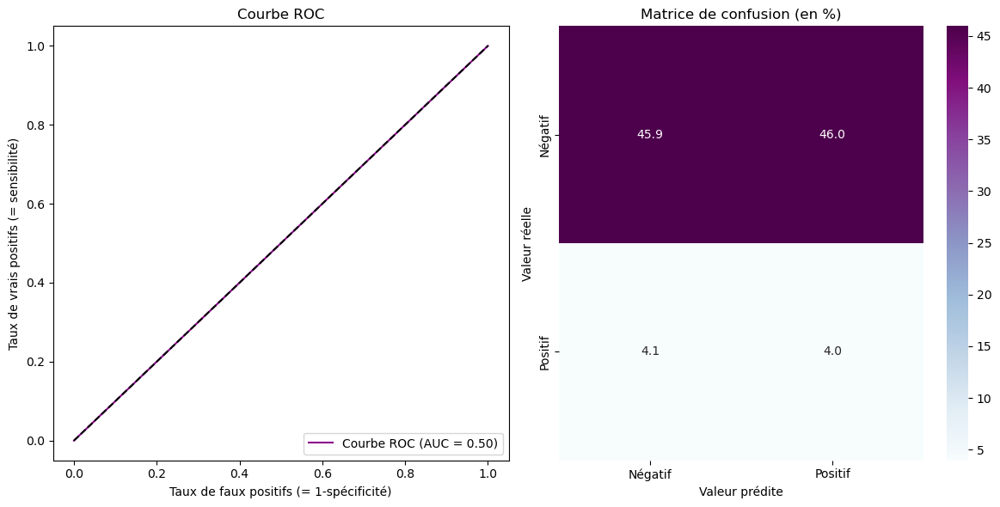

Score : 0.5


In [371]:
cout_fn = -20
cout_fp = -2
cout_tp = 0
cout_tn = 10

tp, fn, score_smote_dummy = roc_conf_score(y_test, y_pred_test_best_smote_dummy, y_pred_prob_test_smote_dummy, cout_fn, cout_fp, cout_tp, cout_tn)

In [372]:
import subprocess

In [373]:
subprocess.Popen(["mlflow", "ui"])

<Popen: returncode: None args: ['mlflow', 'ui']>

In [374]:
# Lieu d'enregistrement des métriques et hyperparamètres
mlflow.set_tracking_uri("http://localhost:5000")

In [375]:
# Récupérer l'expérience en fonction de son nom
experiment_name = "Model_smote"
experiment = mlflow.get_experiment_by_name(experiment_name)
if experiment is None:
    experiment_id = mlflow.create_experiment(experiment_name)
else:
    experiment_id = experiment.experiment_id

Registered model 'sk-learn-dummy-classifier-smote' already exists. Creating a new version of this model...
2023/07/12 15:18:03 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: sk-learn-dummy-classifier-smote, version 4
Created version '4' of model 'sk-learn-dummy-classifier-smote'.


Matrice de confusion :
TN =  28109  | FP =  28121
FN =  2524  | TP =  2426


<Figure size 640x480 with 0 Axes>

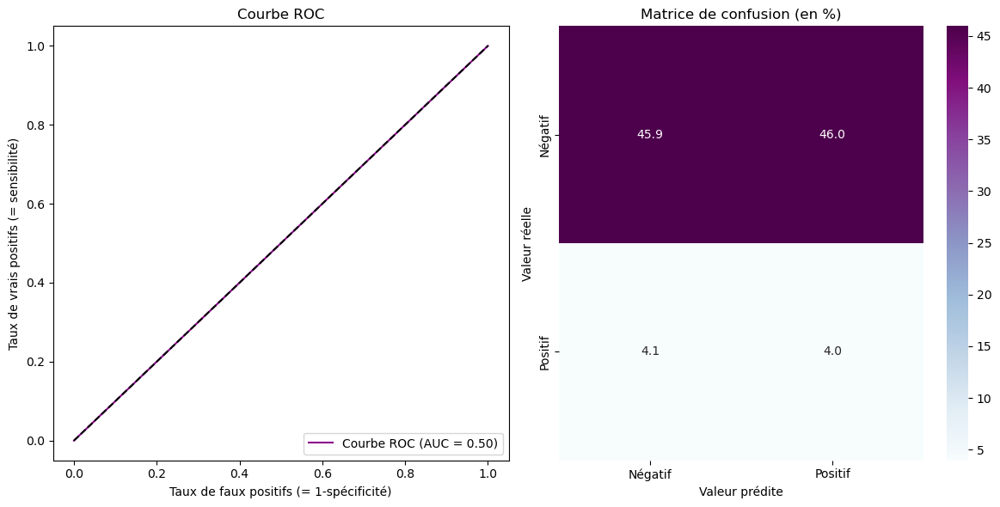

Score : 0.5


In [376]:
# Nouvelle exécution MLflow
mlflow.start_run(experiment_id=experiment_id, nested=True)

# Enregistrement modèle
mlflow.sklearn.log_model(
    sk_model=grid_search_smote_dummy.best_estimator_['classifier'],
    artifact_path="sklearn-model",
    registered_model_name="sk-learn-dummy-classifier-smote"
)

# Enregistrement des métriques
mlflow.log_metric("accuracy", accuracy_smote_dummy)
mlflow.log_metric("precision", precision_smote_dummy)
mlflow.log_metric("recall", recall_smote_dummy)
mlflow.log_metric("f1", f1_smote_dummy)
mlflow.log_metric("AUC", AUC_smote_dummy)
mlflow.log_metric("Score", score_smote_dummy)

# Enregistrement des meilleurs hyperparamètres
mlflow.log_params(grid_search_smote_dummy.best_params_)

# Enregistrement de la courbe ROC et la matrice de confusion
fig = plt.figure()
roc_conf_score(y_test, y_pred_test_best_smote_dummy, y_pred_prob_test_smote_dummy, cout_fn, cout_fp, cout_tp, cout_tn)

# Enregistrement de l'image
fig.savefig("roc_confusion_plot_smote_dummy.png")

# Enregistrement de l'image dans MLflow
mlflow.log_artifact("roc_confusion_plot_smote_dummy.png")

# Terminez l'exécution MLflow
mlflow.end_run()

In [377]:
# On va stocker les résultats dans un tableau
results = []

results.append({
    'Modèle': 'Dummy Classifier',
    'AUC': AUC_smote_dummy,
    'Accuracy score' : accuracy_smote_dummy,
    'Precision score' : precision_smote_dummy,
    'Recall score' : recall_smote_dummy,
    'F1_score' : f1_smote_dummy,
    'TP' : tp,
    'FN' : fn,
    'Score' : score_smote_dummy,
    'Temps' : total_time_smote_dummy
})

df_results_dummy = pd.DataFrame(results)

### 2.1.2. Logistic Regression

In [378]:
# On affiche les résultats pour le modèle Logistic Regression
model_LR = model_smote(LogisticRegression, X_train, y_train, X_test, y_test)

Accuracy du modèle (validation): 0.681350114416476
Precision du modèle (validation): 0.15314541899174894
Recall du modèle (validation): 0.6486868686868686
F1-Score du modèle (validation): 0.24779102519581742
AUC du modèle (validation): 0.6664561855438613
----------


In [479]:
# Hyper-paramètres pour la régression logistique
LR_params = {
    'classifier__penalty': ['l1', 'l2'],
    'classifier__C': [0.1, 1, 10, 100]
}

y_test, total_time_smote_LR, accuracy_smote_LR, precision_smote_LR, recall_smote_LR, f1_smote_LR, AUC_smote_LR, AUC_train_smote_LR, y_pred_test_best_smote_LR, y_pred_prob_test_smote_LR, grid_search_smote_LR = model_smote_opti(LogisticRegression, X_train, y_train, X_test, y_test, **LR_params)

Temps écoulé : 50.028164863586426 secondes
Meilleurs hyperparamètres : {'smote__sampling_strategy': 'auto', 'smote__k_neighbors': 3, 'classifier__penalty': 'l2', 'classifier__C': 0.1}
L'accuracy score est de : 0.6821183393265773
Le score de précision est de : 0.1535557254826993
Le score recall est de : 0.649090909090909
Le score f1 est de : 0.24835742444152434
Le score AUC est de : 0.7284632704422851
----------
              precision    recall  f1-score   support

           0       0.96      0.69      0.80     56230
           1       0.15      0.65      0.25      4950

    accuracy                           0.68     61180
   macro avg       0.56      0.67      0.52     61180
weighted avg       0.89      0.68      0.75     61180



Matrice de confusion :
TN =  38517  | FP =  17713
FN =  1737  | TP =  3213


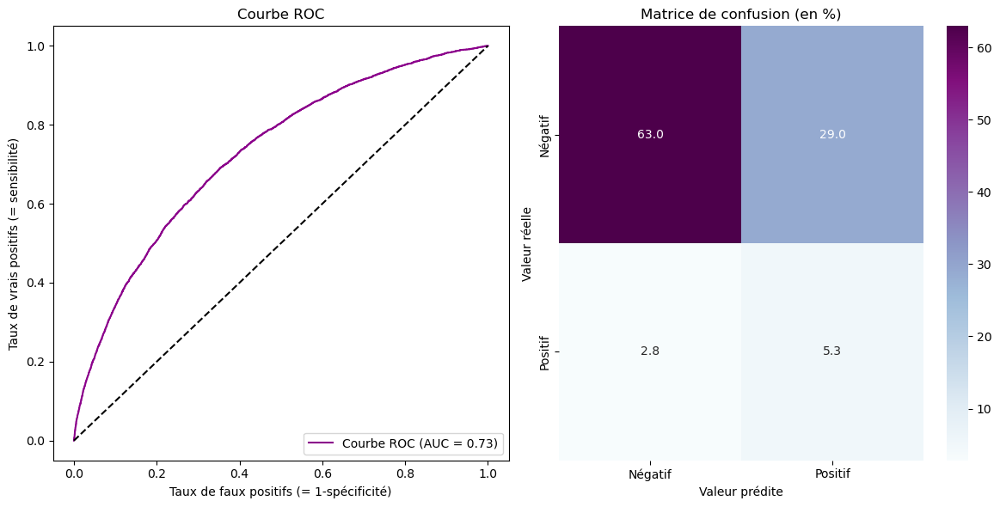

Score : 0.68


In [380]:
cout_fn = -20
cout_fp = -2
cout_tp = 0
cout_tn = 10

tp, fn, score_smote_LR = roc_conf_score(y_test, y_pred_test_best_smote_LR, y_pred_prob_test_smote_LR, cout_fn, cout_fp, cout_tp, cout_tn)

In [381]:
# On va stocker les résultats dans un tableau
results = []

results.append({
    'Modèle': 'Logistic Regression',
    'AUC': AUC_smote_LR,
    'Accuracy score' : accuracy_smote_LR,
    'Precision score' : precision_smote_LR,
    'Recall score' : recall_smote_LR,
    'F1_score' : f1_smote_LR,
    'TP' : tp,
    'FN' : fn,
    'Score' : score_smote_LR,
    'Temps' : total_time_smote_LR
})

df_results_LR = pd.DataFrame(results)

Registered model 'sk-learn-LR-classifier-smote' already exists. Creating a new version of this model...
2023/07/12 15:18:59 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: sk-learn-LR-classifier-smote, version 4
Created version '4' of model 'sk-learn-LR-classifier-smote'.


Matrice de confusion :
TN =  38517  | FP =  17713
FN =  1737  | TP =  3213


<Figure size 640x480 with 0 Axes>

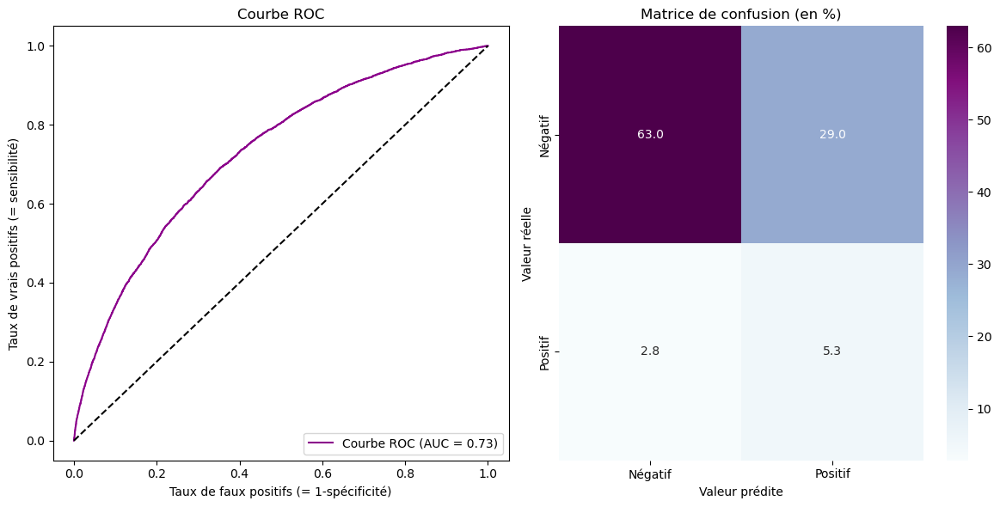

Score : 0.68


In [382]:
# Nouvelle exécution MLflow
mlflow.start_run(experiment_id=experiment_id, nested=True)

# Enregistrement modèle
mlflow.sklearn.log_model(
    sk_model=grid_search_smote_LR.best_estimator_['classifier'],
    artifact_path="sklearn-model",
    registered_model_name="sk-learn-LR-classifier-smote"
)

# Enregistrement des métriques
mlflow.log_metric("accuracy", accuracy_smote_LR)
mlflow.log_metric("precision", precision_smote_LR)
mlflow.log_metric("recall", recall_smote_LR)
mlflow.log_metric("f1", f1_smote_LR)
mlflow.log_metric("AUC", AUC_smote_LR)
mlflow.log_metric("Score", score_smote_LR)

# Enregistrement des meilleurs hyperparamètres
mlflow.log_params(grid_search_smote_LR.best_params_)

# Enregistrement de la courbe ROC et la matrice de confusion
fig = plt.figure()
roc_conf_score(y_test, y_pred_test_best_smote_LR, y_pred_prob_test_smote_LR, cout_fn, cout_fp, cout_tp, cout_tn)

# Enregistrement de l'image
fig.savefig("roc_confusion_plot_smote_LR.png")

# Enregistrement de l'image dans MLflow
mlflow.log_artifact("roc_confusion_plot_smote_LR.png")

# Terminez l'exécution MLflow
mlflow.end_run()

### 2.1.3. Decision Tree Classification

In [383]:
# On affiche les résultats pour le modèle Decision Tree Classification
model_DT = model_smote(DecisionTreeClassifier, X_train, y_train, X_test, y_test)

Accuracy du modèle (validation): 0.7797482837528604
Precision du modèle (validation): 0.12248693649809583
Recall du modèle (validation): 0.2793939393939394
F1-Score du modèle (validation): 0.170309709993227
AUC du modèle (validation): 0.5515945332751307
----------


In [480]:
# Hyper-paramètres pour le classifieur Decision Tree
DT_params = {
    'classifier__criterion': ['gini', 'entropy'],
    'classifier__max_depth':  [None, 5, 10, 20],
    'classifier__max_features': range(1, 10),
    'classifier__min_samples_leaf': range(1, 10)
}

y_test, total_time_smote_DT, accuracy_smote_DT, precision_smote_DT, recall_smote_DT, f1_smote_DT, AUC_smote_DT, AUC_train_smote_DT, y_pred_test_best_smote_DT, y_pred_prob_test_smote_DT, grid_search_smote_DT = model_smote_opti(DecisionTreeClassifier, X_train, y_train, X_test, y_test, **DT_params)

Temps écoulé : 146.71498370170593 secondes
Meilleurs hyperparamètres : {'smote__sampling_strategy': 'minority', 'smote__k_neighbors': 5, 'classifier__min_samples_leaf': 6, 'classifier__max_features': 4, 'classifier__max_depth': 10, 'classifier__criterion': 'entropy'}
L'accuracy score est de : 0.6782118339326577
Le score de précision est de : 0.13236541435912788
Le score recall est de : 0.535959595959596
Le score f1 est de : 0.2122994438442764
Le score AUC est de : 0.6529341305640434
----------
              precision    recall  f1-score   support

           0       0.94      0.69      0.80     56230
           1       0.13      0.54      0.21      4950

    accuracy                           0.68     61180
   macro avg       0.54      0.61      0.51     61180
weighted avg       0.88      0.68      0.75     61180



Matrice de confusion :
TN =  36245  | FP =  19985
FN =  1941  | TP =  3009


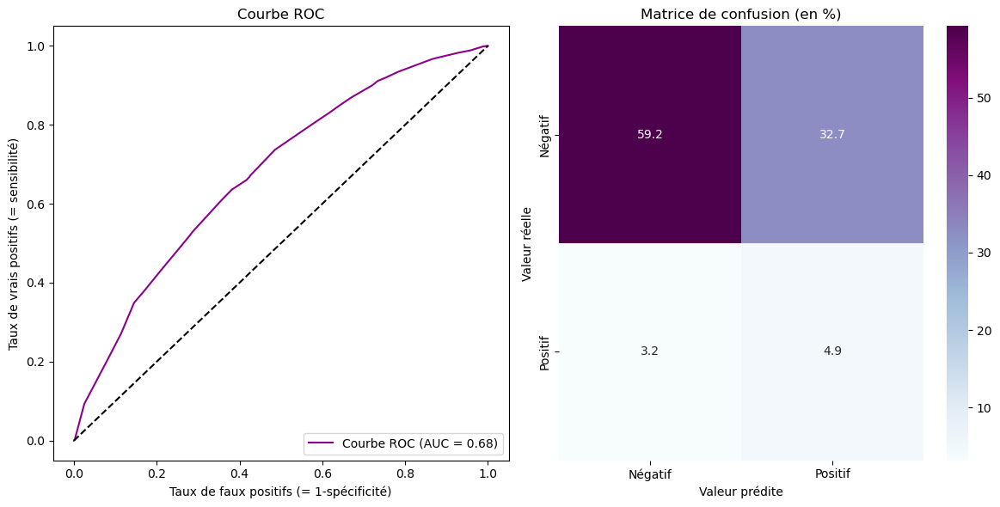

Score : 0.64


In [385]:
cout_fn = -20
cout_fp = -2
cout_tp = 0
cout_tn = 10

tp, fn, score_smote_DT = roc_conf_score(y_test, y_pred_test_best_smote_DT, y_pred_prob_test_smote_DT, cout_fn, cout_fp, cout_tp, cout_tn)

In [386]:
# On va stocker les résultats dans un tableau
results = []

results.append({
    'Modèle': 'Decision Tree Classifier',
    'AUC': AUC_smote_DT,
    'Accuracy score' : accuracy_smote_DT,
    'Precision score' : precision_smote_DT,
    'Recall score' : recall_smote_DT,
    'F1_score' : f1_smote_DT,
    'TP' : tp,
    'FN' : fn,
    'Score' : score_smote_DT,
    'Temps' : total_time_smote_DT
})

df_results_DT = pd.DataFrame(results)

Registered model 'sk-learn-DT-classifier-smote' already exists. Creating a new version of this model...
2023/07/12 15:22:52 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: sk-learn-DT-classifier-smote, version 4
Created version '4' of model 'sk-learn-DT-classifier-smote'.


Matrice de confusion :
TN =  36245  | FP =  19985
FN =  1941  | TP =  3009


<Figure size 640x480 with 0 Axes>

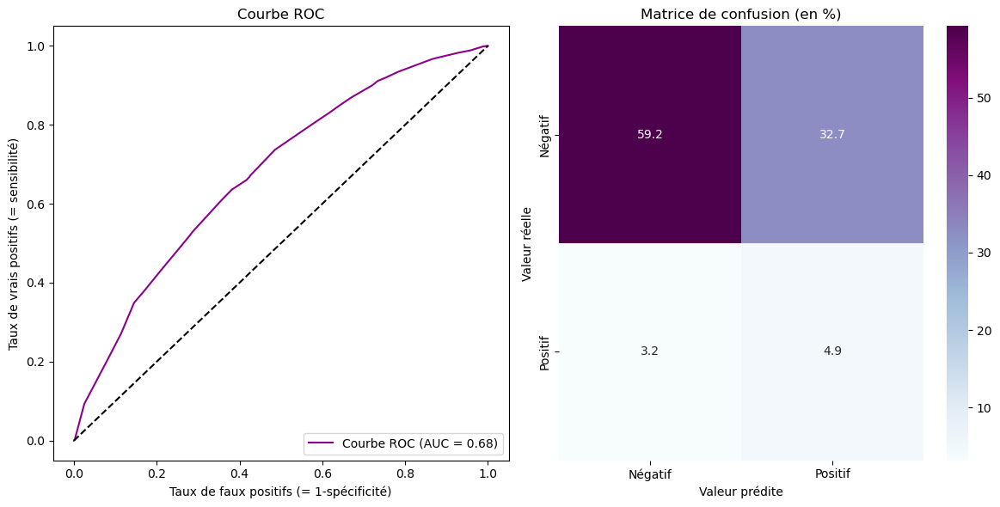

Score : 0.64


In [387]:
# Nouvelle exécution MLflow
mlflow.start_run(experiment_id=experiment_id, nested=True)

# Enregistrement modèle
mlflow.sklearn.log_model(
    sk_model=grid_search_smote_DT.best_estimator_['classifier'],
    artifact_path="sklearn-model",
    registered_model_name="sk-learn-DT-classifier-smote"
)

# Enregistrement des métriques
mlflow.log_metric("accuracy", accuracy_smote_DT)
mlflow.log_metric("precision", precision_smote_DT)
mlflow.log_metric("recall", recall_smote_DT)
mlflow.log_metric("f1", f1_smote_DT)
mlflow.log_metric("AUC", AUC_smote_DT)
mlflow.log_metric("Score", score_smote_DT)

# Enregistrement des meilleurs hyperparamètres
mlflow.log_params(grid_search_smote_DT.best_params_)

# Enregistrement de la courbe ROC et la matrice de confusion
fig = plt.figure()
roc_conf_score(y_test, y_pred_test_best_smote_DT, y_pred_prob_test_smote_DT, cout_fn, cout_fp, cout_tp, cout_tn)

# Enregistrement de l'image
fig.savefig("roc_confusion_plot_smote_DT.png")

# Enregistrement de l'image dans MLflow
mlflow.log_artifact("roc_confusion_plot_smote_DT.png")

# Terminez l'exécution MLflow
mlflow.end_run()

### 2.1.4. LightGBM

In [388]:
# On affiche les résultats pour le modèle LightGBM
model_LGBM = model_smote(LGBMClassifier, X_train, y_train, X_test, y_test)

Accuracy du modèle (validation): 0.8978914677999347
Precision du modèle (validation): 0.23691683569979716
Recall du modèle (validation): 0.11797979797979798
F1-Score du modèle (validation): 0.15751854349291974
AUC du modèle (validation): 0.5422639519865201
----------


In [481]:
# Hyper-paramètres pour le classifieur LightGBM
LGBM_params = {
    'classifier__n_estimators': [100, 500, 1000],
    'classifier__learning_rate': [0.001, 0.01, 0.1],
    'classifier__num_leaves': range(10, 100),
    'classifier__min_child_samples': range(1, 20),
    'classifier__subsample': [0.5, 0.7, 0.9],
    'classifier__colsample_bytree': [0.5, 0.7, 0.9]
}

y_test, total_time_smote_LGBM, accuracy_smote_LGBM, precision_smote_LGBM, recall_smote_LGBM, f1_smote_LGBM, AUC_smote_LGBM, AUC_train_smote_LGBM, y_pred_test_best_smote_LGBM, y_pred_prob_test_smote_LGBM, grid_search_smote_LGBM = model_smote_opti(LGBMClassifier, X_train, y_train, X_test, y_test, **LGBM_params)

Temps écoulé : 319.1689176559448 secondes
Meilleurs hyperparamètres : {'smote__sampling_strategy': 'auto', 'smote__k_neighbors': 3, 'classifier__subsample': 0.5, 'classifier__num_leaves': 96, 'classifier__n_estimators': 500, 'classifier__min_child_samples': 3, 'classifier__learning_rate': 0.1, 'classifier__colsample_bytree': 0.9}
L'accuracy score est de : 0.9107551487414187
Le score de précision est de : 0.2899505766062603
Le score recall est de : 0.07111111111111111
Le score f1 est de : 0.11421155094094744
Le score AUC est de : 0.7164335835682092
----------
              precision    recall  f1-score   support

           0       0.92      0.98      0.95     56230
           1       0.29      0.07      0.11      4950

    accuracy                           0.91     61180
   macro avg       0.61      0.53      0.53     61180
weighted avg       0.87      0.91      0.89     61180



Matrice de confusion :
TN =  55419  | FP =  811
FN =  4622  | TP =  328


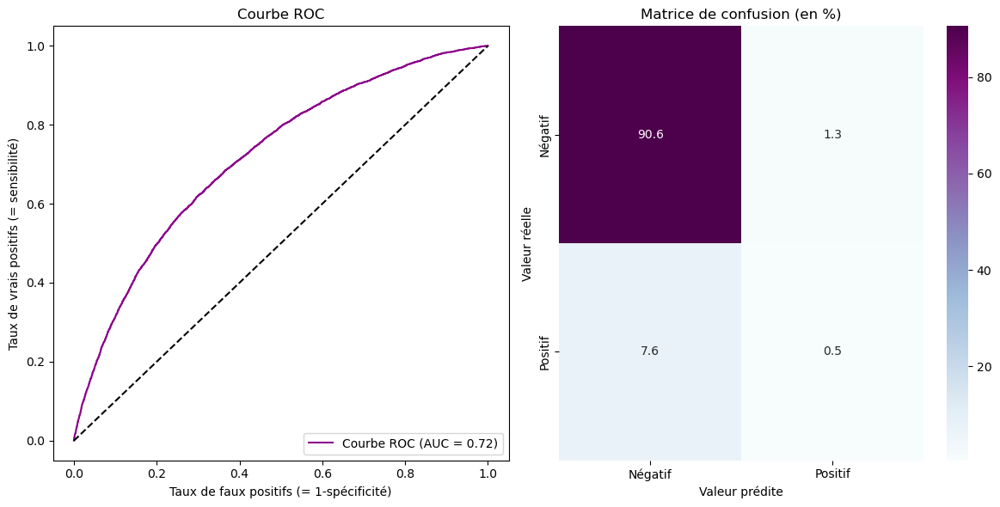

Score : 0.87


In [390]:
cout_fn = -20
cout_fp = -2
cout_tp = 0
cout_tn = 10

tp, fn, score_smote_LGBM = roc_conf_score(y_test, y_pred_test_best_smote_LGBM, y_pred_prob_test_smote_LGBM, cout_fn, cout_fp, cout_tp, cout_tn)

In [391]:
# On va stocker les résultats dans un tableau
results = []

results.append({
    'Modèle': 'LightGBM',
    'AUC': AUC_smote_LGBM,
    'Accuracy score' : accuracy_smote_LGBM,
    'Precision score' : precision_smote_LGBM,
    'Recall score' : recall_smote_LGBM,
    'F1_score' : f1_smote_LGBM,
    'TP' : tp,
    'FN' : fn,
    'Score' : score_smote_LGBM,
    'Temps' : total_time_smote_LGBM
})

df_results_LGBM = pd.DataFrame(results)

Registered model 'sk-learn-LGBM-classifier-smote' already exists. Creating a new version of this model...
2023/07/12 15:30:22 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: sk-learn-LGBM-classifier-smote, version 4
Created version '4' of model 'sk-learn-LGBM-classifier-smote'.


Matrice de confusion :
TN =  55419  | FP =  811
FN =  4622  | TP =  328


<Figure size 640x480 with 0 Axes>

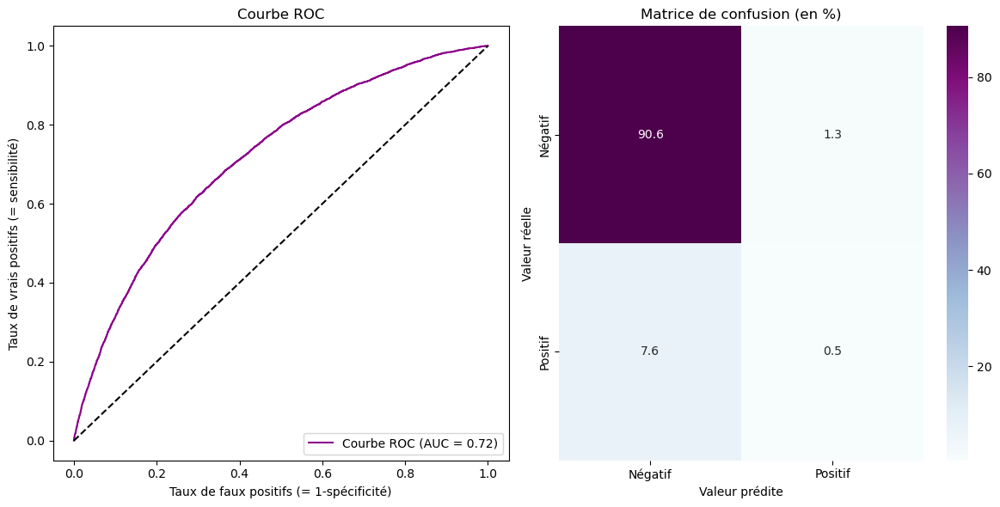

Score : 0.87


In [392]:
# Nouvelle exécution MLflow
mlflow.start_run(experiment_id=experiment_id, nested=True)

# Enregistrement modèle
mlflow.sklearn.log_model(
    sk_model=grid_search_smote_LGBM.best_estimator_['classifier'],
    artifact_path="sklearn-model",
    registered_model_name="sk-learn-LGBM-classifier-smote"
)

# Enregistrement des métriques
mlflow.log_metric("accuracy", accuracy_smote_LGBM)
mlflow.log_metric("precision", precision_smote_LGBM)
mlflow.log_metric("recall", recall_smote_LGBM)
mlflow.log_metric("f1", f1_smote_LGBM)
mlflow.log_metric("AUC", AUC_smote_LGBM)
mlflow.log_metric("Score", score_smote_LGBM)

# Enregistrement des meilleurs hyperparamètres
mlflow.log_params(grid_search_smote_LGBM.best_params_)

# Enregistrement de la courbe ROC et la matrice de confusion
fig = plt.figure()
roc_conf_score(y_test, y_pred_test_best_smote_LGBM, y_pred_prob_test_smote_LGBM, cout_fn, cout_fp, cout_tp, cout_tn)

# Enregistrement de l'image
fig.savefig("roc_confusion_plot_smote_LGBM.png")

# Enregistrement de l'image dans MLflow
mlflow.log_artifact("roc_confusion_plot_smote_LGBM.png")

# Terminez l'exécution MLflow
mlflow.end_run()

### 2.1.5. Comparaison des résultats

In [393]:
# On concatène nos résultats

results_models_smote = pd.concat([df_results_dummy, df_results_LR, df_results_DT, df_results_LGBM])
results_models_smote

,Modèle,AUC,Accuracy score,Precision score,Recall score,F1_score,TP,FN,Score,Temps
0,Dummy Classifier,0.500000,0.499101,0.079419,0.490101,0.136688,2426,2524,0.50,29.981992
0,Logistic Regression,0.728461,0.682086,0.153541,0.649091,0.248338,3213,1737,0.68,47.889681
0,Decision Tree Classifier,0.676049,0.641615,0.130860,0.607879,0.215359,3009,1941,0.64,203.536859
0,LightGBM,0.717349,0.911196,0.287972,0.066263,0.107735,328,4622,0.87,430.406591


Globalement, nous observons des scores AUC plus élevées pour la **régression logistique** (0.73). Le *recall* est maximisé pour la régression logistique et nous observons effectivement que les faux négatifs sont minimisés. Néanmoins, la *précision* la plus élevée l'est pour LightGBM. Le *F1 score* est maximisé avec la régression logistique. Cependant, on observe un *score* plus élevé pour LightGBM (0.87) mais qui reste tout de même élevé pour la régression logistique (0.68). 

A partir des résultats obtenus, on peut clairement dire que la <u>**régression logistique**</u> est le modèle optimal pour la gestion des déséquilibres par *SMOTE*. 

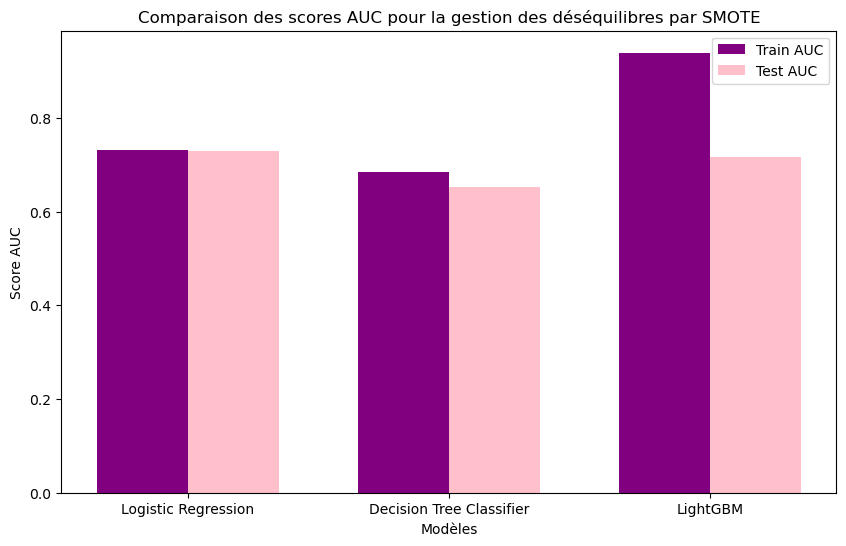

In [496]:
# Liste des scores AUC des données d'entraînement pour chaque modèle
auc_train_scores_smote = [AUC_train_smote_LR, AUC_train_smote_DT, AUC_train_smote_LGBM]

# Liste des scores AUC des données de test pour chaque modèle
auc_test_scores_smote = [AUC_smote_LR, AUC_smote_DT, AUC_smote_LGBM]

# Modèles
models = ['Logistic Regression', 'Decision Tree Classifier', 'LightGBM']

# Largeur des barres
bar_width = 0.35

# Positions des barres
train_bar_positions = np.arange(len(models))
test_bar_positions = train_bar_positions + bar_width

# Création de la figure
fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(train_bar_positions, auc_train_scores, width=bar_width, label='Train AUC', color='purple')
ax.bar(test_bar_positions, auc_test_scores, width=bar_width, label='Test AUC', color='pink')
ax.legend()
ax.set_xlabel('Modèles')
ax.set_ylabel('Score AUC')
ax.set_title('Comparaison des scores AUC pour la gestion des déséquilibres par SMOTE')
ax.set_xticks(train_bar_positions + bar_width / 2)
ax.set_xticklabels(models)
plt.show()

In [394]:
# On crée une nouvelle variable pour le modèle optimal
df_results_LR_smote = df_results_LR.copy()

In [395]:
# On modifie la valeur du modèle
df_results_LR_smote.loc[0, 'Modèle'] = 'Logistic Regression (SMOTE)'

## 2.2. Gestion du déséquilibre par class_weight

### 2.2.1. Logistic Regression

In [396]:
# On crée une fonction calculant les métriques selon le modèle et la méthode de gestion du déséquilibre avec SMOTE
def model_CW(model, X_train, y_train, X_test, y_test):

    # Création de la pipeline avec Dummy Classifier
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('classifier', model(class_weight='balanced', random_state=42))
    ])

    # Entraînement de la pipeline sur les données d'entraînement
    pipeline.fit(X_train, y_train)

    # Prédiction sur les données de test
    y_pred_test = pipeline.predict(X_test)

    # Calcul des métriques d'évaluation
    accuracy_test = accuracy_score(y_test, y_pred_test)
    precision_test = precision_score(y_test, y_pred_test)
    recall_test = recall_score(y_test, y_pred_test)
    f1_test = f1_score(y_test, y_pred_test)
    auc_score_test = roc_auc_score(y_test, y_pred_test)

    # Résultats
    print("Accuracy du modèle (validation):", accuracy_test)
    print("Precision du modèle (validation):", precision_test)
    print("Recall du modèle (validation):", recall_test)
    print("F1-Score du modèle (validation):", f1_test)
    print("AUC du modèle (validation):", auc_score_test)
    print('-'*10)
    
    return pipeline

In [497]:
# On crée une fonction pour l'optimisation des hyperparamètres. 

def model_CW_opti(model, X_train, y_train, X_test, y_test, **model_params):
    
    start_time = time.time()

    # Création de la pipeline
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('classifier', model(class_weight='balanced', random_state=42))
    ])

    # Recherche des meilleurs hyper-paramètres
    grid_search_CW = RandomizedSearchCV(pipeline, {**model_params}, scoring='roc_auc')

    # Entraînement de la pipeline avec la recherche des hyperparamètres
    grid_search_CW.fit(X_train, y_train)

    # Prédiction sur les données d'entraînement et de test avec les meilleurs hyperparamètres
    y_pred_train_best_CW = grid_search_CW.best_estimator_.predict(X_train)
    y_pred_test_best_CW = grid_search_CW.best_estimator_.predict(X_test)

    # Calcul des probabilités des classes positives (prêt non accordé) pour les données de test
    y_pred_prob_test_CW = grid_search_CW.best_estimator_.predict_proba(X_test)[:, 1]
    y_pred_prob_train_CW = grid_search_CW.best_estimator_.predict_proba(X_train)[:, 1]

    end_time = time.time()
    total_time_CW = end_time - start_time

    # Résultats
    print("Temps écoulé :", total_time_CW, "secondes")
    print("Meilleurs hyperparamètres :", grid_search_CW.best_params_)

    # Calcul des métriques de qualité de la classification
    accuracy_CW = accuracy_score(y_test, y_pred_test_best_CW)
    precision_CW = precision_score(y_test, y_pred_test_best_CW)
    recall_CW = recall_score(y_test, y_pred_test_best_CW)
    f1_CW = f1_score(y_test, y_pred_test_best_CW)
    AUC_CW = roc_auc_score(y_test, y_pred_prob_test_CW)
    AUC_train_CW = roc_auc_score(y_train, y_pred_prob_train_CW)

    # Affichage des résultats
    print("L'accuracy score est de :", accuracy_CW)
    print("Le score de précision est de :", precision_CW)
    print("Le score recall est de :", recall_CW)
    print("Le score f1 est de :", f1_CW)
    print("Le score AUC est de :", AUC_CW)
    print('-'*10)

    # Affichage du rapport de classification
    print(classification_report(y_test, y_pred_test_best_CW))
    
    return y_test, total_time_CW, accuracy_CW, precision_CW, recall_CW, f1_CW, AUC_CW, AUC_train_CW, y_pred_test_best_CW, y_pred_prob_test_CW, grid_search_CW

In [398]:
# On affiche les résultats pour le modèle Logistic Regression
CW_LR = model_CW(LogisticRegression, X_train, y_train, X_test, y_test)

Accuracy du modèle (validation): 0.681644328211834
Precision du modèle (validation): 0.15383882190344564
Recall du modèle (validation): 0.6521212121212121
F1-Score du modèle (validation): 0.24894921528554348
AUC du modèle (validation): 0.6681822493115397
----------


In [498]:
# Hyper-paramètres pour Logistic Regression
LR_params = {
    'classifier__penalty': ['l1', 'l2'],
    'classifier__C': [0.1, 1, 10, 100]
}

y_test, total_time_CW, accuracy_CW_LR, precision_CW_LR, recall_CW_LR, f1_CW_LR, AUC_CW_LR, AUC_train_CW_LR, y_pred_test_best_CW_LR, y_pred_prob_test_CW_LR, grid_search_CW_LR = model_CW_opti(LogisticRegression, X_train, y_train, X_test, y_test, **LR_params)

Temps écoulé : 17.225754499435425 secondes
Meilleurs hyperparamètres : {'classifier__penalty': 'l2', 'classifier__C': 100}
L'accuracy score est de : 0.6816279830009807
Le score de précision est de : 0.15383149065955012
Le score recall est de : 0.6521212121212121
Le score f1 est de : 0.24893961594817612
Le score AUC est de : 0.7296056384582084
----------
              precision    recall  f1-score   support

           0       0.96      0.68      0.80     56230
           1       0.15      0.65      0.25      4950

    accuracy                           0.68     61180
   macro avg       0.56      0.67      0.52     61180
weighted avg       0.89      0.68      0.75     61180



Matrice de confusion :
TN =  38474  | FP =  17756
FN =  1722  | TP =  3228


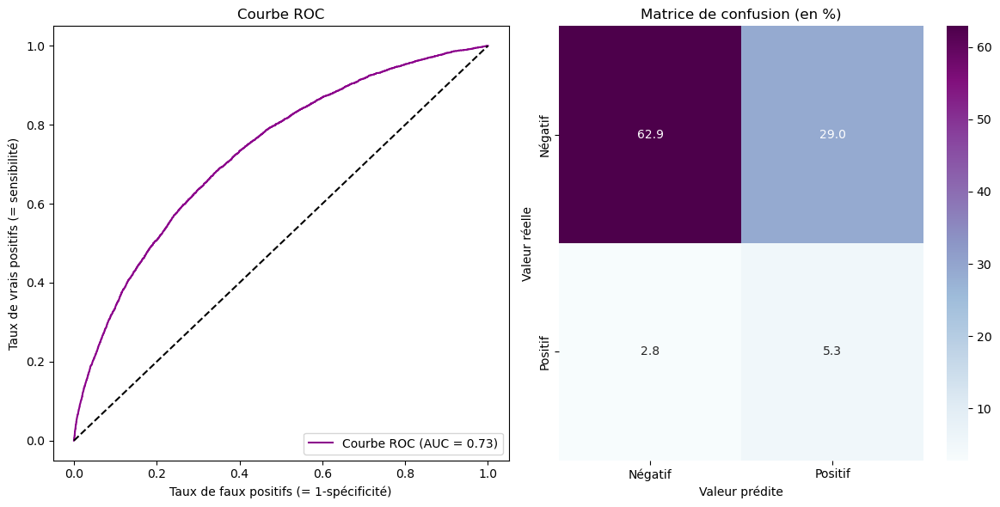

Score : 0.68


In [400]:
cout_fn = -20
cout_fp = -2
cout_tp = 0
cout_tn = 10

tp, fn, score_CW_LR = roc_conf_score(y_test, y_pred_test_best_CW_LR, y_pred_prob_test_CW_LR, cout_fn, cout_fp, cout_tp, cout_tn)

In [401]:
# On va stocker les résultats dans un tableau
results = []

results.append({
    'Modèle': 'Logistic Regression',
    'AUC': AUC_CW_LR,
    'Accuracy score' : accuracy_CW_LR,
    'Precision score' : precision_CW_LR,
    'Recall score' : recall_CW_LR,
    'F1_score' : f1_CW_LR,
    'TP' : tp,
    'FN' : fn,
    'Score' : score_CW_LR,
    'Temps' : total_time_CW
})

df_results_LR = pd.DataFrame(results)

Registered model 'sk-learn-LR-classifier-CW' already exists. Creating a new version of this model...
2023/07/12 15:30:57 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: sk-learn-LR-classifier-CW, version 4
Created version '4' of model 'sk-learn-LR-classifier-CW'.


Matrice de confusion :
TN =  38474  | FP =  17756
FN =  1722  | TP =  3228


<Figure size 640x480 with 0 Axes>

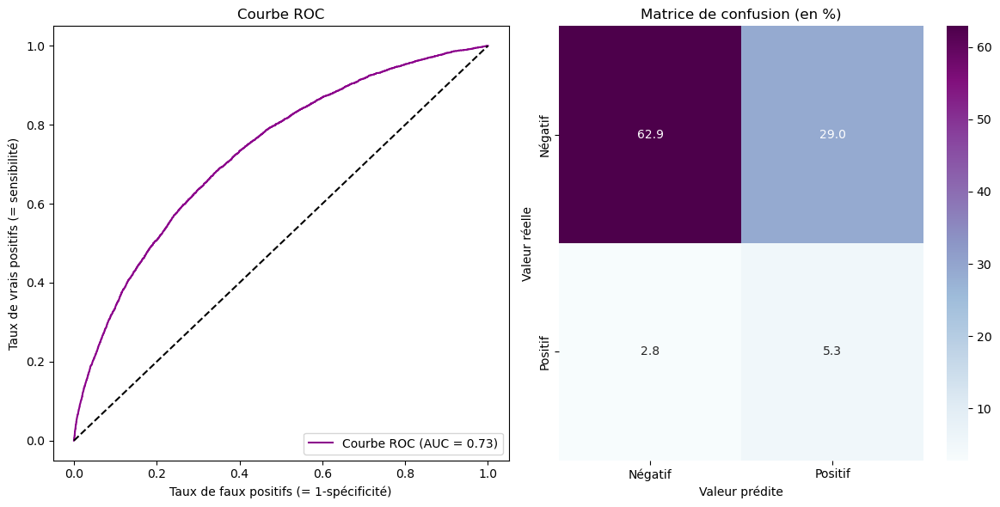

Score : 0.68


In [402]:
# Récupérer l'expérience en fonction de son nom
experiment_name = "Model_class_weight"
experiment = mlflow.get_experiment_by_name(experiment_name)
if experiment is None:
    experiment_id = mlflow.create_experiment(experiment_name)
else:
    experiment_id = experiment.experiment_id
    
# Nouvelle exécution MLflow
mlflow.start_run(experiment_id=experiment_id, nested=True)

# Enregistrement modèle
mlflow.sklearn.log_model(
    sk_model=grid_search_CW_LR.best_estimator_['classifier'],
    artifact_path="sklearn-model",
    registered_model_name="sk-learn-LR-classifier-CW"
)

# Enregistrement des métriques
mlflow.log_metric("accuracy", accuracy_CW_LR)
mlflow.log_metric("precision", precision_CW_LR)
mlflow.log_metric("recall", recall_CW_LR)
mlflow.log_metric("f1", f1_CW_LR)
mlflow.log_metric("AUC", AUC_CW_LR)
mlflow.log_metric("Score", score_CW_LR)

# Enregistrement des meilleurs hyperparamètres
mlflow.log_params(grid_search_CW_LR.best_params_)

# Enregistrement de la courbe ROC et la matrice de confusion
fig = plt.figure()
roc_conf_score(y_test, y_pred_test_best_CW_LR, y_pred_prob_test_CW_LR, cout_fn, cout_fp, cout_tp, cout_tn)

# Enregistrement de l'image
fig.savefig("roc_confusion_plot_CW_LR.png")

# Enregistrement de l'image dans MLflow
mlflow.log_artifact("roc_confusion_plot_CW_LR.png")

# Terminez l'exécution MLflow
mlflow.end_run()

### 2.2.2. Decision Tree Classifier

In [403]:
# On affiche les résultats pour le modèle Decision Tree Classifer
CW_DT = model_CW(DecisionTreeClassifier, X_train, y_train, X_test, y_test)

Accuracy du modèle (validation): 0.8591860084995097
Precision du modèle (validation): 0.1442438361483207
Recall du modèle (validation): 0.1501010101010101
F1-Score du modèle (validation): 0.1471141471141471
AUC du modèle (validation): 0.535854346416324
----------


In [502]:
# Hyper-paramètres pour Decision Tree Classifer
DT_params = {
    'classifier__criterion': ['gini', 'entropy'],
    'classifier__max_depth':  [None, 5, 10, 20],
    'classifier__max_features': range(1, 10),
    'classifier__min_samples_leaf': range(1, 10)
}


y_test, total_time_CW_DT, accuracy_CW_DT, precision_CW_DT, recall_CW_DT, f1_CW_DT, AUC_CW_DT, AUC_train_CW_DT, y_pred_test_best_CW_DT, y_pred_prob_test_CW_DT, grid_search_CW_DT = model_CW_opti(DecisionTreeClassifier, X_train, y_train, X_test, y_test, **DT_params)

Temps écoulé : 58.179513931274414 secondes
Meilleurs hyperparamètres : {'classifier__min_samples_leaf': 2, 'classifier__max_features': 4, 'classifier__max_depth': 10, 'classifier__criterion': 'entropy'}
L'accuracy score est de : 0.6619156587119974
Le score de précision est de : 0.14061215166742805
Le score recall est de : 0.6218181818181818
Le score f1 est de : 0.2293591654247392
Le score AUC est de : 0.6849963910849559
----------
              precision    recall  f1-score   support

           0       0.95      0.67      0.78     56230
           1       0.14      0.62      0.23      4950

    accuracy                           0.66     61180
   macro avg       0.55      0.64      0.51     61180
weighted avg       0.89      0.66      0.74     61180



Matrice de confusion :
TN =  35559  | FP =  20671
FN =  1683  | TP =  3267


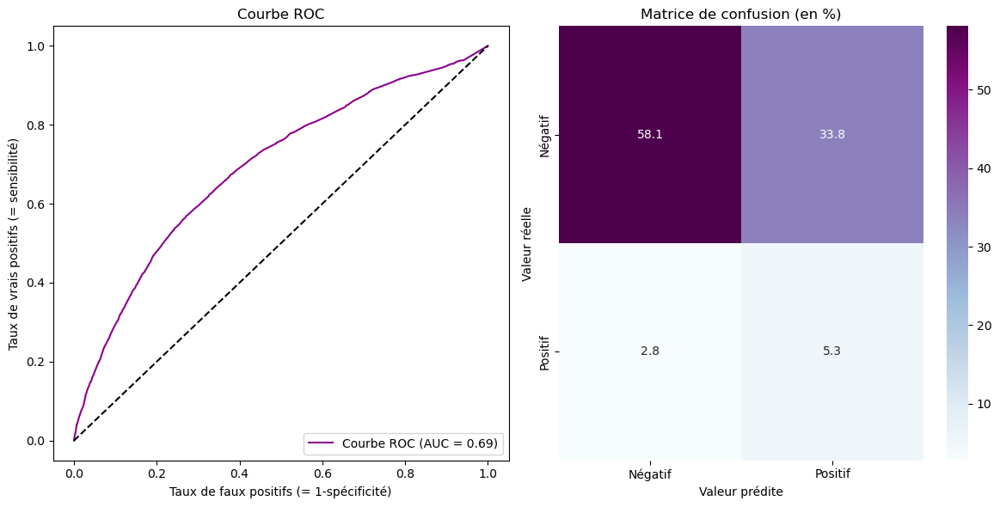

Score : 0.64


In [405]:
cout_fn = -20
cout_fp = -2
cout_tp = 0
cout_tn = 10

tp, fn, score_CW_DT = roc_conf_score(y_test, y_pred_test_best_CW_DT, y_pred_prob_test_CW_DT, cout_fn, cout_fp, cout_tp, cout_tn)

In [406]:
# On va stocker les résultats dans un tableau
results = []

results.append({
    'Modèle': 'Decision Tree Classifier',
    'AUC': AUC_CW_DT,
    'Accuracy score' : accuracy_CW_DT,
    'Precision score' : precision_CW_DT,
    'Recall score' : recall_CW_DT,
    'F1_score' : f1_CW_DT,
    'TP' : tp,
    'FN' : fn,
    'Score' : score_CW_DT,
    'Temps' : total_time_CW_DT
})

df_results_DT = pd.DataFrame(results)

Registered model 'sk-learn-DT-classifier-CW' already exists. Creating a new version of this model...
2023/07/12 15:33:45 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: sk-learn-DT-classifier-CW, version 4
Created version '4' of model 'sk-learn-DT-classifier-CW'.


Matrice de confusion :
TN =  35559  | FP =  20671
FN =  1683  | TP =  3267


<Figure size 640x480 with 0 Axes>

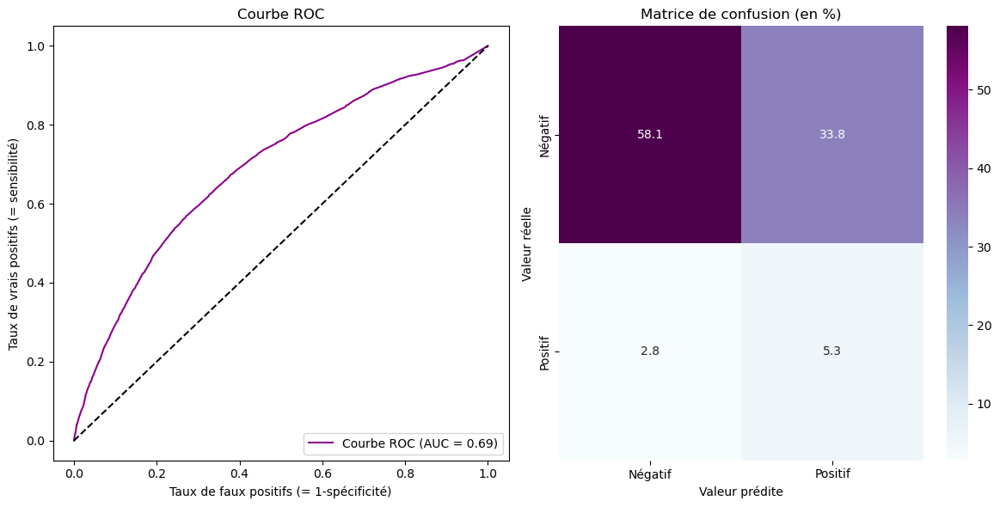

Score : 0.64


In [407]:
# Nouvelle exécution MLflow
mlflow.start_run(experiment_id=experiment_id, nested=True)

# Enregistrement modèle
mlflow.sklearn.log_model(
    sk_model=grid_search_CW_DT.best_estimator_['classifier'],
    artifact_path="sklearn-model",
    registered_model_name="sk-learn-DT-classifier-CW"
)

# Enregistrement des métriques
mlflow.log_metric("accuracy", accuracy_CW_DT)
mlflow.log_metric("precision", precision_CW_DT)
mlflow.log_metric("recall", recall_CW_DT)
mlflow.log_metric("f1", f1_CW_DT)
mlflow.log_metric("AUC", AUC_CW_DT)
mlflow.log_metric("Score", score_CW_DT)

# Enregistrement des meilleurs hyperparamètres
mlflow.log_params(grid_search_CW_DT.best_params_)

# Enregistrement de la courbe ROC et la matrice de confusion
fig = plt.figure()
roc_conf_score(y_test, y_pred_test_best_CW_DT, y_pred_prob_test_CW_DT, cout_fn, cout_fp, cout_tp, cout_tn)

# Enregistrement de l'image
fig.savefig("roc_confusion_plot_CW_DT.png")

# Enregistrement de l'image dans MLflow
mlflow.log_artifact("roc_confusion_plot_CW_DT.png")

# Terminez l'exécution MLflow
mlflow.end_run()

### 2.2.3. LightGBM

In [408]:
# On affiche les résultats pour le modèle LightGBM
CW_LGBM = model_CW(LGBMClassifier, X_train, y_train, X_test, y_test)

Accuracy du modèle (validation): 0.7028604118993135
Precision du modèle (validation): 0.16615353555746226
Recall du modèle (validation): 0.665050505050505
F1-Score du modèle (validation): 0.2658805475911642
AUC du modèle (validation): 0.6856196861016352
----------


In [500]:
# Hyper-paramètres pour le classifieur LightGBM
LGBM_params = {
    'classifier__n_estimators': [100, 500, 1000],
    'classifier__learning_rate': [0.001, 0.01, 0.1],
    'classifier__num_leaves': range(10, 100),
    'classifier__min_child_samples': range(1, 20),
    'classifier__subsample': [0.5, 0.7, 0.9],
    'classifier__colsample_bytree': [0.5, 0.7, 0.9]
}


y_test, total_time_CW_LGBM, accuracy_CW_LGBM, precision_CW_LGBM, recall_CW_LGBM, f1_CW_LGBM, AUC_CW_LGBM, AUC_train_CW_LGBM, y_pred_test_best_CW_LGBM, y_pred_prob_test_CW_LGBM, grid_search_CW_LGBM = model_CW_opti(LGBMClassifier, X_train, y_train, X_test, y_test, **LGBM_params)

Temps écoulé : 200.13264846801758 secondes
Meilleurs hyperparamètres : {'classifier__subsample': 0.7, 'classifier__num_leaves': 51, 'classifier__n_estimators': 1000, 'classifier__min_child_samples': 9, 'classifier__learning_rate': 0.01, 'classifier__colsample_bytree': 0.7}
L'accuracy score est de : 0.7117685518143184
Le score de précision est de : 0.1692740926157697
Le score recall est de : 0.6557575757575758
Le score f1 est de : 0.269087291718478
Le score AUC est de : 0.7553308220027053
----------
              precision    recall  f1-score   support

           0       0.96      0.72      0.82     56230
           1       0.17      0.66      0.27      4950

    accuracy                           0.71     61180
   macro avg       0.56      0.69      0.54     61180
weighted avg       0.90      0.71      0.78     61180



Matrice de confusion :
TN =  39973  | FP =  16257
FN =  1689  | TP =  3261


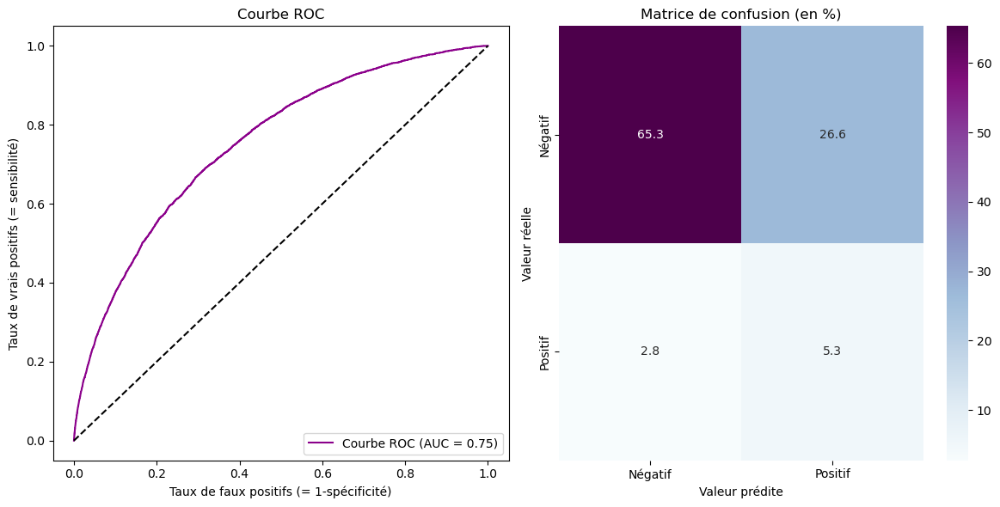

Score : 0.7


In [410]:
cout_fn = -20
cout_fp = -2
cout_tp = 0
cout_tn = 10

tp, fn, score_CW_LGBM = roc_conf_score(y_test, y_pred_test_best_CW_LGBM, y_pred_prob_test_CW_LGBM, cout_fn, cout_fp, cout_tp, cout_tn)

In [411]:
# On va stocker les résultats dans un tableau
results = []

results.append({
    'Modèle': 'LightGBM',
    'AUC': AUC_CW_LGBM,
    'Accuracy score' : accuracy_CW_LGBM,
    'Precision score' : precision_CW_LGBM,
    'Recall score' : recall_CW_LGBM,
    'F1_score' : f1_CW_LGBM,
    'TP' : tp,
    'FN' : fn,
    'Score' : score_CW_LGBM,
    'Temps' : total_time_CW_LGBM
})

df_results_LGBM = pd.DataFrame(results)

Registered model 'sk-learn-LGBM-classifier-CW' already exists. Creating a new version of this model...
2023/07/12 15:38:16 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: sk-learn-LGBM-classifier-CW, version 4
Created version '4' of model 'sk-learn-LGBM-classifier-CW'.


Matrice de confusion :
TN =  39973  | FP =  16257
FN =  1689  | TP =  3261


<Figure size 640x480 with 0 Axes>

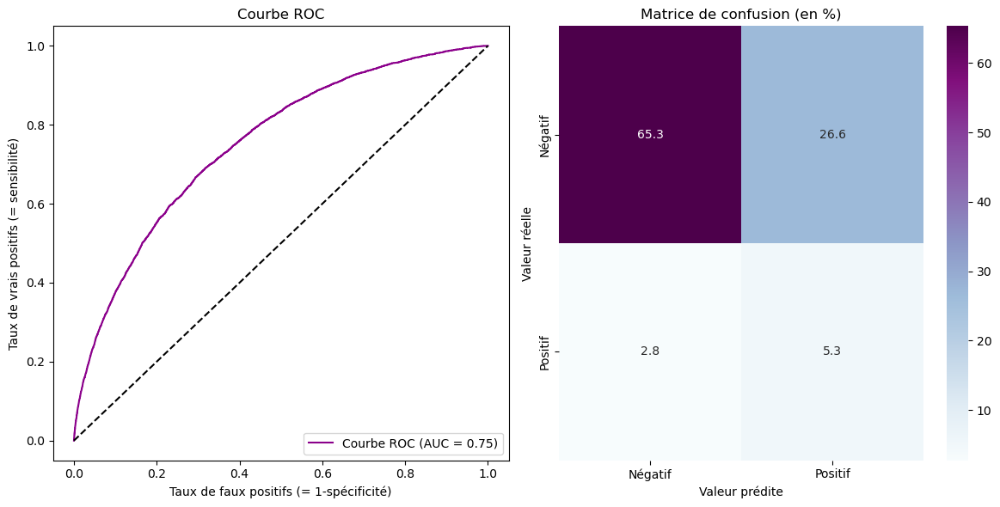

Score : 0.7


In [412]:
# Nouvelle exécution MLflow
mlflow.start_run(experiment_id=experiment_id, nested=True)

# Enregistrement modèle
mlflow.sklearn.log_model(
    sk_model=grid_search_CW_LGBM.best_estimator_['classifier'],
    artifact_path="sklearn-model",
    registered_model_name="sk-learn-LGBM-classifier-CW"
)

# Enregistrement des métriques
mlflow.log_metric("accuracy", accuracy_CW_LGBM)
mlflow.log_metric("precision", precision_CW_LGBM)
mlflow.log_metric("recall", recall_CW_LGBM)
mlflow.log_metric("f1", f1_CW_LGBM)
mlflow.log_metric("AUC", AUC_CW_LGBM)
mlflow.log_metric("Score", score_CW_LGBM)

# Enregistrement des meilleurs hyperparamètres
mlflow.log_params(grid_search_CW_LGBM.best_params_)

# Enregistrement de la courbe ROC et la matrice de confusion
fig = plt.figure()
roc_conf_score(y_test, y_pred_test_best_CW_LGBM, y_pred_prob_test_CW_LGBM, cout_fn, cout_fp, cout_tp, cout_tn)

# Enregistrement de l'image
fig.savefig("roc_confusion_plot_CW_LGBM.png")

# Enregistrement de l'image dans MLflow
mlflow.log_artifact("roc_confusion_plot_CW_LGBM.png")

# Terminez l'exécution MLflow
mlflow.end_run()

### 2.2.4. Comparaison des résultats

In [413]:
# On concatène nos résultats

results_models_CW = pd.concat([df_results_LR, df_results_DT, df_results_LGBM])
results_models_CW

,Modèle,AUC,Accuracy score,Precision score,Recall score,F1_score,TP,FN,Score,Temps
0,Logistic Regression,0.729606,0.681628,0.153831,0.652121,0.248940,3228,1722,0.68,21.647979
0,Decision Tree Classifier,0.691195,0.634619,0.136478,0.660000,0.226184,3267,1683,0.64,133.934103
0,LightGBM,0.752567,0.706669,0.167077,0.658788,0.266552,3261,1689,0.70,252.506408


Nous observons un score *AUC* plus élevé pour LightGBM (0.76). De plus, si on se penche sur les autres métriques, le meilleur score *accuracy*, de *précision* et *recall* a été obtenu pour le modèle LightGBM. De même, si on se penche sur le *F1_score*, il est maximisé avec le modèle LightGBM. Le nombre de TP a été maximisé avec Logistic regression et le nombre de FN a été minimisé avec celui-ci également. En regardant le score métier, on observe qu'il a été obtenu avec LightGBM. 

Nous en concluons donc que le modèle optimal retenu pour la gestion du déséquilibre par class_weight='balanced' est **LightGBM**, mais la régression linéaire aurait également pu être aussi intéressante. 

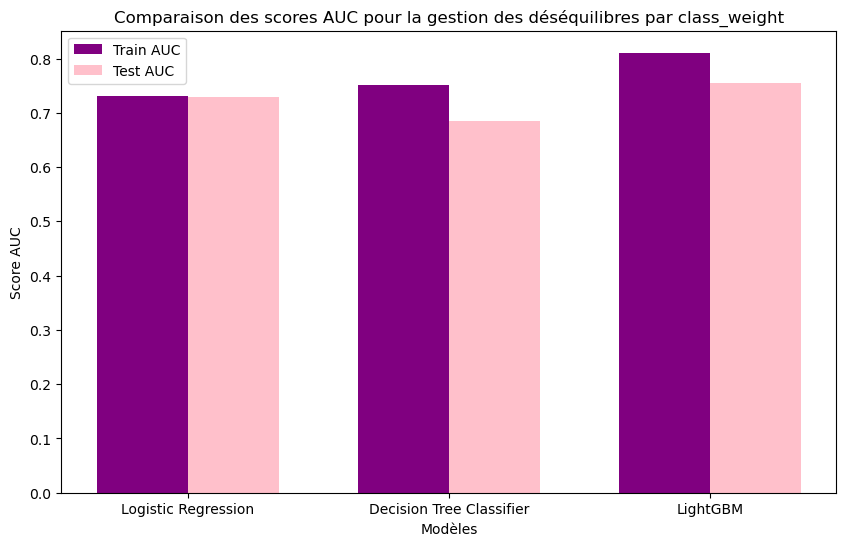

In [503]:
# Liste des scores AUC des données d'entraînement pour chaque modèle
auc_train_scores_CW = [AUC_train_CW_LR, AUC_train_CW_DT, AUC_train_CW_LGBM]

# Liste des scores AUC des données de test pour chaque modèle
auc_test_scores_CW = [AUC_CW_LR, AUC_CW_DT, AUC_CW_LGBM]

# Modèles
models = ['Logistic Regression', 'Decision Tree Classifier', 'LightGBM']

# Largeur des barres
bar_width = 0.35

# Positions des barres
train_bar_positions = np.arange(len(models))
test_bar_positions = train_bar_positions + bar_width

# Création de la figure
fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(train_bar_positions, auc_train_scores_CW, width=bar_width, label='Train AUC', color='purple')
ax.bar(test_bar_positions, auc_test_scores_CW, width=bar_width, label='Test AUC', color='pink')
ax.legend()
ax.set_xlabel('Modèles')
ax.set_ylabel('Score AUC')
ax.set_title('Comparaison des scores AUC pour la gestion des déséquilibres par class_weight')
ax.set_xticks(train_bar_positions + bar_width / 2)
ax.set_xticklabels(models)
plt.show()

In [414]:
# On stocke les résultats dans une variable
df_results_LGBM_CW = df_results_LGBM.copy()

In [415]:
# On modifie la valeur du modèle
df_results_LGBM_CW.loc[0, 'Modèle'] = 'LightGBM (CW)'

## 2.3. Gestion du déséquilibre par RandomUnderSampling

### 2.3.1. Logistic Regression

In [416]:
# On crée une fonction calculant les métriques selon le modèle et la méthode de gestion du déséquilibre avec RandomUnderSampling
def model_RUS(model, X_train, y_train, X_test, y_test):

    # Création de la pipeline
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('undersampler', RandomUnderSampler(random_state=42)),
        ('classifier', model(random_state=42))
    ])

    # Entraînement de la pipeline sur les données d'entraînement
    pipeline.fit(X_train, y_train)
    
    # Mise à l'échelle des données de test avec le même scaler
    X_test_scaled = pipeline.named_steps['scaler'].transform(X_test)

    # Prédiction sur les données de test
    y_pred_test = pipeline.predict(X_test_scaled)

    # Calcul des métriques d'évaluation
    accuracy_test = accuracy_score(y_test, y_pred_test)
    precision_test = precision_score(y_test, y_pred_test)
    recall_test = recall_score(y_test, y_pred_test)
    f1_test = f1_score(y_test, y_pred_test)
    auc_score_test = roc_auc_score(y_test, y_pred_test)

    # Résultats
    print("Accuracy du modèle (validation):", accuracy_test)
    print("Precision du modèle (validation):", precision_test)
    print("Recall du modèle (validation):", recall_test)
    print("F1-Score du modèle (validation):", f1_test)
    print("AUC du modèle (validation):", auc_score_test)
    print('-'*10)
    
    return pipeline

In [504]:
# On crée une fonction pour l'optimisation des hyperparamètres. 

def model_RUS_opti(model, X_train, y_train, X_test, y_test, **model_params):
    
    start_time = time.time()

    # Création de la pipeline
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('undersampler', RandomUnderSampler(random_state=42)),
        ('classifier', model(random_state=42))
    ])

    # Recherche des meilleurs hyper-paramètres
    grid_search_RUS = RandomizedSearchCV(pipeline, {**model_params}, scoring='roc_auc')

    # Entraînement de la pipeline avec la recherche des hyperparamètres
    grid_search_RUS.fit(X_train, y_train)
    
    # Prédiction sur les données d'entraînement et de test avec les meilleurs hyperparamètres
    y_pred_train_best_RUS = grid_search_RUS.best_estimator_.predict(X_train)
    y_pred_test_best_RUS = grid_search_RUS.best_estimator_.predict(X_test)

    # Calcul des probabilités des classes positives (prêt non accordé) pour les données de test et d'entrainement
    y_pred_prob_test_RUS = grid_search_RUS.best_estimator_.predict_proba(X_test)[:, 1]
    y_pred_prob_train_RUS = grid_search_RUS.best_estimator_.predict_proba(X_train)[:, 1]

    end_time = time.time()
    total_time_RUS = end_time - start_time

    # Résultats
    print("Temps écoulé :", total_time_RUS, "secondes")
    print("Meilleurs hyperparamètres :", grid_search_RUS.best_params_)

    # Calcul des métriques de qualité de la classification
    accuracy_RUS = accuracy_score(y_test, y_pred_test_best_RUS)
    precision_RUS = precision_score(y_test, y_pred_test_best_RUS)
    recall_RUS = recall_score(y_test, y_pred_test_best_RUS)
    f1_RUS = f1_score(y_test, y_pred_test_best_RUS)
    AUC_RUS = roc_auc_score(y_test, y_pred_prob_test_RUS)
    AUC_train_RUS = roc_auc_score(y_train, y_pred_prob_train_RUS)

    # Affichage des résultats
    print("L'accuracy score est de :", accuracy_RUS)
    print("Le score de précision est de :", precision_RUS)
    print("Le score recall est de :", recall_RUS)
    print("Le score f1 est de :", f1_RUS)
    print("Le score AUC est de :", AUC_RUS)
    print('-'*10)

    # Affichage du rapport de classification
    print(classification_report(y_test, y_pred_test_best_RUS))
    
    return y_test, total_time_RUS, accuracy_RUS, precision_RUS, recall_RUS, f1_RUS, AUC_RUS, AUC_train_RUS, y_pred_test_best_RUS, y_pred_prob_test_RUS, y_pred_prob_train_RUS, grid_search_RUS

In [418]:
# On affiche les résultats pour le modèle Logistic Regression
model_RUS_LR = model_RUS(LogisticRegression, X_train, y_train, X_test, y_test)

Accuracy du modèle (validation): 0.34596273291925467
Precision du modèle (validation): 0.10040114874413092
Recall du modèle (validation): 0.8898989898989899
F1-Score du modèle (validation): 0.18044404391282975
AUC du modèle (validation): 0.5939891534947555
----------


In [419]:
# Calcul du nombre d'échantillons de chaque classe avant RandomUnderSampling
class_counts_before_LR = pd.Series(y_train).value_counts()
print("Avant Random Under Sampling:")
print("Nombre d'échantillons de la classe 0:", class_counts_before_LR[0])
print("Nombre d'échantillons de la classe 1:", class_counts_before_LR[1])
print('-'*10)

# Application de RandomUnderSampling sur les données d'entraînement
X_train_resampled, y_train_resampled = model_RUS_LR['undersampler'].fit_resample(X_train, y_train)

# Vérification de l'équilibrage des classes après RandomUnderSampling
class_counts_after_LR = pd.Series(y_train_resampled).value_counts()
print("Après Random Under Sampling:")
print("Nombre d'échantillons de la classe 0:", class_counts_after_LR[0])
print("Nombre d'échantillons de la classe 1:", class_counts_after_LR[1])

Avant Random Under Sampling:
Nombre d'échantillons de la classe 0: 224922
Nombre d'échantillons de la classe 1: 19798
----------
Après Random Under Sampling:
Nombre d'échantillons de la classe 0: 19798
Nombre d'échantillons de la classe 1: 19798


In [505]:
# Hyper-paramètres pour le modèle Logistic Regression
LR_params = {
    'classifier__penalty': ['l1', 'l2'],
    'classifier__C': [0.1, 1, 10, 100]
}


y_test, total_time_RUS_LR, accuracy_RUS_LR, precision_RUS_LR, recall_RUS_LR, f1_RUS_LR, AUC_RUS_LR, AUC_train_RUS_LR, y_pred_test_best_RUS_LR, y_pred_prob_test_RUS_LR, y_pred_prob_train_RUS_LR, grid_search_RUS_LR = model_RUS_opti(LogisticRegression, X_train, y_train, X_test, y_test, **LR_params)

Temps écoulé : 7.582263946533203 secondes
Meilleurs hyperparamètres : {'classifier__penalty': 'l2', 'classifier__C': 0.1}
L'accuracy score est de : 0.6824288983327885
Le score de précision est de : 0.15369528820856254
Le score recall est de : 0.649090909090909
Le score f1 est de : 0.24853993424869464
Le score AUC est de : 0.7295548693407488
----------
              precision    recall  f1-score   support

           0       0.96      0.69      0.80     56230
           1       0.15      0.65      0.25      4950

    accuracy                           0.68     61180
   macro avg       0.56      0.67      0.52     61180
weighted avg       0.89      0.68      0.75     61180



Matrice de confusion :
TN =  38538  | FP =  17692
FN =  1737  | TP =  3213


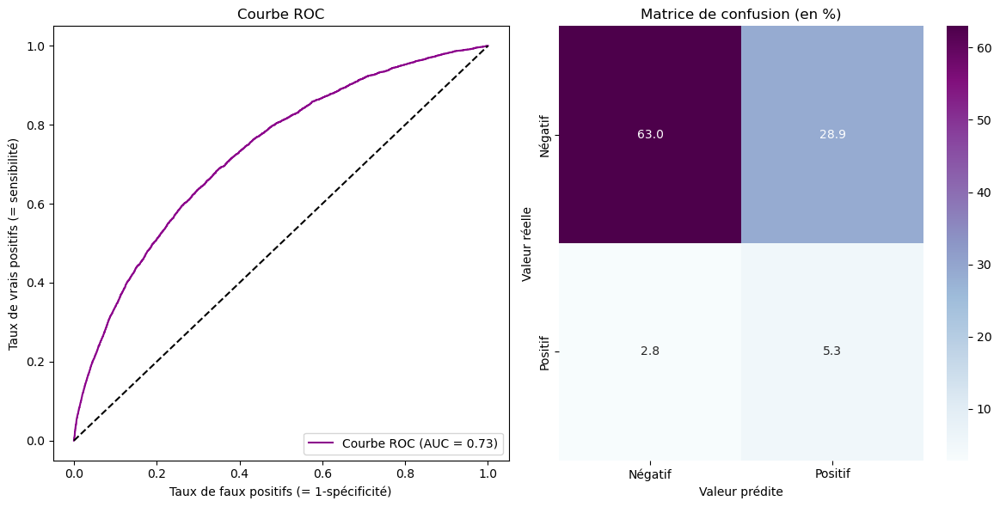

Score : 0.68


In [421]:
cout_fn = -20
cout_fp = -2
cout_tp = 0
cout_tn = 10

tp, fn, score_RUS_LR = roc_conf_score(y_test, y_pred_test_best_RUS_LR, y_pred_prob_test_RUS_LR, cout_fn, cout_fp, cout_tp, cout_tn)

In [422]:
# On va stocker les résultats dans un tableau
results = []

results.append({
    'Modèle' : 'Logistic Regression',
    'AUC': AUC_RUS_LR,
    'Accuracy score' : accuracy_RUS_LR,
    'Precision score' : precision_RUS_LR,
    'Recall score' : recall_RUS_LR,
    'F1_score' : f1_RUS_LR,
    'TP' : tp,
    'FN' : fn,
    'Score' : score_RUS_LR,
    'Temps' : total_time_RUS_LR
})

df_results_LR = pd.DataFrame(results)

Registered model 'sk-learn-LR-classifier-RUS' already exists. Creating a new version of this model...
2023/07/12 15:38:41 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: sk-learn-LR-classifier-RUS, version 4
Created version '4' of model 'sk-learn-LR-classifier-RUS'.


Matrice de confusion :
TN =  38538  | FP =  17692
FN =  1737  | TP =  3213


<Figure size 640x480 with 0 Axes>

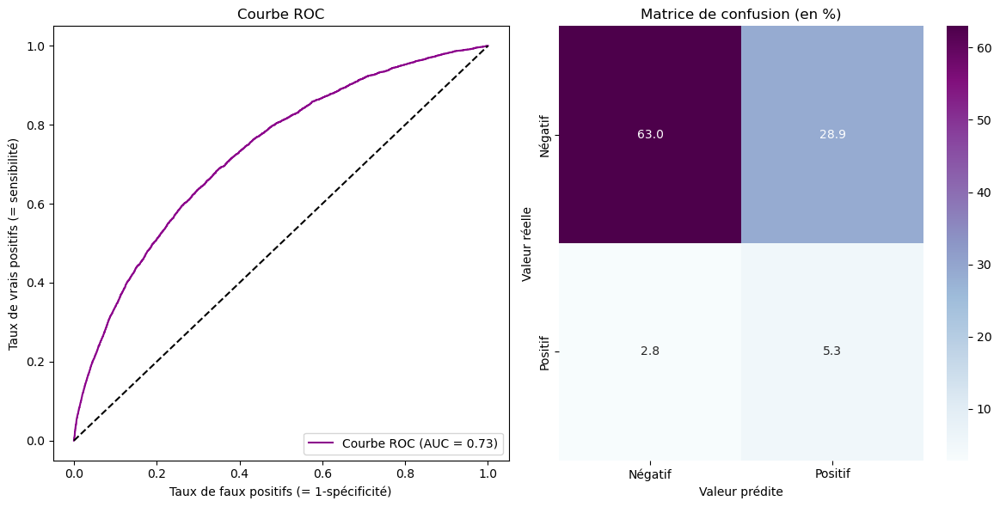

Score : 0.68


In [423]:
# Récupérer l'expérience en fonction de son nom
experiment_name = "Model_RandomUnderSampling"
experiment = mlflow.get_experiment_by_name(experiment_name)
if experiment is None:
    experiment_id = mlflow.create_experiment(experiment_name)
else:
    experiment_id = experiment.experiment_id
    
# Nouvelle exécution MLflow
mlflow.start_run(experiment_id=experiment_id, nested=True)

# Enregistrement modèle
mlflow.sklearn.log_model(
    sk_model=grid_search_RUS_LR.best_estimator_['classifier'],
    artifact_path="sklearn-model",
    registered_model_name="sk-learn-LR-classifier-RUS"
)

# Enregistrement des métriques
mlflow.log_metric("accuracy", accuracy_RUS_LR)
mlflow.log_metric("precision", precision_RUS_LR)
mlflow.log_metric("recall", recall_RUS_LR)
mlflow.log_metric("f1", f1_RUS_LR)
mlflow.log_metric("AUC", AUC_RUS_LR)
mlflow.log_metric("Score", score_RUS_LR)

# Enregistrement des meilleurs hyperparamètres
mlflow.log_params(grid_search_RUS_LR.best_params_)

# Enregistrement de la courbe ROC et la matrice de confusion
fig = plt.figure()
roc_conf_score(y_test, y_pred_test_best_RUS_LR, y_pred_prob_test_RUS_LR, cout_fn, cout_fp, cout_tp, cout_tn)

# Enregistrement de l'image
fig.savefig("roc_confusion_plot_RUS_LR.png")

# Enregistrement de l'image dans MLflow
mlflow.log_artifact("roc_confusion_plot_RUS_LR.png")

# Terminez l'exécution MLflow
mlflow.end_run()

### 2.3.2. Decision Tree Classifier

In [424]:
# On affiche les résultats pour le modèle Decision Tree Classifier
model_RUS_DT = model_RUS(DecisionTreeClassifier, X_train, y_train, X_test, y_test)

Accuracy du modèle (validation): 0.5030728996404054
Precision du modèle (validation): 0.0573873121869783
Recall du modèle (validation): 0.3333333333333333
F1-Score du modèle (validation): 0.09791703756453622
AUC du modèle (validation): 0.4256743138301025
----------


In [506]:
# Hyper-paramètres pour le modèle Logistic Regression
DT_params = {
    'classifier__criterion': ['gini', 'entropy'],
    'classifier__max_depth':  [None, 5, 10, 20],
    'classifier__max_features': range(1, 10),
    'classifier__min_samples_leaf': range(1, 10)
}

y_test, total_time_RUS_DT, accuracy_RUS_DT, precision_RUS_DT, recall_RUS_DT, f1_RUS_DT, AUC_RUS_DT, AUC_train_RUS_DT, y_pred_test_best_RUS_DT, y_pred_prob_test_RUS_DT, y_pred_prob_train_RUS_DT, grid_search_RUS_DT = model_RUS_opti(DecisionTreeClassifier, X_train, y_train, X_test, y_test, **DT_params)

Temps écoulé : 14.356733798980713 secondes
Meilleurs hyperparamètres : {'classifier__min_samples_leaf': 1, 'classifier__max_features': 8, 'classifier__max_depth': 5, 'classifier__criterion': 'entropy'}
L'accuracy score est de : 0.6491990846681922
Le score de précision est de : 0.1323804434945231
Le score recall est de : 0.6006060606060606
Le score f1 est de : 0.21694395796847635
Le score AUC est de : 0.6830654634554687
----------
              precision    recall  f1-score   support

           0       0.95      0.65      0.77     56230
           1       0.13      0.60      0.22      4950

    accuracy                           0.65     61180
   macro avg       0.54      0.63      0.50     61180
weighted avg       0.88      0.65      0.73     61180



Matrice de confusion :
TN =  36880  | FP =  19350
FN =  1904  | TP =  3046


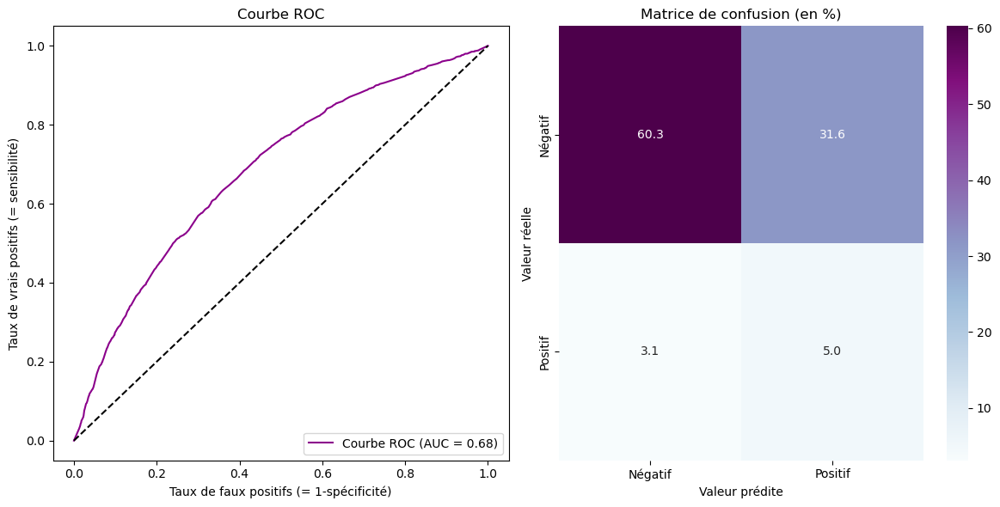

Score : 0.65


In [426]:
cout_fn = -20
cout_fp = -2
cout_tp = 0
cout_tn = 10

tp, fn, score_RUS_DT = roc_conf_score(y_test, y_pred_test_best_RUS_DT, y_pred_prob_test_RUS_DT, cout_fn, cout_fp, cout_tp, cout_tn)

In [427]:
# On va stocker les résultats dans un tableau
results = []

results.append({
    'Modèle': 'Decision Tree Classifier',
    'AUC': AUC_RUS_DT,
    'Accuracy score' : accuracy_RUS_DT,
    'Precision score' : precision_RUS_DT,
    'Recall score' : recall_RUS_DT,
    'F1_score' : f1_RUS_DT,
    'TP' : tp,
    'FN' : fn,
    'Score' : score_RUS_DT,
    'Temps' : total_time_RUS_DT
})

df_results_DT = pd.DataFrame(results)

Registered model 'sk-learn-DT-classifier-RUS' already exists. Creating a new version of this model...
2023/07/12 15:39:29 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: sk-learn-DT-classifier-RUS, version 4
Created version '4' of model 'sk-learn-DT-classifier-RUS'.


Matrice de confusion :
TN =  36880  | FP =  19350
FN =  1904  | TP =  3046


<Figure size 640x480 with 0 Axes>

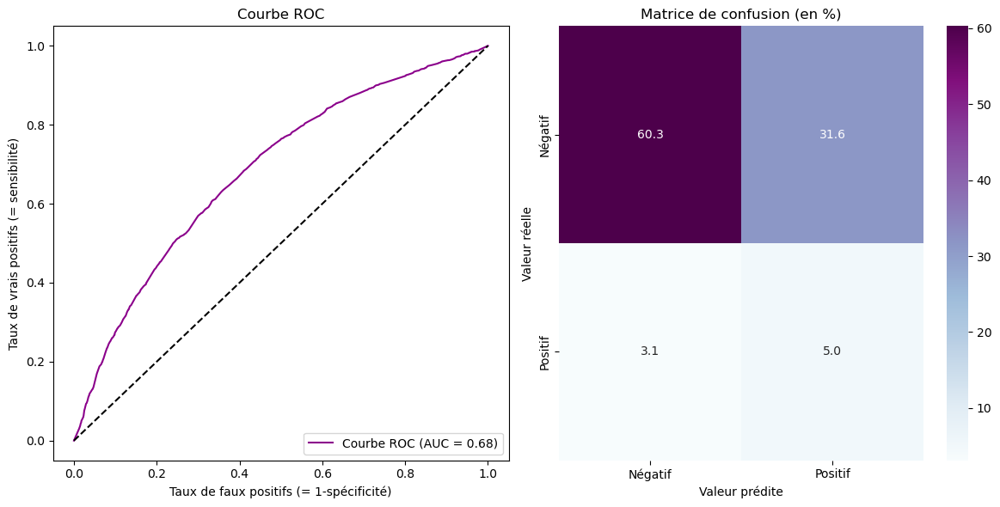

Score : 0.65


In [428]:
# Nouvelle exécution MLflow
mlflow.start_run(experiment_id=experiment_id, nested=True)

# Enregistrement modèle
mlflow.sklearn.log_model(
    sk_model=grid_search_RUS_DT.best_estimator_['classifier'],
    artifact_path="sklearn-model",
    registered_model_name="sk-learn-DT-classifier-RUS"
)

# Enregistrement des métriques
mlflow.log_metric("accuracy", accuracy_RUS_DT)
mlflow.log_metric("precision", precision_RUS_DT)
mlflow.log_metric("recall", recall_RUS_DT)
mlflow.log_metric("f1", f1_RUS_DT)
mlflow.log_metric("AUC", AUC_RUS_DT)
mlflow.log_metric("Score", score_RUS_DT)

# Enregistrement des meilleurs hyperparamètres
mlflow.log_params(grid_search_RUS_DT.best_params_)

# Enregistrement de la courbe ROC et la matrice de confusion
fig = plt.figure()
roc_conf_score(y_test, y_pred_test_best_RUS_DT, y_pred_prob_test_RUS_DT, cout_fn, cout_fp, cout_tp, cout_tn)

# Enregistrement de l'image
fig.savefig("roc_confusion_plot_RUS_DT.png")

# Enregistrement de l'image dans MLflow
mlflow.log_artifact("roc_confusion_plot_RUS_DT.png")

# Terminez l'exécution MLflow
mlflow.end_run()

### 2.3.3. LightGBM

In [429]:
# On affiche les résultats pour le modèle LightGBM
model_RUS_LGBM = model_RUS(LGBMClassifier, X_train, y_train, X_test, y_test)

Accuracy du modèle (validation): 0.40031055900621115
Precision du modèle (validation): 0.10201880877742947
Recall du modèle (validation): 0.8218181818181818
F1-Score du modèle (validation): 0.1815058561070831
AUC du modèle (validation): 0.5925114384104246
----------


In [507]:
# Hyper-paramètres pour le modèle LightGBM
LGBM_params = {
    'classifier__n_estimators': [100, 500, 1000],
    'classifier__learning_rate': [0.001, 0.01, 0.1],
    'classifier__num_leaves': range(10, 100),
    'classifier__min_child_samples': range(1, 20),
    'classifier__subsample': [0.5, 0.7, 0.9],
    'classifier__colsample_bytree': [0.5, 0.7, 0.9]
}

y_test, total_time_RUS_LGBM, accuracy_RUS_LGBM, precision_RUS_LGBM, recall_RUS_LGBM, f1_RUS_LGBM, AUC_RUS_LGBM, AUC_train_RUS_LGBM, y_pred_test_best_RUS_LGBM, y_pred_prob_test_RUS_LGBM, y_pred_prob_train_RUS_LGBM, grid_search_RUS_LGBM = model_RUS_opti(LGBMClassifier, X_train, y_train, X_test, y_test, **LGBM_params)

Temps écoulé : 127.33424973487854 secondes
Meilleurs hyperparamètres : {'classifier__subsample': 0.7, 'classifier__num_leaves': 95, 'classifier__n_estimators': 1000, 'classifier__min_child_samples': 14, 'classifier__learning_rate': 0.01, 'classifier__colsample_bytree': 0.9}
L'accuracy score est de : 0.6927590715920235
Le score de précision est de : 0.16192196884613508
Le score recall est de : 0.6698989898989899
Le score f1 est de : 0.26080459318101384
Le score AUC est de : 0.7505904573028884
----------
              precision    recall  f1-score   support

           0       0.96      0.69      0.81     56230
           1       0.16      0.67      0.26      4950

    accuracy                           0.69     61180
   macro avg       0.56      0.68      0.53     61180
weighted avg       0.90      0.69      0.76     61180



Matrice de confusion :
TN =  39128  | FP =  17102
FN =  1615  | TP =  3335


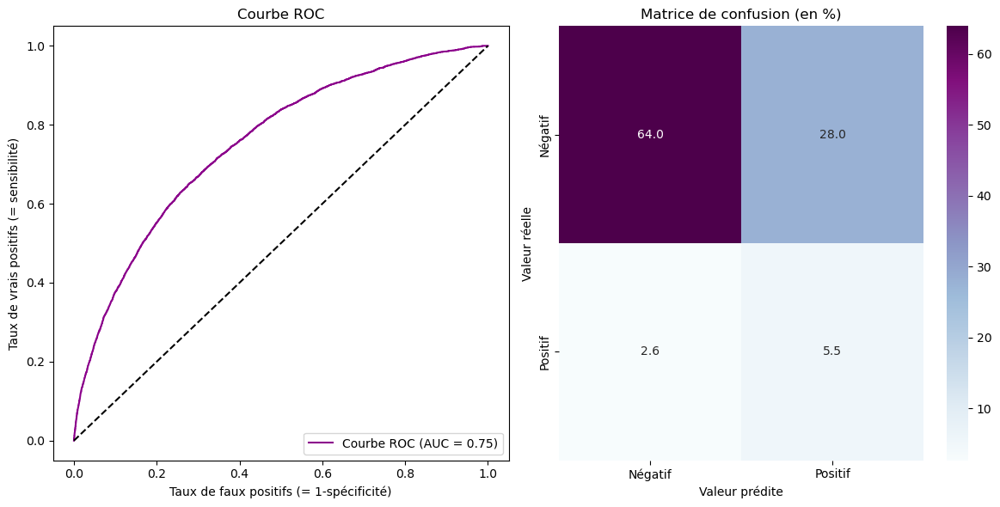

Score : 0.69


In [431]:
cout_fn = -20
cout_fp = -2
cout_tp = 0
cout_tn = 10

tp, fn, score_RUS_LGBM = roc_conf_score(y_test, y_pred_test_best_RUS_LGBM, y_pred_prob_test_RUS_LGBM, cout_fn, cout_fp, cout_tp, cout_tn)

In [432]:
# On va stocker les résultats dans un tableau
results = []

results.append({
    'Modèle': 'LightGBM',
    'AUC': AUC_RUS_LGBM,
    'Accuracy score' : accuracy_RUS_LGBM,
    'Precision score' : precision_RUS_LGBM,
    'Recall score' : recall_RUS_LGBM,
    'F1_score' : f1_RUS_LGBM,
    'TP' : tp,
    'FN' : fn,
    'Score' : score_RUS_LGBM,
    'Temps' : total_time_RUS_LGBM
})

df_results_LGBM = pd.DataFrame(results)

Registered model 'sk-learn-LGBM-classifier-RUS' already exists. Creating a new version of this model...
2023/07/12 15:41:55 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: sk-learn-LGBM-classifier-RUS, version 4
Created version '4' of model 'sk-learn-LGBM-classifier-RUS'.


Matrice de confusion :
TN =  39128  | FP =  17102
FN =  1615  | TP =  3335


<Figure size 640x480 with 0 Axes>

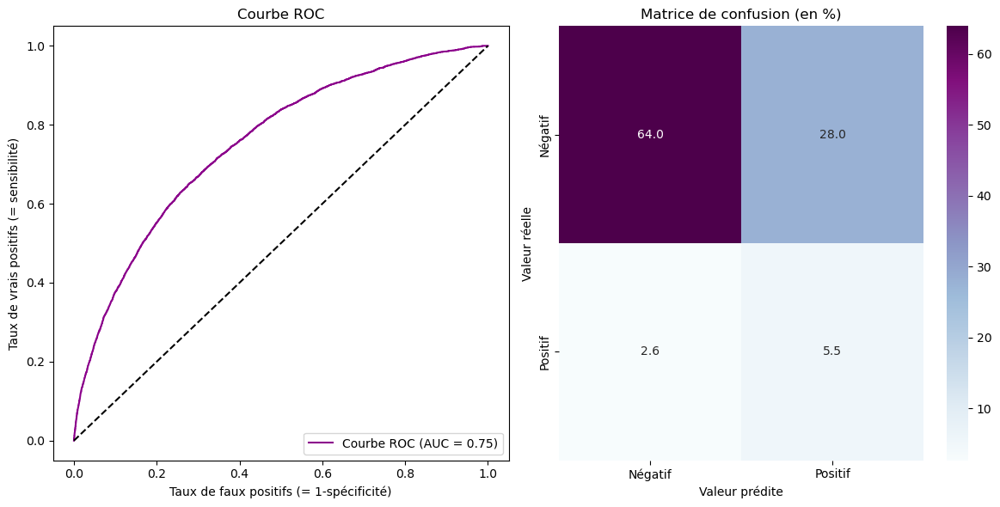

Score : 0.69


In [433]:
# Nouvelle exécution MLflow
mlflow.start_run(experiment_id=experiment_id, nested=True)

# Enregistrement modèle
mlflow.sklearn.log_model(
    sk_model=grid_search_RUS_LGBM.best_estimator_['classifier'],
    artifact_path="sklearn-model",
    registered_model_name="sk-learn-LGBM-classifier-RUS"
)

# Enregistrement des métriques
mlflow.log_metric("accuracy", accuracy_RUS_LGBM)
mlflow.log_metric("precision", precision_RUS_LGBM)
mlflow.log_metric("recall", recall_RUS_LGBM)
mlflow.log_metric("f1", f1_RUS_LGBM)
mlflow.log_metric("AUC", AUC_RUS_LGBM)
mlflow.log_metric("Score", score_RUS_LGBM)

# Enregistrement des meilleurs hyperparamètres
mlflow.log_params(grid_search_RUS_LGBM.best_params_)

# Enregistrement de la courbe ROC et la matrice de confusion
fig = plt.figure()
roc_conf_score(y_test, y_pred_test_best_RUS_LGBM, y_pred_prob_test_RUS_LGBM, cout_fn, cout_fp, cout_tp, cout_tn)

# Enregistrement de l'image
fig.savefig("roc_confusion_plot_RUS_LGBM.png")

# Enregistrement de l'image dans MLflow
mlflow.log_artifact("roc_confusion_plot_RUS_LGBM.png")

# Terminez l'exécution MLflow
mlflow.end_run()

### 2.3.4. Comparaison des résultats

In [434]:
# On concatène nos résultats

results_models_RUS = pd.concat([df_results_LR, df_results_DT, df_results_LGBM])
results_models_RUS

,Modèle,AUC,Accuracy score,Precision score,Recall score,F1_score,TP,FN,Score,Temps
0,Logistic Regression,0.729555,0.682429,0.153695,0.649091,0.248540,3213,1737,0.68,12.174774
0,Decision Tree Classifier,0.684000,0.652599,0.136006,0.615354,0.222775,3046,1904,0.65,32.842294
0,LightGBM,0.752286,0.694067,0.163184,0.673737,0.262733,3335,1615,0.69,128.906979


On observe que les valeurs AUC sont les plus élevées pour LightGBM (0.75). Lorsque nous observons les valeurs d'*accuracy*, de *précision*, *recall score* et *F1_score*, les valeurs les plus élevées le sont pour LightGBM. Les valeurs de vrais positifs sont maximisée pour LightGBM et les valeurs de faux négatifs sont minimisés également pour LightGBM. De plus, ce modèle obtient également le meilleur score métier. Néanmoins, la régression logistique n'est pas loin derrière. 

Nous choisissions donc le modèle **LightGBM** comme modèle optimal pour la gestion du déséquilibre de classe avec RandomUnderSampling. 

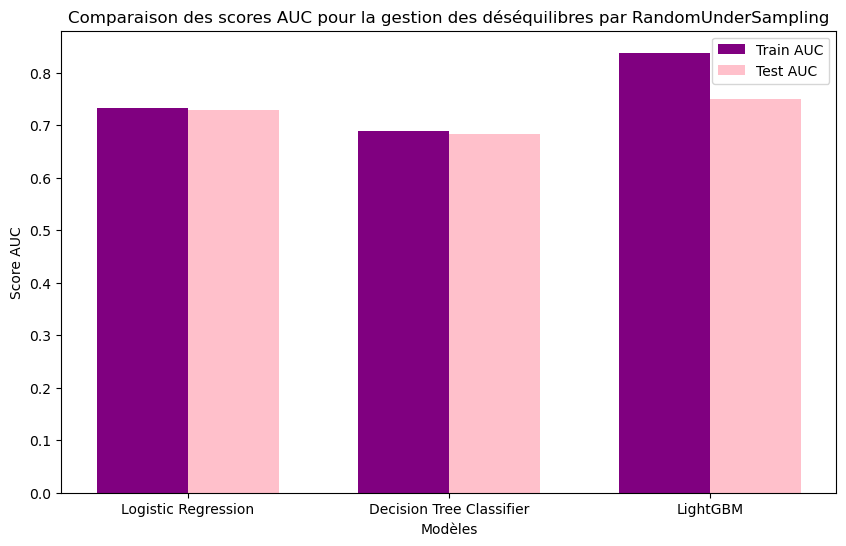

In [508]:
# Liste des scores AUC des données d'entraînement pour chaque modèle
auc_train_scores_RUS = [AUC_train_RUS_LR, AUC_train_RUS_DT, AUC_train_RUS_LGBM]

# Liste des scores AUC des données de test pour chaque modèle
auc_test_scores_RUS = [AUC_RUS_LR, AUC_RUS_DT, AUC_RUS_LGBM]

# Modèles
models = ['Logistic Regression', 'Decision Tree Classifier', 'LightGBM']

# Largeur des barres
bar_width = 0.35

# Positions des barres
train_bar_positions = np.arange(len(models))
test_bar_positions = train_bar_positions + bar_width

# Création de la figure
fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(train_bar_positions, auc_train_scores_RUS, width=bar_width, label='Train AUC', color='purple')
ax.bar(test_bar_positions, auc_test_scores_RUS, width=bar_width, label='Test AUC', color='pink')
ax.legend()
ax.set_xlabel('Modèles')
ax.set_ylabel('Score AUC')
ax.set_title('Comparaison des scores AUC pour la gestion des déséquilibres par RandomUnderSampling')
ax.set_xticks(train_bar_positions + bar_width / 2)
ax.set_xticklabels(models)
plt.show()

In [435]:
# On enregistre le modèle dans une variable
df_results_LGBM_RUS = df_results_LGBM.copy()

In [436]:
# On modifie la valeur du modèle
df_results_LGBM_RUS.loc[0, 'Modèle'] = 'LightGBM (RUS)'

## 2.4. Gestion du déséquilibre par SMOTE + RandomUnderSampling

### 2.4.1. Logistic Regression

In [437]:
# On crée une fonction calculant les métriques selon le modèle et la méthode de gestion du déséquilibre avec RandomUnderSampling
def model_RUS_smote(model, X_train, y_train, X_test, y_test):

    # Création de la pipeline
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('sampler', SMOTE(sampling_strategy=1.0, random_state=42)),
        ('undersampler', RandomUnderSampler(sampling_strategy=1.0, random_state=42)),
        ('classifier', model(random_state=42))
    ])

    # Entraînement de la pipeline sur les données d'entraînement
    pipeline.fit(X_train, y_train)

    # Prédiction sur les données de test
    y_pred_test = pipeline.predict(X_test)

    # Calcul des métriques d'évaluation
    accuracy_test = accuracy_score(y_test, y_pred_test)
    precision_test = precision_score(y_test, y_pred_test)
    recall_test = recall_score(y_test, y_pred_test)
    f1_test = f1_score(y_test, y_pred_test)
    auc_score_test = roc_auc_score(y_test, y_pred_test)

    # Résultats
    print("Accuracy du modèle (validation):", accuracy_test)
    print("Precision du modèle (validation):", precision_test)
    print("Recall du modèle (validation):", recall_test)
    print("F1-Score du modèle (validation):", f1_test)
    print("AUC du modèle (validation):", auc_score_test)
    print('-'*10)
    
    return pipeline

In [509]:
# On crée une fonction pour l'optimisation des hyperparamètres. 

def model_RUS_smote_opti(model, X_train, y_train, X_test, y_test, **model_params):
    
    start_time = time.time()

    # Création de la pipeline
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('sampler', SMOTE(sampling_strategy=1.0, random_state=42)),
        ('undersampler', RandomUnderSampler(sampling_strategy=1.0, random_state=42)),
        ('classifier', model(random_state=42))
    ])

    # Recherche des meilleurs hyper-paramètres
    grid_search_RUS_smote = RandomizedSearchCV(pipeline, {**model_params}, scoring='roc_auc')

    # Entraînement de la pipeline avec la recherche des hyperparamètres
    grid_search_RUS_smote.fit(X_train, y_train)

    # Prédiction sur les données d'entraînement et de test avec les meilleurs hyperparamètres
    y_pred_train_best_RUS_smote = grid_search_RUS_smote.best_estimator_.predict(X_train)
    y_pred_test_best_RUS_smote = grid_search_RUS_smote.best_estimator_.predict(X_test)

    # Calcul des probabilités des classes positives (prêt non accordé) pour les données de test
    y_pred_prob_test_RUS_smote = grid_search_RUS_smote.best_estimator_.predict_proba(X_test)[:, 1]
    y_pred_prob_train_RUS_smote = grid_search_RUS_smote.best_estimator_.predict_proba(X_train)[:, 1]

    end_time = time.time()
    total_time_RUS_smote = end_time - start_time

    # Résultats
    print("Temps écoulé :", total_time_RUS_smote, "secondes")
    print("Meilleurs hyperparamètres :", grid_search_RUS_smote.best_params_)

    # Calcul des métriques de qualité de la classification
    accuracy_RUS_smote = accuracy_score(y_test, y_pred_test_best_RUS_smote)
    precision_RUS_smote = precision_score(y_test, y_pred_test_best_RUS_smote)
    recall_RUS_smote = recall_score(y_test, y_pred_test_best_RUS_smote)
    f1_RUS_smote = f1_score(y_test, y_pred_test_best_RUS_smote)
    AUC_RUS_smote = roc_auc_score(y_test, y_pred_prob_test_RUS_smote)
    AUC_train_RUS_smote = roc_auc_score(y_train, y_pred_prob_train_RUS_smote)

    # Affichage des résultats
    print("L'accuracy score est de :", accuracy_RUS_smote)
    print("Le score de précision est de :", precision_RUS_smote)
    print("Le score recall est de :", recall_RUS_smote)
    print("Le score f1 est de :", f1_RUS_smote)
    print("Le score AUC est de :", AUC_RUS_smote)
    print('-'*10)

    # Affichage du rapport de classification
    print(classification_report(y_test, y_pred_test_best_RUS_smote))
    
    return y_test, total_time_RUS_smote, accuracy_RUS_smote, precision_RUS_smote, recall_RUS_smote, f1_RUS_smote, AUC_RUS_smote, AUC_train_RUS_smote, y_pred_test_best_RUS_smote, y_pred_prob_test_RUS_smote, grid_search_RUS_smote

In [439]:
# On affiche les résultats pour le modèle Logistic Regression
model_RUS_smote_LR = model_RUS_smote(LogisticRegression, X_train, y_train, X_test, y_test)

Accuracy du modèle (validation): 0.6820693036940176
Precision du modèle (validation): 0.15330177401616218
Recall du modèle (validation): 0.6476767676767676
F1-Score du modèle (validation): 0.24792174148397325
AUC du modèle (validation): 0.6663868455136461
----------


In [510]:
# Hyper-paramètres pour le modèle Logistic Regression
LR_params = {
    'classifier__penalty': ['l1', 'l2'],
    'classifier__C': [0.1, 1, 10, 100]
}

y_test, total_time_RUS_smote_LR, accuracy_RUS_smote_LR, precision_RUS_smote_LR, recall_RUS_smote_LR, f1_RUS_smote_LR, AUC_RUS_smote_LR, AUC_train_RUS_smote_LR, y_pred_test_best_RUS_smote_LR, y_pred_prob_test_RUS_smote_LR, grid_search_RUS_smote_LR = model_RUS_smote_opti(LogisticRegression, X_train, y_train, X_test, y_test, **LR_params)

Temps écoulé : 40.41877007484436 secondes
Meilleurs hyperparamètres : {'classifier__penalty': 'l2', 'classifier__C': 0.1}
L'accuracy score est de : 0.6820039228506047
Le score de précision est de : 0.1532724578094373
Le score recall est de : 0.6476767676767676
Le score f1 est de : 0.24788340356438704
Le score AUC est de : 0.7284363499839225
----------
              precision    recall  f1-score   support

           0       0.96      0.69      0.80     56230
           1       0.15      0.65      0.25      4950

    accuracy                           0.68     61180
   macro avg       0.55      0.67      0.52     61180
weighted avg       0.89      0.68      0.75     61180



Matrice de confusion :
TN =  38519  | FP =  17711
FN =  1744  | TP =  3206


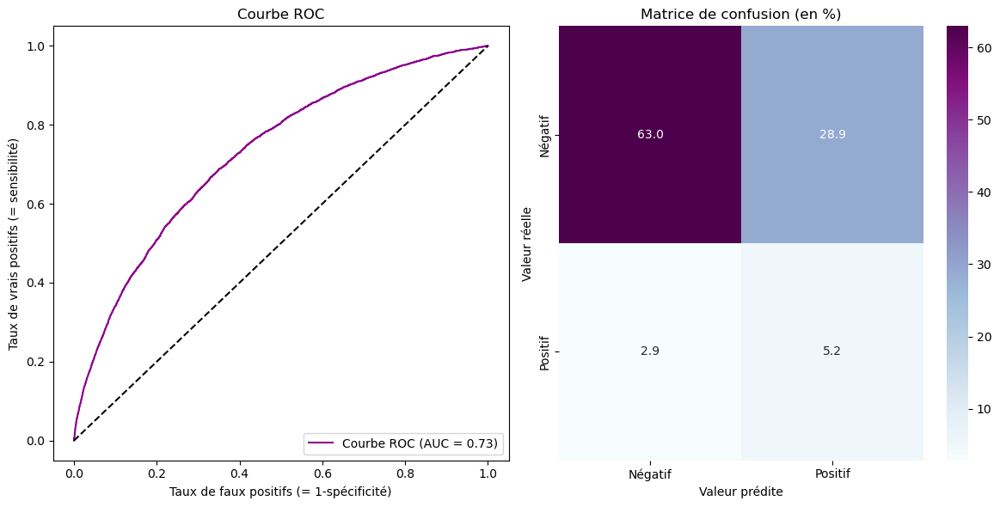

Score : 0.68


In [441]:
cout_fn = -20
cout_fp = -2
cout_tp = 0
cout_tn = 10

tp, fn, score_RUS_smote_LR = roc_conf_score(y_test, y_pred_test_best_RUS_smote_LR, y_pred_prob_test_RUS_smote_LR, cout_fn, cout_fp, cout_tp, cout_tn)

In [442]:
# On va stocker les résultats dans un tableau
results = []

results.append({
    'Modèle': 'Logistic Regression',
    'AUC': AUC_RUS_smote_LR,
    'Accuracy score' : accuracy_RUS_smote_LR,
    'Precision score' : precision_RUS_smote_LR,
    'Recall score' : recall_RUS_smote_LR,
    'F1_score' : f1_RUS_smote_LR,
    'TP' : tp,
    'FN' : fn,
    'Score' : score_RUS_smote_LR,
    'Temps' : total_time_RUS_smote_LR
})

df_results_LR = pd.DataFrame(results)

Registered model 'sk-learn-LR-classifier-RUS-smote' already exists. Creating a new version of this model...
2023/07/12 15:43:19 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: sk-learn-LR-classifier-RUS-smote, version 4
Created version '4' of model 'sk-learn-LR-classifier-RUS-smote'.


Matrice de confusion :
TN =  38519  | FP =  17711
FN =  1744  | TP =  3206


<Figure size 640x480 with 0 Axes>

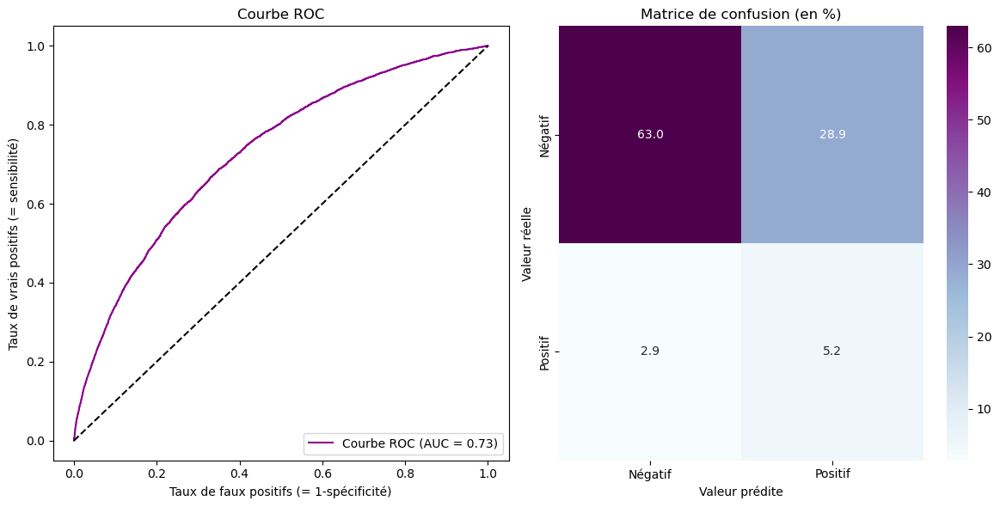

Score : 0.68


In [443]:
# Récupérer l'expérience en fonction de son nom
experiment_name = "Model_RandomUnderSampling_smote"
experiment = mlflow.get_experiment_by_name(experiment_name)
if experiment is None:
    experiment_id = mlflow.create_experiment(experiment_name)
else:
    experiment_id = experiment.experiment_id
    
# Nouvelle exécution MLflow
mlflow.start_run(experiment_id=experiment_id, nested=True)

# Enregistrement modèle
mlflow.sklearn.log_model(
    sk_model=grid_search_RUS_smote_LR.best_estimator_['classifier'],
    artifact_path="sklearn-model",
    registered_model_name="sk-learn-LR-classifier-RUS-smote"
)

# Enregistrement des métriques
mlflow.log_metric("accuracy", accuracy_RUS_smote_LR)
mlflow.log_metric("precision", precision_RUS_smote_LR)
mlflow.log_metric("recall", recall_RUS_smote_LR)
mlflow.log_metric("f1", f1_RUS_smote_LR)
mlflow.log_metric("AUC", AUC_RUS_smote_LR)
mlflow.log_metric("Score", score_RUS_smote_LR)

# Enregistrement des meilleurs hyperparamètres
mlflow.log_params(grid_search_RUS_smote_LR.best_params_)

# Enregistrement de la courbe ROC et la matrice de confusion
fig = plt.figure()
roc_conf_score(y_test, y_pred_test_best_RUS_smote_LR, y_pred_prob_test_RUS_smote_LR, cout_fn, cout_fp, cout_tp, cout_tn)

# Enregistrement de l'image
fig.savefig("roc_confusion_plot_RUS_smote_LR.png")

# Enregistrement de l'image dans MLflow
mlflow.log_artifact("roc_confusion_plot_RUS_smote_LR.png")

# Terminez l'exécution MLflow
mlflow.end_run()

### 2.4.2. Decision Tree Classifier

In [444]:
# On affiche les résultats pour le modèle Decision Tree Classifier
model_RUS_smote_DT = model_RUS_smote(DecisionTreeClassifier, X_train, y_train, X_test, y_test)

Accuracy du modèle (validation): 0.7814808761033017
Precision du modèle (validation): 0.12498886414253897
Recall du modèle (validation): 0.2834343434343434
F1-Score du modèle (validation): 0.1734775888717156
AUC du modèle (validation): 0.5543794516389217
----------


In [511]:
# Hyper-paramètres pour le classifieur Decision Tree
DT_params = {
    'classifier__criterion': ['gini', 'entropy'],
    'classifier__max_depth':  [None, 5, 10, 20],
    'classifier__max_features': range(1, 10),
    'classifier__min_samples_leaf': range(1, 10)
}

y_test, total_time_RUS_smote_DT, accuracy_RUS_smote_DT, precision_RUS_smote_DT, recall_RUS_smote_DT, f1_RUS_smote_DT, AUC_RUS_smote_DT, AUC_train_RUS_smote_DT, y_pred_test_best_RUS_smote_DT, y_pred_prob_test_RUS_smote_DT, grid_search_RUS_smote_DT = model_RUS_smote_opti(DecisionTreeClassifier, X_train, y_train, X_test, y_test, **DT_params)

Temps écoulé : 186.58810186386108 secondes
Meilleurs hyperparamètres : {'classifier__min_samples_leaf': 1, 'classifier__max_features': 9, 'classifier__max_depth': 10, 'classifier__criterion': 'entropy'}
L'accuracy score est de : 0.692056227525335
Le score de précision est de : 0.1430040094582091
Le score recall est de : 0.562020202020202
Le score f1 est de : 0.22799541058842812
Le score AUC est de : 0.6727583014926071
----------
              precision    recall  f1-score   support

           0       0.95      0.70      0.81     56230
           1       0.14      0.56      0.23      4950

    accuracy                           0.69     61180
   macro avg       0.55      0.63      0.52     61180
weighted avg       0.88      0.69      0.76     61180



Matrice de confusion :
TN =  38327  | FP =  17903
FN =  2231  | TP =  2719


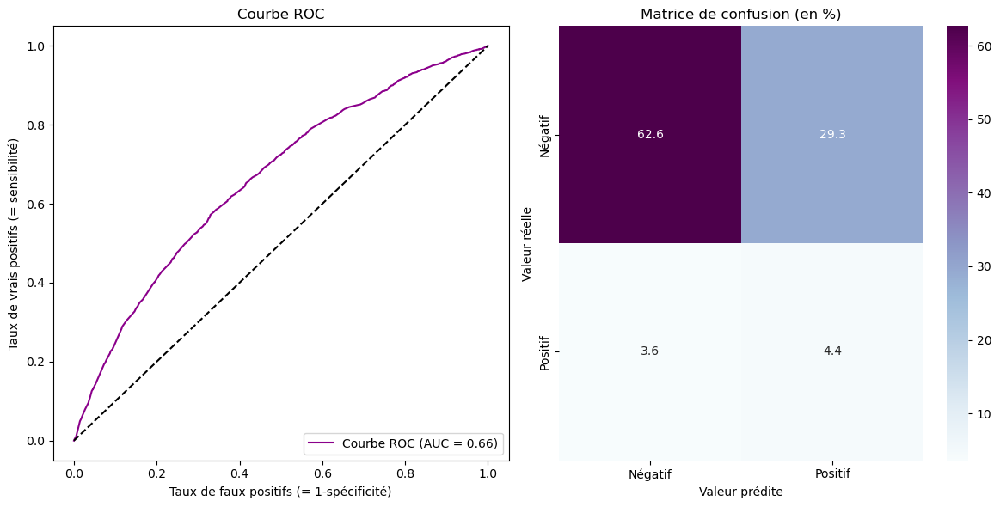

Score : 0.66


In [446]:
cout_fn = -20
cout_fp = -2
cout_tp = 0
cout_tn = 10

tp, fn, score_RUS_smote_DT = roc_conf_score(y_test, y_pred_test_best_RUS_smote_DT, y_pred_prob_test_RUS_smote_DT, cout_fn, cout_fp, cout_tp, cout_tn)

In [447]:
# On va stocker les résultats dans un tableau
results = []

results.append({
    'Modèle': 'Decision Tree Classifier',
    'AUC': AUC_RUS_smote_DT,
    'Accuracy score' : accuracy_RUS_smote_DT,
    'Precision score' : precision_RUS_smote_DT,
    'Recall score' : recall_RUS_smote_DT,
    'F1_score' : f1_RUS_smote_DT,
    'TP' : tp,
    'FN' : fn,
    'Score' : score_RUS_smote_DT,
    'Temps' : total_time_RUS_smote_DT
})

df_results_DT = pd.DataFrame(results)

Registered model 'sk-learn-DT-classifier-RUS-smote' already exists. Creating a new version of this model...
2023/07/12 15:52:09 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: sk-learn-DT-classifier-RUS-smote, version 4
Created version '4' of model 'sk-learn-DT-classifier-RUS-smote'.


Matrice de confusion :
TN =  38327  | FP =  17903
FN =  2231  | TP =  2719


<Figure size 640x480 with 0 Axes>

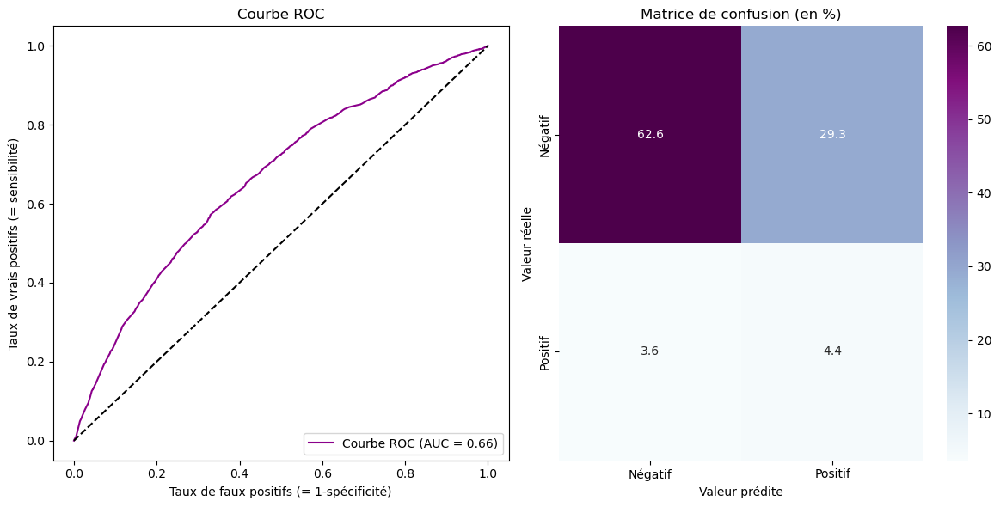

Score : 0.66


In [448]:
# Nouvelle exécution MLflow
mlflow.start_run(experiment_id=experiment_id, nested=True)

# Enregistrement modèle
mlflow.sklearn.log_model(
    sk_model=grid_search_RUS_smote_DT.best_estimator_['classifier'],
    artifact_path="sklearn-model",
    registered_model_name="sk-learn-DT-classifier-RUS-smote"
)

# Enregistrement des métriques
mlflow.log_metric("accuracy", accuracy_RUS_smote_DT)
mlflow.log_metric("precision", precision_RUS_smote_DT)
mlflow.log_metric("recall", recall_RUS_smote_DT)
mlflow.log_metric("f1", f1_RUS_smote_DT)
mlflow.log_metric("AUC", AUC_RUS_smote_DT)
mlflow.log_metric("Score", score_RUS_smote_DT)

# Enregistrement des meilleurs hyperparamètres
mlflow.log_params(grid_search_RUS_smote_DT.best_params_)

# Enregistrement de la courbe ROC et la matrice de confusion
fig = plt.figure()
roc_conf_score(y_test, y_pred_test_best_RUS_smote_DT, y_pred_prob_test_RUS_smote_DT, cout_fn, cout_fp, cout_tp, cout_tn)

# Enregistrement de l'image
fig.savefig("roc_confusion_plot_RUS_smote_DT.png")

# Enregistrement de l'image dans MLflow
mlflow.log_artifact("roc_confusion_plot_RUS_smote_DT.png")

# Terminez l'exécution MLflow
mlflow.end_run()

### 2.4.3. LightGBM

In [449]:
# On affiche les résultats pour le modèle LightGBM
model_RUS_smote_LGBM = model_RUS_smote(LGBMClassifier, X_train, y_train, X_test, y_test)

Accuracy du modèle (validation): 0.8973684210526316
Precision du modèle (validation): 0.2409356725146199
Recall du modèle (validation): 0.12484848484848485
F1-Score du modèle (validation): 0.16447105788423153
AUC du modèle (validation): 0.5451114200874115
----------


In [512]:
# Hyper-paramètres pour le classifieur LightGBM
LGBM_params = {
    'classifier__n_estimators': [100, 500, 1000],
    'classifier__learning_rate': [0.001, 0.01, 0.1],
    'classifier__num_leaves': range(10, 100),
    'classifier__min_child_samples': range(1, 20),
    'classifier__subsample': [0.5, 0.7, 0.9],
    'classifier__colsample_bytree': [0.5, 0.7, 0.9]
}


y_test, total_time_RUS_smote_LGBM, accuracy_RUS_smote_LGBM, precision_RUS_smote_LGBM, recall_RUS_smote_LGBM, f1_RUS_smote_LGBM, AUC_RUS_smote_LGBM, AUC_train_RUS_smote_LGBM, y_pred_test_best_RUS_smote_LGBM, y_pred_prob_test_RUS_smote_LGBM, grid_search_RUS_smote_LGBM = model_RUS_smote_opti(LGBMClassifier, X_train, y_train, X_test, y_test, **LGBM_params)

Temps écoulé : 425.2160885334015 secondes
Meilleurs hyperparamètres : {'classifier__subsample': 0.7, 'classifier__num_leaves': 96, 'classifier__n_estimators': 500, 'classifier__min_child_samples': 16, 'classifier__learning_rate': 0.1, 'classifier__colsample_bytree': 0.5}
L'accuracy score est de : 0.9109839816933638
Le score de précision est de : 0.28169014084507044
Le score recall est de : 0.06464646464646465
Le score f1 est de : 0.10515938218862964
Le score AUC est de : 0.7204089265408846
----------
              precision    recall  f1-score   support

           0       0.92      0.99      0.95     56230
           1       0.28      0.06      0.11      4950

    accuracy                           0.91     61180
   macro avg       0.60      0.53      0.53     61180
weighted avg       0.87      0.91      0.88     61180



Matrice de confusion :
TN =  55402  | FP =  828
FN =  4623  | TP =  327


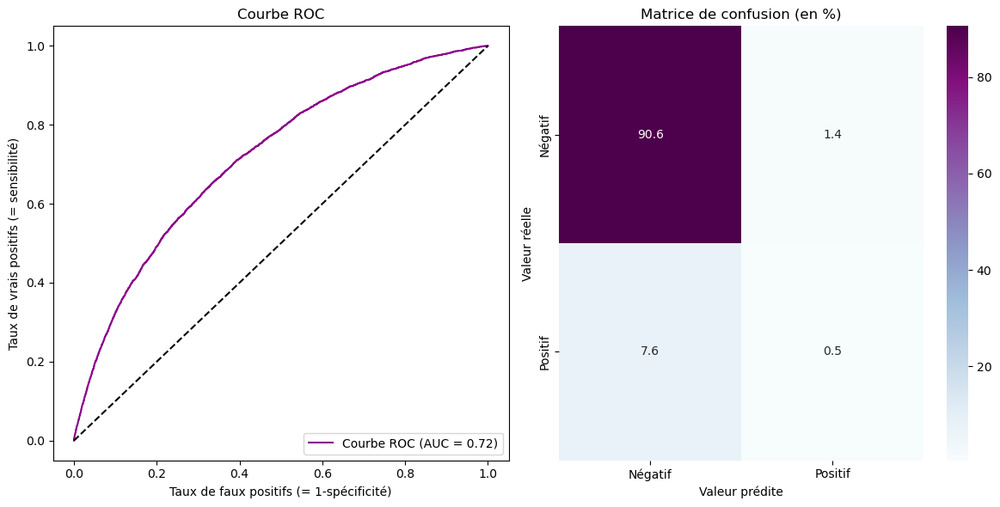

Score : 0.87


In [451]:
cout_fn = -20
cout_fp = -2
cout_tp = 0
cout_tn = 10

tp, fn, score_RUS_smote_LGBM = roc_conf_score(y_test, y_pred_test_best_RUS_smote_LGBM, y_pred_prob_test_RUS_smote_LGBM, cout_fn, cout_fp, cout_tp, cout_tn)

In [452]:
# On va stocker les résultats dans un tableau
results = []

results.append({
    'Modèle': 'LightGBM',
    'AUC': AUC_RUS_smote_LGBM,
    'Accuracy score' : accuracy_RUS_smote_LGBM,
    'Precision score' : precision_RUS_smote_LGBM,
    'Recall score' : recall_RUS_smote_LGBM,
    'F1_score' : f1_RUS_smote_LGBM,
    'TP' : tp,
    'FN' : fn,
    'Score' : score_RUS_smote_LGBM,
    'Temps' : total_time_RUS_smote_LGBM
})

df_results_LGBM = pd.DataFrame(results)

Registered model 'sk-learn-LGBM-classifier-RUS-smote' already exists. Creating a new version of this model...
2023/07/12 16:50:05 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation. Model name: sk-learn-LGBM-classifier-RUS-smote, version 4
Created version '4' of model 'sk-learn-LGBM-classifier-RUS-smote'.


Matrice de confusion :
TN =  55402  | FP =  828
FN =  4623  | TP =  327


<Figure size 640x480 with 0 Axes>

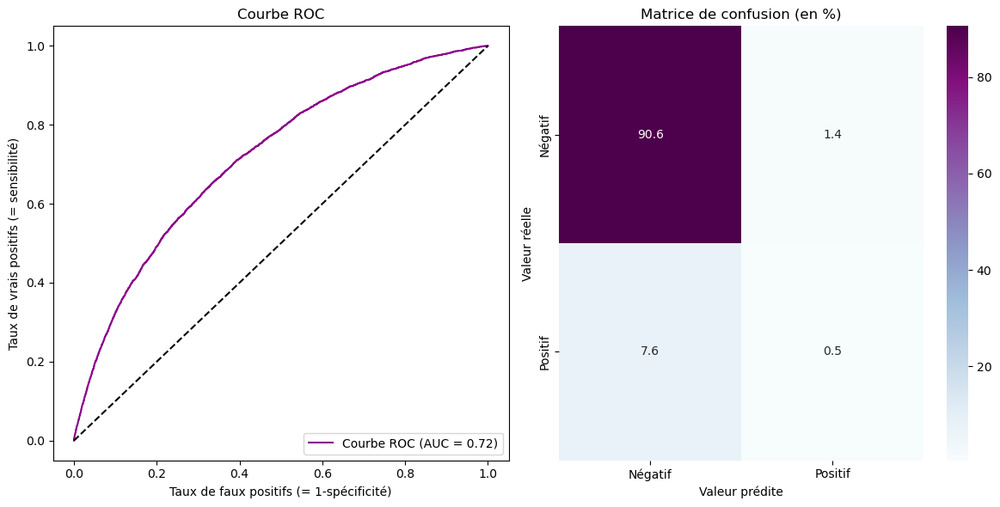

Score : 0.87


In [453]:
# Nouvelle exécution MLflow
mlflow.start_run(experiment_id=experiment_id, nested=True)

# Enregistrement modèle
mlflow.sklearn.log_model(
    sk_model=grid_search_RUS_smote_LGBM.best_estimator_['classifier'],
    artifact_path="sklearn-model",
    registered_model_name="sk-learn-LGBM-classifier-RUS-smote"
)

# Enregistrement des métriques
mlflow.log_metric("accuracy", accuracy_RUS_smote_LGBM)
mlflow.log_metric("precision", precision_RUS_smote_LGBM)
mlflow.log_metric("recall", recall_RUS_smote_LGBM)
mlflow.log_metric("f1", f1_RUS_smote_LGBM)
mlflow.log_metric("AUC", AUC_RUS_smote_LGBM)
mlflow.log_metric("Score", score_RUS_smote_LGBM)

# Enregistrement des meilleurs hyperparamètres
mlflow.log_params(grid_search_RUS_smote_LGBM.best_params_)

# Enregistrement de la courbe ROC et la matrice de confusion
fig = plt.figure()
roc_conf_score(y_test, y_pred_test_best_RUS_smote_LGBM, y_pred_prob_test_RUS_smote_LGBM, cout_fn, cout_fp, cout_tp, cout_tn)

# Enregistrement de l'image
fig.savefig("roc_confusion_plot_RUS_smote_LGBM.png")

# Enregistrement de l'image dans MLflow
mlflow.log_artifact("roc_confusion_plot_RUS_smote_LGBM.png")

# Terminez l'exécution MLflow
mlflow.end_run()

### 2.4.4. Comparaison des résultats

In [454]:
# On concatène nos résultats

results_models_RUS = pd.concat([df_results_LR, df_results_DT, df_results_LGBM])
results_models_RUS

,Modèle,AUC,Accuracy score,Precision score,Recall score,F1_score,TP,FN,Score,Temps
0,Logistic Regression,0.728436,0.682004,0.153272,0.647677,0.247883,3206,1744,0.68,69.263529
0,Decision Tree Classifier,0.662422,0.670906,0.131849,0.549293,0.212654,2719,2231,0.66,471.489388
0,LightGBM,0.717583,0.910902,0.283117,0.066061,0.107125,327,4623,0.87,3453.869172


Après avoir combiné SMOTE et RandomUnderSampling pour la gestion du déséquilibre, on observe que les meilleurs scores sont obtenus pour **Logistic Regression**, on va donc conserver ce modèle comme modèle optimal.

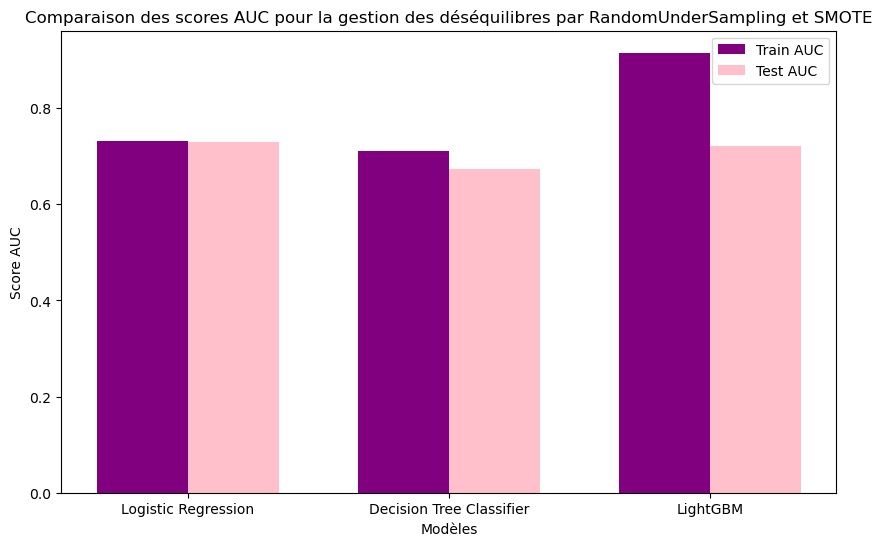

In [515]:
# Liste des scores AUC des données d'entraînement pour chaque modèle
auc_train_scores_RUS_smote = [AUC_train_RUS_smote_LR, AUC_train_RUS_smote_DT, AUC_train_RUS_smote_LGBM]

# Liste des scores AUC des données de test pour chaque modèle
auc_test_scores_RUS_smote = [AUC_RUS_smote_LR, AUC_RUS_smote_DT, AUC_RUS_smote_LGBM]

# Modèles
models = ['Logistic Regression', 'Decision Tree Classifier', 'LightGBM']

# Largeur des barres
bar_width = 0.35

# Positions des barres
train_bar_positions = np.arange(len(models))
test_bar_positions = train_bar_positions + bar_width

# Création de la figure
fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(train_bar_positions, auc_train_scores_RUS_smote, width=bar_width, label='Train AUC', color='purple')
ax.bar(test_bar_positions, auc_test_scores_RUS_smote, width=bar_width, label='Test AUC', color='pink')
ax.legend()
ax.set_xlabel('Modèles')
ax.set_ylabel('Score AUC')
ax.set_title('Comparaison des scores AUC pour la gestion des déséquilibres par RandomUnderSampling et SMOTE')
ax.set_xticks(train_bar_positions + bar_width / 2)
ax.set_xticklabels(models)
plt.show()

In [455]:
# On enregistre notre modèle dans une variable
df_results_LR_RUS_smote = df_results_LR.copy()

In [456]:
# On modifie le nom du modèle
df_results_LR_RUS_smote.loc[0, 'Modèle'] = 'Logistic Regression (SMOTE + RUS)'

## 2.5. Comparaison des modèles

In [457]:
df_results_final = pd.concat([df_results_LR_RUS_smote, df_results_LGBM_RUS, df_results_LGBM_CW, df_results_LR_smote])

In [458]:
df_results_final

,Modèle,AUC,Accuracy score,Precision score,Recall score,F1_score,TP,FN,Score,Temps
0,Logistic Regression (SMOTE + RUS),0.728436,0.682004,0.153272,0.647677,0.247883,3206,1744,0.68,69.263529
0,LightGBM (RUS),0.752286,0.694067,0.163184,0.673737,0.262733,3335,1615,0.69,128.906979
0,LightGBM (CW),0.752567,0.706669,0.167077,0.658788,0.266552,3261,1689,0.70,252.506408
0,Logistic Regression (SMOTE),0.728461,0.682086,0.153541,0.649091,0.248338,3213,1737,0.68,47.889681


Si nous comparons entre eux les différents modèles, voici les résultats obtenus : 
- Meilleur score **AUC** obtenu par **LightGBM** avec les méthodes RandomUnderSampling et class_weight='balanced'. 
- Meilleur **Accuracy score** obtenu par **LightGBM** avec la méthode **class_weight='balanced'** (0.72).
- Meilleur **score de précision** obtenu pour **LightGBM** avec la méthode **class_weight='balanced'** (0.18).
- Meilleur **recall score** obtenu par **LightGBM** avec la méthode **RandomUnderSampling** (0.68).
- Meilleur **F1_score** obtenu par **LightGBM** avec la méthode **class_weight='balanced'** (0.28).
- **Maximisation des vrais positifs** pour **LightGBM** avec la méthode **RandomUnderSampling**. 
- **Minimisation des faux négatifs** avec **LightGBM** pour la méthode **RandomUnderSampling**. 
- Le meilleur **score métier** a été obtenu avec le modèle **LightGBM** pour les méthodes **class_weight='balanced'** (0.72).

<u>Choix du modèle</u>:
Etant donné les résultats obtenus (AUC élevé, Recall score maximisé) et que nous souhaitons minimiser les faux négatifs et maximiser la sensibilité, nous allons choisir le modèle optimal <u>**LightGBM (RandomUnderSampling)**</u>. 

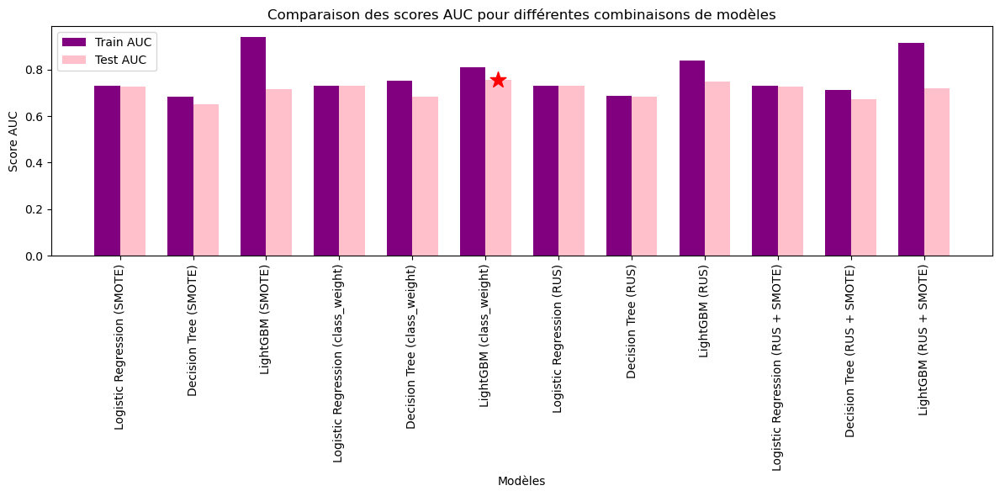

In [526]:
# Modèles et combinaisons
models = ['Logistic Regression', 'Decision Tree', 'LightGBM']
combinations = ['SMOTE', 'class_weight', 'RUS', 'RUS + SMOTE']

# Scores AUC des données d'entraînement
auc_train_scores = [AUC_train_smote_LR, AUC_train_smote_DT, AUC_train_smote_LGBM,
                    AUC_train_CW_LR, AUC_train_CW_DT, AUC_train_CW_LGBM,
                    AUC_train_RUS_LR, AUC_train_RUS_DT, AUC_train_RUS_LGBM,
                    AUC_train_RUS_smote_LR, AUC_train_RUS_smote_DT, AUC_train_RUS_smote_LGBM]
# Scores AUC des données de test
auc_test_scores = [AUC_smote_LR, AUC_smote_DT, AUC_smote_LGBM,
                   AUC_CW_LR, AUC_CW_DT, AUC_CW_LGBM,
                   AUC_RUS_LR, AUC_RUS_DT, AUC_RUS_LGBM,
                   AUC_RUS_smote_LR, AUC_RUS_smote_DT, AUC_RUS_smote_LGBM]

# Création de la figure
fig, ax = plt.subplots(figsize=(12, 6))

# Largeur des barres
bar_width = 0.35
bar_positions = np.arange(len(models) * len(combinations))

ax.bar(bar_positions, auc_train_scores, width=bar_width, label='Train AUC', color='purple')
ax.bar(bar_positions + bar_width, auc_test_scores, width=bar_width, label='Test AUC', color='pink')
ax.set_xticks(bar_positions + bar_width / 2)
ax.set_xticklabels([f'{model} ({combination})' for combination in combinations for model in models], rotation=90)

# Trouver la position et la valeur maximale des données de test
max_test_index = np.argmax(auc_test_scores)
max_test_value = auc_test_scores[max_test_index]

# Tracé de l'étoile à l'emplacement de la valeur maximale des données de test
ax.scatter(max_test_index + bar_width, max_test_value, marker='*', color='red', s=200, zorder=10)

ax.legend()
ax.set_xlabel('Modèles')
ax.set_ylabel('Score AUC')
ax.set_title('Comparaison des scores AUC pour différentes combinaisons de modèles')
plt.tight_layout()
plt.show()


# 3. Choix du seuil optimal de probabilité

Une fois le modèle optimal sélectionné, nous allons trouver le <u>**seuil optimal**</u> permettant l'appartenance à la classe positive (> seuil = <u>ne va pas rembourser le prêt</u>) ou négative (< seuil = <u>va rembourser le prêt</u>). Par défaut, le seuil est fixé à 0.5. Mais, nous allons chercher à trouver le seuil optimal de probabilité en évaluant différentes valeurs de seuil et analyser leur impact sur nos métriques de performance. 

L'idée de l'optimisation du seuil est de minimiser les faux négatifs et maximiser les faux positifs, donc l'ajustement du seuil permettrait de classer plus d'échantillons comme positifs. 

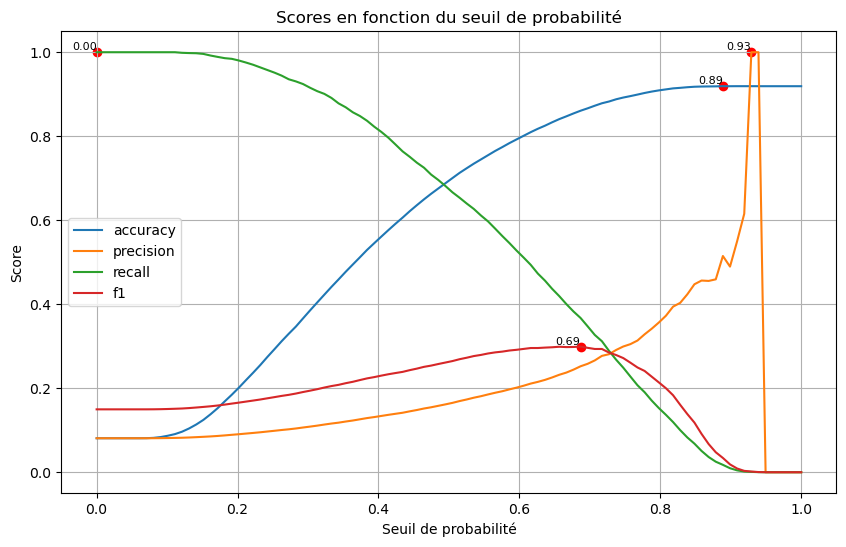

In [459]:
# Métriques et seuils
metrics = ['accuracy', 'precision', 'recall', 'f1']
thresholds = np.linspace(0, 1, 100)

# Initialisation des résultats
optimal_thresholds = {}
scores = {}

# Calcul des scores et seuils optimaux pour chaque métrique
for metric in metrics:
    metric_scores = []
    for threshold in thresholds:
        y_pred = (y_pred_prob_test_RUS_LGBM >= threshold).astype(int)
        if metric == 'accuracy':
            score = accuracy_score(y_test, y_pred)
        elif metric == 'precision':
            score = precision_score(y_test, y_pred)
        elif metric == 'recall':
            score = recall_score(y_test, y_pred)
        elif metric == 'f1':
            score = f1_score(y_test, y_pred)
        metric_scores.append(score)
    metric_scores = np.array(metric_scores)
    optimal_threshold = thresholds[np.argmax(metric_scores)]
    optimal_thresholds[metric] = optimal_threshold
    scores[metric] = metric_scores

# Tracé des courbes pour chaque métrique
plt.figure(figsize=(10, 6))
for metric in metrics:
    plt.plot(thresholds, scores[metric], label=metric)
    plt.scatter(optimal_thresholds[metric], np.max(scores[metric]), marker='o', color='r')
    plt.text(optimal_thresholds[metric], np.max(scores[metric]), f"{optimal_thresholds[metric]:.2f}", ha='right', va='bottom', fontsize=8)
plt.xlabel('Seuil de probabilité')
plt.ylabel('Score')
plt.title('Scores en fonction du seuil de probabilité')
plt.legend()
plt.grid(True)
plt.show()


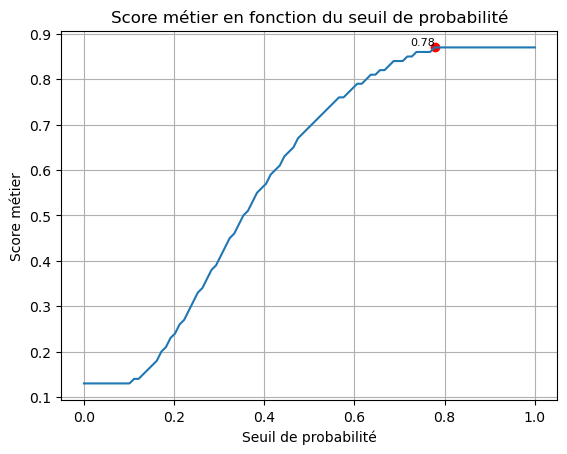

In [460]:
cout_fn = -20
cout_fp = -2
cout_tp = 0
cout_tn = 10

# Définition des valeurs de seuil
thresholds = np.linspace(0, 1, 100)

# Initialisation des listes pour stocker les scores et seuils
scores = []
threshold_values = []

# Calcul du score métier pour chaque seuil
for threshold in thresholds:
    y_pred = (y_pred_prob_test_RUS_LGBM >= threshold).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    
    cout_total = fn * cout_fn + fp * cout_fp + tp * cout_tp + tn * cout_tn
    gain_max = (tn + fp) * cout_tn + (tp + fn) * cout_tp
    gain_min = (tn + fp) * cout_fp + (tp + fn) * cout_fn
    score_norm = round((cout_total - gain_min) / (gain_max - gain_min), 2)
    
    scores.append(score_norm)
    threshold_values.append(threshold)

# Trouver l'index et la valeur maximale du score métier
max_score_index = np.argmax(scores)
max_score = scores[max_score_index]
optimal_threshold = threshold_values[max_score_index]

# Tracé de la courbe du score métier
plt.plot(threshold_values, scores)
plt.scatter(optimal_threshold, max_score, marker='o', color='r')
plt.text(optimal_threshold, max_score, f"{optimal_threshold:.2f}", ha='right', va='bottom', fontsize=8)
plt.xlabel('Seuil de probabilité')
plt.ylabel('Score métier')
plt.title('Score métier en fonction du seuil de probabilité')
plt.grid(True)
plt.show()


Dans un premier temps, nous avons affiché les valeurs de seuil (comprises entre 0 et 1) pour chaque métrique ainsi que la valeur de seuil optimal respective.

On peut noter que les courbes d'accuracy et de recall score se coupent au seuil de 0.5 avec une augmentation proportionnelle à l'augmentation du seuil pour l'accuracy score et l'inverse est observé pour le recall score. Concernant f1 score, on observe une légère augmentation de sa valeur jusq'à atteindre une valeur maximale pour un seuil de 0.68. Enfin, concernant le score de précision, on observe une très forte augmentation jusqu'à atteindre un seuil de 0.93, puis une chute totale. Le score métier atteint sa valeur maximale pour un seuil de 0.84. 

Afin de trouver le seuil optimal, l'idée est de trouver comment éviter les faux positifs et les faux négatifs. L'**indice J de Youden** pour nous aider à effectuer cela. Celui-ci combine la sensibilité (taux de vrais positifs) et la spécificité (taux de vrais négatifs) pour évaluer les performances du modèle.

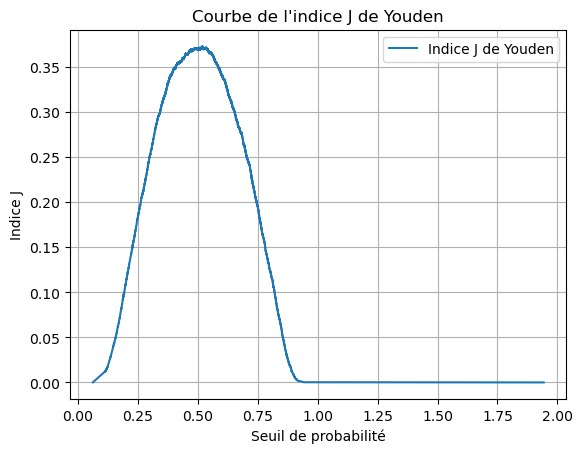

Seuil optimal : 0.5179733860072799
----------
L'accuracy score avec le seuil optimal est de : 0.7161327231121282
Le score de précision avec le seuil optimal est de : 0.17082869413074597
Le score recall avec le seuil optimal est de : 0.6509090909090909
Le score f1 avec le seuil optimal est de : 0.2706312208643064
Le score AUC avec le seuil optimal est de : 0.7522859108603372
Matrice de confusion :
TN =  40591  | FP =  15639
FN =  1728  | TP =  3222


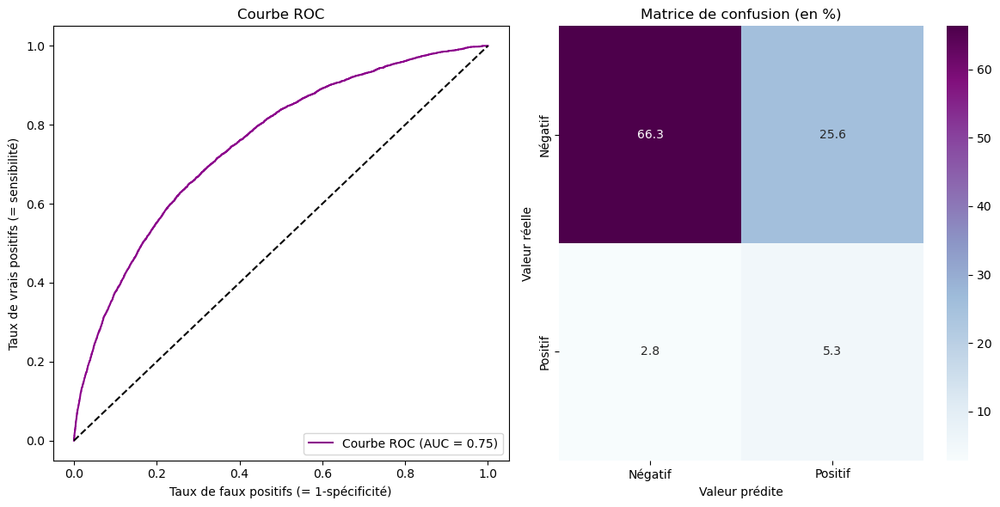

Score : 0.71


(3222, 1728, 0.71)

In [461]:
# Calcul de la courbe ROC
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob_test_RUS_LGBM)

# Calcul de l'indice J de Youden pour chaque seuil
j_scores = tpr + (1 - fpr) - 1

# Affichage de la courbe de comparaison
plt.plot(thresholds, j_scores, label='Indice J de Youden')
plt.xlabel('Seuil de probabilité')
plt.ylabel('Indice J')
plt.title('Courbe de l\'indice J de Youden')
plt.legend(loc='upper right')
plt.grid()
plt.show()

# Trouver l'indice du seuil optimal qui minimise le FNR et maximise le TPR
optimal_threshold_index = np.argmax(j_scores)

# Seuil optimal
optimal_threshold = thresholds[optimal_threshold_index]

# Prédiction des classes avec le seuil optimal
y_pred_optimal = (y_pred_prob_test_RUS_LGBM >= optimal_threshold).astype(int)

# Calcul des métriques de qualité de la classification avec le seuil optimal
accuracy_optimal = accuracy_score(y_test, y_pred_optimal)
precision_optimal = precision_score(y_test, y_pred_optimal)
recall_optimal = recall_score(y_test, y_pred_optimal)
f1_optimal = f1_score(y_test, y_pred_optimal)
AUC_optimal = roc_auc_score(y_test, y_pred_prob_test_RUS_LGBM)

# Affichage des résultats avec le seuil optimal
print("Seuil optimal :", optimal_threshold)
print('-'*10)
print("L'accuracy score avec le seuil optimal est de :", accuracy_optimal)
print("Le score de précision avec le seuil optimal est de :", precision_optimal)
print("Le score recall avec le seuil optimal est de :", recall_optimal)
print("Le score f1 avec le seuil optimal est de :", f1_optimal)
print("Le score AUC avec le seuil optimal est de :", AUC_optimal)

# Affichage de la matrice de confusion et du score avec le seuil optimal
roc_conf_score(y_test, y_pred_optimal, y_pred_prob_test_RUS_LGBM, cout_fn, cout_fp, cout_tp, cout_tn)

En choisissant le seuil de **0.52**, on observe quelques changements, notamment une augmentation du taux de vrais négatifs et une diminution du taux de faux positifs et de vrais positifs. Le souci est que le taux de vrais négatifs a augmenté légèrement.

Néanmoins, notre score métier a augmenté, ainsi que l'accuracy score, le score de précision et le score f1. Le score recall a néanmoins diminué.

Globalement, notre nouveau seuil a permis de réduire les faux positifs en augmentant les vrais négatifs. Mais cela a entrainé une légère augmentation du nombre de prédictions correctes négatives. Mais, les changements montrent que le modèle fournit de meilleures prédictions parmi les prédictions effectuée. Il a également été capable de prédire de façon plus précide les clients positifs. Néanmoins, Le taux de vrais positifs a été légèrement diminué. Mais, le f1 score combinant la précision et le rappel montre globalement une performance améliorée du modèle. Enfin, la valeur du score métier amléiorée montre une amélioration du gain pour l'entreprise et c'est ce que l'on souhaite.

# 4. Feature importance globale et locale (SHAP)

Pour l'analyse de la feature importance, nous choisissons d'utiliser **SHAP** (SHapley Additive exPlanation). C'est une mesure permettant de déterminer l'importance de chaque feature pour une prédiction. Elle mesure la différence de prédiction lorsqu'une feature est ajoutée ou retirée.

Dans notre cas, nous reprenons notre modèle LightGBM qui est un algorithme de Machine Learning utilisant le Gradient Boosting (technique d'apprentissage automatique) se basant sur des arbres de décision. On va donc utiliser **TreeExplainer** pour l'analyse SHAP.  

In [462]:
!pip install shap

In [463]:
import shap

In [467]:
# On importe nos csv enregistrés
application_clean_sample = pd.read_csv('application_clean.csv', sep=';')
df_filtered_sample = pd.read_csv('df_filtered_P7.csv', sep=';')

# On ne garde qu'un échantillon de clients (100)
application_clean_sample = application_clean_sample.sample(n=100, random_state=42)
df_filtered_sample = df_filtered_sample[df_filtered_sample['SK_ID_CURR'].isin(application_clean_sample['SK_ID_CURR'])]

# On enregistre nos deux df
application_clean_sample.to_csv('application_clean_sample.csv', sep=';', index=False, index_label=False)
df_filtered_sample.to_csv('df_filtered_sample.csv', sep=';', index=False, index_label=False)

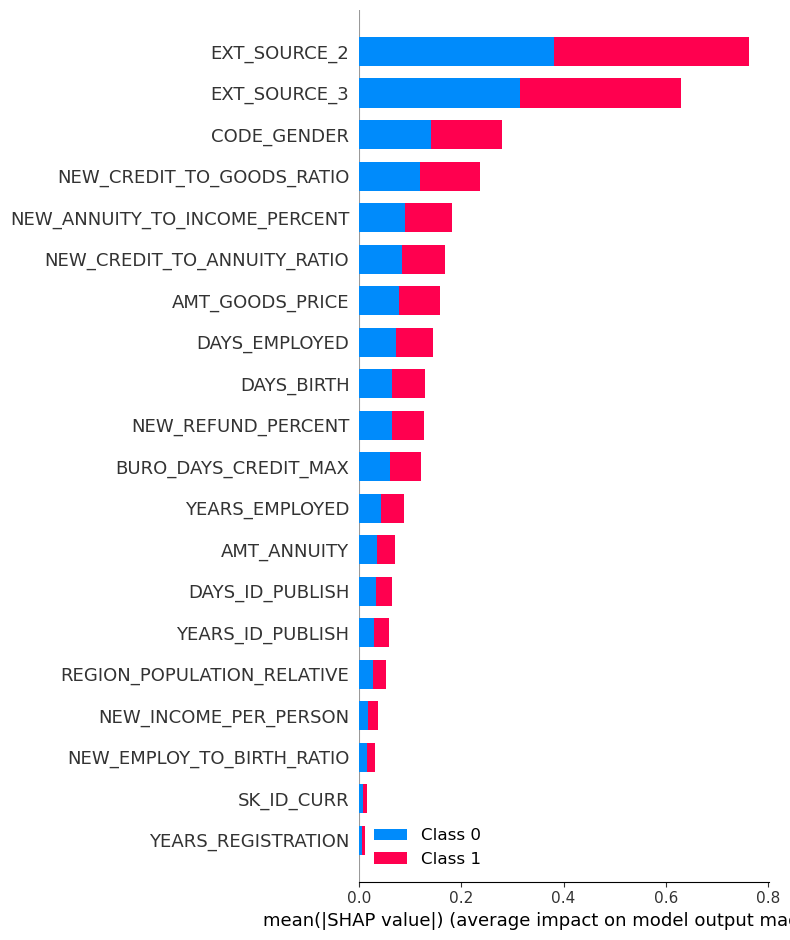

In [468]:
# Obtention des données de test mises à l'échelle
data_shap = data.drop('TARGET', axis=1)
data_shap_sample = data_shap[data_shap['SK_ID_CURR'].isin(application_clean_sample['SK_ID_CURR'])]
data_shap_scaled_sample = grid_search_RUS_LGBM.best_estimator_['scaler'].transform(data_shap_sample)

# Initialisation de l'environnement SHAP
shap.initjs()

# Analyse SHAP sur les données de test mises à l'échelle
explainer = shap.TreeExplainer(grid_search_RUS_LGBM.best_estimator_['classifier'])
shap_values_sample = explainer.shap_values(data_shap_scaled_sample)

# Visualisation des résultats de l'analyse SHAP
shap.summary_plot(shap_values_sample, data_shap_scaled_sample, feature_names=data_shap_sample.columns, plot_type="bar")

La variable **shap_values** est constitué d'une liste de 2 arrays. La première comportant les valeurs de shap pour la classe 0 (négatif) et donc mesure l'impact de chaque feature sur la probabilité d'appartenir à la classe négative. La deuxième correspond aux valeurs de shap pour la classe 1 (positive) et donc mesure l'impact de chaque feature sur la probabilité d'appartenir à la classe positive. L'importance des features est calculée en **moyennant la valeur absolue des valeurs de shap** (shap_values) de chaque feature et pour tous les clients (**global**).

Nous avons affiché les premières features par ordre d'importance dans les prédictions du modèle et les classes correspondantes. 

Nous allons maintenant afficher **localement** en sélectionnant un client pour les valeurs de shap pour la classe positive (shap_values[1]).

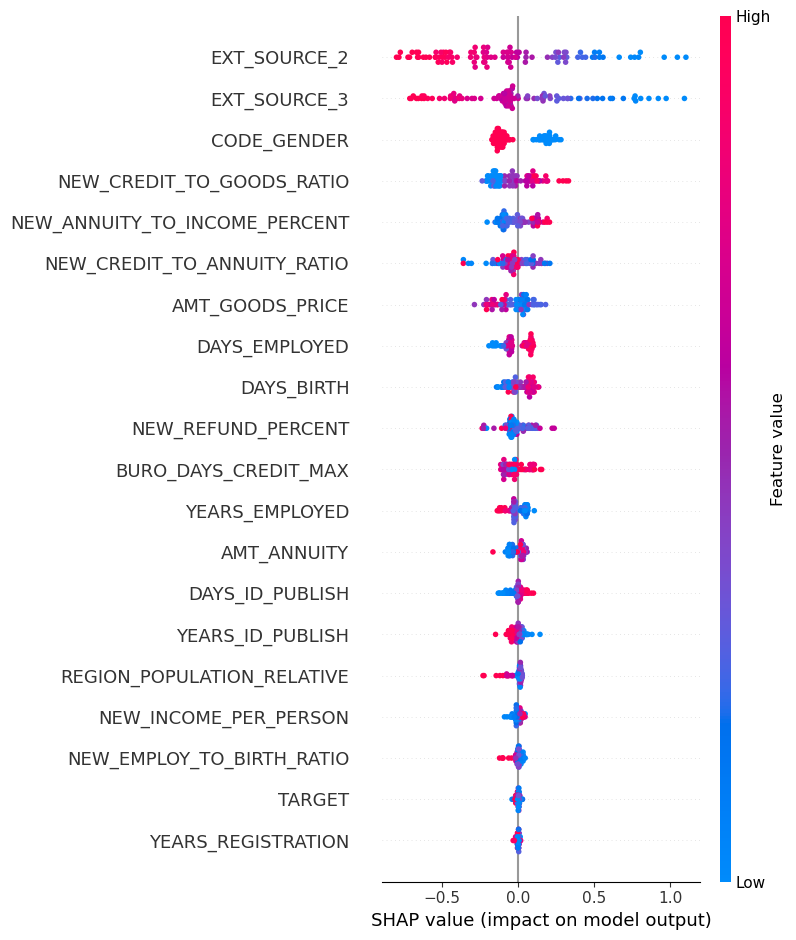

In [527]:
# On affiche le summary_plot uniquement pour la classe positive (prêt non accordé)
shap.summary_plot(shap_values_sample[1], data_shap_scaled_sample, feature_names=data.columns)

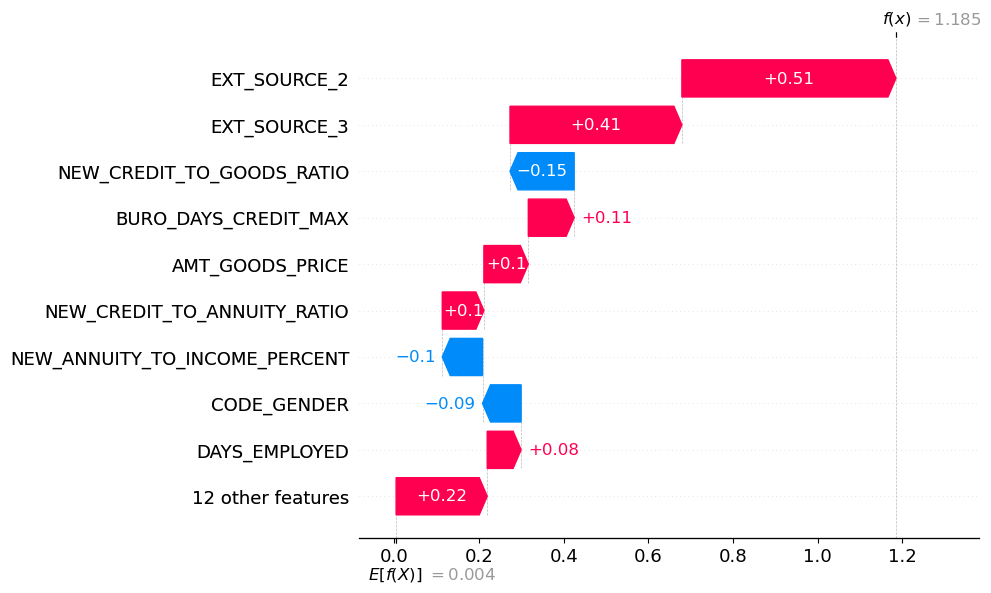

In [531]:
explanation_client_sample = shap.Explanation(values=shap_values_sample[1][0], base_values=explainer.expected_value[1], feature_names=data_shap_sample.columns)
shap.plots.waterfall(explanation_client_sample)

In [470]:
# On enregistre notre modèle sélectionné au format pickle
import pickle
import gzip

# Créez un dictionnaire pour stocker les informations du modèle
modele_save = {
    'y_train': y_train,
    'y_test': y_test,
    'X_train': X_train,
    'X_test': X_test,
    'y_pred_prob_test': y_pred_prob_test_RUS_LGBM,
    'y_pred_prob_train': y_pred_prob_train_RUS_LGBM,
    'trained_model': grid_search_RUS_LGBM
}

# Enregistrez le modèle au format pickle
with gzip.open('modele_optimal.pickle.gz', 'wb') as file:
    pickle.dump(modele_save, file)

In [472]:
# On enregistre nos valeurs de shap échantillonnées au format pickle

shap_save_sample = {
    'data_shap': data_shap_sample,
    'explainer': explainer,
    'shap_values': shap_values_sample,
    'shap_scaled': data_shap_scaled_sample,
}

with open('shap_values_sample.pickle', 'wb') as file:
    pickle.dump(shap_save_sample, file)